# To Do
* find ideal number of topics
* map that topics to the original dataset
* graphs 


In [716]:
import pandas as pd
import ast
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
from nltk.stem import WordNetLemmatizer, SnowballStemmer
import matplotlib.pyplot as plt
from nltk.stem.porter import *
import numpy as np
import nltk
np.random.seed(2018)
nltk.download('wordnet')

MORE_STOP_WORDS = frozenset({'https','satire', 'clear', 'real', 'post', 'tweets','posted', 'posting','take','claim','claiming','claimed', 'inform', 'better', 'live','informing', 'informed','like', 'quote', 'note', 'article', 'news', 'html', 'faq', 'quoting', 'quotation', 'need', 'quot', 'quoted', 'quoting', 'claim', 'fact', 'check', 'context', 'factcheck', 'claimed', 'claiming', 'false', 'content', 'actual', 'include', 'including', 'say', 'change', 'know', 'knowing', 'source', 'sourced', 'sourcing', 'opinion', 'misleading', 'cause', 'question', 'media', 'give', 'require', 'sourc', 'question', 'effect', 'tweet', 'photo', 'evidence', 'image', 'twitter', 'status', 'account', 'effects', 'say', 'says','factual', 'true', 'author', 'user', 'tweeted', 'faq ', 'wikipedia', 'wiki', 'video', 'say', 'report', 'posting', 'post', 'origin', 'report', 'cause', 'causing', 'claim', 'post', 'link', 'fake', 'statement', 'data', 'group', 'state', 'social', 'inform'})




[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/NiharikaBhaskar/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [784]:
df2.head()

,data,cn_noteId,cn_noteAuthorParticipantId,cn_createdAtMillis,cn_tweetId,cn_classification,cn_believable,cn_harmful,cn_validationDifficulty,cn_misleadingOther,...,cn_misleadingSatire,cn_notMisleadingOther,cn_notMisleadingFactuallyCorrect,cn_notMisleadingOutdatedButNotWhenWritten,cn_notMisleadingClearlySatire,cn_notMisleadingPersonalOpinion,cn_trustworthySources,cn_summary,errors,tweet_text
0,"{'id': '1377030478167937024', 'lang': 'en', 'c...",1537142913737428992,E786F29F77E52D959A2604701A9A4F491B0BA83687E515...,1655318404027,1377030478167937024,MISINFORMED_OR_POTENTIALLY_MISLEADING,BELIEVABLE_BY_MANY,CONSIDERABLE_HARM,EASY,0,...,0,0,0,0,0,0,1,Forbes has a good rundown of the investigation...,NaN,...and my father has even been wearing a wire ...
1,"{'conversation_id': '1536848327979016193', 'cr...",1537145358521839617,E786F29F77E52D959A2604701A9A4F491B0BA83687E515...,1655318986910,1536848327979016193,NOT_MISLEADING,,,,0,...,0,0,0,0,1,1,0,They are expressing a personal opinion in a st...,NaN,people who choose to communicate and fix thing...
2,"{'public_metrics': {'retweet_count': 3427, 're...",1537147343715282945,E786F29F77E52D959A2604701A9A4F491B0BA83687E515...,1655319460217,1537080831751102467,MISINFORMED_OR_POTENTIALLY_MISLEADING,BELIEVABLE_BY_MANY,LITTLE_HARM,EASY,0,...,0,0,0,0,0,0,1,Teslas purchased after 12/31/19 are not eligib...,NaN,@teslaownersSV Buyers of competing electric ca...
3,{'edit_history_tweet_ids': ['15371961689539747...,1537204430730211328,E786F29F77E52D959A2604701A9A4F491B0BA83687E515...,1655333070821,1537196168953974784,MISINFORMED_OR_POTENTIALLY_MISLEADING,BELIEVABLE_BY_MANY,CONSIDERABLE_HARM,EASY,0,...,0,0,0,0,0,0,1,The Jan 6th riots were encouraged by the sitti...,NaN,@shaneyyricch @ElijahSchaffer https://t.co/iAD...
4,"{'created_at': '2022-06-23T21:40:39.000Z', 'ed...",1540422295029551104,E786F29F77E52D959A2604701A9A4F491B0BA83687E515...,1656100269455,1540087463099736065,MISINFORMED_OR_POTENTIALLY_MISLEADING,BELIEVABLE_BY_MANY,CONSIDERABLE_HARM,EASY,0,...,0,0,0,0,0,0,1,The Committee has been found by numerous court...,NaN,The January 6 Committee is an unconstitutional...


In [785]:
# load into dataframe
all_tweet = []
with open('all_tweet_data.json', 'rt') as f:
    for line in f:
        all_tweet.append(ast.literal_eval(line))
df2 = pd.DataFrame(all_tweet)

In [786]:
df2['data'][0]["text"]

'...and my father has even been wearing a wire at the FBI’s direction to catch these criminals. The planted leak to the FBI tonight was intended to thwart that investigation.\n\nNo part of the allegations against me are true, and the people pushing these lies are targets...'

In [768]:
df2['data'] = df2['data'].to_dict()

In [771]:
df2['data']

0            0
1            1
2            2
3            3
4            4
         ...  
47916    47916
47917    47917
47918    47918
47919    47919
47920    47920
Name: data, Length: 47921, dtype: int64

In [779]:
# Extract 'text' key from dictionary
# df2['tweet_text'] = df2['data'].apply(lambda x: x['text'] if 'text' in x else None)
df2['tweet_text'] = df2['data'].apply(lambda x: x['text'] if isinstance(x, dict) and 'text' in x else None)

In [783]:
df2.to_csv("all_tweets_with_text.csv", index=False)

In [621]:
# get relevant columns
tweets = df2[['cn_summary','cn_tweetId','cn_classification', 'cn_harmful']]
tweets['index'] = tweets.index

/var/folders/yq/hk50b_d51pq3f36jlcgmf_fw0000gn/T/ipykernel_40151/1031051909.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets['index'] = tweets.index


In [622]:
from nltk.stem import SnowballStemmer
stemmer = SnowballStemmer("english")

In [623]:
# Helper methods for processing date
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v'))

def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        
        if token not in gensim.parsing.preprocessing.STOPWORDS and token not in MORE_STOP_WORDS:
            if len(token) > 3 and not re.match(r'^https?:\/\/.*[\r\n]*', token):
                result.append(lemmatize_stemming(token))
    return result

In [624]:
# Check that processing works
doc_sample = tweets[tweets['index'] == 4310].values[0][0]
print('original document: ')

words = []
for word in doc_sample.split(' '):
    words.append(word)

print(words)
print('\n\n tokenized and lemmatized document: ')
print(preprocess(doc_sample))

original document: 
['The', 'profile', 'picture', 'in', 'the', 'image', 'has', 'been', 'visibly', 'altered', 'and', 'you', 'can', 'see', 'an', 'inconsistent', 'square', 'background', 'around', 'the', 'profile', 'image', 'pretending', 'to', 'be', 'DojaCat.', 'Also', 'if', 'you', 'look', 'at', "DojaCat's", 'tweets,', 'this', 'one', 'can', 'not', 'be', 'found:', '', 'https://twitter.com/DojaCat/with_replies', '', 'and', 'there', 'is', 'no', 'response', 'from', 'her', 'on', 'that', 'tweet:', '', 'https://twitter.com/elonmusk/status/1590782452116901888']


 tokenized and lemmatized document: 
profile
picture
visibly
altered
inconsistent
square
background
profile
pretending
dojacat
look
dojacat
dojacat
with_replies
response
elonmusk
['profil', 'pictur', 'visibl', 'alter', 'inconsist', 'squar', 'background', 'profil', 'pretend', 'dojacat', 'look', 'dojacat', 'dojacat', 'with_repli', 'respons', 'elonmusk']


In [625]:
# Apply preprocess for tweets
processed_tweets = tweets['cn_summary'].map(preprocess)
processed_tweets[:10]

forbes
good
rundown
investigation
washington
fuller
picture
investigation
headed
gaetz
deliberately
readers
timeline
investigation
forbes
sites
rachelsandler
matt
gaetz
reportedly
investigation
relationship
year
girl
washingtonpost
politics
trafficking
allegations
matt
gaetz
expressing
personal
straightforward
manner
teslas
purchased
eligible
federal
credits
exceeded
initial
eligible
cars
allowed
credit
states
programs
issue
rebates
credits
ended
higher
tesla
prices
faqs
apply
rebate
tesla
model
tesla
model
riots
encouraged
sitting
president
saying
followers
stop
steal
protest
laying
groundwork
nytimes
trump
speech
riot
articles
trump
allies
stage
riot
january
people
crowd
died
officers
shortly
nytimes
politics
capitol
deaths
committee
numerous
courts
constitutional
losing
american
people
reports
viewers
tuned
thursday
presentation
attack
reached
larger
number
ratings
january
hearings
index
clinton
repeatedly
said
extremist
violence
right
wing
actors
biggest
threats
confronting
bureau


accurate
attacker
confirmed
personally
victims
oneunderscore__
maricopa
county
vast
majority
vote
centers
seeing
wait
times
minutes
maricopacounty
maricopa
county
vast
majority
vote
centers
seeing
wait
times
minutes
tabulator
secure
ballot
voters
served
maricopacounty
maricopa
county
board
supervisors
voted
unanimously
certify
results
election
kari
lake
lost
election
azcentral
story
laurieroberts
maricopa
county
election
certified
grifting
begin
maricopa
county
board
supervisors
voted
unanimously
certify
results
election
kari
lake
lost
election
azcentral
story
laurieroberts
maricopa
county
election
certified
grifting
begin
maricopa
county
board
supervisors
voted
unanimously
certify
results
election
kari
lake
lost
election
azcentral
story
laurieroberts
maricopa
county
election
certified
grifting
begin
maricopa
county
board
supervisors
voted
unanimously
certify
results
election
kari
lake
lost
election
azcentral
story
laurieroberts
maricopa
county
election
certified
grifting
begin
maricop

index
exclusion
sparktoro
website
official
audit
based
reliable
verifiable
includes
inactive
users
trustworthy
estimate
sparktoro
tools
followers
audit
recent
polling
americans
thought
republican
party
extreme
positions
thought
democrats
govern
honest
ethical
ways
respectful
tolerant
different
types
people
pewresearch
politics
partisan
landscape
views
parties
founder
sparktoro
states
audit
free
version
tool
said
provide
reliable
numbers
high
profile
accounts
attract
users
figure
cited
includes
inactive
accounts
follow
biden
randfish
founder
sparktoro
states
audit
free
version
tool
said
provide
reliable
numbers
high
profile
accounts
attract
users
figure
cited
includes
inactive
accounts
follow
biden
randfish
founder
sparktoro
states
audit
free
version
tool
said
provide
reliable
numbers
high
profile
accounts
attract
users
figure
cited
includes
inactive
accounts
follow
biden
randfish
founder
sparktoro
states
audit
free
version
tool
said
provide
reliable
numbers
high
profile
accounts
attrac

outages
tuesday
appeared
natural
providers
texastribune
natural
power
storm
approval
eligibility
funding
came
year
biden
took
office
dailycaller
wuhan
eligible
taxpayer
funding
attached
images
clearly
exact
opposite
alleged
authorized
texas
firms
produce
energy
khou
verify
verify
energy
department
texas
emergency
exceed
pollution
limits
verifiable
proof
provided
multiple
accounts
impersonating
brands
public
figures
appeared
blue
launched
november
theverge
impersonators
official
mario
musk
jesus
valve
markey
indicate
washington
reporter
permission
makes
language
claims
permission
washingtonpost
technology
blue
checkmark
permanent
suspension
realdonaldtrump
january
days
insurrection
capitol
days
biden
inaugurated
musk
incorrectly
blames
action
undermined
public
trust
blog
en_us
topics
company
suspension
fafo
acronym
expression
fuck
urbandictionary
define
term
fafo
mentioned
supports
screenshots
accounts
explicitly
mentioned
nbcnews
politics
national
security
warns
terror
threats
lgbtq
je

followup
demonstrates
fired
joke
techleadhd
nikki
haley
deleted
appears
authentic
multiple
screenshots
exist
sources
keitholbermann
rosso__malpelo
hoofftyler
drug
labeling
indicates
prevent
implantation
recent
research
indicates
case
reliasmedia
articles
time
label
emergency
contraceptives
transgender
women
required
register
selective
service
policy
biden
administration
based
language
mssa
passed
congress
congress
pass
legislation
update
text
transgender
fnon
required
register
satired
harder
satiring
absolutely
determined
community
notes
base
percent
white
evangelical
voters
chose
herschel
walker
according
exit
poll
evangelical
voters
suggested
poll
separate
black
evangelical
voters
nbcnews
politics
elections
georgia
senate
results
icid
election_usmap
purchase
declined
bank
confirmed
instagram
prevent
firearms
transactions
specifically
instagram
igshid
ymmymta
poll
current
dates
poll
mention
russia
specifically
attacker
gallup
international
gallup
internationals
global
survey
shows
wil

load
having
covid
moving
target
necessarily
sufficient
prevent
contracting
contagious
excellent
topic
infection
covid
vaccines
plainly
cumulative
infection
rate
stands
reflecting
difference
higher
daily
infection
rate
currently
attributable
multifaceted
causes
surges
statista
statistics
coronavirus
covid
cases
rate
americans
nytimes
interactive
covid
cases
advisory
daily
briefing
covid
surge
vaccinated
significantly
likely
spread
covid
unvaccinated
newscientist
likely
spread
covid
youre
vaccinated
biden
opposed
political
appointment
uttered
word
whilst
senate
repeatedly
refuted
trump
supporters
election
snopes
biden
word
senate
recording
saying
secondhand
attributed
trump
employee
washingtonpost
checker
donald
trump
things
based
erroneous
later
retracts
delete
original
thusly
continuing
spread
misinformation
saracarterdc
based
erroneous
later
retracts
delete
original
thusly
continuing
spread
misinformation
saracarterdc
attempt
directly
critical
race
theory
current
darling
boogeyman
rig

snopes
biden
vaccine
passport
blackburn
lying
newyorker
dept
reporters
footage
inside
capitol
siege
biden
plans
steps
combat
violence
violent
crime
climbs
aallxcm
stefanik
voted
american
rescue
plan
wdtnews
reports
federal
covid
funding
rehire
watertown
police
officers
jeffersoncounty
federal
covid
funding
rehire
watertown
police
officers
article_a
single
republican
voted
favor
plan
contained
significant
funding
police
departments
independence
england
widespread
agreement
nationally
established
religion
nation
governed
laws
bible
establishment
clause
amendment
reflects
consensus
interactive
constitution
interpretation
amendment
interps
section
platforms
neutral
actors
deeplinks
section
platforms
neutral
donald
trump
president
lost
election
newsweek
donald
trump
presidential
election
didnt
facebook
violate
amendment
applies
government
private
companies
carnegielibrary
amendment
censorship
text
applies
federal
citizens
businesses
organizations
correct
biden
administration
drug
seizures
b

house
biden
taken
vacations
tenure
president
misrepresents
travel
plans
entailed
politics
biden
presidency
delaware
work
home
index
musk
claims
arguably
wrong
truth
internet
providing
recent
study
greatest
misinformation
amplifier
nytimes
technology
misinformation
integrity
institute
checking
sharing
personal
capitalism
works
text
book
definition
common
defendant
claims
self
defense
referred
victims
foxnews
kyle
rittenhouse
court
looters
rioters
self
defense
expert
engaged
arson
rioting
looting
going
tell
defense
judge
said
chicago
kyle
rittenhosue
rittenhouse
trial
kenosha
protest
shooting
police
brutality
presented
digitally
altered
look
dense
reality
additionally
establishes
dilemma
spectrum
density
single
family
homes
urban
centers
britannica
place
guangzhou
false_dilemma
humans
genetically
engineered
great
doubt
science
evolution
theory
contributes
time
biden
working
deliver
promise
stimulus
wgntv
stimulus
checks
stand
january
ends
wgntv
stimulus
checks
stand
january
ends
homeless

ncbi
mcgill
covid
health
truth
vitamin
covid
reports
rapid
increase
ivermectin
prescriptions
reports
severe
illness
associated
products
containing
ivermectin
prevent
treat
covid
emergency
cdc_han_
covid
vaccine
exist
concerning
contracting
covid
damage
resulting
virus
healthline
health
vaccine
covid
damage
theres
comparison
coronavirus
ncov
vaccines
expect
injected
lifesaving
vaccination
process
begun
unring
bell
physically
possible
said
angela
rasmussen
virologist
adjunct
professor
university
saskatchewan
canada
borax
irritant
nbcnews
tech
tech
covid
vaccine
mandates
push
holdouts
shot
detox
rcna
obligated
provide
security
ukraine
budapest
memorandum
ukraine
decision
completely
denuclearize
exchange
russia
guarantee
ukraine
security
agreement
known
budapest
memorandum
ukraine
russia
putin
invasion
burial
sites
referred
mass
graves
cemeteries
contain
large
numbers
unmarked
graves
known
records
buried
families
visit
commemorate
loved
ones
passing
americas
canada
unmarked
indigenous
grav

virus
help
rules
policies
medical
misinformation
policy
appears
hoax
press
listed
website
thenewpress
thenewpress
thenewpress
message
doctored
schiff
team
added
period
reproduced
word
word
text
followed
included
record
meaning
committee
dailymail
congressman
jordan
confirms
sent
text
mark
meadows
overturning
election
certification
text
edited
certainly
doctored
staffers
mistakenly
added
period
segment
remaining
text
meaning
intent
politics
jordan
mark
meadows
text
index
text
edited
certainly
doctored
staffers
mistakenly
added
period
segment
remaining
text
meaning
intent
politics
jordan
mark
meadows
text
index
text
edited
certainly
doctored
staffers
mistakenly
added
period
segment
remaining
text
meaning
intent
politics
jordan
mark
meadows
text
index
omicron
cases
deaths
cases
today
public
health
experts
react
cases
deaths
week
spike
cases
second
deaths
reuters
world
reports
leap
confirmed
omicron
coronavirus
cases
hsph
harvard
hsph
animation
shows
time
covid
cases
deaths
fairly
establis

planned
parenthood
record
high
year
doctors
getting
worse
according
recent
statistics
available
leading
death
children
violence
time
death
children
guns
homework
birdwatchers
rated
helpful
pushed
regular
users
wrong
right
biden
propose
debt
forgiveness
hbcu
public
college
grads
making
embarrassing
sides
voted
helpful
medium
joebiden
biden
outlines
steps
ease
economic
burden
working
people
abortion
bans
broad
exemptions
ectopic
pregnancies
viable
fatal
untreated
uncommon
ohio
doctors
implant
fetus
medically
possible
face
murder
charges
google
theguardian
ohio
extreme
abortion
reimplant
ectopic
pregnancy
accurate
listing
individual
medical
treatments
prohibited
makes
blanket
prohibition
types
treatments
written
includes
iuds
truthorfiction
louisiana
jazerra
reported
killed
israeli
forces
reporting
clashes
palestinian
gunmen
israel
israel
defense
killing
journalist
attributed
aljazeera
veteran
jazeera
journalist
killed
israeli
forces
missing
technically
immediate
abortion
laws
states
sena

covid
pandemic
ongoing
masks
advised
site
health
health
topics
monkeypox
page
nbcnewyork
coronavirus
covid
guidelines
isolation
risk
infection
omicron
variant
biden
resembling
open
border
policies
newsweek
biden
doesnt
open
border
policy
republicans
vera
institute
legal
nonprofit
government
contracted
multiple
administrations
trump
provide
unaccompanied
minors
legal
representation
mandated
immigration
hearings
dailydot
debug
george
soros
immigration
conspiracy
vera
institute
vera
institute
legal
nonprofit
contracted
biden
trump
provide
unaccompanied
minors
legal
representation
mandated
immigration
hearings
biden
open
borders
policies
newsweek
biden
doesnt
open
border
policy
republicans
dailydot
debug
george
soros
immigration
conspiracy
vera
institute
harry
politics
known
referring
recent
ruling
overturning
telegraph
royal
family
prince
harry
suggests
wade
ruling
global
assault
rachel
levine
gender
affirming
surgeries
kids
trans
kids
given
drugs
delay
puberty
decide
wish
transition
medi

official
browns
mention
extending
offer
araiza
browns
tebow
blackballed
religious
political
beliefs
widely
debunked
kaepernick
protests
actually
mark
career
defend
decision
teams
sign
largely
viewed
blackballing
thespun
stories
tebow
ridiculous
blackballed
theguardian
sport
kaepernick
reid
blackballed
kneeling
anthem
usatoday
colin
kaepernick
blackballed
development
checked
washington
recording
deceptive
hospital
perform
gender
confirmation
surgries
minors
washingtonpost
childrens
national
hospital
trans
hysterectomies
debunk
history
church
ordain
black
african
descent
priesthood
allow
black
women
participate
temple
endowment
sealing
ordinances
study
manual
gospel
topics
essays
race
priesthood
lang
active
duty
military
national
guard
personel
categories
covered
heroes
work
declared
disaster
areas
suffered
economic
hardship
declared
national
emergency
files
eric
fulltext
transphobic
wants
lesbians
divest
lgbtq
movement
trans
inclusive
removed
parade
parade
removed
route
parade
proceed
p

considered
mourning
brooch
thought
royal
jewel
experts
digs
trump
queen
sent
subtle
messages
jewelry
queens
brooches
people
royals
queen
elizabeth
barack
obama
trump
visit
queen
mothers
palm
leaf
brooch
considering
direct
reply
comment
trip
think
comment
implying
happening
weekend
uncharitable
reading
described
replies
birdwatch
notes
said
wouldn
measurably
impact
inflation
actually
said
initial
impacts
modest
biggest
ones
begin
countries
europe
limitations
abortion
begining
weeks
usually
later
abortions
easier
nation
cutoff
medical
exemptions
permissive
theatlantic
ideas
archive
overturned
europe
abortion
laws
newsweek
harder
abortion
europe
america
accurate
mealer
said
accept
results
election
administered
county
clerk
assessor
hidalgo
points
election
nonpartisan
elections
administrator
clerk
assessor
altered
interview
currently
available
youtube
clearly
visible
youtu
gmygo
headline
teigen
reveals
pregnancy
loss
miscarriage
abortion
pregnancy
complications
rendered
fetus
nonviable
kil

development
global
garry
kasparov
story
http
world
europe
joke
later
specifically
increases
violent
crime
suicides
lobby
spurious
claims
increase
mortality
caused
increased
availability
attributable
suicide
rates
irrelevant
newsweek
states
weaken
concealed
carry
laws
spikes
violent
crime
study
straw
discussing
raising
taking
away
people
chilling
dishonest
attempt
debunk
sources
plan
program
entirely
articles
cited
piece
explain
exactly
democrats
concerned
trying
hide
tactics
poll
watchers
cases
illegal
voter
intimidation
election
interference
politico
poll
workers
doubt
midterms
theatlantic
magazine
archive
midterm
voters
reject
users
believe
high
prices
justified
point
high
prices
resulted
record
profits
unheard
businesses
profit
unusually
high
prices
called
excess
profits
theguardian
business
company
profits
fuel
prices
shell
exxon
chevron
washingtonpost
world
companies
profits
inflation
taxpolicycenter
taxvox
petroleum
profit
efficient
progressive
users
believe
high
prices
justified

completely
unprovoked
usaid
information
press
releases
russia
unprovoked
unjustified
attack
ukraine
backgrounder
ukraine
conflict
crossroads
europe
russia
eeas
europa
eeas
russia
unprovoked
unjustified
military
aggression
ukraine_en
nato
docu
review
articles
consequences
russias
invasion
ukraine
international
security
nato
index
framed
known
point
hormone
therapy
puberty
doctor
confusing
personal
values
important
puberty
normal
objective
washingtonpost
transgender
child
sports
treatments
conditions
gender
dysphoria
treatment
conditions
treatments
transgender
center
puberty
blockers
debunk
specific
sponsor
claims
intend
impact
security
medicare
republican
proposals
blanket
defense
occupydemocrats
tribel
service
owned
omar
rafael
rivero
mainly
boosts
progressive
messages
voices
obscure
omarriverosays
travisakers
occupydemocrats
tribel
service
owned
omar
rafael
rivero
mainly
boosts
progressive
messages
voices
obscure
omarriverosays
travisakers
occupydemocrats
tribel
service
owned
omar
raf

bleach
kill
covid
checks
debunking
suggested
drinking
bleach
good
sources
debunk
politico
trump
bleach
year
politico
trump
bleach
year
greene
campaign
banned
tweeting
covid
covid
vaccines
repeatedly
dangerous
misinformation
conspiracy
theories
bloomberg
articles
permanently
bans
greene
covid
misinformation
politico
bans
greene
covid
nytimes
technology
marjorie
taylor
greene
expansion
school
meals
program
recently
ended
program
exists
points
students
help
paying
lunch
qualify
going
nbcnews
school
lunch
costly
growing
number
families
white
house
pledge
rcna
sm_npd_nn_tw_ma
manipulated
second
half
holland
beloved
synch
battle
performance
feature
rick
astley
gonna
rihanna
umbrella
original
youtube
watch
nntklokra
biden
comments
reflected
economic
reality
coal
electricity
getting
economically
viable
communities
historically
depended
coal
industry
investment
help
people
work
energy
environment
climate
coal
renewable
energy
cfra
blog
coal
continues
expensive
costs
renewables
fall
thehill
home

likely
come
plausible
deniability
coaches
liars
washingtonpost
sports
damar
hamlin
emergency
action
plan
awfulannouncing
newspapers
wapo
espn
minute
restart
divide
threads
reliable
sort
information
agenda
excludes
majority
fatalities
killed
accused
engaged
crimes
repeatedly
debunked
figure
refers
total
number
employees
needs
hire
years
auditors
outnumbered
customer
service
staff
help
taxpayers
questions
problems
seasonal
entry
mailing
jobs
nytimes
politics
agents
following
chan
white
supremacists
began
sigm
particularly
awkward
ways
santos
hoax
gave
plausible
deniability
care
taken
hate
symbol
resources
hate
symbol
okay
hand
gesture
thread
mass
shootings
specifically
articles
feinstein
revised
assault
weapons
addressing
completely
different
said
katie
porter
office
disputing
development
vaccines
reported
plan
distribution
needed
reuters
health
coronavirus
klain
iduskbn
immigration
hardliner
miller
chief
architect
trump
travel
administration
reduction
refugees
accepted
united
states
tru

entertainer
propaganda
teach
racial
division
legal
theory
addresses
systemic
racism
legal
sure
tablets
britannica
topic
critical
race
theory
susan
sarandon
actor
control
left
right
russia
literally
supports
susan_sarandon
louis
interactions
consensual
help
women
exchange
abuse
sabotaged
careers
female
comedians
cooperate
said
nytimes
arts
television
louis
jared
works
father
push
firing
thenation
archive
exclusive
atwaters
infamous
interview
southern
strategy
criticizing
president
different
saying
sitting
president
santa
tracker
xmas
stream
equivalency
thenation
archive
exclusive
atwaters
infamous
interview
southern
strategy
corner
ruled
michelle
mcnamara
death
accidental
overdose
aggravated
existing
heart
condition
mean
spirited
text
april
death
pain
medication
fentanyl
according
autopsy
death
multiple
prescription
drugs
adderall
xanax
pain
medication
fentanyl
previously
undiagnosed
heart
disease
contributing
factor
death
coroners
called
accidental
overdose
death
definition
missing
imp

announcements
earnings
release
corporate
exxonmobil
global
files
investor
relations
quarterly
earnings
earnings
announcements
earnings
announcements
earnings
release
anatomical
classification
male
female
intersex
usually
assigned
birth
based
genitalia
conform
identity
gender
norms
roles
socially
constructed
treats
gender
different
things
health
topics
gender
ncbi
articles
articles
ohrc
policy
preventing
discrimination
gender
identity
gender
expression
gender
identity
gender
expression
teenvogue
story
intersex
periods
dating
texas
held
family
friendly
event
raise
money
lbgtq
youth
florida
republicans
proposing
felony
child
drag
illegal
minor
club
wfaa
local
dallas
family
friendly
kids
drag
misster
protest
wfla
florida
bringing
kids
drag
shows
felony
florida
train
fares
washington
vary
week
time
advance
purchased
seat
cheap
amtrak
alternative
buses
york
city
washington
train
kayak
train
routes
york
washington
trainbuster
train
tickets
york
washington
straw
purchase
firearms
agrees
firear

said
donates
payments
scicheck
wrong
fauci
covid
fauci
didnt
invent
wont
profit
remdesivir
cbsnews
covid
china
leak
theory
open
version
pact
house
sent
senate
july
matched
senate
sent
house
june
amended
house
sent
senate
july
senate
amended
june
identical
texts
congress
congress
house
congress
congress
senate
pact
text
lying
pact
studies
published
science
july
indict
huanan
market
china
covid
epicenter
huanan
seafood
wholesale
market
wuhan
early
epicenter
covid
pandemic
webb
conspiracy
theorist
sachs
economist
epidemiologist
science
science
science
science
sipa
columbia
faculty
research
faculty
directory
jeffrey
sachs
coronavirus
patient
zero
conspiracy
theories
theorist
george
webb
covid
science
july
huanan
seafood
wholesale
market
wuhan
early
epicenter
covid
pandemic
molecular
epidemiology
multiple
zoonotic
origins
sars
jeffrey
sachs
economist
epidemiologist
webb
conspiracy
theorist
science
science
science
science
sipa
columbia
faculty
research
faculty
directory
jeffrey
sachs
coronav

syndicate
cohen
column
appear
published
draft
buzzfeednews
tamerragriffin
trump
asked
wrong
attracted
daughter
claims
ford
electric
vehicle
line
america
ford
opened
battery
plants
pictured
vehicle
ford
mustang
mach
cuautitlan
mexico
mexico
mustang
mach
celebrates
year
production
mexico
youtube
watch
ezfph
getjerry
questions
ford
electric
cars
ford
fordmedia
ford
lead
americas
shift
electric
vehicles
april
elon
musk
delivered
ventilators
california
hospitals
ones
cost
contacted
hospitals
reported
receiving
resmed
cpap
bipap
machines
happened
york
tech
elon
musk
ventilators
california
hcpresources
medtronic
blog
high
acuity
ventilator
cost
guide
policy
reads
follows
impersonate
individuals
mislead
confuse
deceive
kathy
griffin
valerie
bertinelli
poked
elon
musk
plan
replace
verification
monthly
attempt
deceive
users
help
rules
policies
impersonation
deceptive
identities
policy
local
elections
officials
weeks
certify
election
california
officials
days
absentee
mailed
provisional
ballots
c

scotus
appointed
minority
americans
checked
proven
discussed
annual
budget
ukrainian
support
largely
pork
spending
reps
tried
pass
ukrainian
support
separately
dems
blocked
lgbtq
community
celebrated
june
military
celebrated
lgbt
pride
month
veteran
national
military
appreciation
month
cornell
hearsay
people
testifying
today
january
committee
oath
science
continues
research
learned
chromosomes
genes
hormones
hormone
receptors
brain
differences
trans
women
women
merriam
webster
dictionary
woman
adult
female
person
merriam
webster
dictionary
female
having
gender
identity
opposite
male
owner
reputation
lady
ruby
ruby
freeman
sell
product
enrich
owner
connection
freeman
seek
permission
fundraise
behalf
reignofapril
suggests
domestic
terrorist
event
occurrence
intentionally
performed
government
misdirect
attention
international
events
events
occur
simultaneously
relation
rowling
unacceptable
online
harassment
received
suggest
trans
people
violent
degenerates
hate
women
rhetoric
leads
violen

rigging
fraud
gavin
newsom
recall
election
unsubstantiated
apnews
technology
health
elections
california
voting
rumors
election
rigging
fraud
gavin
newsom
recall
election
unsubstantiated
apnews
technology
health
elections
california
voting
rumors
election
rigging
fraud
gavin
newsom
recall
election
unsubstantiated
apnews
technology
health
elections
california
voting
manipulated
original
amoung
locations
tiktok
tiktok
aleksey__nz
provided
description
incorrect
earth
moon
appear
quickly
edison
research
polling
firm
provides
election
said
reporting
error
staffers
caused
vote
totals
briefly
appear
broadcast
error
fixed
minutes
apnews
checking
edison
research
polling
firm
provides
election
said
reporting
error
staffers
caused
vote
totals
briefly
appear
broadcast
error
fixed
minutes
apnews
checking
edison
research
polling
firm
provides
election
said
reporting
error
staffers
caused
vote
totals
briefly
appear
broadcast
error
fixed
minutes
apnews
checking
edison
research
polling
firm
provides
el

rock
light
stubble
visible
apparently
high
definition
instead
face
appears
smooth
reuters
chris
chris
rock
wear
cheek
academy
awards
slap
idusl
contents
speech
bubbles
changed
reddit
funny
comments
trajke
advice
includes
meet
people
outside
possible
limit
number
people
meet
avoid
crowded
places
wear
face
covering
hard
stay
away
people
wash
hands
soap
water
hand
sanitiser
regularly
conditions
coronavirus
covid
avoid
catching
spreading
coronavirus
covid
homosexuality
occurs
naturally
humans
animal
kingdom
american
psychiatric
association
states
existence
homosexual
behavior
animals
disproves
unnatural
offices
amicus
lawrence
unusually
high
preponderance
pedophiles
employed
walt
disney
company
meaning
word
woke
bipartisan
shorthand
political
progressiveness
left
denigration
leftist
culture
right
culture
stay
woke
wokeness
history
evolution
controversy
election
stolen
disputed
ballots
represent
victory
margin
arizona
georgia
michigan
nevada
pennsylvania
wisconsin
cases
throw
outcome
potent

states
ukraine
want
russian
propaganda
machine
trying
create
prefice
youtu
repeats
russian
propaganda
ukraine
nais
government
president
jewish
large
jewish
population
free
speech
time
denazification
putin
ukraine
history
community
notes
called
birdwatch
interface
singularity
comes
humans
someday
mister
trump
legally
bound
hours
truth
seekingalpha
truth
stresses
dependence
trump
filing
fictional
years
future
happen
wasn
bank
appear
alameda
borrows
deposits
token
alameda
uses
money
token
token
goes
alameda
borrows
money
repeat
considered
amusing
worth
noting
digitally
altered
business
insider
uses
reportedly
semafor
semafor
bankman
fried
elon
secret
text
according
crunchbase
investors
semafor
crunchbase
organization
semafor
includes
jack
dorsey
private
email
censored
regardless
views
expressed
help
rules
policies
personal
information
website
shows
images
people
generated
creator
library
commented
people
comparison
likely
generated
direct
response
pbaylies
uses
race
clout
avatar
actors
pl

vaccine
contain
luciferin
luciferase
idusl
luciferase
naturally
occurring
enzyme
commonly
known
bioluminescence
fireflies
based
latin
word
lightbearer
track
luciferase
originally
democratic
party
blurs
presidential
seal
avoid
violating
appropriate
cornell
uscode
text
biden
leaning
shadows
cast
harris
clapping
shadows
face
woman
clapping
sync
increases
extreme
weather
events
heavy
precipitation
flooding
established
climate
climate
nasa
earths
freshwater
future
extremes
flood
drought
north
america
seen
major
changes
number
heavy
precipitation
events
years
extreme
precipitation
climate
elon
musk
companies
tesla
solarcity
spacex
benefited
estimated
billion
government
subsidies
latimes
business
musk
subsidies
story
sanders
communist
democratic
socialist
politifact
factchecks
scott
walker
bernie
sanders
communist
plan
step
enforcement
target
high
earning
individuals
making
year
working
middle
class
nytimes
business
economy
biden
american
families
plan
influx
migrants
border
longstanding
issu

releases
cotton
trone
commission
combating
synthetic
opioid
trafficking
releases
final
abgutman
special
military
operation
launched
russia
ukraine
pretense
denazification
ending
conflict
russian
backed
separatists
kyiv
ukraine
member
nato
washingtonpost
world
russia
ukraine
updates
aljazeera
ukraine
declares
emergency
amid
fears
invasion
liveblog
theguardian
world
ukraine
russia
crisis
latest
updates
putin
biden
europe
sanctions
russian
invasion
border
troops
bipartisan
senate
intelligence
committee
final
russian
interference
election
concluded
goal
undermine
democratic
process
increase
political
discord
order
weaken
united
states
abroad
reuters
trump
russia
senate
findings
factbox
findings
senate
inquiry
russian
interference
election
iduskcn
nytimes
politics
senate
intelligence
russian
interference
screenshot
newspunch
website
known
spreading
conspiracy
theories
political
misinformation
hoaxes
newspunch
ottawa
police
chief
single
canadian
supported
truckers
hunted
ruined
newspunch
ott

ukraine
invasion
putin
warning
nato
rcna
ukrainian
president
volodymyr
zelensky
fled
country
widely
circulated
russia
affiliated
pundits
zelensky
participated
press
conference
foreign
kyiv
hours
nytimes
world
europe
zelensky
ukraine
russia
invasion
shown
screenshot
actually
explains
animated
film
anastasia
removed
disney
preexisting
licensing
agreements
starz
removed
response
recent
invasion
ukraine
russia
anastasia
removed
disney
indiewire
disney
pulls
anastasia
disney
plus
russia
ukraine
katie
myers
tragically
died
suicide
cbssports
soccer
katie
meyers
parents
confirm
suicide
death
star
stanford
soccer
goalie
flags
covid
vaccines
safe
effective
half
billion
doses
administered
united
states
hundreds
millions
people
coronavirus
ncov
vaccines
safety
safety
vaccines
illusion
caused
resolution
compression
websites
photos
high
resolution
meeting
reveal
unusual
putin
hand
digitally
inserted
scene
shayan
motherjones
politics
putin
didnt
green
screen
misinformation
youtube
watch
illusion
caus

peer
reviewed
medical
studies
cidrap
perspective
covid
vaccines
tied
adverse
pregnancy
outcomes
screenshot
depicts
promoting
droz
repurposed
personal
website
campaign
resolves
campaign
homepage
accompanying
preview
screenshot
featured
comic
satirical
originally
published
chronical
hawaii
kent
response
recent
attention
removed
chronical
website
nextshark
deletes
satirical
world
hunger
florida
tallied
highest
number
school
book
bans
according
literary
nonprofit
america
kill
mockingbird
list
majority
banned
books
florida
related
race
sexuality
sexual
orientation
gender
identity
miaminewtimes
miami
bookstores
react
floridas
banned
books
banned
florida
tallied
highest
number
school
book
bans
according
literary
nonprofit
america
kill
mockingbird
list
majority
banned
books
florida
related
race
sexuality
sexual
orientation
gender
identity
miaminewtimes
miami
bookstores
react
floridas
banned
books
banned
florida
tallied
highest
number
school
book
bans
according
literary
nonprofit
america
books


blue
checkmark
verification
badge
elonmusk
elonmusk
followers
votes
vice
presidential
candidate
palin
significantly
exposure
typical
house
candidate
alaska
ddale
john
fetterman
senate
race
pennsylvania
apnews
pennsylvania
senate
race
midterm
elections
impersonating
electric
company
tesla
official
tesla
convicted
offender
ghislaine
maxwell
unaffiliated
tesla
tesla
founded
martin
eberhard
marc
tarpenning
july
musk
joined
tesla
founding_
chiquita
official
produce
company
chiquitabrands
inactive
chiquita
chiquitabrands
physicians
consent
anti
vaccine
organization
spreads
misinformation
vaccination
guise
consent
strange
saga
peter
gotzsche
physicians
consent
annual
vaccine
reduces
risk
catching
significantly
reduces
severity
illness
vaccines
work
vaccineeffect
mayoclinic
diseases
conditions
depth
shots
depicted
screenshot
nature
portfolio
journal
scientific
reports
correct
handle
scireports
scireports
nature
srep
katharine
hayhoe
atmospheric
scientist
extensive
publication
record
climate
sc

referenced
screenshot
provides
important
large
majority
americans
vaccine
dose
unvaccinated
higher
risk
dying
original
vaccines
lost
potency
variants
arise
evade
immunity
washingtonpost
politics
vaccinated
people
majority
covid
deaths
marketwatch
rule
apply
noncommercial
payments
reimbursing
food
rent
transactions
intended
crack
income
evasion
party
payment
systems
paypal
venmo
marketwatch
story
warns
americans
threshold
venmo
paypal
payments
clip
depict
entire
interaction
child
shows
queen
consort
asking
child
bracelet
lift
hold
wrist
later
seen
embracing
child
holding
hands
royalfamilyitnp
screenshot
contains
manipulated
text
changed
username
musk
responded
original
shows
responded
getpaidwrite
superhitler
elonmusk
screenshot
contains
manipulated
text
changed
username
musk
responded
original
shows
responded
getpaidwrite
superhitler
elonmusk
screencap
originated
satirical
website
aired
musk
threatening
free
speech
chyron
digitally
altered
text
apnews
checking
screencap
originated
sati

michiganradio
politics
government
michigans
proposal
protect
abortion
rights
leave
details
unsettled
graphic
reference
material
credible
relevant
lowes
lowes
pushing
service
instagram
shows
certification
sheet
mask
pictured
text
english
chinese
contain
instructions
instructions
guidance
mask
coronavirus
ncov
prevent
getting
sick
mask
filtration
today
trans
remembrance
attack
took
place
safe
space
lgbtq
individuals
preparing
event
date
location
correlation
strong
ignore
glaad
tdor
drugs
shown
safe
effective
humans
animals
available
human
animal
formulations
humans
animals
different
doses
drug
formulations
animals
safe
humans
lead
large
overdoses
consumers
consumer
updates
ivermectin
treat
prevent
covid
pfizer
covid
vaccine
known
comirnaty
received
approval
newsweek
johnson
approved
comirnaty
pfizer
vaccine
pfizer
vaccine
received
approval
people
years
newsweek
johnson
approved
comirnaty
pfizer
vaccine
testing
birdwatch
looks
good
blog
en_us
topics
product
introducing
birdwatch
community

high
crimes
misdemeanors
house
vote
impeachment
shows
process
study
academy
lesson
impeachment
definition
process
requirements
fabricated
screenshot
donald
trump
previously
said
return
latest
trump
happy
musk
runs
stated
return
cnbc
trump
sane
hands
musk
interview
punchbowl
minority
leader
kevin
mccarthy
asked
cutting
security
medicare
asked
mccarthy
intended
reform
entitlements
debt
ceiling
debate
mccarthy
said
wouldn
predetermine
punchbowl
archive
punchbowl
given
chart
ipsos
poll
countries
affirmed
similar
sentiment
public
views
transgender
rights
buzzfeednews
lesterfeder
countries
feel
transgender
rights
views
neighbor
support
original
saying
watch
asked
thought
pelosi
attacker
hold
antisemitic
views
responded
wouldn
surprised
additional
views
thehill
homenews
suspected
paul
pelosi
attacker
elon
musk
originally
story
unreliable
previously
publish
stories
hillary
clinton
dead
replaced
body
double
deleted
unreliable
reuters
world
elon
musk
deletes
unfounded
theory
pelosi
attack
ghent


symptoms
conditions
acute
marijuana
intoxication
nbcnews
politics
biden
past
marijuana
automatically
disqualify
biden
white
house
applies
feet
voter
standing
line
existing
amends
gthfvnfq
verified
acct
intimates
election
president
trump
proven
wrong
courts
legislature
fourth
estate
election
politics
biden
wins
presidential
election
index
shootings
laws
access
weapons
said
anchor
kids
start
getting
killed
white
people
kids
start
getting
killed
nypost
chris
cuomo
police
reform
comes
white
peoples
kids
start
getting
killed
anitfa
classified
terrorists
biden
plan
includes
meat
anyones
diet
story
tabloid
story
biden
release
detailed
plan
plans
reach
number
biden
climate
pledge
limit
americans
burger
month
hike
taxes
biden
plan
includes
meat
anyones
diet
story
tabloid
story
biden
release
detailed
plan
plans
reach
number
biden
climate
pledge
limit
americans
burger
month
hike
taxes
injection
inside
added
saying
cleaning
gets
lungs
tremendous
number
lungs
bloomberg
articles
coronavirus
dies
fas

catastrophic
crew
inside
tank
designed
mitigate
strike
washingtonpost
checkpoint
shows
isis
destroying
advanced
built
tank
outside
mosul
adopting
jcvi
booster
priorities
certain
demographics
following
persons
clinical
risk
persons
household
contacts
people
persons
years
carers
government
publications
jcvi
updated
covid
vaccination
programme
autumn
joint
committee
vaccination
immunisation
jcvi
updated
covid
vaccination
programme
autumn
responsible
woodland
tern
compares
prices
different
sources
prices
risen
consistent
compare
prices
stroke
risk
reported
study
asymptomatic
covid
infection
correlated
elevated
stroke
risk
compared
background
risk
http
jamanetwork
aspx
jamanetworkopen
claire
bridges
explained
interview
severe
case
covid
congenital
heart
condition
snopes
claire
bridges
covid
myocarditis
kidney
failure
rhabdomyolysis
common
complications
sars
infection
circulationaha
fcureus
fcureus
chatroom
instant
messenger
whatsapp
helps
spread
medical
misinformation
contribute
medical
dis

archives
electoral
college
voter
fraud
extremely
rare
ohio
states
cleveland
ohio
seen
virtually
election
fraud
republicans
trying
tighten
rules
eric
foster
inaccurate
clearly
stated
clip
included
prince
harry
actually
said
wife
believe
born
dictate
ability
survive
biden
wanted
widespread
mandates
difficult
implement
emergency
approval
approval
pfizer
occur
late
august
nytimes
pfizer
vaccine
mandates
responding
questioning
veracity
kidney
donation
respected
takes
unfortunate
step
ucla
publicly
acknowledged
dawn
dorland
altruistic
kidney
donation
altruistic
sense
transplant
term
example
uclahealth
lakers
dawn
dorland
perry
dawn
dorland
letter
private
created
purpose
sharing
kidney
donation
experience
small
public
distinction
leaves
impression
public
nytimes
magazine
dorland
larson
california
populous
carefully
notes
obscures
capita
fatality
rate
people
ranks
apnews
fcbaab
appears
mean
lois
lane
typo
gift
critics
wrote
louis
superman
coming
queer
kent
superman
clark
kent
lois
lane
bisexua

virtually
role
setting
prices
opec
producers
experiencing
record
high
profits
barrons
articles
earnings
companies
raked
billion
americans
pump
representative
cheney
offered
sample
messages
shared
committee
suggested
tampering
anonymized
examples
later
reported
directed
cassidy
hutchinson
multiple
sources
rollingstone
politics
politics
cassidy
hutchinson
trump
team
intimidation
nbcnews
politics
donald
trump
cassidy
hutchinson
urged
right
thing
hearing
sources
rcna
yahoo
lifestyle
sources
text
messages
choice
movement
represented
organizations
planned
parenthood
naral
advocated
changes
viability
restrictions
outlined
casey
keeping
elective
abortions
trimester
fight
freedom
define
crisis
successful
thwarting
criminal
activity
stats
newsroom
stats
enforcement
statistics
encounters
border
sign
demand
come
policy
difficult
statistic
reference
polls
dates
voters
disapprove
biden
epolls
latest_polls
democrats
senate
currently
running
expanding
supreme
court
biden
support
expanding
court
issued

police
murdered
opinions
makes
reference
americans
left
afghanistan
according
official
said
today
number
americans
left
afghanistan
number
irrelevant
point
bathroom
classroom
cruz
speaking
amendment
cruz
speaking
amendment
reality
avlon
lying
cruz
talking
amendment
garland
agreed
tweeting
rumor
regardless
inspectors
allowed
jail
hundreds
prisoners
moved
horrible
conditions
previous
misled
facts
jail
washingtonpost
local
legal
issues
jail
conditions
inspection
bfad
ec_story
prices
rittenhouse
white
supremacist
exists
people
shot
heard
screaming
word
moments
rittenhouse
cross
lines
birdwatch
broken
implies
repeated
rittenhouse
carried
lines
louis
consent
instance
despite
earlier
presented
trial
justify
authoritarian
bless
decades
popular
song
played
july
events
trump
song
bless
trump
song
decades
jussie
smollett
thing
claims
corroborated
biden
total
scam
raised
prices
prices
trump
children
especially
vaccinated
children
safe
attend
school
covid
rarely
affects
children
small
risk
covid
la

baby
formula
production
availability
outlier
mental
illness
young
people
committing
suicide
democrats
lockdowns
situation
worse
held
century
schumer
canceled
vote
control
mcconnell
blatant
scarborough
abbott
policies
shooting
rourke
event
campaign
stop
press
conference
grieving
families
zvkfwl
person
mccormackjohn
zacajcq
ooisfygy
olbermann
tweeting
hoax
biden
told
numerous
times
cannons
purchased
usual
journalists
refuse
endless
lies
intrepid
wasn
pearl
harbor
years
carano
antisemitic
believes
science
implies
bigotry
death
threats
harassment
acceptable
based
target
beliefs
piece
wildly
facts
case
clinton
gave
ahead
unvetted
allegations
spinning
little
late
nearly
cover
massive
shortage
biden
aware
months
amendment
plainly
provides
individual
ownership
disingenuous
mystal
believe
constitution
valid
hannity
texts
provide
whatsoever
trump
incited
riot
highly
sicknick
death
officially
ruled
unrelated
events
biden
supply
campaigned
easily
debunked
biden
policies
directly
inflation
hitler
e

windmills
placed
sites
wind
good
wind
site
energy
payback
years
poor
location
energy
payback
homerdixon
wind
energy
idiot
power
covid
vaccines
work
coronavirus
ncov
vaccines
effectiveness
work
intel
processors
variety
applications
enabler
distributed
computing
processor
architectures
intel
xeon
mobile
embedded
devices
cloud
services
statista
statistics
smartphone
chip
market
share
vendor
worldwide
digitimes
submit
online
vaccine
adverse
event
reporting
vaers
unverified
reporting
count
reported
reactions
includes
errors
duplicates
apnews
checking
vaccinesafety
ensuringsafety
monitoring
vaers
index
researchers
estimate
billion
billion
living
birds
planet
earth
government
project
build
operate
surveillance
drones
impractical
secret
animals
birds
world
science
estimates
birds
electrical
power
according
mark
labarr
wildlife
biologist
conservation
program
manager
audubon
vermont
birds
perch
power
telephone
lines
likely
obstructed
sight
lines
trees
sevendaysvt
vermont
birds
telephone
wires
pa

sources
merely
states
fault
plausible
happened
sources
indicate
idaho
primary
issue
qualified
staff
volume
thursday
department
health
welfare
reports
open
beds
beds
available
team
staff
kivitv
open
hospital
beds
idaho
helpful
proper
nursing
staff
aircraft
appear
service
maintenance
boneyard
aircraft
half
covid
deaths
outside
traditional
working
worries
health
uncompetitive
factors
associated
great
resignation
likely
directly
contribute
labor
shortage
statista
statistics
reported
deaths
covid
great
resignation
didnt
start
pandemic
additional
clarification
reserve
capacity
shortage
mean
guaranteed
power
means
reserve
capacity
power
consumption
estimated
lead
rolling
blackouts
wfaa
local
texas
ercot
asking
texas
residents
businesses
conserve
power
monday
extreme
heat
magazine
supplement
economist
shows
section
magazine
illustration
attached
saudi
leader
mohammad
salman
called
despot
desert
economist
despot
desert
fork
loire
river
normal
conditions
street
view
bridge
google
maps
wexkjdidhn

district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clin

politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
ind

reported
world
health
organisation
covid
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
c

reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
hoax
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims


voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
cert

congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
stat

examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
sch

schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronavirus
numerous
schools
campus
covid
outbreaks
examples
states
december
outbreaks
jersey
schools
according
contact
tracers
people
infected
school
education
kids
teachers
caught
covid
largest
reported
school
outbreak
dozens
ongoing
school
outbreaks
michigan
michigan
coronaviru

clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
cases
recorded
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
cases
recorded
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
cases
recorded
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
cases
recorded
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
ma

according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congre

election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
ac

available
pandemic
averaging
cases
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
averaging
cases
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
averaging
cases
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
averaging
cases
deaths
past
week
covid
covid
tracker
mayo
clinic
given
challenges
achieve
herd
immunity
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
vaccine
young
kids
general
covid
vaccine
available
pandemic
averaging
cases
deaths
pa

independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize


hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
cold
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
cold
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
cold
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
covid
cold
reuters
reuters
pandemic
iduskbn
reuters
repeatedly
debunked
claims
covid
hoax
million
confirmed
cases
covid
million
deaths
reported
world
health
organisation
covid
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
resul

fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact


states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
tru

fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified
election
results
congress
sought
finalize
voter
fraud
affected
outcome
according
numerous
independent
sources
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
states
district
columbia
certified


supp
reason
despite
dozens
reports
birdwatch
notes
chooses
fair
demand
trying
profit
selling
trump
merch
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
reason
despite
dozens
reports
birdwatch
notes
chooses
fair
demand
trying
profit
selling
trump
merch
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
reason
despite
dozens
reports
birdwatch
notes
allows
behavior
continue
fair
demand
trying
profit
selling
trump
merch
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
reason
despite
dozens
reports
birdwatch
notes
allows
behavior
continue
fair
demand
trying
profit
selling
trump
merch
trump
lost
election
politifact
politifact
factchecks
donald
trump
trump
clings
fantasy
landslide
victory
egging
supp
reason
despite
dozens
reports
birdwatch
notes
allows
behavior
continue
fair
demand
trying
pro

deaths
capita
skews
smaller
countries
higher
rankings
given
overall
unique
tragic
nature
mass
shootings
appropriate
school
shooting
versus
world
trnd
index
country
rankings
mass
shootings
country
demographics
diverse
united
states
world
factbook
countries
united
kingdom
people
society
world
factbook
countries
united
states
people
society
texas
passing
laws
restrict
taught
race
texas
schools
untrue
texas
passing
laws
teach
children
slavery
general
particularly
juneteenth
literally
started
texas
texas
abouttx
juneteenth
emily
zanotti
supreme
court
appellate
attorney
shown
number
individuals
conducted
searches
website
people
authorized
argue
supreme
court
questauthority
literally
said
nbcnews
politics
congress
likely
fall
senate
republicans
weigh
nationwide
abortion
restricti
rcna
text
humor
yorker
newyorker
humor
daily
shouts
leaked
mark
meadows
texts
utm_brand
mbid
social_twitter
utm_source
utm_social
type
owned
utm_medium
information
claims
spread
knowyourmeme
ginni
thomas
venmo
reques

lecture
horse
dewormer
nobelprize
prizes
medicine
campbell
lecture
hospital
falsely
claims
work
happened
nhssequoyah
factually
incorrect
number
spans
weeks
single
fiction
writer
telling
story
local
florida
florida
adds
covid
deaths
cases
substantiated
politics
forensic
analysis
hunter
biden
laptop
agent
finds
fvpmd
hoax
matthewfoldi
kyle
rittenhouse
guilty
reason
self
defense
vigilante
white
attacked
peacefully
protesting
commenting
darrell
brooks
disgusted
idea
running
people
street
dozens
people
street
louis
rapist
cars
stuck
hours
going
sends
going
vacation
kiev
abortions
aren
banned
disinformation
mean
accurate
information
embarrasses
joke
silly
poll
users
policy
official
particular
correct
covid
deaths
rare
children
drastically
underplays
severity
potential
harm
states
vaccination
effective
having
prior
infection
creating
immunity
releases
vaccination
protection
father
agreed
pullout
americans
stranded
sufficient
vaccine
mandates
place
august
explain
resignations
texastribune
covi

donald
trump
colluded
russia
trump
steal
election
trump
incite
storm
capitol
told
protestors
remain
peaceful
listen
capitol
police
nypost
trump
urges
capitol
protesters
stay
peaceful
according
biden
doctors
dementia
saying
factually
incorrect
nbcnews
politics
meet
press
blog
meet
press
blog
latest
analysis
driving
political
discussion
ncrd
factually
incorrect
republicans
denounced
white
supremacy
republicans
respect
constitution
issue
muslims
serving
congress
republicans
posing
guns
threat
support
second
amendment
politico
chris
christie
defends
trump
debate
completely
modern
lynching
instead
actor
staged
attack
unhappy
salary
time
jussie
smollett
staged
hate
attack
trump
took
pandemic
seriously
holding
numerous
press
conferences
taking
questions
press
trump
encouraged
people
wear
masks
wore
mask
visiting
places
walter
reed
ford
apnews
wearing
mask
save
lives
protective
measures
taken
sciencedaily
releases
affordable
washingtonpost
national
health
science
premiums
rising
reach
older
mi

meddling
according
usda
home
food
prices
increased
fresh
fruit
expected
rise
usda
products
food
price
outlook
summary
findings
notes
growth
people
returning
work
locked
apnews
biden
donald
trump
coronavirus
pandemic
eafc
biden
drive
struck
twice
thefederalist
heres
list
biden
told
president
leak
climate
cbsnews
ocean
gulf
mexico
burst
pipeline
uscp
lieutenant
michael
byrd
commander
house
chamber
shot
ashli
babbitt
tampafp
months
later
killed
trump
supporter
ashli
babbit
come
light
bhpioneer
naming
capitol
killed
unarmed
rioter
ashli
babbitt
article_
biden
work
constantly
going
beach
house
delawareonline
inside
bidens
delaware
beach
house
lacrossetribune
local
govt
politics
packs
cream
vacation
short
scenes
bidens
visit
article_
bace
forget
european
vacation
bostonherald
howie
carr
weekend
bidens
bidens
european
vacation
sturgis
attendees
year
contracted
virus
usatoday
self
considered
court
veracity
cornell
small
small
penis
nazis
harassing
bans
nazis
platform
bans
nazis
hate
groups
bid

beau
biden
died
cancer
subsequently
obama
biden
lead
cancer
moonshot
initiative
biden
curing
cancer
substantive
repeating
west
wing
episodes
newshour
health
biden
addresses
possible
sons
fatal
brain
cancer
toxic
military
burn
pits
senator
scott
wiener
criticized
vice
president
francisco
teachers
union
repeating
russian
propaganda
ukraine
russia
russian
propaganda
points
scott_wiener
articles
impeachment
charge
donald
trump
conditioned
withheld
million
united
states
taxpayer
funds
purpose
providing
vital
military
security
assistance
ukraine
oppose
russian
aggression
upload
wikimedia
commons
mounk
left
realness
bombs
nhannahjones
biawetp
afplg
corporate
executives
listed
comcast
leadership
page
white
black
corporate
comcast
company
leadership
target
people
listed
target
leadership
page
black
corporate
target
purpose
history
leadership
washington
tremendous
work
carbon
emissions
according
dept
ecology
carbon
emissions
increased
measured
years
ecology
climate
climate
tracking
greenhouse
ga

release
empsit
study
authored
committee
unleash
prosperity
profit
created
promote
supply
economics
academic
research
paper
sourcewatch
index
average
price
gallon
year
biden
born
average
price
gallon
rose
year
biden
turned
energy
eere
vehicles
articles
july
average
historical
annual
gasoline
pump
price
animals
abandoned
ottawa
protective
care
time
considered
relinquished
owners
retrieved
euthanized
ottawa
ctvnews
ugly
ottawa
humane
society
kill
convoy
protesters
pets
russia
defense
ministry
claims
shot
plane
carrying
weapons
near
odessa
according
tass
russian
government
owned
press
agency
tass
defense
russian
owned
russian
military
spotty
record
truth
telling
began
necessary
average
price
gallon
year
biden
born
average
price
gallon
rose
year
biden
turned
energy
eere
vehicles
articles
july
average
historical
annual
gasoline
pump
price
clip
cuts
psaki
remarks
short
continues
seen
rising
cases
feel
preserve
mask
mandate
short
period
time
answer
whitehouse
briefing
room
press
briefings
pres

description
inclusive
meetings
person
photographed
monkeypox
denies
conversation
described
stories
written
took
place
spanish
story
minutos
noticia
protagonista
viral
metro
desmiente
hombre
acuso
falta
proteccion
tengo
viruela
mono
hable
google
translate
english
minutos
translate
goog
noticia
protagonista
viral
metro
desmiente
hombre
acuso
falta
proteccion
tengo
viruela
mono
hable
auto
wapp
president
biden
word
abortion
specific
kansas
rejection
anti
abortion
ballot
measure
longer
uses
abortion
times
title
whitehouse
briefing
room
statements
releases
president
biden
defeat
kansas
ballot
measure
threatening
womens
right
abortion
weekend
earthquakes
taiwan
earlier
kartick_
phuvdvo
poordart
changed
display
cramer
screenshot
parody
poordart
krbhc
moekuipgwacrwq
screenshot
altered
look
cramer
wall
street
memes
hiding
replies
reveal
original
wallstmemes
hidden
mohamad
safa
plagiarized
andrea
junker
strandjunker
anti
defamation
league
condemned
tucker
carlson
anti
semitic
positions
called
rem

lago
residence
raid
called
unnecessary
raid
truthsocial
realdonaldtrump
posts
theguardian
search
trump
lago
home
classified
nuclear
weapons
documents
suspected
attacker
history
spreading
right
conspiracy
theories
discredited
election
results
right
conspiracy
rants
ranged
topics
personal
blog
theguardian
paul
pelosi
nancy
pelosi
attack
david
depape
long
debunked
conspiracy
theory
shoes
worn
inside
different
shoes
walk
surface
moon
usatoday
story
moon
landing
conspiracy
theory
misrepresents
footprint
according
officer
dunn
confirms
apology
given
officer
dunn
confirm
apology
accepted
libradunn
constitution
religious
test
shall
required
qualification
office
public
trust
united
states
states
represented
graphic
varying
degrees
potentially
omission
place
statesman
story
politics
politifact
states
atheists
office
bans
unenforceable
chris
amyotte
shot
times
vancouver
police
coroner
released
death
directly
related
shot
police
thetyee
chris
amyotte
shot
police
legislation
misinformation
patient


attacking
police
officer
wthitv
terre
haute
police
department
responds
body
footage
viral
kicking
article_
biden
days
ended
april
dropped
masking
vaccinated
days
daily
case
counts
dropped
variants
evade
vaccine
recommending
masks
aarp
health
conditions
treatments
info
mask
guidance
vaccinated
lacks
important
single
week
drop
unemployment
seasonal
volatility
according
experts
week
rolling
average
near
historic
lows
lowest
theguardian
business
jobless
claims
plunge
lowest
level
years
unemployment
term
gaslighting
frequently
early
play
called
light
gained
popularity
turned
film
lucy
uses
phrase
episode
entitled
lucy
gets
mooney
fired
nbcnews
health
gaslighting
happening
ncna
imdb
title
manipulated
uses
audio
kyrsten
sinema
victory
speech
newsweek
kyrsten
sinema
praised
acceptance
speech
friends
people
covid
vaccines
highly
effective
preventing
infection
spread
wild
type
alpha
beta
delta
variants
booster
case
omicron
sections
goatsandsoda
omicron
spreading
wildfire
scientists
trying
figure

masks
harmful
ineffective
linked
stanford
coronavirus
ncov
prevent
getting
sick
masks
protect
denver
gazette
noted
right
leaning
lose
bias
agenda
match
independent
analysis
generally
right
leaning
denver
gazette
great
barrington
declaration
argues
focused
protection
instead
lockdowns
signed
medical
experts
leaders
requested
devastating
takedown
alleged
limited
visibility
bhattacharya
gbdeclaration
dailymail
emails
reveal
fauci
head
colluded
smear
experts
called
lockdowns
thehill
policy
technology
columnist
bari
weiss
releases
files
early
ivermectin
studies
suggested
potential
benefits
covid
patients
robust
rcts
results
inconclusive
astralcodexten
substack
ivermectin
wanted
multiple
rcts
confirmed
ivermectin
effective
treatment
covid
jamanetwork
journals
jama
fullarticle
nejm
nejmoa
covid
large
confirms
ivermectin
fails
prevent
progression
covid
cruz
uses
term
open
borders
open
border
policy
meant
outrage
forbes
sites
joewalsh
mexico
border
isnt
open
despite
surge
migrants
conservative


aggrieved
acquaintances
washingtonpost
politics
reporting
tara
reade
credibility
medium
macarthur
cliff
tara
reade
case
things
wont
tell
insinuates
president
biden
answering
questions
accusations
case
deemed
credible
attorneys
dropped
story
debunked
foxnews
stories
forbes
sites
tommybeer
lawyer
biden
accuser
tara
reade
drops
client
debunking
tara
reade
tara
reade
biden
sexual
assault
accusation
politico
tara
reade
left
trail
aggrieved
acquaintances
washingtonpost
politics
reporting
tara
reade
credibility
medium
macarthur
cliff
tara
reade
case
things
wont
tell
insinuates
investigate
biden
tara
reade
lawyers
dropped
credibility
issues
story
debunked
nytimes
politics
tara
reade
credentials
forbes
sites
tommybeer
lawyer
biden
accuser
tara
reade
drops
client
debunking
tara
reade
tara
reade
biden
sexual
assault
accusation
politico
tara
reade
left
trail
aggrieved
acquaintances
washingtonpost
politics
reporting
tara
reade
credibility
medium
macarthur
cliff
tara
reade
case
things
wont
tell
exec

higher
high
investors
feeling
correctly
states
movie
mules
errors
multiple
analysis
articles
issues
denver
denverpost
mules
politifact
politifact
faulty
premise
mules
trailer
voting
atlantic
journal
constitution
politics
mules
leaves
ballot
harvesting
claims
ffmnuu
cook
island
lease
cancelled
lack
industry
bureau
ocean
energy
management
previously
canceled
lease
sales
area
citing
lack
industry
legal
challenges
thehill
policy
energy
environment
biden
administration
cancels
lease
sales
alaska
gulf
mexico
potus
dejoy
position
newsweek
effort
underway
oust
usps
head
dejoy
failure
electrify
vehicles
usps
board
governor
majority
left
biden
appointed
people
roles
confirmed
month
people
usps
board
biden
picks
following
latest
senate
confirmations
mules
debunked
example
case
dropbox
visits
outside
strip
club
street
traffic
cell
phone
pings
accurate
denverpost
mules
shows
biden
election
reuters
recounts
contrary
posts
recounts
presidential
election
conducted
states
idusl
politifact
factchecks
ga

models
included
credit
inflation
reduction
credit
based
cost
vehicle
msrp
brand
vehicle
credits
deductions
manufacturers
models
qualified
clean
vehicles
purchased
referring
conspiracy
theories
epps
agent
egged
attacks
debunked
snopes
articles
epps
cnbc
epps
january
capitol
riot
probe
dismisses
claims
involvement
politifact
story
doesnt
confirm
trump
supporter
riot
interviewed
committee
oath
connection
final
gazette
world
transcripts
epps
insists
contact
enforcement
article_f
biden
trump
closet
biden
office
classified
docs
biden
lawyers
contacted
national
archives
immediately
secured
asap
similarity
trump
case
thehill
homenews
administration
differences
trump
biden
classified
document
discoveries
house
passing
rules
package
today
hasn
voted
committees
republicans
release
google
politico
rogers
plans
step
aside
plum
house
released
today
outlets
reported
original
cbsnews
biden
center
classified
documents
donalds
said
good
goose
good
gander
came
removing
swalwell
schiff
committees
summed
s

president
biden
hasn
abandoned
americans
google
cnbc
forces
afghanistan
look
alternative
evacuation
plans
isis
threatens
airport
kill
list
forbes
sites
joewalsh
biden
given
kabul
evacuees
names
taliban
speaker
pelosi
responsible
trump
apnews
checking
attempt
start
conspiracy
theory
needs
deleted
politics
republicans
mccarthy
biden
afghanistan
index
violate
federal
politico
mccarthy
january
threaten
phone
records
requests
strike
greene
newsweek
stop
blaming
biden
afghanistan
cleaning
trumps
mess
democratic
party
fund
antifa
theunion
columns
william
larsen
antifa
represent
democratic
party
biden
trump
newsweek
stop
blaming
biden
afghanistan
cleaning
trumps
mess
stephen
king
apologized
error
stephenking
ref_src
twsrc
egoogle
ctwcamp
eserp
ctwgr
etweet
democrats
nazis
republican
party
nazi
support
nazis
russell
walker
arthur
jones
republicans
illinois
north
carolina
virginia
rubio
spin
accurate
usatoday
story
politics
mark
milley
worried
trump
launch
nuclear
attack
mass
amnesty
thing
cbsne

sources
incorrect
citing
prominent
example
coronavirus
ncov
vaccines
effectiveness
measure
effectiveness
breakthrough
cases
lots
experts
releases
vaccination
protection
articles
showing
manipulated
president
listening
relying
helenair
biden
israel
tribute
kabul
victims
video_
woman
stoned
reuters
afghan
pilot
idusl
inaccurate
levels
tiring
pfizer
ivermectin
publication
horrendous
rating
newsguard
tech
coronavirus
ncov
vaccines
different
vaccines
pfizer
biontech
newsguardtech
solutions
newsguard
spread
covid
comparing
instances
covid
spread
coronavirus
ncov
spread
basics
transmission
ways
people
congress
right
correct
crsreports
congress
product
patently
documented
reputable
checking
sites
washingtonpost
politics
right
embraced
russian
disinformation
bioweapons
labs
ukraine
aljazeera
russias
bioweapon
conspiracy
theory
finds
support
zelenskyy
hero
fighting
hard
democracy
nytimes
briefing
volodymyr
zelensky
hero
ukraine
indication
politifact
factchecks
gregg
jarrett
americas
secret
polic

accurate
agriculture
legislation
amendment
dealt
invasive
species
growing
food
illegal
snopes
australia
growing
food
agriculture
secretary
vilsack
arrested
story
originated
website
reuters
vilsack
falsereport
agriculture
secretary
vilsack
arrested
april
contrary
online
claims
idusl
usatoday
story
secretary
agriculture
arrested
suggests
putin
started
recently
wearing
bulletproof
vest
picture
published
russian
outlet
kommersant
august
taken
photojournalist
gleb
shchelkunov
putin
flew
lake
baikal
election
campaign
reuters
bulletproofvest
putin
putin
hunched
suit
jacket
dates
august
proof
recently
started
wearing
bulletproof
vest
idusl
covid
vaccines
type
aids
proven
links
autoimmune
disease
monkeypox
vaids
fictitious
newsweek
monkeypox
symptom
vaccine
acquired
aids
according
texas
governor
suspected
shooter
student
uvalde
high
school
citizen
star
telegram
texas
insider
texas
elementary
school
shooting
suspected
shooter
according
texas
governor
suspected
shooter
student
uvalde
high
school


gallon
gasoline
average
global
price
gasoline
gallon
currently
ranks
countries
tracked
politics
texas
politifact
president
biden
politifact
factchecks
biden
didnt
americans
cheapest
prices
june
napa
county
sheriff
office
announced
dropped
charges
paul
pelosi
reputable
outlets
reported
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
june
paul
pelosi
charged
napa
county
california
charges
dropped
snopes
paul
pelosi
charges
dropped
global
population
estimated
close
billion
reputable
census
collectors

chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
operative
fang
fang
infiltrated
democratic
campaigns
washingtonpost
politics
eric
swalwells
ties
alleged
chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
operative
fang
fang
infiltrated
democratic
campaigns
washingtonpost
politics
eric
swalwells
ties
alleged
chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
operative
fang
fang
infiltrated
democratic
campaigns
washingtonpost
politics
eric
swalwells
ties
alleged
chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
operative
fang
fang
infiltrated
democratic
campaigns
washingtonpost
politics
eric
swalwells
ties
alleged
chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
operative
fang
fang
infiltrated
democratic
campaigns
washingtonpost
politics
eric
swalwells
ties
alleged
chinese
eric
swalwell
sexual
relationship
chinese
suspected
wrongdoing
chinese
o

judge
brown
collected
experience
court
sitting
supreme
court
justices
combined
breakdown
court
experiences
steve_vladeck
select
individuals
flying
nazi
flags
outside
disneyworld
counter
stated
statements
replies
clarify
thoroughly
debunked
myth
absentee
bipoc
fathers
case
washingtonpost
posteverything
dangerous
myth
missing
black
father
hunter
cuny
sociology
faculty
charles
green
repository
files
green_bk
taken
approximately
seconds
search
read
understand
racist
trope
displayed
sido
ratificada
permite
congreso
peruano
poder
legislativo
argumentar
cualquier
pedido
sobre
trámites
proyecto
facultad
congreso
este
pedido
cuestión
confianza
bien
solicitada
improcedente
busquedas
elperuano
normaslegales
desarrolla
ejercicio
cuestion
confianza
sido
ratificada
permite
congreso
peruano
poder
legislativo
argumentar
cualquier
pedido
sobre
trámites
proyecto
facultad
congreso
este
pedido
cuestión
confianza
bien
solicitada
improcedente
busquedas
elperuano
normaslegales
desarrolla
ejercicio
cuestion
c

national
insurance
contributions
budget
allocated
decided
government
founded
july
kingsfund
projects
nutshell
funded
fullfact
health
funded
suggests
charging
appointments
improve
wait
times
funded
general
taxation
national
insurance
contributions
money
gets
allocated
decided
government
nuffieldtrust
resource
covid
blame
growing
waiting
times
scot
publications
waiting
times
stage
treatment
stage
treatment
waiting
times
inpatients
cases
outpatients
september
kingsfund
projects
nutshell
funded
fullfact
health
funded
protest
briefly
turned
violent
downtown
atlanta
saturday
following
death
activist
killed
authorities
week
officials
said
shot
trooper
protest
ended
arrests
reported
injuries
apnews
protests
demonstrations
atlanta
cedcf
edition
atlanta
city
downtown
protest
index
reuters
world
atlanta
protest
shooting
death
activist
briefly
turns
violent
political
stance
started
violence
peaceful
protests
identified
classified
terrorists
protest
ended
arrests
injuries
apnews
protests
demonstrat

saying
series
thoroughly
researched
shows
contrary
episode
experts
opinions
omitted
said
good
radiocarbon
dates
temples
researched
thoroughly
repository
handle
border
apprehensions
single
adults
rate
twice
trump
administration
facts
increase
illegal
immigration
contrary
biden
admin
attempted
griner
whelan
released
putin
release
griner
politics
biden
griner
whelan
decision
whelan
hero
mentioned
questionable
conduct
discharge
usmc
navy
courts
documents
archive
whelan
states
intent
biden
pence
compliant
consistent
willful
intent
likely
errors
staffers
trump
insistence
documents
belong
indicate
willful
intent
possible
cornell
uscode
text
alleged
city
probably
geologic
formation
artist
rendition
software
site
level
time
years
level
commons
wikimedia
file
sea_level_temp_
badarchaeology
wordpress
underwater
city
west
cuba
golden
ratio
spiral
sequence
circular
arcs
curvature
spiral
jumps
nautilus
maintains
uniform
spiral
plus
maths
myths
maths
golden
ratio
stair
form
symbols
pueblo
peoples
com

likely
likely
sexually
assaulted
falsely
accused
sexual
violence
large
increase
open
bisexuals
millenials
suggest
significantly
dangerous
bisexual
equally
dangerous
somewhat
dangerous
trans
lesbian
headline
clickbait
provided
contains
zero
proof
person
transitioned
woman
wanted
complete
women
sports
fallon_fox
original
poster
artist
signature
attempting
pass
work
sylessae
aiqjv
ybxl
rltvq
telling
birdwatch
form
looking
proves
sidenote
forced
linked
trustworthy
sources
despite
providing
links
response
field
quibbled
termination
ectopic
pregnancy
abortion
medicines
medical
techniques
overlap
abortion
laws
confusion
potentially
deadly
delay
treatment
healthline
health
ectopic
pregnancy
abortion
laws
abortion
bans
ectopic
pregnancies
jack
prosobiec
amplifying
completely
steve
bannon
private
citizen
subpoena
elected
officials
broader
audience
unlikely
understand
subpoenas
function
private
citizen
issue
findlaw
litigation
going
court
subpoena
primary
durham
investigation
clinton
campaign
fab

armed
forces
brazilian
elections
washingtonpost
world
brazil
armed
forces
election
finds
fraud
b_story
presented
independence
protests
brazil
wasn
recorded
recently
republic
terra
noticias
mostra
setembro
brasilia
manifestacao
recente
dfcf
presented
independence
protests
brazil
recent
recording
terra
noticias
mostra
setembro
brasilia
manifestacao
recente
dfcf
fraud
reported
armed
forces
brazilian
elections
washingtonpost
world
brazil
armed
forces
election
finds
fraud
b_story
fraud
reported
armed
forces
brazilian
elections
washingtonpost
world
brazil
armed
forces
election
finds
fraud
b_story
fraud
reported
armed
forces
brazilian
elections
washingtonpost
world
brazil
armed
forces
election
finds
fraud
b_story
presented
independence
protests
brazil
wasn
recorded
recently
terra
noticias
mostra
setembro
brasilia
manifestacao
recente
dfcf
vídeos
desse
vídeos
antigos
protestos
independência
brasil
setembro
república
novembro
terra
noticias
mostra
setembro
brasilia
manifestacao
recente
dfcf
exa

unrelated
moderation
cornell
uscode
text
enforcement
force
companies
turn
variety
laws
stored
communications
companies
right
demand
compensation
processing
costs
unrelated
moderation
cornell
uscode
text
enforcement
force
companies
turn
variety
laws
stored
communications
companies
right
demand
compensation
processing
costs
unrelated
moderation
cornell
uscode
text
enforcement
force
companies
turn
variety
laws
stored
communications
companies
right
demand
compensation
processing
costs
unrelated
moderation
cornell
uscode
text
enforcement
force
companies
turn
variety
laws
companies
right
demand
compensation
processing
costs
unrelated
moderation
email
mention
moderation
cornell
uscode
text
poll
open
people
countries
republicans
senate
appropriations
committee
omnibus
provide
slate
increased
funding
increase
funding
border
patrol
biden
admin
requested
appropriations
appropriations
senate
omnibus
summary
misrepresents
protest
insurrection
greatly
overstates
injuries
ignores
president
having
pro

told
year
irrelevant
opening
statements
censorship
supply
chain
issues
ongoing
years
building
start
pandemic
stores
running
necessities
faster
extreme
example
nation
consequences
ongoing
shortages
result
brexit
stated
vaccination
protects
person
natural
immunity
previously
covid
releases
vaccination
protection
senator
paul
physician
certification
ophthalmology
specialist
field
general
practice
funeral
beau
biden
pres
bidens
passed
brain
cancer
child
grandson
trying
console
officer
chauvin
held
knee
directly
neck
arrestee
minutes
colleagues
long
stopped
struggling
superior
acknowledged
excessive
force
federal
trials
allow
courtroom
rittenhouse
trial
level
coverage
inside
courtroom
shows
votes
reported
meaning
near
finished
results
fauci
politically
appointed
individual
fired
removed
elected
officials
vaers
self
reporting
website
information
falsified
misrepresented
perspective
necessary
given
project
veritas
permanently
banned
february
theverge
project
veritas
suspension
privacy
violati

http
publichealth
lacounty
ncorona
bestpractices
largeevents
term
cancel
culture
defined
merriam
webster
dictionary
practice
tendency
engaging
mass
canceling
expressing
disapproval
exerting
pressure
merriam
webster
dictionary
cancel
culture
parks
reopened
notice
trash
distancing
signage
taken
daily
mail
dailymail
disney
worlds
theme
parks
reopen
visitors
follow
indicated
books
actually
banned
onegoldensun
digital
altered
picture
model
tiana
bayou
adventure
appeared
expo
blogmickey
tianas
bayou
adventure
model
reveals
changes
original
plans
storyline
money
distributed
required
prop
passed
known
gann
limit
requires
governments
adjust
rates
schedules
remit
funds
government
spending
limit
exceeded
later
amended
money
schools
ballotpedia
gann_limit
period
record
money
making
reflect
current
holiday
season
disney
genie
service
indicates
wait
times
judgement
buying
program
company
announced
hiring
freeze
layoffs
orlandosentinel
business
disney
memo
hiring
freeze
cost
cuts
layoffs
czqgvc
aazdv

glossary
socialism
communism
google
blog
socialstudies
capitalism
socialism
communism
whats
difference
fhs_amp
dtrue
milley
called
republican
voters
nazis
instead
referring
statements
president
trump
hitler
comparing
fall
reichstag
feared
president
attempt
google
vanityfair
military
official
mark
milley
legitimately
afraid
trump
hitler
google
theguardian
donald
trump
reichstag
moment
general
mark
milley
book
laments
individuals
longer
purchase
cancer
product
google
cancer
cancer
cancer
causes
talcum
powder
cancer
easy
comparison
groups
mutually
exclusive
according
kaiser
family
foundation
blacks
surveyed
sample
vaccinated
coronavirus
covid
issue
brief
latest
covid
vaccinations
race
ethnicity
trump
voters
sampled
survey
vaccinated
policy
watch
blue
divide
covid
vaccination
rates
growing
mike
lindell
claims
nullified
actions
cyber
symposium
expert
went
claims
turd
expected
polish
dakotafreepress
lindells
lies
laid
bare
cyber
experts
stolen
election
yahoo
mypillow
cyber
expert
admits
wash

poll
abortion
trends
gender
aspx
factually
wrong
links
cherry
picked
influence
people
covid
seriously
reality
sweden
covid
policies
significantly
cases
deaths
neighbors
thelancet
journals
lancet
piis
fulltext
makes
senator
supported
leaves
senator
republicans
voted
bostonglobe
nation
zero
republicans
voted
covid
relief
haunt
midterms
secret
flights
children
refugees
resettled
long
standing
program
policy
guidance
refugee
resettlement
program
overview
appears
blake
masters
recently
changed
website
stronger
anti
abortion
language
azcentral
story
politics
arizona
blake
masters
campaign
site
replaces
life
message
abortion
limits
possible
overdose
fentanyl
near
touching
reuters
fentanyl
overdose
idusl
appears
common
misinformation
spread
enforcement
reason
dont
police
mislead
fentanyl
exposure
overdoses
accurate
covid
vaccines
repeatedly
proven
safe
effective
hopkinsmedicine
health
conditions
diseases
coronavirus
covid
vaccine
safe
pandemic
senator
johnson
spread
misinformation
related
covi

watch
btpknrtq
attempted
insurrection
involved
groups
outside
right
thousands
photos
videos
demonstrating
severance
agreements
public
lawsuit
employees
alleges
fired
notice
compensation
violation
laws
vice
qjknaq
employees
file
class
action
lawsuit
mass
layoffs
notice
test
ignore
city
houston
water
issues
failed
transformer
water
plant
generator
turn
failed
grid
abbott
houston
boil
water
notice
city
plant
power
outage
eliza
bleu
survivor
human
trafficking
currently
advocate
accuser
andrew
tate
talk
case
teslarati
tesla
human
trafficking
artificial
intelligence
eliza
bleu
interview
poster
implying
trump
rally
super
spreader
event
clearly
attempt
humor
restaurant
owned
lauren
boebert
receive
loan
case
mistaken
identity
restaurant
called
shooters
grill
unrelated
company
shooters
sports
grill
received
money
explained
mobile
ddale
president
biden
photographed
dover
force
base
morning
sunday
august
yahoo
biden
respects
troops
president
traveled
wife
meet
privately
families
fallen
large
numbe

reliable
celebrating
violence
congressional
republicans
right
wing
openly
inviting
reward
upsetting
people
left
delicious
distinction
right
wing
trolling
violence
collapsing
salon
line
right
wing
trolling
violence
collapsing
covid
vaccinations
safe
effective
coronavirus
ncov
vaccines
effectiveness
index
cdc_aa_refval
fwww
fcoronavirus
ncov
fvaccines
feffectiveness
according
experts
covid
vaccine
safe
effective
birdwatch
contribute_form
vaccines
safe
effective
vaccination
provide
immunity
provides
additional
defense
hospitalization
death
birdwatch
contribute_form
goal
vaccination
reduce
hospitalization
death
breakthrough
infections
happen
health
coronavirus
thursday
index
code
apply
covid
vaccines
experimental
covid
vaccines
gone
clinical
trials
emergency
authorization
processes
usatoday
story
covid
vaccine
mandates
nuremberg
code
related
vanorden
took
campaign
funds
went
unclear
entered
capitol
campaign
funds
trip
problem
turn
illegal
wizmnews
pfaff
campaign
capitol
riot
calls
orden
in

drag
queens
involves
grooming
children
speech
increase
attacks
lgbtq
community
washingtonpost
club
shooting
lgbtq
harassment
presented
donations
reported
speculation
elon
theguardian
technology
billionaire
bankman
fried
dark
money
republicans
original
poster
replied
clarifying
joke
investigation
trump
strongly
warns
ivermectin
tread
covid
consumers
consumer
updates
ivermectin
treat
prevent
covid
polio
vaccine
requires
shots
chop
centers
programs
vaccine
education
center
vaccine
details
polio
vaccine
efficacy
vaccines
especially
booster
shown
high
serve
illness
hospitalization
death
pfizer
press
release
press
release
pfizer
biontech
provide
update
omicron
variant
nbcchicago
coronavirus
vaccine
efficacy
shows
shots
protect
omicron
covid
variant
washingtonpost
health
tucker
carlson
fauci
created
covid
released
good
faith
presents
facts
reports
communication
enforcement
blunt
force
trauma
reason
believe
chemical
agent
current
best
information
politics
brian
sicknick
charges
index
biden
uni

worked
relevant
factors
considered
essentially
vanishes
makes
unfounded
claims
trump
lying
biden
lying
zero
proof
antagonistic
partisan
hyperbole
directly
stated
vaccine
stop
transmission
whatsoever
support
baseless
assertion
grounded
reality
absolutely
clown
stated
ashli
terrorist
threat
participating
sort
insurrection
taking
pleasure
death
political
rivals
abhorrent
disgusting
minneapolis
police
department
precinct
building
nightclub
biden
mumbling
incoherent
fool
watch
literally
disputed
zero
baseless
assertions
shame
moveon
bothered
decry
ilhan
antisemetic
comments
accountability
hypocrites
drive
christmas
parade
black
supremacist
carried
terrorism
kyle
rittenhouse
racist
murderer
exhibited
racial
animus
committed
acts
violence
white
people
importantly
guilty
wisconsin
jury
defamation
student
shot
school
member
encourage
commit
acts
violence
whatsoever
patton
oswalt
needs
fuck
zero
support
nutjob
pure
slander
speculation
actually
multiple
grounds
consider
impeachment
zero
support
n

pence
power
reject
electoral
colleg
nbcnews
ncna
speaker
power
remove
member
standing
committee
foreign
affairs
standing
committee
party
rules
procedures
assigning
committee
roles
majority
vote
entire
house
remove
omar
legbranch
removing
house
members
standing
committees
house
member
services
house
rules
govinfo
hprec
deschlers
hprec
deschlers
bureau
engraving
printing
responsible
printing
money
congress
responsible
process
federal
reserve
controls
supply
money
home
treasury
services
currency
coins
investopedia
answers
decides
print
money
hiring
auditors
american
workers
small
businesses
employees
agents
cover
retirements
attrition
refill
vacancies
spread
years
agency
severely
understaffed
cnbc
hiring
army
auditors
whats
happening
politifact
factchecks
kevin
mccarthy
kevin
mccarthys
army
biden
responsible
solving
rail
crisis
pushing
congress
pass
legislation
overt
strike
house
passed
gives
workers
paid
sick
time
wanted
plus
significant
increases
bonus
cnbc
rail
strike
house
approves
te

granted
creator
proved
time
time
secret
election
campaign
time
details
time
secret
election
campaign
comparing
donald
trump
bank
robber
theft
performed
states
bank
robber
election
integrity
stolen
voters
personal
rooted
continues
suspend
remove
conservative
activist
accounts
proven
president
trump
assault
capitol
senators
vote
convict
sitting
president
impeachment
fascists
proof
rest
world
thinks
proves
traitors
voting
sitting
president
impeachment
wrong
users
able
referred
easily
verifiable
narrative
narrative
untrue
propaganda
easily
validated
states
verifiable
claims
andy
boss
validated
fired
verified
departure
planned
sara
carter
wants
legally
vote
opportunity
vote
implies
opposite
stated
transparency
required
election
integrity
saraacarter
chairwoman
happen
elections
inaccurate
declaration
independence
rooted
hypocrisy
staying
hypocritical
support
anti
vaxxers
anti
maskers
wish
inflict
harm
stark
contrast
suicide
bombers
trying
inflict
harm
women
rights
excluding
rape
women
right


american
cities
burned
pure
fabrication
intended
stoke
outrage
violence
protest
equal
rights
politifact
factchecks
facebook
posts
quotes
democrats
twisted
look
endor
covid
vaccine
brand
unknown
risk
highly
seven
billion
doses
vaccine
administered
extremely
rare
negative
bloomberg
graphics
covid
vaccine
tracker
global
distribution
infected
vaccinated
person
spread
covid
infected
unvaccinated
person
vaccinated
greatly
lowers
chance
infected
vaccine
slows
rate
transmission
overall
ensuring
fewer
people
spread
virus
healthline
health
vaccinated
people
transmit
coronavirus
likely
youre
unvaccinated
existence
debated
centuries
conclusive
overview
topic
covid
vaccine
protect
disease
shown
greatly
reduce
risk
contracting
dying
disease
interventions
masks
reduce
risk
vaxed
unvaxed
covid
unvaccinated
deaths
times
likely
popular
misconception
evolutionary
pressures
viruses
necessarily
lead
severe
time
apnews
checking
official
figures
refuting
ridiculous
fentanyl
leading
death
ages
incredibly
snop

mockingbird
racism
concerns
wave
book
challenges
continues
elon
gain
function
bioweapon
baseless
fair
fauci
thought
research
benefits
outweigh
risk
pandemic
fauci
wrong
bioweapon
purpose
conclusion
leak
caused
covid
pandemic
washingtonpost
opinions
million
died
dont
pandemic
began
theintercept
ecohealth
alliance
leak
grant
trudeau
salary
according
official
parliament
site
search
prime
minister
parl
sites
parlinfo
default
en_ca
people
salaries
ggcheckbox
senatecheckbox
hoccheckbox
wrong
number
worth
sources
justin
trudeau
worth
typo
caknowledge
justin
trudeau
worth
mainly
problems
commotia
cordis
small
subset
cardiac
arrests
number
smaller
athletes
number
implies
young
healthy
includes
ages
retired
thread
detailed
explanation
sources
oalexanderdk
ooajt
xcozltjw
provides
lacks
number
people
experiencing
breakthrough
infection
tiny
fraction
vaccinated
vaccine
protected
vaccinated
getting
infected
bidajdv
incorrect
primarily
reinforce
johnson
political
agenda
berenson
interpretation
actual

vote
party
lines
broke
ranks
marketwatch
story
manchin
vote
expound
containing
disability
communities
spaz
lists
ableist
slurs
people
realize
slurs
depth
explanation
disability
activist
ableist
language
avoid
acceptable
alternatives
spaz
edition
commat
jinkiesjerrica
qted
keffals
making
mockery
updated
pride
flag
includes
stripes
acknowledge
black
brown
queer
people
things
implying
italian
racial
gravity
white
previous
said
employees
terminated
immediately
given
months
notice
termination
official
february
provide
today
employees
logins
disabled
tech
layoffs
looking
history
reasonable
assume
followers
intended
joke
easy
read
assume
meant
taken
sarcasm
santiagomayer_
with_replies
thoroughly
debunked
scicheck
indiana
doctor
piles
bogus
covid
claims
viral
abortion
reason
time
delivery
legalized
weeks
health
govt
work
regulation
health
disability
abortion
legislation
information
health
practitioners
prior
abortion
criminalized
rare
exceptions
obtain
abortion
nzherald
sweeping
abortion
chang

axios
axios
riots
cost
property
damage
voter
laws
suppressive
election
turnout
similarly
clearing
voter
rolls
dead
ending
ballot
harvesting
difficult
vote
difficult
cheat
heritage
election
integrity
commentary
debunking
lefts
propaganda
voting
poll
described
study
study
researchers
compiled
polls
studies
case
helpful
explains
difference
opinion_poll
begin
slavery
existed
millennia
persecution
jewish
people
slaves
egypt
anti
semitism
flourishing
evidenced
remarks
ectopic
pregnancy
abortion
sought
limit
access
overturning
wade
abortion
return
power
states
abortion
laws
planned
parenthood
admits
learn
pregnancy
ectopic
pregnancy
contains
multiple
errors
omissions
facts
claims
measles
outbreak
samoa
linked
vaccine
simply
possible
measles
virus
samoa
type
measles
vaccine
type
docs
default
wpro
documents
outbreaks
emergencies
measles
measles
pacific
sitrep
docx
multiple
pandemics
brought
control
targeted
vaccination
index
articles
vaccines
pandemic
threats
harris
visited
paso
norte
port
entr

procedural
abortion
procedure
remove
pregnancy
uterus
medlineplus
abortion
lithium
batteries
safely
recycled
danger
people
environment
greencitizen
blog
lithium
battery
recycling
takes
headline
citing
fatima
cody
stanford
said
number
obesity
genetics
born
parents
obesity
likelihood
having
disease
optimal
diet
exercise
nypost
fatima
cody
stanford
joins
biden
administration
test
birdwatch
turning
pandemic
political
football
damaging
constitution
authorizes
government
protect
population
vaccine
mandates
socialist
political
merely
appropriate
ways
save
lives
texas
ground
zero
politicization
school
vaccine
mandates
headline
tendentious
ignores
ukraine
larger
omnibus
spending
senators
referenced
plausibly
reasons
voting
denying
ukraine
politics
government
omnibus
spending
index
pronouns
common
bible
confirmed
trivially
learning
pronoun
reading
nearly
page
bible
appears
verse
genesis
pronoun
bible
bible
footage
shot
artifacts
visual
quality
frame
rate
camera
motion
clothing
styles
clearly
cin

losses
british
sources
reported
russian
losses
friday
europe
ukraine
russia
index
provided
specific
intent
individual
february
results
sanction
process
professor
unclear
removed
teaching
mandatory
courses
http
thedp
penn
undergraduate
assembly
passes
resolution
calling
termination
penn
cites
conspiracy
theory
shared
elon
musk
deleted
pelosi
attacker
targeting
nancy
pelosi
result
right
extremist
beliefs
professed
online
decade
independent
world
americas
crime
elon
musk
paul
pelosi
attack
hillary
clinton
injuries
started
palestianians
attacked
police
rocks
temple
mount
protest
cancelled
verified
toobin
incredible
responsibility
subject
judge
understanding
instruction
factually
inaccurate
purposefully
youtube
watch
ksjb
biao
judge
spoke
defense
prosecution
prosecution
conceded
dropping
charge
chicago
cbslocal
closing
arguments
kyle
rittenhouse
charge
dismissed
certain
judge
thinks
rittenhouse
commit
murder
inflammatory
commentary
verified
reporter
flagged
sensitive
donky
children
incredib

entity
theverge
supreme
court
ruling
amendment
public
forum
truth
nuanced
covid
vaccine
wide
range
issues
concerning
myocarditis
current
suggests
vaccines
safe
average
protect
individual
risk
nejm
nejmoa
nejm
medical
journal
december
monthly
inflation
rate
continue
months
inflation
current
rolling
average
inflation
months
cnbc
heres
inflation
breakdown
december
chart
incorrect
looking
decimal
place
unemployment
comparing
decimal
places
lowest
unemployment
years
calculate
notes
incorrect
looking
decimal
place
unemployment
comparing
decimal
places
lowest
unemployment
years
calculate
notes
incorrect
looking
decimal
place
unemployment
comparing
decimal
places
lowest
unemployment
years
calculate
trump
documents
refused
return
accused
planting
documents
biden
admitted
mistake
immediately
returned
situations
illegal
important
politics
biden
classified
documents
trump
garland
index
meat
documented
harmful
human
health
health
harvard
staying
healthy
whats
beef
meat
frosted
mini
wheats
considere

wave
intensifies
tesla
little
rough
business
plan
elon
joined
tesla
thestreet
technology
history
tesla
curiosity
rover
seen
mark
curiosity
known
instrument
listed
record
sound
audio
likely
fabricated
mars
nasa
spacecraft
instruments
summary
appears
hacked
common
scam
tactic
leads
potential
phishing
website
following
security
analysis
website
shows
warning
potential
malicious
activity
urlscan
result
dfeb
time
appears
hacked
meant
direct
unsuspecting
people
pinned
leads
malicious
website
following
security
analysis
malicious
website
urlscan
result
dfeb
time
appears
hacked
meant
direct
unsuspecting
people
pinned
leads
malicious
website
following
security
analysis
malicious
website
urlscan
result
dfeb
vaers
received
reports
death
people
received
covid
vaccine
review
available
clinical
information
death
certificates
autopsy
medical
records
revealed
vaccination
contributed
patient
deaths
coronavirus
ncov
vaccines
safety
adverse
events
gore
said
nobelprize
prizes
peace
gore
gore
nobel
lecture

baltimore
catechism
lesson
misrepresents
catholic
teaching
communion
confession
cool
smoking
marijuana
sleep
days
elmo
mention
communist
elmo
biden
winner
election
kwanza
celebration
kwanzaa
picture
absolutely
generalization
facts
attempt
spread
trusted
quality
covid
vaccinations
impair
fertility
women
study
finds
academic
advance
kwac
words
barry
loudermilk
gave
tour
capitol
reploudermilk
january
committee
released
barry
loudermilk
giving
tour
january
youtu
officer
brian
sicknick
died
natural
causes
officer
sicknick
died
line
duty
courageously
defending
congress
capitol
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
died
natural
causes
medical
examiner
donald
trump
huge
jagoff
fuck
elon
verify
accuracy
biden
pedo
elon
musk
shit
whales
attempting
reframe
known
racist
misogynist
good
person
russian
president
vladimir
putin
televised
speech
effectively
declared
ukraine
following
russian
forces
began


needed
backup
approving
gets
math
wrong
notes
inflation
actually
wage
simply
debates
place
thread
gottlieb
said
said
believed
think
right
respond
thread
foreign
minister
germany
constitutional
power
declare
arts
basic
gesetze
internet
englisch_gg
englisch_gg
foreign
minster
phrase
declaration
russia
declared
west
long
time
newsweek
russia
collective
west
lavrov
parody
specifically
asked
people
warm
victorynewsnet
testing
teslarati
recaptures
advertisers
stories
dozens
companies
deals
tesmanian
blogs
tesmanian
blog
dozens
deals
companies
urdupoint
business
eyes
deals
official
communication
possible
known
issue
currently
investigated
notice
officials
confirmation
intentional
engadget
morning
deliberately
party
access
facebook
launched
grant
program
support
checkers
amid
covid
consisting
independent
checking
partners
facebook
coronavirus
grants
checking
auto
shoot
rounds
minute
illegal
order
civilians
purchase
automatic
weapon
obtain
special
license
bureau
alcohol
tobacco
firearms
neckbon

collapse
chyron
shows
appearing
youtube
watch
prymn
shared
fema
requests
permission
desantis
different
things
smear
attempt
desantis
riots
summer
caused
billion
damages
considerable
violence
police
condemned
prominent
democrat
politicians
called
riots
peaceful
protests
thehill
criminal
justice
wont
national
cover
story
americans
care
press
gaslighting
headline
poll
conducted
june
adults
certainly
sound
representation
million
people
worldometers
info
world
population
population
going
raise
middle
class
taxes
middle
class
clearly
defined
paid
implecations
protect
president
documented
checking
watch
reported
gold
star
families
nypost
biden
blasted
gold
star
dads
darin
hoover
mark
schmitz
checking
watch
ceremony
trust
hits
axios
trust
crisis
correction
birdwatch
reports
users
exposing
bias
reporter
poll
registered
voters
million
registered
voters
texas
texastribune
texas
registered
voters
headline
representation
attempts
hurt
governor
headline
read
entire
unfortunately
littered
errors
faul

capital
building
breached
national
guard
members
arrived
assist
vice
president
mike
pence
approved
deployment
national
guard
timeline
national
guard
deployment
capitol
apnews
trump
order
national
guard
youtu
kaxzpjco
right
leaning
posts
broad
reach
politico
censorship
conservatives
theguardian
facebook
youtube
anti
conservative
claims
baseless
finds
accounts
general
banned
violate
terms
service
right
leaning
posts
contain
misinformation
statistically
left
leaning
counterparts
psyarxiv
help
rules
policies
rules
people
lgbt
community
pedophiles
groom
children
anecdotes
happening
prove
lgbt
people
general
accusations
grooming
political
attack
homophobic
origins
earl
took
picture
wife
tesla
drove
apparently
beloved
toyota
runner
delayslater
oppob
currently
enabled
autopilot
enhanced
autopilot
self
driving
features
active
driver
supervision
vehicle
autonomous
tesla
support
autopilot
worked
elon
directly
years
assure
wrong
lrocket
jmgdishv
bokrkqygg
elon
musk
early
founder
board
member
injec

lion
king
came
years
imdb
title
electric
vehicles
cleaner
gasoline
getting
ucsusa
sites
default
files
cleaner
gasoline
currently
early
certain
hybrids
electric
range
receive
credit
certain
purely
electric
vehicles
receive
credit
inflation
reduction
credit
musk
family
opposed
apartheid
errol
musk
elon
estranged
father
reportedly
owned
small
stake
emerald
short
period
zambia
apartheid
south
africa
snopes
elon
musk
emerald
problem
specific
teslas
showing
moisture
damage
carbrain
blog
clean
flood
water
damaged
people
infected
covid
receiving
vaccine
times
risk
developing
myocarditis
days
testing
positive
virus
risk
half
person
infected
receiving
dose
covid
vaccine
heart
covid
infection
poses
higher
risk
myocarditis
vaccines
senator
tying
theory
american
production
prevented
putin
invading
ukraine
attempting
blame
feet
politics
opposites
proof
foreign
events
domestic
cudgel
nytimes
climate
ukraine
lobby
biden
drilling
finding
refute
outlandish
impossible
pure
fiction
zero
suggesting
tantamo

russian
affiliated
church
organizations
raids
moscow
dependent
orgs
occurred
world
zelensky
approves
sanctions
priests
cooperating
russia
raids
churches
continue
yahoo
zelenskyy
imposes
personal
sanctions
guccounter
guce_referrer
kdwnrzhvja
dvlmnvbs
uvak
botpf
enusa
jgmucqqo
mtue
tgunf
vkzqizk
aovhcdwdaqymq
vpsjhlbwl
plwxlh
xsflf
gbjrw
l_bfbx
ppuyz__doqbmhh
civilian
leaders
military
brass
intentional
inaction
michael
flynn
brother
charles
flynn
responsible
delay
deploying
national
guard
according
committee
point
linked
abcnews
committee
condemns
trump
central
insurrection
story
partisan
observers
congressional
reporters
agree
mccarthy
candid
motives
undeniable
element
payback
speaker
pelosi
veto
mccarthy
nominees
special
committee
partisan
sins
nytimes
politics
mccarthy
schiff
swalwell
committee
smid
share
policy
support
continued
forced
people
biden
administration
policy
support
taught
forced
elementary
middle
high
schools
americanbar
groups
crsj
publications
civil
rights
reimagining


cgxnd
ljsyaqcgaqhaaqe
sclient
serp
mrna
vaccines
gene
therapy
apnews
covid
vaccines
gene
therapy
reuters
covid
mrna
gene
mrna
vaccines
distinct
gene
therapy
alters
recipients
genes
idusl
speech
speaker
saying
covid
mrna
vaccines
general
gene
therapy
scicheck
website
peddles
debunked
falsehood
covid
mrna
vaccines
implies
democrat
arrested
explains
republican
near
rensselaer
countys
elections
commissioner
arrested
article_
fireworks
traditionally
mount
rushmore
wasn
prohibited
risk
damage
environment
science
mount
rushmore
fireworks
proposed
republican
aligned
groups
officials
brought
suit
judge
ruled
cnbc
legal
challenges
student
loan
forgiveness
addition
personal
proposed
notes
conflates
acquittal
verdict
guilty
determination
lawful
means
jury
believe
supported
guilt
cornell
acquittal
asked
comes
rhetorical
genuine
request
opinions
argument
states
clearly
joke
emoji
final
sentence
scotus
case
apnews
supreme
court
vaccines
covid
vaccination
shown
trigger
shingles
jamanetwork
journals
ja

tate
investigation
allegations
tate
huffpost
entry
andrew
tate
arrest
greta
thunberg
pizza
rumor_n_
fbcac
trump
trump
trump
trump
trump
election
trump
election
redcrossblood
local
homepage
covid
vaccination
guide
blood
donation
receive
vaccine
donate
blood
platelets
elite
plasma
redcrossblood
local
homepage
covid
vaccination
guide
blood
donation
trump
election
proof
trump
lost
election
photos
epstein
clearly
george
clooney
trump
election
epps
entered
building
fateful
arrested
connection
storming
hoax
attempted
coup
president
followers
trump
responsible
attempted
coup
insurrection
trump
lost
election
politics
harrington
trump
spokeswoman
election
index
apnews
donald
trump
michael
pence
electoral
college
elections
health
trump
lost
election
politics
harrington
trump
spokeswoman
election
index
apnews
donald
trump
michael
pence
electoral
college
elections
health
biden
election
trump
lost
biden
election
stolen
trump
lost
biden
election
stolen
trump
lost
trump
election
trump
election
loser
w

ukraine
russia
fbfca
russia
invaded
ukraine
unprovoked
illegal
attack
comment
shifts
blame
victim
deliberately
disinformation
campaign
russians
promoting
undermine
support
ukraine
usnews
best
countries
articles
international
putins
ukraine
illegal
matter
nato
founded
deter
soviet
expansion
ussr
overturned
elections
czechoslovakia
built
berlin
wall
prevent
revival
facism
europe
killed
millions
left
cities
rubble
encourage
european
political
cooperation
ukraine
russia
nato
explainer
western
reality
putin
ukraine
spread
propaganda
likely
russian
scott
stedman
investigative
journalist
covering
national
security
intelligence
issues
forensic
forensicnews
ukraine
valiantly
defending
barbaric
russian
invasion
attempted
genocide
population
fight
existence
sovereign
democratic
ukraine
share
blame
russia
murder
citizens
ukrainian
soil
revenue
pfizer
billion
vaccine
revenue
half
number
billion
investopedia
pfizer
earnings
recap
debunked
providing
viral
posts
biden
voter
fraud
election
referred
pre

clip
child
shouting
profanity
jill
biden
altered
implies
released
bond
case
bail
mercurynews
ethan
crumbleys
parents
detroit
building
bail
million
disappointing
response
covid
failure
policy
leadership
healthcare
multiple
faculty
members
attendance
reported
chris
hass
stated
university
administration
pressure
avoid
provoke
legislature
governor
view
university
drive
google
file
mjqde
bqdqcxohx_
puprhnsik
edit
states
vaccination
included
consumer
credit
suggest
vaccine
refusal
exemption
inhibit
financial
abilities
legislation
vaccine
included
credit
reports
usatoday
story
mastercard
partnership
vaccines
unrelated
finances
mrna
viral
vector
covid
vaccines
deliver
instructions
genetic
material
cells
start
building
protection
virus
causes
covid
material
enters
nucleus
cell
kept
coronavirus
ncov
vaccines
facts
text
covid
covid
vaccines
white
teenager
acquitted
murder
nato
member
countries
decide
member
nato
russia
process
proceed
psaski
cnbc
biden
putin
square
hours
ukraine
tensions
mount
ac

presidential
actions
proclamation
national
hispanic
heritage
month
spanish
speakers
term
latinx
hadn
heard
polled
pewresearch
hispanic
hispanics
heard
latinx
poll
cost
approximately
taxpayer
uploads
navigator
update
emci
emdi
efce
ceid
recent
polling
research
indicates
voters
support
build
pewresearch
politics
biden
loses
ground
public
issues
personal
traits
approval
pewresearch
politics
biden
loses
ground
public
issues
personal
traits
approval
supported
voters
according
recent
polling
jayapal
figure
supporting
outdated
recent
polls
shown
support
pewresearch
politics
biden
loses
ground
public
issues
personal
traits
approval
public_content
politics
september_
typically
infrastructure
refers
permanent
physical
installations
systems
congressional
budget
office
defines
infrastructure
related
nation
highways
airports
water
supply
systems
communications
technology
infrastructure
topics
infrastructure
transportation
literally
impossible
meteor
abstract
concept
economy
figurative
sense
analyst

legal
balkan
countries
uploads
european
abortion
comparative
review
people
photograph
cardboard
cutouts
fans
chocolate
milk
delicious
unhealthy
lactose
intolerance
wprov
sfti
clearly
meme
aimed
people
feel
verification
meant
taken
personal
experience
experiences
vary
democratic
national
committee
principal
governing
organization
democratic
party
requesting
regulate
speech
mtaibbi
qvvcx
i_mr
titled
born
alive
abortion
survivors
protection
congress
congress
house
women
health
protection
govtrack
congress
bills
govtrack
congress
bills
vote
tally
screen
motion
recommit
clerk
house
votes
gives
time
argued
house
crsreports
congress
product
factually
inaccurate
anti
abortion
establishes
requirements
degree
care
health
care
practitioner
provide
case
child
born
alive
following
abortion
attempted
abortion
congress
congress
house
according
discourse
statistics
wrong
considerably
larger
percentage
general
cloutier
ukraine
late
hosted
nato
workshop
izmir
turkey
capture
misspelled
verify
world
verif

help
working
americans
example
oppose
raising
minimum
wage
pass
laws
unionizing
harder
lowering
taxes
wealthy
rollingstone
politics
politics
minimum
wage
republican
opposition
hpae
dems
support
republicans
oppose
workers
rights
unions
party
platforms
forbes
sites
camilomaldonado
trump
cuts
helped
billionaires
taxes
working
class
people
bipartisan
support
designed
strengthen
democracy
making
voting
accessible
ending
gerrymandering
create
transparency
lobbying
government
learn
dataforprogress
blog
majority
support
democracy
reforms
people
bipartisan
support
designed
strengthen
democracy
making
voting
accessible
ending
gerrymandering
creating
transparency
lobbying
government
learn
dataforprogress
blog
majority
support
democracy
reforms
designed
strengthen
democracy
voting
accessible
reduce
anti
democracy
practices
gerrymandering
statements
available
politifact
checking
attacks
democrats
biden
merck
partner
johnson
johnson
speed
delivery
johnson
johnson
covid
vaccine
increase
number
vaccin

bans
right
wing
watch
watchdog
devoted
exposing
right
wing
conspiracies
public
health
emergency
orders
decided
local
level
governors
counties
cities
issue
orders
president
united
states
uniform
response
crisis
nashp
governors
prioritize
health
cuba
government
communist
communism
branch
socialism
extreme
depends
single
party
rule
socialist
governments
party
democratically
elected
security
example
socialism
dictionary
socialism
communism
caitlan
jenner
came
transgender
april
transitioned
trans
women
women
according
ncte
transgender
woman
lives
woman
today
thought
male
born
transequality
issues
resources
frequently
asked
questions
transgender
people
texas
republicans
plan
pass
restrictive
voting
experts
impact
income
people
color
leaving
dems
preventing
quorum
special
session
proceed
governor
plans
arrest
dems
return
nytimes
texas
democrats
flee
remains
widespread
fraud
arizona
election
trump
lost
election
biden
legitimate
president
united
states
politifact
trump
lost
election
falsehoods


calls
sure
walls
barriers
states
prevent
leaving
inciting
violence
gotten
conservative
accounts
banned
bills
available
read
online
criticize
said
things
added
likely
gotten
support
republicans
politifact
factchecks
bobby
scott
scott
falsely
accuses
defunding
police
verifiable
ways
especially
elon
musk
foid
cards
required
illinois
purchase
guns
apply
card
valid
illinois
police
review
applications
crimes
chicago
committed
guns
legally
purchased
possessed
foid_
firearms
little
offensive
implying
military
smart
teachers
troops
teachers
program
established
vets
industry
directory
vetbenefits
listing
troops
teachers
utm_term
utm_campaign
adminstration
utm_source
adwords
utm_medium
hsa_acc
hsa_cam
hsa_grp
hsa_ad
hsa_src
hsa_tgt
hsa_kw
hsa_mt
hsa_net
adwords
hsa_ver
gclid
pirjty
zufy
nulicacnf
iftaqrqq
fshoczk
qavd_bwe
page
truth
rumor
worry
taken
election
meddling
numerous
searches
internet
truth
website
regards
franken
retweeted
stating
joke
proposed
bans
abortion
weeks
limited
exceptions
co

differ
states
mailed
ballots
counted
verifying
information
counting
start
election
meaning
ballot
counting
starts
mississippi
websites
knocked
offline
tuesday
midterm
russian
hacking
took
credit
attack
interfere
voting
counting
processes
telegram
therecord
mississippi
election
websites
knocked
ddos
attack
average
trump
voters
white
baby
boomer
obtaining
accurate
people
voted
difficult
number
reasons
pewresearch
politics
examination
electorate
based
validated
voters
network
contagion
research
institute
ncri
research
analyzes
predict
emerging
threats
said
word
increased
nearly
hours
immediately
musk
deal
finalized
businessinsider
elon
musk
takeover
sparked
word
jump
shows
price
time
period
referenced
appears
accurate
dnav
michigan
public
radio
produced
piece
sounds
procedures
heard
room
described
hear
procedure
stated
nuance
matter
sensational
politicizing
druz
test
crazy
bots
commenting
kids
taken
away
getting
hand
face
shouldn
damar
hamlin
suffered
cardiac
arrest
verified
information
r

fighting
voter
suppression
brennancenter
work
research
reports
voting
bills
tracker
filibuster
practiced
today
relatively
recent
invention
certainly
constitution
brookings
testimonies
history
filibuster
reflects
effectiveness
vaccines
taken
nationalreview
corner
rochelle
walensky
actually
said
comorbidities
covid
deaths
biden
harris
administration
provided
considerable
funding
protect
healthcare
workers
working
safely
announces
availability
point
billion
covid
provider
funding
election
established
secure
extreme
voter
fraud
legislatures
changing
voting
laws
ways
voting
harder
people
cisa
joint
elections
infrastructure
government
coordinating
council
election
thehill
homenews
presidential
campaign
finds
fewer
cases
potential
voter
fraud
brennancenter
work
research
reports
voting
laws
roundup
december
company
raises
prices
margins
inflation
problem
price
fixing
problem
cory
doctorow
bblmsdcehv
implicit
attack
biden
harris
administration
partisan
political
theater
nation
cartel
economy
sa

interference
ignores
documents
makes
claims
watch
gdnrogbccy
statistic
telling
average
cost
longer
convenient
fuel
prices
election
figure
average
price
close
gallon
fred
stlouisfed
series
poatnisnyet
promoting
blatantly
claims
federal
school
lunch
program
provides
free
reduced
coat
lunches
millions
students
ended
itnisnalive
usda
nslp
merit
basis
simply
political
gain
warren
multiple
courts
ruled
prsident
biden
constitutional
legal
authority
write
debts
cbsnews
student
loan
forgiveness
blocked
eighth
court
appeals
categorical
error
term
grronwr
correctly
applied
seek
connect
children
inappropriate
sexual
gender
confusion
enabling
included
coming
kindergarteners
example
explaination
measured
supreme
court
overturned
wade
court
declined
hear
complaint
texas
abortion
majority
states
purport
resolve
definitively
jurisdictional
substantive
applicants
lawsuit
cbsnews
texas
abortion
supreme
court
reports
murders
black
african
american
victims
committed
black
african
american
offenders
crime
c

actually
criticizing
mobile
juliaioffe
musk
faces
broad
ongoing
legal
civic
scrutiny
entities
overseen
associated
democrats
usnews
business
articles
tesla
shares
drop
elon
musks
legal
issues
grow
hrreporter
focus
areas
employment
tesla
labor
practices
musk
broke
judge
rules
theguardian
technology
elon
musk
praises
chinese
workers
extreme
work
culture
invites
challenges
seen
dirty
hidden
motive
retaliation
party
preference
appears
misrepresent
embedded
shows
russian
rocket
launcher
continuing
incoming
ukrainian
artillery
rounds
begin
arrive
launcher
destroyed
jokes
copied
reddit
dadjokes
yesterday
reddit
dadjokes
comments
utm_source
share
utm_medium
ios_app
utm_name
iossmf
good
tutorial
misrepresents
comparing
daily
mail
subhead
story
fully
explained
mail
trib
delete
facebook
wrong
factually
correct
iranian
government
position
morality
police
officially
judiciary
abolished
dwnews
xkjrsvfbgclwsb
likely
screenshot
chatgpt
creation
potentially
readers
aware
fabricated
walmart
linked
wreg
n

reduction
provisions
preventing
target
agents
senator
manchin
presenting
belief
simply
case
congress
congress
house
list
contains
number
books
banned
widely
florida
individual
schools
banned
books
adopted
wide
misses
books
banned
large
scale
apnews
florida
schools
kill
mockingbird
categorically
untrue
application
available
early
october
prove
income
qualified
recipients
receive
payments
weeks
politics
biden
student
loan
forgiveness
qualify
index
parody
displays
florida
superimposed
turkey
ukraine
police
aren
called
commit
crime
criminals
aren
going
cooperative
enforcement
needs
tools
interdicting
actor
calling
caitlyn
nazi
gross
facts
political
beliefs
pool
pointing
jurors
potentially
coerced
verdict
threat
political
violence
case
juror
statements
reflect
woke
people
highly
racist
townhall
columnists
derekhunter
woke
racist
whats
difference
poster
incorrect
process
works
covers
putting
criminals
jail
refusing
follow
dennis
herrera
followed
guidelines
public
health
department
tried
kill

mayor
came
said
people
listened
jacobo
lying
astroturfing
friends
politico
francisco
mayor
school
board
recall
leafblower
hour
uses
gallon
gasoline
driving
miles
uses
gallons
supervisor
stefani
spreading
misinformation
topic
knows
obsessedlawn
best
leaf
blower
reviews
sfpd
prohibited
entering
center
john
hamasaki
relays
falshoods
truth
time
unlikely
time
defended
violent
criminals
keeping
illegal
guns
faced
calls
sfbos
mayor
resign
sfgate
bayarea
john
hamasaki
police
commissioner
pretty
billy
actually
francisco
native
right
worst
seen
dodge
addicts
left
dead
daily
streets
near
union
square
lined
feces
needles
cleaning
dailymail
baby
murdered
francisco
district
attorney
chesa
boudin
killer
free
twice
youtube
playlist
list
pleucw
hxtzujblk
oirfduhoag
feda
lying
unaware
facts
attempting
spread
disinformation
richie
shared
information
publicly
available
richiesf
high
crime
areas
francisco
bicycle
parked
stolen
minutes
bike
racks
horrible
idea
sane
park
bike
stopcrimesf
blog
help
tenderloin

case
want
work
started
company
patronizing
insulting
founders
company
lesbians
human
penises
definition
lesbian
women
merriam
webster
dictionary
woman
primarily
cites
people
fired
demoted
lack
performance
issues
francisco
reporter
basically
amplifying
sour
grapes
rachel
marshall
mouthpiece
unpopular
embattled
chesa
boudin
propaganda
archive
kcguv
ddos
censorship
kiwifarms
recognize
cloudflare
anti
censorship
restofworld
blackouts
ddos
stanley
roberts
journalist
promoted
violence
hate
homeless
area
streets
drug
problem
stanley
roberts
asset
area
linkedin
stanleyroberts
having
porus
border
problem
reasons
primary
currently
drugs
potential
terrorists
criminals
crossing
forth
people
aren
vaccinated
diseases
blaming
criminals
important
blaming
immigrants
albuquerque
muslim
killings
monday
hamasaki
integrity
campaigned
eliminate
office
wants
hamasaki
wants
guns
criminals
street
period
sfgate
bayarea
john
hamasaki
police
commissioner
average
timeframe
abortion
europe
weeks
weeks
significantly

control
endometriosis
hormonal
acne
sections
health
shots
pill
pregnancy
prevention
digitally
altered
circulated
hurricane
irene
frequently
goes
viral
hurricanes
snopes
shark
street
hurricane
proprietor
establishment
shares
lady
person
lady
works
plastic
surgeon
robert
garramone
effective
treating
coronavirus
newsweek
american
journal
medicine
recommend
covid
chemtrails
aren
travel
topic
worry
chemtrails
coronavirus
pandemic
intentionally
planned
gates
reuters
gates
iduskbn
donald
trump
leader
party
title
republican
party
party
trump
areas
arizona
conservative
people
vote
recordersoffice
ref_src
twsrc
etfw
ctwcamp
etweetembed
ctwterm
ctwgr
ctwcon
ref_url
fwww
azfamily
ftabulation
problems
reported
maricopa
county
election
officials
assure
votes
counted
hoping
birdwatch
works
apple
banned
grindr
store
appleinsider
articles
apple
grindr
scruff
targets
recent
guideline
spread
antivaxxers
quickly
platforms
despite
debunked
thoroughly
blog
addressing
daniel
stock
claims
extremely
easy
cost


members
community
sure
referred
birdwatch
selectively
edited
youtube
watch
fpnibt
time
incident
investigation
crime
columbus
police
release
graphic
bodycam
footage
khia
bryant
shooting
factually
correct
events
occurred
described
lack
community
members
conflate
events
similar
incident
investigation
crime
columbus
police
release
graphic
bodycam
footage
khia
bryant
shooting
olbermann
sports
political
commentator
commonly
characterized
liberal
keith_olbermann
prior
recent
release
bodycam
footage
provide
police
taunts
insults
based
footage
officer
took
action
protect
young
girl
community
year
black
girl
called
help
fatally
shot
police
ohio
family
bryant
liberty
hold
knife
ends
knife
assault
liberty
fist
nose
akilah
hughes
akilah_hughes
misrepresents
event
debate
jude
ellison
doyle
published
sady
doyle
binary
judedoyle
binary
definition
psychologytoday
blog
sexuality
romance
guide
genderqueer
binary
genderfluid
identity
definition
person
gender
based
characteristics
anatomy
exists
given
cons

peterson
rightwing
professor
hornets
nest
reports
adverse
considered
severe
bloomberg
articles
australia
faces
compensation
vaccine
reports
tiny
minority
million
doses
administered
date
lacks
provides
covid
vaccine
safe
effective
newsweek
rare
vaccine
stop
transmission
infection
ational
discussion
exist
general
consensus
vaccination
significantly
safer
remaining
unvaccinated
covid
balancing
risks
vaccine
virus
healthline
health
vaccine
covid
damage
theres
comparison
thomas
harold
massie
thomas_massie
selected
cases
exercise
therapy
effective
medical
treatment
onlinelibrary
wiley
stop
taking
prescribed
drugs
consulting
physician
health
mountsinai
blog
exercise
replace
drugs
benefits
vary
depending
medical
condition
medication
type
physical
activity
voting
compromised
election
fraud
claims
credible
capitol
rioters
armed
capitol
rioters
armed
weapons
prosecutors
rioters
charged
crimes
politifact
factchecks
instagram
posts
defendants
capitol
riot
arent
trespassers
capitol
police
byrd
acted

takeover
direction
platform
money
companies
advertiser
pull
musks
takeover
list
concerns
hate
speech
election
denialism
conspiracy
theories
dailymail
general
mills
audi
pfizer
join
growing
list
companies
pausing
advertising
extortion
defined
extortion
rise
hate
speech
persists
week
ncri_io
musk
takes
fires
moderation
chief
fortune
musk
moderation
policing
hate
speech
locks
hundreds
moderation
workers
yahoo
locks
hundreds
moderation
reportedly
limits
employee
access
moderation
tools
cnbc
reportedly
limits
employee
access
moderation
tools
high
prices
falsely
attributed
keystone
cancellation
apnews
checking
keystone
ultimately
raise
gasoline
prices
united
states
thenation
archive
keystone
increase
prices
explained
keystone
phase_
canceled
comment
sarcasm
aimed
reports
multiple
advertisers
canceling
suspending
buys
platform
dailymail
general
mills
audi
pfizer
join
growing
list
companies
pausing
advertising
multiple
accounts
taking
advantage
paid
validation
feature
mock
head
company
elon
mu

lawsuit
shrm
legal
compliance
employment
pages
elon
musk
tesla
aspx
yahoo
spacex
fired
employees
open
poland
nato
missile
killed
likely
fired
ukraine
defending
russian
attack
europe
poland
missile
russia
ukraine
investigation
wednesday
intl
index
ultimate
responsibility
deaths
polish
soil
regardless
fired
missile
russia
cbsnews
ukraine
russia
poland
missile
nato
zelenskyy
biden
independent
world
europe
poland
russia
missile
polish
ukraine
border
aljazeera
russia
ukraine
missile
attacks
poland
deaths
conflating
sexually
abusive
practice
child
grooming
performance
female
male
impersonation
child_grooming
drag_show
massacre
club
promoted
sunday
drag
brunch
facebook
page
hours
club
shooting
right
wing
attacks
colorado
drag
nfdl
grooming
smear
propagated
widely
right
wing
channels
accusations
grooming
political
attack
homophobic
origins
narrative
rooted
past
anti
movements
research
gives
indication
pedophilic
behaviors
associated
people
identify
lgbtq
politifact
grooming
research
gend
gende

bring
home
secretary
antony
blinken
said
world
canada
paul
whelan
brother
david
called
accepting
deal
release
brittney
griner
right
decision
waiting
wasn
going
happen
nbcnews
world
family
paul
whelan
american
imprisoned
russia
warned
brittney
rcna
elon
musk
cuts
decimated
team
tackling
child
sexual
abuse
finance
yahoo
elon
musk
cuts
decimated
arstechnica
tech
policy
child
safety
team
gutted
musk
calls
protecting
kids
priority
reps
attend
week
tech
business
summit
combating
online
child
exploitation
mhkeller
accurately
detect
child
sexual
exploitation
scale
theverge
onlyfans
child
sexual
problem
elon
musk
basketball
star
brittney
griner
politifact
factchecks
facebook
posts
basketball
star
brittney
griner
griner
born
biologically
female
describes
body
athletically
lanky
espn
espnw
commentary
story
phoenix
mercury
center
brittney
griner
opens
bares
espn
magazine
body
issue
connection
possible
gain
function
research
appears
elusive
washingtonpost
politics
repeated
fauci
lied
congress
gain


covid
vaccine
vaccines
managers
downloads
covid
vaccination
program
arizona
lawmakers
final
election
results
lawmakers
introduced
bills
amendments
people
objected
lawmakers
tabled
idea
jmshumway
claims
yesterday
published
following
border
patrol
release
asylum
seekers
test
positive
covid
brownsville
texas
nbcnews
latino
border
patrol
release
asylum
seekers
test
positive
covid
brownsville
highest
covid
death
rates
capita
belong
democrat
governors
statista
statistics
coronavirus
covid
death
rates
politifact
reviewed
trump
administration
operation
warp
speed
contracts
included
vaccine
doses
cleared
inoculate
million
people
double
adult
population
president
biden
criticism
trump
administration
vaccine
contracts
supply
accurate
mcconnell
supreme
court
opening
reference
vacancy
divided
government
remember
senate
filled
vacancy
arising
election
year
divided
government
years
senate
newsroom
remarks
american
people
voice
selection
supreme
court
justice
confirmed
axios
today
scoop
people
matchin

police
amendment
gives
right
bear
arms
purport
amendment
written
hunting
assertion
poorer
uncertain
meant
criteria
given
multiple
countries
second
assertion
healthcare
outcomes
lacks
omits
factors
court
ruled
paid
overall
rejected
scale
offered
essence
retroactively
asking
explains
clearly
youtu
lleawurbobq
court
ruled
paid
overall
rejected
scale
offered
essence
retroactively
asking
explains
clearly
youtu
lleawurbobq
court
ruled
paid
overall
rejected
scale
offered
essence
retroactively
asking
explains
clearly
youtu
lleawurbobq
wrote
quotes
vaccines
substantially
effective
infection
percent
added
point
effectively
vaccines
prevent
infection
ourworldindata
obesity
obesity
considerably
lower
italy
subsequent
autopsies
fatal
levels
fentanyl
body
seen
concludes
asphyxiation
conclusive
death
want
mislead
people
lumps
brain
mental
disorder
create
higher
percentage
people
affected
separate
brain
mental
anxiety
depression
study
tell
minor
trafficked
project
veritas
proven
wrong
court
given
repo

rice
sized
injectable
tracks
vaccination
records
rice
quantum
tattoos
hold
vaccination
record
specific
race
mentioned
flsenate
session
specific
race
mentioned
flsenate
session
studies
risk
bacterial
contamination
surgical
masks
similarly
cloth
masks
difference
protection
negligible
pubmed
ncbi
runs
random
positive
cases
genomic
sequencing
determine
variant
anitbody
treatment
effective
point
decision
making
coronavirus
ncov
variants
spheres
runs
random
positive
cases
genomic
sequencing
determine
variant
anitbody
treatment
effective
point
decision
making
coronavirus
ncov
variants
spheres
citing
fifth
amendment
equal
self
incrimination
especially
process
cornell
constitution
fifth_amendment
crosby
sold
music
publishing
rights
theguardian
music
david
crosby
sells
music
catalogue
citing
covid
restrictions
touring
parental
rights
prevents
discussion
sexual
identity
classroom
grades
rest
items
pertain
ensuring
parental
notification
topics
taught
parent
children
word
appear
flsenate
session
pa

england
reporter
refused
produce
credentials
pushed
israeli
police
woman
having
camera
gear
press
requires
credentials
timesofisrael
jazeera
reporter
detained
jerusalems
sheikh
jarrah
assaulting
cops
shows
reaching
press
card
assaulting
police
citing
nonexistent
entity
israel
lobby
proven
disproven
protagonist
antagonist
sales
pitch
prednisone
causes
nail
growth
anabolic
steroids
supposition
based
medical
advice
hair
loss
common
hair
growth
steroid
abuse
hair
growth
usually
facial
body
hair
scalp
physio
pedia
pubmed
ncbi
usatoday
story
georgia
audit
ballots
washingtonpost
politics
georgia
judge
dismisses
lawsuit
alleged
fraudulent
absentee
ballots
fulton
county
world
canada
double
counted
ballots
counted
recount
politics
ballots
initially
double
counted
fulton
recount
fteei
reijn
sdkidnioyv
affect
outcome
maricopa
audits
performed
party
yahoo
arizona
election
official
unchecked
cyber
apnews
middle
east
africa
egypt
hamas
israel
administer
gaza
control
gaza
gaza
closed
borders
neighbori

vote
absentees
making
vote
counted
additionally
garcia
wiley
expected
adams
choice
votes
wasserman
ranked
choice
election
addition
absentee
ballots
choices
counted
polling
predicts
garcia
wiley
substantially
adams
choice
votes
wasserman
portrays
eric
adams
anti
elite
reality
wasserman
neglects
mention
ranked
choice
voting
election
adams
current
lead
matter
choices
haven
counted
needs
vote
currently
points
away
wasserman
makes
unsubstantiated
claims
sort
ballot
exhaustion
help
adams
instead
nearest
opponent
ideological
framing
nearest
opponents
ideologically
dissimilar
daneek
miller
laurie
cumbo
members
caucus
incompetence
today
attack
ranked
choice
voting
reality
error
ranked
choice
voting
incompetent
software
properly
daneek
miller
laurie
cumbo
members
caucus
incompetence
today
attack
ranked
choice
voting
reality
error
ranked
choice
voting
incompetent
software
properly
error
occurred
tabulating
preliminary
unofficial
results
certified
election
elections
double
checked
certified
states

needlessly
attacked
injured
chadloder
bernie
sanders
anti
semitic
apparently
come
surprise
learn
actually
jewish
bernie_sanders
musk
going
sell
options
large
filing
september
poll
stunt
wapo
acting
steganographer
conducting
journalism
marketwatch
sally
albright
banned
multiple
times
openly
defying
paused
biden
literally
away
signature
newyorker
desk
biden
student
debt
wont
unfamiliar
pete
buttigeg
ˈbuːtədʒədʒ
consultant
mckisney
known
nature
eats
cinnamon
rolls
chicken
drumsticks
pete_buttigieg
crypto
blockchains
inherently
inefficient
approaches
distributed
computation
guaranteed
needlessly
waste
significant
energy
relative
form
centralised
compute
basically
task
blockchain
thread
viewing
shows
clearly
president
biden
speaking
governor
arkansas
speaking
general
covid
additional
consistent
assertion
smenor
sinema
actively
stood
sort
progress
preventing
passage
voting
rights
protections
increasing
minimum
wage
politico
sinema
democrats
filibuster
changes
newsweek
kyrsten
sinema
fuck
rin

nonessential
business
closures
courtesy
asfauci
search
search
affiliate
bioethics
query
fauci
police
scotland
annual
term
spokesman
blamed
said
stopped
telegraph
scottish
police
paedophiles
minor
attracted
people
major
year
cercone
rated
covid
statements
half
meaning
speaker
prove
politifact
advertises
historical
connection
washington
based
political
journalism
partners
tiktok
politifact
coronavirus
politifact
principles
truth
meter
politifacts
methodology
californians
currently
people
representing
senate
kamala
harris
senate
president
gets
cast
breaking
votes
constitution
congress
browse
essay
arti
alde_
unemployment
rate
charts
employment
situation
civilian
unemployment
rate
high
exposure
start
respiratory
viral
infection
associated
increase
severity
resulting
asthma
exacerbation
thelancet
journals
lancet
piis
fulltext
prevalence
rates
asthma
children
increased
decreased
democratic
party
platform
proud
birch
puffin
spam
leads
directly
http
democrats
donate
discuss
issues
mentioned
av

large
animal
dewormer
anti
parasite
treatment
horses
cows
goats
mammals
treat
viruses
credible
scientists
agree
covid
humans
approved
warns
human
consumers
consumer
updates
ivermectin
treat
prevent
covid
according
federal
enforcement
mesa
county
employee
investigation
hacking
crimes
involving
disabled
security
controls
unauthorized
hackers
accessing
election
systems
mutual
feud
political
differences
investigators
mesa
county
clerk
allowed
election
conspiracy
theorist
compromise
voting
equipment
cyber
ninjas
audit
completed
issued
fraud
reported
mike
flynn
credible
implicated
qanon
conspiracies
reuters
arizona
audit
results
disputed
maricopa
county
arizona
vote
audit
released
idusl
billion
vaccinations
administered
emergency
authorization
covid
vaccines
tested
history
claims
rushed
reject
published
readily
available
nature
articles
medical
experts
warned
sheep
goat
horse
dewormer
ivermectin
treat
covid
virus
dangerous
loss
life
consumers
consumer
updates
ivermectin
treat
prevent
covid
c

quarter
regarded
economists
primary
reason
high
fossil
fuel
prices
denverpost
keystone
pipeline
prices
creative
owner
lorie
smith
taken
court
anti
business
practices
emptively
sued
case
imagined
persecution
smith
warned
fined
impacted
claims
admitted
hypothetical
newsweek
supreme
court
hear
case
designer
refusing
wedding
sites
cirincione
political
centrist
institutional
capitalist
influential
corporate
investor
george
soros
known
burkean
liberal
successful
global
capitalist
leftist
associate
marxism
reuters
george
soros
claims
george
soros
iduskbn
barstool
lengthy
history
racist
sexist
misogynistic
behavior
leaders
company
feel
challenged
videos
inciting
followers
case
nardini
nwhl
variety
espn
cancel
barstool
talk
thedailybeast
inside
barstool
sports
culture
online
hate
treat
sexual
harassment
cyberbullying
game
bostonherald
bruins
weigh
stoolies
attack
women
insidehook
daily_brief
sports
barstool
sports
dave
portnoy
racist
heavy
sports
barstool
sports
twitch
threatens
swat
streamer
m

weiss
writes
control
visibility
blog
latest
release
files
highlights
mechanics
controlling
platform
information
intel
officials
family
zealand
offered
court
surrogate
blood
donor
court
refused
grant
refuse
agency
refused
said
distinction
vaccinated
unvaccinated
donors
ctvnews
health
coronavirus
zealand
court
takes
guardianship
baby
parents
refuse
vaccinated
blood
heart
surgery
paul
whelan
received
conduct
discharge
legally
distinct
dishonorable
discharge
navy
courts
documents
archive
whelan
kyle
rittenhouse
guilty
jury
peers
case
intense
political
polarizing
forces
people
perceived
kyle
guilty
language
surrounding
case
legal
experts
surprised
rittenhouse
jurys
decision
acquit
kyle
rittenhouse
guilty
trial
jury
activists
unhappy
outcome
insisted
miscarriage
justice
kyle
murdered
people
away
legal
experts
surprised
rittenhouse
jurys
decision
acquit
conspiracy
theory
yoel
roth
wrote
thesis
internet
hook
culture
calling
qanon
theory
appears
attempt
discredit
elon
yoyoel
dmbjcvnk
jnrdnva
tr

going
money
netflix
announce
million
hyperbole
happen
broadcast
santa
claus
santa
elves
literally
colin
quinn
minion
pineapple
photoshopped
earth
irregularly
shaped
ellipsoid
shape
approximately
resembling
sphere
oceanservice
noaa
facts
earth
round
view
images
noaas
dscovr
spacecraft
miles
earth
epic
gsfc
nasa
scientific
flat
earth
conjecture
member
subject
decisions
commission
food
standards
agency
responsible
food
regulations
food
business
guidance
regulated
products
novel
foods
guidance
commission
decision
requires
labelling
items
containing
novel
foods
food
europa
safety
novel
food
authorisations
approval
insect
novel
food_en
danhausen
evil
iihs
topics
fatality
statistics
format
meme
intended
specific
audience
earlier
days
drawing
life
salisbury
relatively
normal
progressed
difficult
disease
death
rampant
overcrowding
encyclopedia
salisbury
prison
civil
absolutely
indication
nato
involved
reason
nato
involved
nato
defensive
treaty
organization
member
nation
attacked
appears
tech
ma

split
ukrainian
government
acting
affiliated
russian
orthodox
church
allegations
affiliation
russian
government
economist
economist
explains
russian
ukrainian
orthodox
churches
split
technically
party
election
blowout
trend
president
midterm
election
polling
opposing
party
picks
dozens
house
seats
multiple
senate
seats
happened
year
fivethirtyeight
features
presidents
party
midterm
phrase
ballot
harvesting
people
deny
election
results
imply
early
mail
drop
ballots
fraudulent
democrats
republican
operative
convicted
special
house
election
newyorker
desk
republican
operative
faced
prior
allegations
election
fraud
disputed
north
carolina
district
people
republican
minority
leaders
mitch
mcconnell
kentucky
said
organizations
time
unable
actually
reuters
checkers
rated
reuters
midterms
mcconnell
claims
mitch
mcconnell
said
resign
midterms
idusl
today
rated
usatoday
story
mcconnell
plans
lead
senate
republicans
midterms
bureau
justice
statistic
concluded
majority
guns
criminals
convicted
cri

vaccines
effective
covid
thought
reduced
level
umms
coronavirus
covid
vaccine
facts
strain
simple
google
search
confirm
bee_hummingbird
potentially
medical
expert
clumped
blood
recognized
adverse
associated
covid
vaccine
unverified
reports
vaers
causal
established
coronavirus
ncov
vaccines
safety
adverse
events
potentially
medical
expert
seizures
recognized
adverse
associated
pfizer
vaccine
unverified
reports
vaers
causal
established
coronavirus
ncov
vaccines
safety
adverse
events
potentially
medical
expert
immediate
sudden
death
recognized
adverse
associated
covid
vaccine
unverified
reports
vaers
causal
established
coronavirus
ncov
vaccines
safety
adverse
events
cruz
canceled
flights
southwest
staff
shortages
caused
staff
leaving
covid
vaccine
mandate
specifically
staffing
wasn
cancellations
vaccinations
policy
listed
dallasnews
business
airlines
southwest
airlines
cancels
flights
sunday
weekend
chaos
vance
provide
supporting
indigenous
peoples
based
reality
columbus
officially
celebr

florida
counted
votes
hearing
races
close
nytimes
interactive
elections
results
florida
voters
voting
mail
overall
arizona
voters
choose
vote
mail
azpm
newsfeature
arizonas
long
history
voting
mail
public
tableau
profile
christopher
conover
dashboard
electronic
poll
book
dallas
county
showing
normal
synchronization
function
continued
activity
pollbooks
close
polls
expected
pollbook
transactions
continue
update
accurately
reflected
rumor
control
florida
races
called
hours
thanks
wide
winning
margins
actually
counting
votes
week
election
count
counting
continues
votes
counted
regardless
race
called
politico
election
results
florida
trump
waited
tells
followers
home
minutes
left
ellipse
wave
protesters
broke
outer
barrier
capitol
approx
timeline
attack
unfolded
said
january
thcmte
krnwegeptrlofnc
donald
trump
received
million
votes
million
round
million
joseph
biden
received
million
votes
popular
vote
president
electoral
college
vote
decides
winner
biden
trump
ballotpedia
archives
elector

misinformation
plus
considered
defamatory
policy
politics
ilhan
omar
lindsey
graham
compromised
byted
cruz
challenging
vote
certification
resulted
capitol
attack
connection
cruz
challenging
certification
attack
furthermore
capitol
attack
occurred
cannon
building
nypost
blasted
exaggerating
capitol
riot
experience
supports
chiefs
team
racist
brady
endorsed
donald
trump
president
owner
patriots
placed
maga
locker
time
brady
showed
support
time
brady
trump
psaki
contradicting
apnews
biden
coronavirus
pandemic
psaki
guidance
advice
wearing
masks
cited
significant
peer
reviewed
study
site
shows
instructions
suggesting
safe
wearing
mask
coronavirus
ncov
health
effective
masks
genders
backed
scientific
studies
redefined
idea
sexes
overly
simplistic
filibuster
designed
protect
democracy
slowing
government
encourage
bipartisanship
purpose
protect
minority
allowing
party
power
pass
bills
simple
majority
reps
time
dems
times
townhall
columnists
stevechapman
democracy
filibuster
perfect
example
cr

readout
secretary
defense
lloyd
austin
iiis
phone
russian
adam
schiff
kill
child
trafficker
politifact
factchecks
viral
shows
schiffs
little
brother
child
photograph
authentic
manipulated
schiff
epstein
dissertation
worse
drive
teenagers
entirely
despite
saying
safe
appropriate
medium
targeted
networking
crucial
outlet
bisexual
questioning
youth
repository
upenn
edissertations
study
observe
increase
cerebral
clots
covid
vaccines
lower
clotting
infection
study
supporting
conclusion
preprint
relative
risk
infection
little
lower
risk
rare
blood
clotting
higher
covid
vaccines
allows
companies
compensated
follow
court
orders
subpoenas
warrants
produce
backup
records
enforcement
companies
choice
follow
orders
compensation
paying
cornell
uscode
text
right
abortion
continues
physician
determines
fetus
viable
outside
body
case
protecting
woman
life
health
stacey
abrams
politics
politics
blog
stacey
abrams
outlines
stance
abortion
limits
dowgw
eubx
heart
beat
primitive
heart
tube
begins
gestatio

members
confirmed
senate
biden
administration
heres
nominated
newsletter
links
states
housing
homeless
activist
mailchi
olympiawa
lion
occupation
olympian
kiro
mentioned
links
antifa
links
kiro
local
homeless
activists
called
housing
occupy
olympia
hotel
seeking
pandemic
housing
vsruf
imcvfwnfbemc
abcnews
activists
washington
hotel
demand
housing
homeless
pandemic
story
theolympian
local
altered
jokingly
provides
definition
whataboutism
interpreted
definition
dictionary
cambridge
dictionary
english
whataboutism
andrew
cuomo
nominated
emmy
covid
briefings
sections
coronavirus
updates
andrew
cuomo
receive
international
emmy
masterful
covid
briefings
referring
cuomo
sent
recovering
covid
patients
nursing
homes
claims
deaths
spread
virus
difficult
prove
apnews
york
andrew
cuomo
coronavirus
pandemic
nursing
homes
virginia
ratify
amendment
deadline
equal
rights
amendment
additionally
states
rescinded
approval
amendment
means
legality
implementation
unclear
nytimes
virginia
vote
claims
wheele

amber
heard
multiple
large
donations
aclu
pledged
donate
million
years
years
stated
hasn
continued
donate
initiation
lawsuit
financial
implications
amber
heard
aclu
donation
johnny
depp
defamation
trial
insider
amber
heard
stopped
aclu
donations
johnny
depp
lawsuit
rape
trauma
survivors
fragmented
incomplete
memory
lying
requires
intent
time
rape
trauma
brain
memory
milani
lied
palette
earlier
reviews
lawyer
said
exact
palette
similar
product
glamour
glamourmagazine
gallery
colour
correct
best
correcting
kits
defamation
cases
rested
johnny
depp
abused
amber
heard
libel
case
word
wife
beater
defamation
case
amber
public
figure
representing
domestic
abuse
world
canada
amber
perjured
stand
lying
relationship
referencing
faced
criminal
charges
sued
likely
named
depp
subject
insisted
leaving
findlaw
criminal
criminal
charges
perjury
amber
heard
aclu
donation
johnny
depp
defamation
trial
disinformation
misinformation
hard
identify
hard
contain
hard
refute
directly
especially
platforms
tiktok

ncna
vaccine
rollout
pfizer
covid
vaccine
shown
prevent
infection
rate
prevented
infection
prevented
transmission
march
studies
supported
hypothesis
prevented
transmission
cnbc
covid
vaccine
pfizer
drug
percent
effective
preventing
infection
nbcnews
ncna
vaccine
rollout
pfizer
covid
vaccine
shown
prevent
infection
rate
prevented
infection
prevented
transmission
march
studies
supported
hypothesis
prevented
transmission
cnbc
covid
vaccine
pfizer
drug
percent
effective
preventing
infection
nbcnews
ncna
vaccine
rollout
pfizer
covid
vaccine
shown
prevent
infection
rate
prevented
infection
prevented
transmission
march
studies
supported
hypothesis
prevented
transmission
cnbc
covid
vaccine
pfizer
drug
percent
effective
preventing
infection
nbcnews
ncna
vaccine
rollout
pfizer
covid
vaccine
shown
prevent
infection
rate
prevented
infection
prevented
transmission
march
studies
supported
hypothesis
prevented
transmission
cnbc
covid
vaccine
pfizer
drug
percent
effective
preventing
infection
nbcnews


nytimes
interactive
elections
results
president
doctored
original
thetimes
imageserver
fmethode
ftimes
fprod
fweb
fbin
crop
resize
quality
doctored
original
thetimes
imageserver
fmethode
ftimes
fprod
fweb
fbin
crop
resize
quality
doctored
original
thetimes
imageserver
fmethode
ftimes
fprod
fweb
fbin
crop
resize
quality
doctored
original
thetimes
imageserver
fmethode
ftimes
fprod
fweb
fbin
crop
resize
quality
queen
died
cosmopolitan
entertainment
celebs
happens
queen
elizabeth
dies
message
reporter
president
biden
taken
questions
reporters
msnbc
businessinsider
biden
pfizer
booster
shot
monday
misinformation
meant
disrupt
musk
simile
bird
freed
opinions
offered
dangerous
public
health
topics
scientifically
indisputable
russian
disinformation
gender
womenshealthmag
relationships
gender
identity
list
face
masks
mayoclinic
diseases
conditions
coronavirus
depth
coronavirus
mask
ivermectin
covid
therapies
antiviral
therapy
ivermectin
climate
climate
nasa
misinformation
meant
disrupt
opinions

aaron
libel
kyle
rittenhouse
successfully
argued
self
defense
murderer
legal
experts
helped
rittenhouse
acquittal
index
aaron
defamation
libel
kyle
rittenhouse
successfully
argued
self
defense
murderer
legal
experts
helped
rittenhouse
acquittal
index
aaron
defamation
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder
person
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder
rick
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder
person
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder
granny
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder
mike
libel
nytimes
kyle
rittenhouse
trial
kyle
rittenhouse
successfully
argued
self
defense
trial
acquitted
murder
murder

half
equates
conflates
systemic
oppression
indigenous
people
historical
judgments
discrimination
especially
occurs
individuals
groups
unfairly
treated
worse
people
treated
discrimination
shifting
baseline
syndrome
environmental
referring
continual
extended
periods
time
pilot
attempting
shift
syndrome
politics
suggesting
mask
vaccine
policies
shifting
baseline
recover
esajournals
onlinelibrary
wiley
york
oversimplifies
evaluation
weapons
present
january
extremely
literal
count
weapons
weapons
plans
extensive
easily
demonstrated
abcnews
oath
keepers
stashed
weapons
hotel
potential
violence
story
citing
increase
harassment
intimidation
threats
violence
school
board
members
nation
public
schools
today
attorney
general
merrick
garland
directed
discuss
strategies
addressing
disturbing
trend
justice
justice
department
addresses
violent
threats
school
officials
teachers
sars
virus
causes
covid
developed
biological
weapon
united
states
intelligence
community
concludes
articles
covid
intelligenc

links
trump
deutsche
bank
justice
kennedys
plenty
ways
trump
inclusion
questionable
hardly
surprising
inclusion
clearly
disgraced
nixon
remarkably
inept
richard_nixon
american
troops
ukraine
biden
plans
send
politico
biden
troops
russia
ukraine
generalized
international
diplomacy
works
common
addressed
understanding
larger
purpose
organization
united_nations
reported
appear
killed
theguardian
world
ukraine
soldiers
told
russians
fuck
black
island
death
greene
gave
keynote
speech
america
meeting
happening
alongside
cpac
idea
white
supremacist
fairly
easily
virtually
aspect
premise
carlson
lays
incorrect
governments
frequently
sanctions
freezes
asset
seizures
respond
violations
international
order
invading
sovereign
nation
instance
text
economic
sanctions
administered
parts
iranian
aviation
companies
actually
literally
woman
african
americans
benefit
nearly
white
americans
historian
katznelson
argues
deliberately
designed
accommodate
crow
discrimination
mandated
regulation
limited
access

nazi
demonstrators
outside
tpusa
conference
view
hosts
noted
presence
imply
groups
formally
linked
whoopi
said
saying
inside
building
feels
tpusa
complicit
deadline
view
turning
point
nazis
youtube
shorts
whxg
feature
share
whoopi
apologized
comments
holocaust
earlier
year
brought
jonathan
greenblatt
anti
defamation
league
discuss
words
hurtful
newshour
nation
whoopi
goldberg
apologizes
holocaust
comments
inflation
reduction
close
loopholes
wealthy
individuals
corporations
impose
taxes
families
making
taxes
small
businesses
manchin
deal
inflation
reduction
inflation
reduction
farming
gasoline
help
combat
climate
investing
domestic
energy
production
manufacturing
help
reduce
carbon
emissions
roughly
percent
manchin
deal
inflation
reduction
stating
global
consensus
word
meaning
word
definition
provides
information
countries
economists
world
define
word
differently
inflation
occurs
demand
supply
prices
surge
inflation
reduction
expected
lessen
demand
having
corporations
fair
taxes
increas

taken
original
given
reply
original
owenjones
work
replace
lead
pipes
flint
michigan
ongoing
clean
water
residents
wnem
flint
extends
deadline
replace
lead
pipes
september
saying
allows
abortion
till
birth
referenced
gives
protection
women
decades
casey
planned
parenthood
limits
wade
partial
birth
abortions
cornell
roe_v_wade
meant
scare
republican
base
voting
inflammatory
language
support
rationalwiki
appears
photoshopped
regardless
opinions
elon
misinformation
appropriate
acquittal
resolution
elements
offense
charged
acquittal
charged
crime
hearing
cornell
acquittal
approve
ivermectin
treat
covid
drug
livestock
horses
cows
human
bodies
consumers
consumer
updates
ivermectin
treat
prevent
covid
covid
pandemic
recognized
virus
world
functions
virus
unique
type
easily
recognizable
scientific
tools
identify
viruses
covid
covid
tracker
datatracker
home
emergencies
diseases
novel
coronavirus
russia
previously
admitted
having
tochka
missiles
filmed
deploying
ukraine
citeam_en
zkadlgeuaa
efvv

offered
partnership
accredited
institution
natural
family
planning
pregnancy
rate
year
ranging
nchs
typically
pregnancy
rate
year
nbcnews
health
approved
birth
control
gyns
ncna
companies
donations
customers
usatoday
story
checkout
charities
offset
corporate
taxes
allowed
ghislaine
maxwell
trial
abcnews
politics
wirestory
focus
banned
ghislaine
maxwell
trial
cameras
allowed
federal
courts
stream
televised
coverage
rule
covers
federal
courts
country
suspicious
covid
continue
kill
thousands
americans
week
coronavirus
ncov
science
forecasting
forecasting
documented
joke
names
given
differing
accounts
provided
people
worked
project
highly
unlikely
official
level
nasa
snopes
spacesuit
envy
booster
months
second
dose
lower
mortality
covid
nejm
nejmoa
comorbidities
fully
vaccinated
people
unvaccinated
people
higher
risk
mmwr
volumes
s_cid
vaccination
remains
safest
strategy
averting
future
covid
infections
long
term
conditions
death
primary
vaccination
additional
doses
booster
doses
recommend

sars
virus
likely
came
stall
wuhan
seafood
market
investigators
pinned
likely
raccoon
dogs
poor
condition
sold
illegally
publichealth
origins
sars
tandfonline
global
politics
strategy
johnshopkinssph
libsyn
confirming
wuhan
seafood
market
covid
science
science
architect
capitol
shortened
people
alexandria
ocasio
cortez
people
thread
pointing
politico
minutes
congress
watchdogs
architect
tweeter
states
given
right
bear
arms
according
constitution
mentioned
regulated
militia
necessary
security
free
right
people
bear
arms
shall
infringed
constitution
congress
constitution
created
iranians
disruption
faith
elections
people
charged
home
treasury
press
releases
committed
treason
treason
united
states
shall
consist
levying
adhering
enemies
giving
comfort
constitution
congress
browse
essay
artiii
alde_
uscode
house
view
xhtml
path
prelim
title
chapter
edition
prelim
procedures
certification
election
certification
accepted
certification
completed
certified
governor
changed
days
states
tweeter
r

ktvu
presidential
elections
results
states
trump
biden
time
donald
trump
loses
election
proven
months
multiple
organizations
countries
masks
dramatically
prevent
spread
covid
common
sense
blocking
particles
exiting
entering
nose
mouth
bound
help
control
born
illnesses
mayoclinic
diseases
conditions
coronavirus
depth
coronavirus
mask
hopkinsmedicine
health
conditions
diseases
coronavirus
coronavirus
face
masks
covid
vaccines
work
coronavirus
ncov
vaccines
effectiveness
work
mayo
clinic
facts
covid
vaccines
mayoclinic
diseases
conditions
coronavirus
depth
coronavirus
vaccine
national
health
service
covid
vaccines
conditions
coronavirus
covid
coronavirus
vaccination
coronavirus
vaccine
queen
elizabeth
received
rounds
covid
vaccine
brits
famous
people
political
religious
religious
sexual
differentiators
conspire
pretend
shots
pharma
firms
ludicrous
reuters
britain
royals
queen
iduskbn
nypost
queen
elizabeth
urges
brits
covid
vaccine
articles
thedailybeast
house
committee
investigating
capi

elderly
tend
lean
right
correlation
politics
coronavirus
ncov
covid
investigations
discovery
hospitalization
death
despite
strict
mask
mandates
vaccine
mandates
covid
passports
york
seeing
massive
surge
covid
cases
surgical
masks
prove
significantly
helpful
preventing
covid
infection
improved
indoor
ventilation
yahoo
covid
cases
surge
health
medical
masks
actually
work
best
studies
suggest
dont
aanfurl
treason
overt
acts
overthrown
government
suggesting
labs
ukraine
treason
merriam
webster
dictionary
treason
masks
required
public
transportation
outlawed
people
free
wear
mask
choose
abortion
rates
white
babies
babies
significantly
higher
white
babies
supreme
court
decision
benefit
white
babies
guttmacher
infographic
abortion
rates
race
ethnicity
republican
senator
rick
scott
plan
includes
sunsetting
federal
legislation
years
security
medicare
spending
proposal
means
congress
review
renew
legislation
time
democrats
misleadingly
republicans
plan
security
medicare
brian
sicknick
died
natur

voting
republican
congress
time
gone
record
stating
totality
voting
history
entirely
democrats
elonmusk
vuixbu
xqqp
tjqfrdtg
zero
provided
showing
justice
thomas
corrupt
supreme
court
rulings
ample
ruling
showing
opposite
case
basis
suggest
terrorist
involved
scheming
elon
musk
literally
states
guilty
counts
intentional
assault
oldenburg
district
court
dailymail
anti
vaxxer
nurse
injected
patients
saline
instead
covid
vaccine
walks
free
elon
musk
voted
democrats
june
voted
obama
hillary
clinton
biden
factually
incorrect
categorize
musk
right
wing
extremist
congressman
kinzinger
military
experience
knows
tangible
suggests
nato
going
russia
nuclear
armed
country
quick
easy
public
government
figure
factually
creates
divisive
atmosphere
accurate
comment
democrats
support
policies
damage
middle
class
workers
claims
republican
house
majority
elect
donald
trump
speaker
house
ignores
trump
elected
congressperson
speaker
district
unlikely
elect
democrats
socialists
hate
america
uses
incindeary


getting
covid
vaccine
covid
vaccine
infertility
covid
nbcnews
health
sexual
health
covid
vaccine
doesnt
infertility
disease
rcna
recent
study
scientific
proof
association
covid
vaccines
fertility
impairment
ncbi
articles
authenticated
audience
unknown
mark
zuckerberg
gave
interview
august
explaining
facebook
enforcing
vaccine
mandate
cbsnews
mark
zuckerberg
facebook
covid
vaccine
misinformation
return
office
hanks
masks
vaccine
insider
hanks
masks
coronavirus
pandemic
response
hanks
visited
epstein
island
reuters
hanks
epstein
iduskcn
hanks
masks
vaccine
insider
hanks
masks
coronavirus
pandemic
response
hanks
visited
epstein
island
reuters
hanks
epstein
iduskcn
hanks
visited
epstein
island
reuters
hanks
epstein
iduskcn
hanks
masks
vaccine
insider
hanks
masks
coronavirus
pandemic
response
hanks
visited
epstein
island
reuters
hanks
epstein
iduskcn
hanks
masks
vaccine
insider
hanks
masks
coronavirus
pandemic
response
hanks
visited
epstein
island
reuters
hanks
epstein
iduskcn
list
debunked

police
girl
stabbing
girls
time
race
gender
bodycam
footage
shows
cops
stabbing
person
shoplocal
policing
situation
unique
situation
police
arrived
scene
person
attacking
knife
girl
listening
police
commands
deescalation
couldn
happen
quick
save
life
girl
stabbed
shoplocal
imagers
digitally
altered
women
skin
color
hair
look
second
anchors
blonde
hair
left
right
issue
justin
knight
president
fort
lauderdale
chorus
fellow
chorus
members
injured
driver
chorus
family
knowledge
wasn
attack
lgbtq
community
anticipate
details
texas
august
adopted
legislation
required
voter
issued
license
election
identification
certificate
free
charge
texas
section
driver
license
election
identification
certificate
sadly
officers
died
suicide
headline
fourth
officer
died
natural
causes
large
police
forces
tragedy
happen
time
time
officers
commit
suicide
year
congressman
large
platform
stir
emotions
country
allowing
process
place
jury
peers
hearing
facts
case
collectively
decide
verdict
private
citizen
kathy


versus
louie
right
president
saying
plan
distribution
vaccine
prior
administration
trump
cohorts
administration
aided
development
covid
vaccines
reuters
health
coronavirus
klain
trump
administration
coronavirus
vaccine
distribution
plan
white
house
iduskbn
ascap
donda
music
publishing
credit
frank
ocean
song
represent
writing
producer
artist
arca
birth
alejandro
ghersi
frank
ocean
business
arca
ascap
repertory
donda
music
publishing
ascap
repertory
works
publisher
donda
music
publishing
maricopa
county
provided
dispute
claims
maricopacounty
driving
political
fears
facts
watch
common
sense
project
veritas
banned
spreading
information
long
line
bogus
edited
right
wing
videos
information
easily
accessible
numerous
audits
proven
recorder
maricopa
justthefacts
capitol
police
debunked
uscp
center
press
releases
chief
manger
congressmans
complaint
asked
safe
smoking
kits
specifically
white
house
press
secretary
psaki
said
contain
alcohol
swabs
balm
materials
promote
hygiene
reduce
transmissio

whales
worldwildlife
species
whale
facts
investigation
enforcement
attached
local
wsvn
local
broward
police
dead
hospitalized
truck
hits
pedestrians
stonewall
pride
parade
driver
custody
debate
office
today
cultural
landscape
ricky
jokes
care
given
gotten
paid
office
binge
watched
shows
height
stay
home
mandates
rickygervais
covid
risk
mass
protests
cuban
people
suffering
tyrannical
regime
decades
leaving
basic
necessities
life
food
water
medicine
covid
cuban
people
concern
want
freedom
world
latin
america
given
space
budget
marketing
costs
radio
office
ticket
sales
studio
gets
goes
theaters
needs
profit
global
office
uphill
climb
forbes
sites
scottmendelson
office
lebron
james
space
tops
marvel
black
widow
weekend
imdb
title
rittenhouse
guilty
charges
jury
peers
wgntv
rittenhouse
jury
return
deliberations
supreme
court
justices
sotomayor
gorsuch
released
joint
saying
reporter
story
nypost
sotomayor
gorsuch
deny
supreme
court
mask
drama
supreme
court
justices
sotomayor
gorsuch
released

coronavirus
ncov
vaccines
safety
adverse
events
whales
mammals
believe
representation
reliable
stated
pictures
approved
videos
hard
time
obtaining
vote
bother
getting
inner
city
mean
unable
legal
legalbeagle
expressing
amendment
right
free
notes
giving
banned
leftist
accounts
failed
read
original
comment
point
comment
permanent
left
spouting
utter
lies
spouting
utter
lies
totally
missed
written
defense
documentation
center
scientific
technical
research
discussed
american
soldiers
experience
vietnam
soldier
described
shooting
round
head
took
completely
documentcloud
documents
arpa
howard
bryant
arrested
faced
criminal
charges
charges
bryant
ultimately
dropped
wife
told
outlets
feel
endangered
masslive
according
experts
psychiatric
drugs
cited
politifact
convincing
research
prescription
medication
fuels
violence
politifact
whats
dubious
psychiatric
drugs
fuel
members
production
crew
associated
late
stephen
colbert
facing
charges
washington
superior
court
contrary
dozens
defendants
charge

natives
colonists
days
signed
treaty
lasted
till
king
philips
killed
colonists
natives
historyplex
united
states
founded
clickorlando
local
florida
desantis
condemns
nazi
rally
orange
county
case
dropped
unverified
policy
politics
trump
rape
year
lawsuit
katie
johnson
allegation
case
dropped
girl
came
forward
policy
politics
trump
rape
year
lawsuit
katie
johnson
allegation
occurred
trump
left
office
reviewed
newsweek
jared
kushner
saudi
arabia
deal
resurfaces
republicans
hunter
biden
investigation
miss
teen
politifact
allegations
donald
trump
miss
teen
debunked
leadstories
hoax
alert
donald
trump
settled
multiple
child
rape
cases
millions
dollars
charges
brought
cnbc
matt
gaetz
trafficking
probe
prosecutors
recommend
charges
debunked
multiple
times
askdrbrown
thing
dont
poster
lacks
understanding
words
personhood
illegal
alien
merriam
webster
dictionary
illegal
alien
fimmigrant
merriam
webster
dictionary
personhood
pays
taxfoundation
percent
pays
taxes
percent
rape
case
defamation
case

heckler
transitionsshow
nvhj
fitqw
days
nigerian
presidential
candidate
bola
tinubu
failed
appear
signing
peace
accord
presidential
candidates
amid
reports
health
undated
proof
life
official
handle
claims
strong
healthy
saharareporters
presidential
election
shettima
represents
ailing
tinubu
sowore
atiku
peter
punchng
tinubu
debunks
death
rumours
shares
workout
aishayesufu
kyle
rittenhouse
sued
view
lawsuit
settled
million
spokesperson
told
associated
press
spokesperson
confirmed
apnews
kyle
rittenhouse
view
personal
additional
necessary
restored
paul
graham
elon
musk
elonmusk
thread
suggests
congress
slow
walking
approval
vaccine
reason
approved
astrazeneca
hasn
submitted
approval
businessinsider
astrazeneca
covid
vaccine
approved
thread
suggests
congress
slow
walking
approval
vaccine
reason
approved
astrazeneca
hasn
submitted
approval
businessinsider
astrazeneca
covid
vaccine
approved
garland
suggest
barr
liar
said
barr
knew
committing
commit
comment
opportunity
review
learn
facts
spa

people
referenced
died
direct
result
protest
riot
january
wpxi
trending
medical
examiner
confirms
causes
death
died
capitol
riot
mzmp
jzgthkagbm
ypcrg
official
transcript
corrected
reflect
gorsuch
actually
said
thehill
regulation
court
battles
supreme
court
issues
revised
transcript
gorsuch
remark
recent
study
scientist
directly
contradicts
authorea
users
articles
innate
immune
suppression
sars
mrna
vaccinations
role
quadruplexes
exosomes
micrornas
debunked
multiple
times
donald
trump
said
meme
reuters
trump
republicans
meme
trump
republicans
dumbest
voters
iduskbn
quintez
brown
bailed
local
nonprofit
bail
paid
black
lives
matter
wlky
quintez
brown
bond
craig
greenberg
shooting
misrepresents
legal
definition
defamation
ignores
rittenhouse
acquitted
murder
price
increase
supply
chain
problems
inflation
long
preceded
called
ukraine
crisis
issues
arose
biden
year
office
caused
policies
massive
govt
spending
hostility
production
mandates
understand
definition
insurrection
parking
vehicle
r

election
denial
ktvu
paul
pelosi
attack
david
depape
interrogation
recording
released
high
risk
bias
trials
variation
outcome
measurement
relatively
adherence
interventions
studies
hampers
drawing
firm
conclusions
study
linked
draw
firm
conclusion
masking
people
adhere
masking
cochranelibrary
templatetype
urltitle
cdsr
type
cdsr
contentlanguage
anecdotal
information
presented
money
debt
appear
money
trail
follow
money
pictures
twice
impeached
life
president
impeached
life
president
assassinated
president
actor
president
best
president
lifetime
pictured
racism
malice
leadership
barack_obama
mitch
fails
voted
came
floor
thesavvypundit
eiubdddnb
tlii
serq
nick
speak
technology
vulnerable
malicious
unintentional
errors
vast
majority
voting
machines
today
highly
auditable
vote
counts
checked
cross
checked
canvass
process
board
finds
corrects
issues
overvoting
expert
voting
machines
explains
work
graphic
presidential
election
election
projected
biden
winning
arizona
videos
politics
arizona
p

trump
drama
atlantic
talks
drama
biden
approach
advisor
anita
dunn
theatlantic
politics
archive
anita
dunn
biden
adviser
musk
misattributes
drama
biden
campaign
administration
specifically
known
avoiding
drama
noted
dates
hard
drive
likely
promoting
recent
drama
elon
musk
hard
drive
creating
notoriety
spotlight
snopes
snopes
hillary
clinton
stupid
uttered
hillary
clinton
published
book
rewriting
history
dick
morris
ostensibly
said
snopes
record
major
publication
monkeys
neuralink
fatality
rate
screenshot
today
bailey
schulz
neuralink
trial
rhesus
macaque
monkeys
euthanized
trial
reasons
wfaa
verify
technology
verify
today
elon
musk
neuralink
killed
monkeys
ocasio
cortez
stated
people
realize
upsetting
influential
accounts
stating
stop
portraying
feel
policies
deaths
vulnerable
senior
citizens
usatoday
story
voices
andrew
cuomo
nursing
homes
coronavirus
janice
dean
york
column
house
reps
closed
murdered
january
certainly
wasn
politicians
examples
anonymous
driven
means
decrying
movement

journalist
grant
wahl
dies
qatar
grantwahl
substack
world
daily
john
podesta
create
artwork
depicted
owns
đurđević
paintings
shown
collage
john
brother
tony
podesta
đurđević
paintings
known
pieces
owns
newsweek
john
podesta
balenciaga
scandal
likes
list_of_most
liked_tweets
kyle
rittenhouse
killed
wounded
chased
riot
kenosha
wisconsin
jury
ruled
acting
self
defense
acquitted
murder
charges
apnews
jury
finds
kyle
rittenhouse
guilty
kenosha
shootings
referring
secondary
definition
added
primary
definition
adult
female
human
dictionary
cambridge
dictionary
english
woman
apple
event
announced
january
apple
apple
events
original
deactivated
suspended
deleted
newsweek
delete
elon
musk
booed
original
deactivated
suspended
deleted
newsweek
delete
elon
musk
booed
original
deactivated
suspended
deleted
newsweek
delete
elon
musk
booed
referring
secondary
definition
added
primary
definition
adult
female
human
dictionary
cambridge
dictionary
english
woman
referring
secondary
definition
added
primar

harm
choice
later
harm_criterion
headline
missing
important
following
omar
accepted
phone
assuming
apology
boebert
refused
apologize
story
lscottman
people
develop
tinnitus
unrelated
covid
vaccinations
statistically
likely
coincidence
developed
vaccine
wesa
health
science
reporter
explanation
sarah_boden
designed
iuds
based
interpretation
opponents
wwno
louisiana
allow
murder
charges
abortions
opponents
barbaric
shootings
fewer
deaths
handgun
shootings
deaths
assault
rifle
abcnews
type
homicides
story
loss
years
footage
timestamped
years
youtu
owygf
rbnla
heard
happened
texas
meant
interpreted
abortion
legal
save
life
birthing
parent
text
abortion
texas
illegal
cardiac
activity
detected
bridge
week
train
service
restored
month
pacsurfliners
kgaolv
outlets
reported
rise
hate
speech
musk
dispute
states
number
people
viewed
hate
speech
decreased
unclear
impressions
overall
impressions
hate
speech
bloomberg
articles
restores
anti
trans
accounts
fuels
hate
groups
grammatically
confusing
off

proceeds
payroll
funding
programs
loans
covid
relief
options
paycheck
protection
program
loan
forgiveness
according
cited
linked
indication
pope
involved
excommunication
girl
mother
doctors
excommunicated
mention
action
taken
girl
independent
world
americas
brazil
rocked
abortion
yearold
rape
victim
recent
house
reverse
funding
passed
congress
increased
enforcement
original
specify
class
taxpayers
house
highly
unlikely
pass
senate
survive
veto
thehill
homenews
house
house
passes
repeal
funding
boost
majority
indicated
rules
broken
party
apps
vitalik
verified
politics
brian
sicknick
death
capitol
riot
index
thoughtco
hitlers
beer
hall
putsch
nazis
faced
consequences
prison
died
thehill
homenews
watch
texas
abbott
signs
anti
critical
race
theory
legislation
list
historical
texts
taught
class
martin
luther
king
letter
birmingham
jail
dream
speech
yahoo
texas
supreme
court
allow
arrest
politifact
theories
elections
susceptible
fraud
conspiracy
theories
election
cbsnews
presidential
electio

worshipping
democratic
pedophiles
sfchronicle
crime
david
depape
accused
elon
musk
shared
deleted
suggesting
paul
pelosi
left
david
depape
early
friday
morning
support
theory
clinton
dailymail
elon
musk
shares
suggesting
paul
pelosis
attacker
prostitute
started
election
denialism
covid
mask
vaccine
denialism
heart
election
extremist
violence
polls
cbsnews
nypd
warns
extremist
violence
polls
daviddepape
blogs
images
pelosi
qanon
antisemitism
similar
depape
facebook
page
politics
pelosi
attack
suspect
conspiracy
theories
invs
leaders
mock
pelosi
attack
conspiracy
theories
time
paul
pelosi
attack
response
political
discourse
blink
republicans
turned
attack
assassination
attempt
highest
ranking
politician
baseless
despicable
anti
lgbt
conspiracy
usatoday
story
columnist
pelosi
attack
criminal
complaint
david
depape
conspiracy
theories
oréal
suspending
advertising
spending
leading
brands
marketing
groups
grow
nervous
inappropriate
spread
platform
elon
musk
ownership
oréal
decision
suspend
a

sources
oxygen
dailymail
people
magazine
covered
police
investigating
motive
connections
victim
perpetrator
people
crime
ohio
newlywed
allegedly
killed
machete
wielding
dollar
tree
oxygen
crime
bethel
bekele
charged
keris
riebels
murder
machete
dailymail
newlywed
stabbed
death
years
machete
attack
dollar
tree
ohio
erica
gonzalez
passed
away
years
year
erika
gonzalez
picture
deceased
worked
diego
living
erika
works
legacy
obituaries
erica
gonzalez
obituary
nbcwashington
erika
gonzalez
mentioned
shot
police
shot
georgia
trooper
trespassing
nbcnews
killed
trooper
shot
city
protesters
cleared
police
facility
rcna
georgia
press
releases
investigates
officer
involved
shooting
following
multi
agency
fbclid
iwar
dxdhzuh
sxhynvhcmf
qhfa
zflj
hn_t
zcajco
human
lived
hand
credible
sources
years
clearly
joke
million
followers
incorrect
president
obama
fauci
visiting
national
institutes
health
bethesda
maryland
taken
obamawhitehouse
archives
blog
test
character
nation
president
obama
fight
ebola
of

rebekah
jones
allegation
newsweek
failed
mention
problematic
existence
truth
highlighted
fem_mil
general
election
stolen
politico
election
results
president
providing
free
home
covid
test
kits
ship
approximately
days
covidtests
trying
birdwatch
test
following
linked
july
current
original
implies
turkiye
afganistan
uyruklu
kacak
gocmen
ulkesine
dondu
total
deaths
attributed
covid
israel
august
google
search
israel
covid
deaths
israel
covid
chrome
client
android
google
sourceid
chrome
mobile
worst
economy
great
depression
provided
satirical
posts
elon
extremely
partisan
directed
liberals
wrongdoing
fauci
scicheck
republicans
spin
letter
coronavirus
gain
function
research
provide
support
fauci
lied
congress
funded
research
scicheck
republicans
spin
letter
coronavirus
gain
function
research
donald
trump
impeached
twice
impeachment
donald
trump
impeachment
charges
abuse
power
obstruction
congress
second
impeachment
donald
trump
impeachment
charge
incitement
insurrection
footage
shown
sept
t

crash
people
buying
gold
dollar
hasanthehun
yfzde_wmpm
stqr
hasan
wrong
predicting
invasion
ukraine
sewing
misinformation
companies
intelligence
alamy
stock
spanish
american
political
cartoon
political
cartoons
google
search
california
endemic
phase
california
endemic
phase
chrome
client
android
verizon
sourceid
chrome
mobile
iangela
liberal
country
entered
endemic
phase
country
thewrap
hasan
piker
deserve
eleventh
foreign
policy
expert
called
department
puberty
blockers
hormone
replacement
therapy
minors
comes
risk
health
development
mental
physical
dangers
added
pseudotumor
cerebri
dangerous
publications
aapnews
risk
pseudotumor
cerebri
added
labeling
dutch
studies
discusses
related
issues
depth
tandfonline
variant
presenting
clinical
picture
virulence
comparable
omicron
variants
related
insinuation
danger
exist
medrxiv
dieser
suggeriert
dass
direkt
milliarden
euro
verantwortlich
dies
nicht
nicht
durch
quellen
belegt
sollte
entsprechend
gekennzeichnet
werden
official
appears
legitima

party
said
results
conspiracy
finds
implausible
provided
conspiracy
actually
exists
brennancenter
issues
ensure
american
vote
vote
suppression
myth
voter
fraud
forbes
sites
brianbushard
trump
asserts
baseless
midterm
election
fraud
claims
arizona
michigan
pennsylvania
politics
voting
election
lawsuits
index
reid
predict
lauren
boebert
porn
reid
guest
comment
suggesting
boebert
open
fans
comment
apologized
foxnews
msnbc
regular
apologizes
sexist
onlyfans
joke
lauren
boebert
intention
shame
women
story
suspects
address
race
widely
reported
organizations
writer
claims
silent
university
virginia
shooting
index
cbsnews
shooting
active
shooter
shelter
place
charlottesville
university
virginia
university
virginia
shooting
charlottesville
chris
darnell
jones
uvapd
suspect
large
shooting
reported
culbreth
road
outputtype
seriously
people
year
relax
joke
enjoy
indication
happened
hamlin
reason
think
situation
vaccine
claims
abortion
harm
certain
categories
people
supporting
statistical
regard
pe

political
violence
justified
heres
prevent
rise
political
violence
united
states
damage
democracy
election
rigged
courts
times
washingtonpost
politics
election
trump
fraud
claims
facts
provide
folks
masks
work
coronavirus
ncov
science
science
briefs
masking
science
sars
said
matters
hormone
blockers
permanent
hormone
blockers
prescribed
puberty
years
giving
hormones
permanently
altering
hyperbolic
claims
harmful
ncbi
articles
diaz
ruling
mean
sicknick
assaulted
violent
events
capitol
contribute
death
medical
examiner
noted
sicknick
officers
engaged
said
transpired
played
role
condition
washingtonpost
local
public
safety
brian
sicknick
death
strokes
afbe
murder
rates
accurate
provided
credible
accurate
supported
research
rankings
murder
rate
nchs
pressroom
sosmap
homicide
allowed
rules
legit
absentee
provisional
ballots
counted
certain
time
begin
person
voting
ballotpedia
investigation
exactly
responsible
insurrection
attempted
coup
remains
investigation
officer
sicnic
violently
attacke

summers
protests
happened
capitol
attempted
obstruct
proceedings
multiple
methods
directly
indirectly
acting
bequest
heard
phone
pressured
officials
votes
planned
riot
directed
confirmed
testimony
hearings
politico
committee
deliver
judgment
trump
sexual
frustration
increases
violet
crime
sciencedirect
science
studies
pornography
increase
crime
utsa
today
story
pornography
crimes
study
correlations
body
dymorphia
pornography
sexual
journals
sagepub
text
systematic
search
women
appear
affected
masturbation
normal
body
functions
occur
porn
airline
policies
transparent
website
labor
response
airlines
augmented
policies
ordered
reimburse
passengers
million
buttiegiege
responded
appropriately
politico
buttigieg
southwest
airlines
canceled
flights
epps
involvement
insurrection
conspiracy
theory
nytimes
politics
conspiracy
theory
epps
committee
officials
said
epps
said
informant
denied
reports
urged
protesters
capitol
behest
federal
enforcement
agencies
nytimes
epps
routine
visitor
logs
priva

correct
carrots
root
vegetable
carrot
daucus
carota
root
vegetable
perfect
health
food
healthline
nutrition
foods
carrots
earl
lives
alaska
days
begin
daylight
alaska
receives
sunlight
areas
alaska
weather
daylight
hours
tesla
legend
recently
returned
required
gaetz
purporting
speak
entire
wearing
masks
makes
hideous
scientific
room
questions
answers
item
coronavirus
disease
covid
masks
borneobulletin
face
mask
lifestyle
accessory
necessity
sign
republican
support
omnibus
spending
legislation
republicans
joined
democrats
majority
procedural
vote
procedural
vote
passed
senate
minority
leader
mitch
mcconnell
supports
legislation
washingtonpost
politics
trump
returns
omnibus
congress
spending
arrests
border
federal
agents
time
history
texastribune
mexico
border
arrests
record
conspiracy
release
needed
oxygen
shows
water
vapor
common
sight
humid
environment
cryogenic
cooler
thalidomide
famously
approved
time
distributed
widely
testing
resulting
scandal
strengthening
powers
thalidomide
hist

theverge
medium
union
effort
stalls
vote
short
majority
parody
created
curt
creator
dexerto
entertainment
tiktoker
goes
viral
theyre
actually
character
fooled
joke
timothee
french
jewish
heritage
related
mussolini
sherrod
started
website
precursor
called
encyclopedia
dramatica
reference
states
banning
critical
race
theory
concept
racism
deeply
embedded
america
juneteenth
product
enslaved
legally
freed
emancipation
proclamation
years
prior
comments
paying
attention
reading
written
nebulous
information
unclear
having
declare
party
align
sounds
particular
population
targeted
contenteous
given
recent
clearly
states
expressed
political
conspiracy
theorist
publised
rick
scott
role
leadership
chairing
nrsc
year
position
held
senator
seat
cycle
scott
scott
seek
election
role
instead
mcconnell
minority
leader
omar
responding
threat
remove
democrats
committees
thehill
homenews
mccarthy
vows
remove
dems
committee
posts
members
reps
schiff
swalwell
white
intelligence
committee
black
muslim
committ

couple
activists
wanted
custom
cake
forced
speech
owners
want
sued
amendment
theguardian
world
bakersfield
california
bakery
wedding
cake
covid
vaccines
longer
effective
preventing
spread
virus
vaccinated
stop
getting
spreading
virus
vaccinated
reduce
viral
load
reduce
time
contagious
health
medical
director
covid
vaccines
prevent
transmission
anymore
aasdndg
total
number
casualties
civil
numbers
included
sides
races
certainly
white
lives
lost
order
free
slaves
battlefields
learn
articles
civil
casualties
text
roughly
population
high
million
souls
search
text
messages
acquired
committee
shows
message
sent
ginni
thomas
newsweek
analysis
newsweek
ginni
thomas
texts
mark
meadows
explained
politico
mentions
politifact
checkers
guide
ginni
thomas
texts
trumps
chie
meme
shows
entirely
fabricated
message
partial
entire
refers
conspiracy
theory
ginni
thomas
relaying
mark
meadows
removing
bulk
makes
appear
advocating
action
headline
world
clarence
thomas
wife
told
mark
meadows
biden
crime
famil

brings
nasa
starchild
gsfc
nasa
docs
starchild
questions
clearly
states
earth
thought
sphere
ancient
greeks
circa
investigative
journalists
reporting
months
unvaccinated
people
regretting
getting
shot
washingtonpost
technology
vaccine
regret
coronavirus
nbcnews
health
health
unvaccinated
hospitalized
patients
regret
getting
shot
rollingstone
politics
politics
features
covid
unvaccinated
regret
reid
puts
youngkin
closing
argument
quotes
clearly
satirizing
obfuscations
illuminate
view
parents
allowed
beloved
scary
books
slavery
racism
america
taught
children
school
politics
virginia
toni
morrison
beloved
mcauliffe
youngkin
index
washingtonpost
opinions
reading
beloved
high
school
glenn
youngkin
virginia
election
vanityfair
glenn
youngkin
assures
virginia
voters
hell
protect
toni
morrison
books
desantis
demonstrated
eager
defy
federal
laws
guidelines
activating
guard
fascist
states
support
emergencies
expand
support
natl
guard
needed
militarytimes
guard
reserve
handbook
joining
militias
c

politically
motivated
claims
dailyposter
cuomos
legacy
normalizing
corruption
lawlessness
holidays
wasnt
create
division
contraire
honor
original
inhabitants
lands
clearly
makes
sense
honor
random
italian
hasn
country
boric
called
antisemitic
expresses
antizionists
feelings
border
antisemitism
oponent
literal
nazi
harmful
jews
champion
fascism
neoliberalism
piece
smells
rightwing
propaganda
meme
format
actress
listening
taylor
swift
evermore
album
google
returns
results
valorant
hoyeon
jung
kyrsten
sinema
denying
climate
requesting
budget
cuts
partially
targeting
climate
requests
hurt
climate
progress
actively
denying
climate
nytimes
climate
arizona
senator
sinema
bird
actually
eagle
addition
american
eagle
outside
clothing
brand
types
eagles
common
north
america
bald
eagle
golden
eagle
birdsandblooms
birding
bird
species
birds
prey
bald
eagles
golden
eagles
screen
shot
airlines
easyjet
lifted
mask
mandates
march
march
april
easyjet
cancelled
flights
staffing
shortages
cbsnews
airlines

portals
userfiles
iowa
approved
foods
list
format
claims
targeting
specific
ethnic
proposed
restrictions
iowa
women
infants
children
program
businessinsider
iowa
republicans
snap
recipients
meat
sliced
cheese
idph
iowa
portals
userfiles
iowa
approved
foods
list
format
trolling
operation
chan
aimed
convince
gesture
white
power
symbol
notes
usage
hand
gesture
benign
intended
symbol
hate
contexts
ok_gesture
resources
hate
symbol
okay
hand
gesture
whales
definitely
denying
exist
erroneous
official
reputable
website
organisation
facts
whales
whales
whales
dolphins
facts
whales
known
scam
gizmodo
bizarre
scheme
viral
abuse
stories
stolen
advertisements
scam
weight
loss
products
posts
trump
said
things
meme
complete
list
trump
definitely
nytimes
interactive
upshot
trump
complete
insult
list
malware
spam
scam
mobile
ray_ban
lang
scams
scam
tempts
instagram
users
google
vice
vbxj
happening
great
insta
hack
anti
biden
accounts
sick
child
exploitation
saying
hunter
biden
disgusting
illegal
poor
l

pandemic
newsweek
pentagon
mandate
covid
vaccine
military
deaths
virus
increase
thing
high
court
certified
gross
judgment
libel
case
unsealed
documents
depp
heard
defamation
trial
johnny
depp
lied
wsimg
blobby
fbfba
downloads
unsealed
documents
page
count
jury
amber
heard
guilty
defamation
malice
counts
charged
awarded
johnny
depp
million
compensatory
damages
million
punitive
damages
washingtonpost
arts
entertainment
johnny
depp
verdict
amber
heard
guilty
defamation
malice
counts
depp
heard
lied
victim
domestic
violence
washingtonpost
arts
entertainment
johnny
depp
verdict
everybody
stop
writing
notes
elon
makes
stop
writing
notes
elon
want
address
comments
open
caravana
filed
bankruptcy
forbes
sites
carvana
going
declare
bankruptcy
uterus
hormones
world
produce
menstruation
menstrual
cramps
mayoclinic
diseases
conditions
menstrual
cramps
symptoms
causes
write
elons
truly
point
amber
heard
sued
defamation
malice
lost
lied
abused
johnny
depp
revealed
abuser
victim
brownrudnick
press_rel

tell
reader
fetus
child
case
falsely
claims
fetus
latin
baby
latin
means
offspring
bringing
forth
hatching
young
dictionary
browse
fetus
biden
signed
covid
relief
kickstart
united
states
experts
agree
biden
inherited
mess
power
rectify
situation
covid
disappear
magically
beginning
turn
corner
nytimes
biden
absolutely
wrongdoing
president
biden
hunter
constantly
repeating
attempting
cast
doubt
potus
long
debunked
conspiracy
theories
rollingstone
politics
politics
hunter
biden
business
dealings
trump
debate
attacks
constitution
allow
senate
impeachments
senate
shall
sole
power
impeachments
cornell
constitution
index
makes
easily
disproven
bigoted
italian
americans
belong
mafia
criminals
youth
lgbtq
community
higher
chance
suicide
attributed
negative
societal
familial
attitudes
confusion
highest
rate
suicide
transgender
boys
pediatrics
aappublications
meme
december
debunked
snopes
tabloid
newspaper
appear
page
snopes
biden
child
porn
shock
australia
government
taking
away
items
listed
lat

informative
accurate
biden
asked
certain
exec
order
said
congress
things
executive
order
dictator
things
ddale
jordan
claims
reopening
businesses
michigan
conspiracy
harm
president
trump
businesses
allowed
slowly
reopen
covid
case
numbers
drop
vaccine
rolled
bridgemi
michigan
health
watch
michigan
bars
restaurants
reopen
restrictions
president
biden
elected
free
fair
election
takeover
decision
troops
stay
capitol
overnight
biden
speaker
pelosi
capitol
police
quickly
changed
course
politico
national
guard
troops
vacate
capitol
active
campaign
censorship
government
critics
president
biden
biden
confused
exhausted
signing
executive
orders
takes
biden
badly
biden
mention
legislating
talking
actions
impose
executive
order
specific
case
increases
wealthy
snopes
biden
executive
order
dictator
joke
presented
easily
misunderstood
vlad
tenev
related
ghislane
maxwell
businessinsider
robinhood
vlad
tenev
founder
free
stock
trading
valuation
ocasio
cortez
members
congress
capitol
complex
insurrecti

guidance
wearing
walked
inside
kevinliptakcnn
officials
handing
copies
vice
president
harris
book
migrant
children
taxpayer
dollars
spent
distribute
debunked
multiple
outlets
checkers
washingtonpost
politics
officials
handing
harriss
picture
book
migrant
kids
forbes
sites
jemimamcevoy
pundits
legislators
spread
debunked
book
kamala
harris
distributed
migrant
children
congresswoman
duyne
voted
american
rescue
plan
funded
restaurant
revitalization
fund
program
congresswoman
promoting
implies
duyne
supported
program
clerk
house
votes
congress
congress
house
actions
officials
handing
copies
vice
president
harris
book
migrant
children
taxpayer
dollars
spent
distribute
debunked
multiple
checkers
original
york
story
resigned
washingtonpost
politics
officials
handing
harriss
picture
book
migrant
kids
forbes
sites
jemimamcevoy
pundits
legislators
spread
debunked
book
kamala
harris
distributed
migrant
children
nytimes
business
york
kamala
harris
officials
handing
copies
vice
president
harris
boo

biden
calls
cuomo
resign
bombshell
sexual
harassment
reuters
world
senate
democratic
leader
schumer
gillibrand
cuomo
resignation
york
senate
leader
calls
cuomos
resignation
widespread
illegal
voting
manipulation
shenanigans
presidential
election
democratic
republican
judges
dismissed
multiple
lawsuits
alleged
electoral
fraud
presented
trump
campaign
politifact
checking
claims
election
reuters
courts
election
courts
dismissed
multiple
lawsuits
alleged
electoral
fraud
presented
trump
campaign
iduskbn
multiple
studies
shown
climate
major
factor
increase
wildfires
western
united
states
science
climate
increases
risk
fires
western
wildfires
climate
reconciliation
science
environment
senator
cornyn
texas
voted
provides
covid
rent
relief
touting
latimes
politics
story
senate
passes
covid
relief
adults
regularly
consume
marijuana
regularly
half
scientific
marijuana
violent
behavior
gallup
poll
percentage
americans
smoke
marijuana
aspx
politifact
marijuana
lead
violence
experts
theres
ashli
bab

procedures
covid
vaccine
safe
helps
protect
spread
covid
adults
children
events
press
announcements
authorizes
pfizer
biontech
covid
vaccine
emergency
children
years
grocery
stores
ohio
experienced
shortages
weekend
recent
snowstorm
federal
policy
actions
taken
president
biden
whio
local
panic
shopping
winter
storm
leaves
store
shelves
bare
fxglln
yrfhoxdu
uhzn
osioe
ballots
maricopa
county
arizona
authenticated
substantial
election
fraud
elections
arizona
recorder
maricopa
justthefacts
usatoday
story
arizona
audit
affirms
biden
doesnt
prove
voter
fraud
reuters
election
maricopa
idusl
substantial
election
fraud
elections
arizona
recorder
maricopa
justthefacts
usatoday
story
arizona
audit
affirms
biden
doesnt
prove
voter
fraud
reuters
election
maricopa
idusl
wearing
fitted
mask
vaccination
self
testing
physical
distancing
helps
protect
reducing
chance
spreading
covid
coronavirus
ncov
prevent
getting
sick
masks
biden
administration
allowed
open
borders
policies
changed
borders
open
polit

story
donald
trump
election
results
latimes
california
story
recall
effort
district
attorney
george
gascon
fails
mainstream
economic
studies
inflation
reduction
reduce
inflation
marginal
overall
impact
reduce
budget
deficit
billion
crfb
blogs
help
fight
inflation
wilsoncenter
wilson
center
expert
analysis
inflation
reduction
individuals
listed
involved
projects
related
human
trafficking
pedophilia
time
deaths
heche
died
injuries
sustained
accident
took
place
august
foul
play
newsweek
anne
heche
making
movie
jeffrey
epstein
amid
rumors
politifact
factchecks
instagram
posts
anne
heche
wasnt
murdered
worki
heche
died
injuries
sustained
accident
took
place
august
foul
play
working
projects
related
human
trafficking
working
jackie
walorski
newsweek
anne
heche
making
movie
jeffrey
epstein
amid
rumors
politifact
factchecks
instagram
posts
anne
heche
wasnt
murdered
worki
conflates
gender
affirming
surgery
genital
mutilation
katie
hobbs
candidate
governor
arizona
support
genital
mutilation
kold

illinois
wisconsin
rifle
wisconsin
joke
dumbfucks
driver
drove
parade
intentionally
charged
establishments
ancient
greece
rome
military
grade
rittenhouse
bring
rifle
lines
kept
kenosha
unlike
paid
attention
fuckinh
trial
screen
caps
things
people
actually
misinformation
bomb
uttered
hearing
problem
rebekah
jones
scientist
rebekah
jones
maxnordau
wasn
rebel
alliance
republic
fall
empire
rebel_alliance
parental
rights
education
zeke
passing
democrat
talking
points
mentioning
frame
zeke
democrat
activist
myfloridahouse
sections
bills
billsdetail
aspx
billid
original
version
included
estate
license
info
subject
wapo
edited
called
jerrydunleavy
federal
agency
leadership
president
biden
literally
showing
line
coach
correct
babylon
objectively
funny
rich
congress
dumb
ones
lauren
boebert
officially
officially
election
opponent
conceded
iapolls
ref_src
twsrc
etfw
ctwcamp
etweetembed
ctwterm
ctwgr
acbaabc
ctwcon
ref_url
ftwitchy
fsamj
flauren
boebert
officially
wins
election
massive
epic
frothy

seriously
nuts
pretty
sure
unaware
babylon
sure
crazy
allowed
rocker
woman
straight
qanon
needs
padded
cell
straight
jacket
strictest
weapons
brought
neighboring
states
laws
indiana
having
lack
grammar
unintelligible
difference
violent
overthrow
people
standing
peacefully
signs
protesters
violent
amendment
copy
speech
present
copy
contained
secret
material
symbolic
gesture
police
reports
verify
googled
sorry
multiple
indications
person
runs
jorts
queer
disabled
woman
jala
building
military
assets
intelligence
wing
strip
hamas
rulers
prior
strike
warned
civilians
building
gave
sufficient
time
evacuate
building
timesofisrael
fells
gaza
tower
outlets
housed
hamas
military
assets
implies
rule
simply
clarified
longstanding
rule
consistent
case
florida
constitution
avoid
confusion
transparency
members
public
proposed
clarification
changes
practice
investigating
disbarring
constitutional
officer
lawyer
facto
removal
office
function
florida
constitution
ascribes
governor
verified
information
a

carbon
emissions
power
plants
ruling
constrains
agency
power
retains
authority
regulate
emissions
coal
power
plants
bloomberglaw
environment
energy
options
fight
emissions
limited
sobering
ruling
supreme
court
overturn
authority
regulate
carbon
emissions
power
plants
ruling
constrains
agency
power
retains
authority
regulate
emissions
coal
power
plants
bloomberglaw
environment
energy
options
fight
emissions
limited
sobering
ruling
supreme
court
overturn
authority
regulate
carbon
emissions
power
plants
ruling
constrains
agency
power
retains
authority
regulate
emissions
coal
power
plants
bloomberglaw
environment
energy
options
fight
emissions
limited
sobering
ruling
supreme
court
overturn
authority
regulate
carbon
emissions
pollutants
harm
environment
ruling
constrains
agency
power
retains
authority
regulate
emissions
coal
power
plants
bloomberglaw
environment
energy
options
fight
emissions
limited
sobering
ruling
cnbc
supreme
court
limited
power
happens
earlier
today
politico
corrected
s

marketwatch
story
insulin
cost
remains
catastrophic
millions
americans
despite
inflation
reduction
capping
medicare
copay
comes
birdwatch
program
launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
comes
birdwatch
program
launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
comes
birdwatch
program
launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
comes
birdwatch
program
launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
ac

seen
tate
response
climate
activist
greta
thunberg
funny
apnews
romania
crime
bucharest
organized
human
trafficking
spokesperson
romania
anti
organized
crime
agency
refuted
widespread
claims
authorities
tipped
tate
location
pizza
seen
tate
response
climate
activist
greta
thunberg
funny
apnews
romania
crime
bucharest
organized
human
trafficking
spokesperson
romania
anti
organized
crime
agency
refuted
widespread
claims
authorities
tipped
tate
location
pizza
seen
tate
response
climate
activist
greta
thunberg
funny
apnews
romania
crime
bucharest
organized
human
trafficking
spokesperson
romania
anti
organized
crime
agency
refuted
widespread
claims
authorities
tipped
tate
location
pizza
seen
tate
response
climate
activist
greta
thunberg
funny
apnews
romania
crime
bucharest
organized
human
trafficking
spokesperson
romania
anti
organized
crime
agency
refuted
widespread
claims
authorities
tipped
tate
location
pizza
seen
tate
response
climate
activist
greta
thunberg
funny
apnews
romania
crime
bu

police
dept
charges
review
edemarche
kavanaugh
simply
benefitted
rich
parents
motherjones
politics
heres
truth
brett
kavanaughs
finances
untrue
amercans
traveled
internationally
having
pewresearch
tank
americans
traveled
abroad
differences
demographic
groups
large
musk
credit
innovation
merely
notes
ongoing
research
discussed
earlier
year
articles
engadget
testing
articles
feature
sunscreen
harm
reduction
tool
counteracts
negative
rays
relative
encounters
humans
produced
recent
negative
thanks
modern
diagnosis
longer
lives
sunscreen
safer
long
term
exposure
ncbi
articles
elon
musk
graduated
university
pennsylvania
bachelors
degrees
magazine
wharton
upenn
issues
fall
wont
elon
musk
gained
canadian
citizenship
mother
transferred
queen
university
university
pennsylvania
graduated
bachelors
degrees
degrees
qualified
work
visa
snopes
elon
musk
illegal
immigrant
magazine
wharton
upenn
issues
fall
wont
test
psaki
francisco
bart
ships
denied
entry
port
overloaded
shipping
containers
waiting
tr

overriding
precedent
republicans
talked
openly
wanting
overturn
brown
judges
appointed
trump
refused
affirm
ruling
hearings
newsweek
brown
board
segregation
trump
judges
republicans
grassley
relentlessly
drumbeat
inflation
killing
takes
steps
address
scream
recession
economic
woes
traced
record
price
gouging
supply
issues
newshour
corporations
reaping
record
profits
inflation
rise
theguardian
business
inflation
corporate
america
increased
prices
profits
birdwatchers
suggest
musk
suspended
took
screenshot
correct
handle
showing
suspended
everyalbertan
jrsscec_
musk
shown
clone
problem
owner
created
positing
citizen
journalist
ludicrous
blue
means
meaningless
verifies
owner
want
encourage
disinformation
flow
unfathomable
washingtonpost
blue
checks
verification
journalists
elon
thinks
hilarious
head
platform
claims
want
ensure
accurate
irresponsible
imply
credible
particularly
comparing
trash
site
promote
deleted
apnews
midterm
elections
elon
musk
technology
misinformation
nancy
pelosi
el

statements
chairman
gates
recorder
richer
information
maricopa
county
released
appear
confirm
potential
statutory
violations
azag
sites
default
files
letter
maricopa
county
general
election
administration
elections
integrity
unit
arizona
received
hundreds
complaints
election
furthermore
statements
chairman
gates
recorder
richer
information
maricopa
county
released
appear
confirm
potential
statutory
violations
azag
sites
default
files
letter
maricopa
county
general
election
administration
elections
integrity
unit
arizona
received
hundreds
complaints
election
furthermore
statements
chairman
gates
recorder
richer
information
maricopa
county
released
appear
confirm
potential
statutory
violations
azag
sites
default
files
letter
maricopa
county
general
election
administration
elections
integrity
unit
arizona
received
hundreds
complaints
election
furthermore
statements
chairman
gates
recorder
richer
information
maricopa
county
released
appear
confirm
potential
statutory
violations
azag
sites


safety
concern
investigation
potential
ischemic
stroke
risk
people
ages
received
pfizer
biontech
covid
bivalent
vaccine
focusing
days
vaccination
days
coronavirus
ncov
vaccines
safety
bivalent
boosters
covid
vaccines
gene
therapy
coronavirus
ncov
vaccines
different
vaccines
mrna
needed
vaccines
wearing
yalemedicine
long
coronavirus
vaccine
maricopa
county
provided
checks
lies
presented
clip
maricopacounty
govt
going
door
door
vaccinated
instead
engaging
trusted
community
member
outreach
apnews
biden
health
government
politics
coronavirus
pandemic
michael
brown
democrats
shown
willingness
accept
science
vaccine
grown
time
policy
watch
blue
divide
covid
vaccination
rates
biden
harris
acccurately
stated
shared
dems
trump
proved
untrustworthy
science
according
growth
exactly
backward
states
majority
hearts
minds
americans
believe
upholding
wade
abcnews
politics
supreme
court
poised
reverse
americans
support
abortion
story
pewresearch
tank
americans
abortion
legal
cases
ballot
target
descri

rpcs
server
typically
request
client
server
handle
request
scenes
server
services
issue
rpcs
making
rpcs
tourette
syndrome
condition
nervous
causes
people
tics
tics
sudden
twitches
movements
sounds
people
repeatedly
typed
relevant
mental
ability
ncbddd
tourette
facts
signature
secretary
treasury
paper
money
business
issuing
paper
money
specific
janet
yellen
headline
misrepresents
directly
points
biden
flying
force
evading
risks
travel
puberty
blockers
related
medications
situation
misunderstood
general
public
puberty
blockers
merely
pause
button
cessation
allows
normal
course
proceed
fully
reversible
fear
pharmaceutical
technology
features
debunking
myths
puberty
blockers
transgender
children
photograph
nasa
field
flow
imaging
heavily
software
processed
amateur
photographer
thevastreaches
stand
mixers
currently
running
consume
power
physically
disconnected
internally
furthermore
phantom
power
mentioned
hashtag
cumulatively
microscopic
draw
compared
single
unused
office
building
fully
i

musk
private
flew
reason
violation
policy
personal
grievance
musk
largely
irrelevant
needed
musk
said
banned
banned
unverified
claims
immigration
easy
people
specific
information
asylum
process
potential
harm
asylum
seekers
inflame
xenophobia
hard
drive
related
open
tweeter
additional
information
clarify
falsely
tesla
hennepin
medical
examiner
formally
declared
george
floyd
death
homicide
june
derek
chauvin
knelt
compressed
floyd
neck
approximately
minutes
immediately
prior
floyd
death
washingtonpost
health
george
floyd
fentanyl
fivethirtyeight
features
autopsies
george
floyd
arent
different
startribune
floyd
autopsy
makes
medical
examiner
rare
target
anger
unsupported
referenced
support
hasty
generalization
purdue
general_writing
fallacies
funding
lottery
comes
existing
federal
coronavirus
relief
funds
reference
apnews
ohio
coronavirus
lottery
prize
eabd
nytimes
ohio
lottery
coronavirus
vaccine
dispatch
story
ohio
million
covid
vaccinations
cash
college
scholarships
testing
mark
feins

story
russian
diplomats
gave
psaki
hammer
sickle
factually
correct
breitbart
attached
leads
reader
believe
information
questionable
indicated
republicans
shorted
votes
county
extremely
candidates
shortages
corrected
hand
recount
lead
changes
election
outcome
patch
hampshire
windham
investigators
voting
devices
cards
windham
recount
realnews
completely
people
rioted
capitol
believe
rigged
election
proven
repeatedly
brennancenter
work
research
reports
official
election
secure
published
breitbart
wording
accompanying
unbiased
corroborated
outlets
thehill
homenews
senate
senator
suggests
open
censuring
trump
research
pence
aides
confirmed
president
trump
aware
pence
danger
reporting
accurate
time
businessinsider
politics
world
contradicting
defense
lawyers
sources
trump
pences
life
danger
didnt
riot
articleshow
picked
multiple
viral
senator
cruz
altered
credited
senator
cruz
said
phrase
snopes
cruz
texas
freezes
youtube
pull
private
company
remove
videos
good
faith
ascertained
information


term
person
trying
manipulate
child
future
sexual
exploitation
tweeting
groomer
casual
insult
constitute
defamation
form
libel
surveillance
footage
clearly
shows
building
spread
damage
coming
battery
greentheonly
free
open
cross
platform
operating
systems
windows
linux
macos
android
ides
available
addition
visual
studio
vscode
mono
develop
rider
donations
deductible
qualifying
charitable
organizations
additionally
write
offs
reduce
liability
aren
sort
free
money
help
deduct
charitable
contributions
appears
reference
thread
judd
presents
investigation
showed
gave
score
alignment
juddlegum
llrjuwjjw
lxtn
ninjaboogie
kicked
team
mother
died
fear
poor
performance
ninjaboogie
population
majority
washington
population
blue
highlighted
counties
number
people
voting
candidate
determines
winner
landmass
county
census
library
stories
washington
population
census
decade
github
contributions
reflected
github
private
contributions
displayed
senate
represent
people
senators
represent
respective
stat

errors
counting
ballots
indicated
senate
hearing
today
youtu
ijfotbzs
claims
black
women
right
vote
factually
incorrect
passage
amendments
united
states
constitution
archives
founding
docs
constitution
transcript
obama
administration
department
justice
determined
michael
brown
murdered
justice
sites
default
files
press
releases
attachments
plenty
examples
showing
americans
left
denied
access
airport
proof
uncovered
mccarthy
stated
native
american
brother
latimes
local
california
mccarthy
contracts
story
woman
menstruate
clevelandclinic
health
articles
normal
menstruation
medlineplus
menstruation
kidshealth
teens
menstruation
suspend
latimes
entertainment
arts
music
story
nicki
minaj
vaccine
hesitancy
uproar
keeps
getting
wilder
fauci
weighs
border
patrol
whipping
illegal
immigrants
reins
control
horses
steering
wheel
october
columbus
national
federal
holiday
indigenous
peoples
local
holiday
usatoday
specific
proves
life
expectancy
trans
people
years
thestranger
slog
life
expectancy
tra

refugees
welfare
administrations
requested
separate
funding
resettlement
google
forbes
sites
andrewsolender
white
house
asks
congress
billions
extra
funds
natural
disasters
afghan
refugees
picture
year
copywriter
newsweek
based
biden
schedule
sure
someplace
bunch
visitors
earlier
today
people
politics
donald
trump
didnt
visit
troops
christmas
pictures
place
right
wing
time
purchase
beef
shows
picture
going
rate
ground
beef
weekly
giant
food
flyer
congressman
appear
tank
gallons
diesel
fuel
averaging
gallon
ardcadia
gasbuddy
gasprices
florida
arcadia
idea
personal
come
view
biden
administration
violation
anti
racism
clearly
administration
trying
best
expand
ethnicity
government
existing
bond
life
order
dissolve
special
district
debt
resolved
county
shall
assume
indebtedness
preexisting
special
district
disney
world
florida
debt
dave
wasserman
common
reviewing
polling
prediction
similar
kormaki
making
judgement
based
vote
time
desantis
said
actions
opposite
words
actions
matters
fault
do

politics
biden
climate
plan
meat
hamburger
index
sources
covered
story
based
deep
search
forums
sites
possible
person
truck
driving
dangerous
disregard
peaceful
protest
protestors
stopped
prevent
harm
driver
drew
difficult
directly
debunk
screen
capture
attributed
chris
pratt
character
limit
characters
spaces
characters
spaces
wwwtechcrunch
twitters
doubling
character
count
little
impact
length
capitol
building
addition
addressed
reporting
easily
debunked
google
search
usatoday
unduly
inflammatory
lowy
institute
survey
shows
chinese
australians
physically
threatened
attacked
charts
lowyinstitute
features
chinese
communities
study
feel
accepted
australia
overall
australians
concerned
china
influence
australian
politics
thing
ghost
illegal
sell
completed
lower
receiver
firearm
going
process
complete
firearm
lower
receiver
completed
purchased
requires
additional
machining
references
bans
teaching
critical
race
theory
states
teaching
juneteenth
holiday
celebrating
republicans
freeing
slave

money
miltonfriedman
hoover
objects
inflation
causes
consequences
candidate
congress
reside
district
seat
ncsbe
candidates
filing
candidacy
general
candidate
requirements
smear
vindman
musk
musk
noting
vindman
identically
worded
accounts
puppet
puppet
master
comment
relates
apparent
coordination
cost
free
speech
costs
associated
free
speech
universal
monetary
value
motive
substations
shot
identified
suspects
nbcnews
theory
persists
north
carolina
power
outage
rcna
attack
month
nsjonline
substation
attack
second
month
motive
suspect
attack
duke
substations
yahoo
north
carolina
substations
attack
wake
accusation
based
nebulous
uncited
reports
refuted
congressman
directly
repgosar
rkkiu
szprf
site
elon
linked
history
publishing
information
latimes
story
local
hyperpartisan
parody
ruled
protected
free
speech
supreme
court
sacks
appears
responding
plethora
people
impersonating
elon
musk
apparent
policies
unclear
impersonations
fraud
mtsu
amendment
hustler
magazine
falwell
impersonating
cook

removed
covid
misinformation
policy
cnbc
stops
policing
covid
misinformation
elon
musk
study
determined
travels
faster
study
travels
faster
stories
studies
saying
misinformation
travels
faster
science
spreads
faster
thanks
people
bots
misinformation
amplified
tiktok
thehill
policy
technology
misinformation
amplified
tiktok
climate
misinformation
rise
usatoday
story
tech
climate
misinformation
surge
elon
musk
time
musk
climate
misinformation
measured
litres
gallons
price
pound
sterling
litre
gallon
autocar
goes
buying
fuel
litres
measuring
efficiency
gallons
makes
sense
pandemic
began
myocarditis
affected
people
year
beaumont
health
wellness
blogs
myocarditis
risk
associated
covid
infection
million
participants
received
vaccine
cases
myocarditis
attributable
vaccination
risk
myocarditis
supporting
notwithstanding
clause
debate
started
grow
ontario
premier
doug
ford
legislate
work
education
support
staff
politics
notwithstanding
clause
explained
ford
cjournal
doug
fords
notwithstanding
c

style
rifle
term
entered
vernacular
websites
firearm
manufacturers
enthusiast
trade
groups
term
confusing
nssf
fieldandstream
best
style
rifles
hunting
personal
defense
reporters
knows
exactly
happened
arizona
election
katie
hobbs
majority
votes
politics
katie
hobbs
arizona
governors
race
index
process
counting
lawful
vote
arizona
perfectly
mundane
reasons
washingtonpost
politics
arizona
election
vote
count
maricopa
county
images
available
nasa
mars
nasa
mars
multimedia
images
vast
majority
cardiologists
agree
views
based
robust
science
theguardian
world
cardiologist
aseem
malhotra
links
covid
jabs
heart
disease
deaths
trudeau
government
threatened
claw
health
transfers
halt
increases
provinces
commit
reform
google
nationalpost
politics
health
care
funding
deadlocked
trudeau
provinces
wont
money
reforms
unemployment
reached
time
lows
liberal
tracking
pandemic
macrotrends
countries
canada
unemployment
rate
text
canada
unemployment
rate
decline
defense
minister
stated
chaplains
hired
dis

related
deaths
maternal
deaths
birth
linked
study
shows
compared
birth
increased
risk
death
percent
abortions
respectively
ncbi
articles
ruger
rifle
referred
model
designed
survivalists
easily
broken
carry
hiking
pictures
promotional
campaign
geared
women
largely
purchase
firearms
protection
competitive
shooting
medical
examiner
performed
autopsy
officer
sicknick
died
natural
causes
suffering
strokes
furthermore
medical
examiner
established
connection
events
january
sicknick
hadn
pepper
sprayed
capitol
police
officer
brian
sicknick
died
natural
causes
medical
examiner
judicialwatch
sicknick
documents
multiple
members
cover
rangers
called
hurricanes
team
built
holes
theathletic
playoff
preview
hurricanes
rangers
hurricanes
edge
historically
rangers
nypost
hurricanes
edge
historically
rangers
fifa
pressured
countries
normally
sell
beer
modifying
laws
world
laws
implemented
curb
violence
receiving
called
poetic
justice
unclear
politifact
factchecks
john
oliver
john
oliver
fifa
pressured
b

address
positioned
civil
abolition
slavery
continuation
struggle
independence
declared
july
unstated
nathan
bedford
forrest
sold
slaves
betrayed
nation
army
traitors
army
defeated
great
cost
lives
massacred
surrendering
soldiers
klux
klan
worthy
honor
forrest
person
forrest
nathan
bedford
forrest
plants
fungi
cell
walls
humans
animals
bacteria
humans
omega
fatty
acids
important
health
related
cell
walls
cell
membranes
mainly
associated
brain
function
assets
pearsonschool
asset_mgr
current
europe
knew
earth
round
years
earlier
dante
inferno
describes
round
earth
earliest
known
globe
columbus
sailed
atlasobscura
articles
oldest
globe
erdapfel
behaim
http
berlin
lehre
materials
flatearth
gosar
colleagues
currently
fighting
losing
battle
bird
yahoo
bird
tweeting
covid
vaccine
wirecutter
generates
enormous
revenue
times
refused
negotiate
share
revenue
researchers
writers
work
deal
workers
strike
asked
readers
wirecutter
links
november
wirecutterunion
scientists
questions
decided
investigate

trumps
home
referenced
prior
attack
documented
trump
stop
attack
hours
later
charge
seditious
conspiracy
legal
code
covers
insurrection
people
convicted
cornell
uscode
text
election
security
rumor
reality
cisa
rumorcontrol
reality
safeguards
protect
integrity
mail
absentee
ballot
process
relating
mail
absentee
ballot
request
forms
information
provided
government
covid
vaccines
shown
provide
excellent
protection
severe
disease
hospitalization
death
decrease
spread
virus
general
covid
vaccine
information
yale
health
yalehealth
yale
general
covid
vaccine
informationl
assume
talking
conspiracy
theory
covid
vaccines
linked
athletes
collapsing
dying
myocarditis
reuters
reuters
coronavirus
sport
idusl
colloidal
silver
nccih
nccih
health
colloidal
silver
wisconsin
doctor
slams
johnson
covid
vaccine
disinformation
panel
urban
milwaukee
urbanmilwaukee
pressrelease
wisconsin
doctor
slams
johnson
covid
vaccine
disinformation
panel
checking
johnson
anti
vaccine
misinformation
cnnpolitics
politics
j

calculated
deter
voting
people
going
fooled
taken
misrepresents
situation
lesliebienen
q_eysmivwcu
yklcz
required
wear
visit
loved
care
center
kmcgair
q_eysmivwcu
yklcz
permission
kmcgair
tywosjw
zsflmlgfvenq
pointing
obama
stating
allows
declassify
classified
materials
stated
allows
agency
classified
material
declassify
president
inherent
power
declassify
testing
pfizer
entered
billion
dollar
deal
operation
warp
speed
july
nytimes
health
pfizer
vaccine
governments
operation
warp
speed
links
specific
case
rates
illustrate
penetration
covid
virus
today
language
line
headline
shown
teaser
linked
concludes
lacks
openly
admitting
biden
repeatedly
checked
watch
ceremonies
matt
makes
assertion
linking
material
august
study
indidcated
vaccination
provides
protection
prior
infection
releases
vaccination
protection
information
local
police
concluded
driving
crowd
intentional
charged
intentional
homicide
counts
disclosetv
wording
reporting
required
annual
transactions
totaling
nbcnews
rcna
scien

needed
alleged
shooter
currently
large
preliminary
witness
statements
described
perpetrator
sian
aged
latimes
california
story
monterey
park
mass
shooting
suspect
monterey
park
shooting
described
asian
male
cbsnews
monterey
park
mass
shooting
angeles
california
deaths
racial
animus
motive
shooting
suspect
described
asian
male
kcra
monterey
park
california
mass
shooting
monterey
park
shooter
motive
time
unknown
authorities
reveal
possible
motive
shooting
possible
hate
crime
domestic
violence
incident
times
tinyurl
sryf
race
year
disclosed
authorities
previous
pictures
online
child
second
grader
interviewed
police
tinyurl
neud
expressing
personal
rebutting
belongs
comments
section
community
notes
dictionary
browse
kyle
rittenhouse
acquitted
charges
kenosha
jury
kyle
rittenhouse
trial
friday
index
alec
baldwin
facing
charge
involuntary
manslaughter
death
halyna
hutchins
alongside
armorer
film
rust
alec
bladwin
charged
rust
shooting
time
suspected
shooter
tram
acted
racial
bias
tinyurl
ded

unknown
zippia
careers
shown
employee
stating
working
company
meta
hbcus
similar
pwis
vast
majority
schools
similar
pwis
rest
assumptions
correlation
polk
uploads
hbcu
ncbi
articles
text
years
joke
manipulated
screenshot
sonnybunch
murder
rate
trans
people
inline
women
murder
rate
trans
women
approx
analysis
underreporting
suicide
violent
crime
rape
rise
murder
varying
sets
ucla
publications
trans
adults
united
states
abcnews
homicide
rate
trans
people
doubled
killings
fueling
story
filmmaker
kevin
smith
multiple
memes
comedic
knowyourmeme
photos
kevin
smith
crying
meet
standard
definition
open
open
journalism
platform
open
development
team
longer
exists
github
unmonitored
land
singular
evolving
open
opensource
world
available
viewed
clips
taken
subject
carriage
agreements
coverage
zero
compared
previous
moments
curation
teams
time
commentary
expected
cbsnews
essentials
fifa
world
stream
soccer
game
motherjones
politics
teams
elon
musk
justice
barrett
alleged
membership
addressed
confi

excess
deaths
obesity
contagious
stop
minimizing
covid
raffensberger
implies
baseless
claims
fraud
election
similar
claims
voter
suppression
democrats
difference
purged
voters
election
xwrlzvjimx
grassley
refused
compromise
obama
given
asked
lakewv
supposedly
popping
rate
exactly
marginal
rate
place
obama
clinton
percent
higher
currently
politico
story
income
taxes
brackets
massively
misrepresented
numbers
covid
deaths
attributable
vaccines
attempt
prop
product
spread
misinformation
discrediting
known
effective
vaccines
ct_bergstrom
left
handedness
innate
genetic
condition
gain
societal
acceptance
recently
transgender
trans
contagious
implies
images
wjep
wrfcz
manufactured
controversy
response
garland
investigating
threats
school
board
members
parents
community
members
right
leaning
credible
press
release
justice
justice
department
addresses
violent
threats
school
officials
teachers
entirely
disregards
covid
deaths
covid
case
counts
week
longer
circumstances
covidtracking
analysis
upda

population
placebo
period
people
deaths
reported
coming
immediately
placebo
injection
deaths
caused
placebo
holds
claims
presumably
created
sars
shipped
china
zero
conspiracy
theory
support
natural
asia
leak
supporting
zoonotic
cell
cell
mishmash
conspiracy
theories
lengthy
rebuttal
scope
simple
cite
study
thelancet
journals
laninf
piis
fulltext
vaccinated
breakthrough
spreads
household
members
efficiently
shows
lower
infection
rate
vaccinated
household
members
quicker
drop
viral
load
wrong
study
means
vaccinations
protect
sterilizing
vaccination
mean
vaccine
sterilizes
woman
claims
means
vaccine
totally
prevents
infection
nature
articles
theatlantic
science
archive
sterilizing
immunity
myth
covid
vaccines
steer
oncoming
traffic
watch
presented
said
complain
phantom
braking
lane
maintenance
lane
opens
exceedingly
rare
drug
certified
highly
toxic
risk
usually
mild
transient
unlike
covid
nature
articles
vaers
leaked
includes
incidents
happen
vaccination
slips
falls
auto
accidents
imply
a

violate
acceptable
policy
view
updated
document
paypal
webapps
useragreement
locale
en_us
restricted
activities
rogan
took
ivermectin
approved
treatment
covid
took
proven
treatments
approved
monoclonal
antibodies
events
press
announcements
coronavirus
covid
update
authorizes
monoclonal
antibodies
treatment
covid
current
abortion
carveout
allow
treatment
ectopic
pregnancies
suggesting
treatment
illegal
lead
women
delay
seeking
care
constitution
inclusive
gender
constitution
peter
sagal
people
clearly
shows
saying
person
clearly
said
weather
attacked
blacks
comparison
dumb
asserts
areas
similar
problem
raciest
said
exact
text
justice
justice
department
addresses
violent
threats
school
officials
teachers
thecentersquare
national
congressmen
whistleblower
shows
biden
targeting
parents
investigations
article_cff
washingtontimes
whistleblowers
probed
parents
counterter
spokesperson
agency
purchased
quarter
starlink
donated
rest
plus
additional
country
nbcnews
tech
security
elon
musks
starlin

doesnt
pursue
wealthy
cheats
leaving
billi
language
proposes
exceptions
medically
nonsensical
requirement
manner
procedure
physician
terminating
pregnancy
exception
manner
provides
best
opportunity
unborn
child
survive
lgraham
senate
public
files
protecting
pain
capable
unborn
children
late
term
abortions
people
adding
notes
prnewswire
submitted
fair
promoting
claims
organization
fair
southern
poverty
center
classifies
hate
ties
white
supremacist
groups
modified
debunked
snopes
stefanik
middle
finger
impeachment
birdwatch
official
feature
notice
linking
page
users
select
alias
birdwatch
notes
informative
canon
building
connected
capitol
ocasio
cortez
office
bathroom
door
heard
voice
yelling
inside
office
thought
going
capitol
police
officer
identify
snopes
capitol
attack
refers
hearing
cite
world
headline
pardons
pence
revelations
emerge
committee
hearings
revelations
inherently
usnews
national
articles
pardons
pence
revelations
emerge
committee
hearings
romualdo
pacheco
born
mexican
c

child
abcnews
story
page
according
merck
manufacturer
ivermectin
believe
available
support
safety
efficacy
ivermectin
doses
populations
indicated
regulatory
agency
approved
prescribing
information
merck
merck
ivermectin
covid
pandemic
provided
point
dana
milbank
washington
editorial
contributor
clearly
marked
wapo
washingtonpost
people
dana
milbank
line
manufacturers
guidelines
ivermectin
horse
wormer
merck
merck
ivermectin
covid
pandemic
original
suggests
john
peirce
attorney
kyle
rittenhouse
approx
january
insurrection
defendants
gone
missing
includes
supporting
rated
potentially
nytimes
nyregion
capitol
riots
best
worst
sample
republican
projection
americas
satanic
panic
returns
time
qanon
lynchpin
qanon
philosophy
nytimes
qanon
unfortunately
president
carried
water
prior
election
vanityfair
donald
trump
qanon
town
hall
equipment
left
afghanistan
demilitarized
fancy
word
destroyed
taliban
pleased
thoroughness
operation
english
alarabiya
world
taliban
angry
destroying
military
equipm

public
capitol
covid
finds
altered
narrative
accurate
today
checked
sources
list
politics
kavanaugh
protests
capitol
index
usatoday
story
capitol
riot
kavanaugh
protests
meme
lacks
persecute
religion
religion
shouldn
allowed
force
beliefs
church
wants
politicize
religion
paying
taxes
blogs
observations
abortion
bans
based
called
science
fraudulent
guttmacher
fetal
tissue
research
weapon
casualty
abortion
ncronline
politics
texas
bishop
endorses
faithful
catholics
support
democratic
criminal
court
refers
harmed
violence
assault
abuse
rape
murder
slaughter
theft
crime
committed
victims
provide
victim
advocates
allow
victim
impact
statements
court
ocvs
youngkin
promised
protect
books
race
parents
students
books
commercials
supporting
thehill
homenews
campaign
youngkin
features
mother
pushed
beloved
banned
sons
vanityfair
glenn
youngkin
assures
virginia
voters
hell
protect
toni
morrison
books
participate
planning
federal
assets
trump
eastman
clark
staff
aides
associates
exposed
daily
plan


story
policy
politics
congress
disaster
relief
trump
puerto
rico
miaminewtimes
puerto
rico
disaster
stalls
president
donald
trump
suggests
island
isnt
united
states
nbcnews
latino
trump
trading
hurricane
stricken
puerto
rico
greenland
thenation
archive
donald
trump
threatened
leave
puerto
ricans
republican
midterm
agenda
politico
payer
funds
abortions
hyde_amendment
commat
verify
reinstated
desantis
easier
vote
republican
counties
changes
voting
rules
democratic
leaning
county
apnews
cefa
theguardian
desantis
florida
hurricane
voting
rules
orlandosentinel
politics
election
hurricane
election
changes
jhzfmya
cnjrhv
story
herschel
help
years
politics
election
herschel
walker
said
worked
enforcement
didnt
xbdswqfu
watch
cmte
hearings
span
search
sdate
edate
congressselect
yearselect
searchtype
videos
sort
recent
event
text
sponsorid
formatid
memo
written
dcng
politico
eeda
letter
dcng
acting
miller
denying
dcng
commons
wikimedia
file
trumps
acting
christopher
miller
testified
order
recomm

crew
investigations
jared
ivanka
million
white
house
written
fully
automatic
criteria
defines
assault
weapon
fallacious
purely
semantic
standard
issue
military
weapons
frequently
semi
automatic
fully
automatic
ornato
sought
investigators
states
attribution
private
citizen
investigators
longer
able
compel
testimony
committee
possesses
subpoena
authority
subpoena
testimony
freaking
hilarious
adams
money
cameo
sales
charity
records
charity
controlled
adams
sole
paid
employee
charity
takes
profit
personally
entity
revenue
projects
propublica
nonprofits
organizations
flagusa
founder
dave
wasserman
redistrict
elections
analyst
forecaster
working
cook
political
cookpolitical
staff
david
wasserman
calls
predictions
personal
judgements
claims
redistrict
uxqvx
nplijklea
trump
banned
repeatedly
violated
public
code
conduct
racial
epithets
slurs
inciting
violence
trump
given
unusual
protection
banned
management
deemed
newsworthy
policy
hkdpmh
mmhuodxua
traffic
control
systems
united
states
countri

beacon
right
medium
credibility
checks
taken
grain
salt
washington
free
beacon
deglaciation
occurs
naturally
ages
glaciologists
current
glacier
retreat
accelerated
measured
increase
atmospheric
greenhouse
gases
climate
resolution
simply
support
border
patrol
criticizes
president
biden
guest
delivers
speech
resolution
condemn
biden
administration
politicizing
actions
border
agents
secure
border
guest
house
reported
washington
credible
official
washingtonpost
national
security
trump
justice
investigation
january
ballsack
sports
clearly
explicitly
satirical
notes
needed
party
democratic
party
democrat
party
calling
democrat
party
slur
united_states
jones
risk
jail
civil
trial
separately
charged
perjury
slate
politics
civil
perjury
punishable
buttigieg
openly
senate
confirmed
cabinet
member
richard
grenell
openly
president
trump
acting
richard_grenell
existing
strategy
distributing
vaccine
detailed
plan
implementing
strategy
left
local
tribal
health
departments
matt
expressing
maggie
haber

vaccine
idusl
statements
thwaites
glacier
correct
estimates
level
rise
little
feet
significant
depend
specific
iceberg
calving
event
nasa
images
thwaites
glacier
transformed
sciencenews
antarctica
thwaites
glacier
shelf
collapse
climate
years
scott
adams
dumb
scott_adams
simple
involved
league
nations
ottoman
empire
wprov
sfla
wprov
sfla
amendment
failed
amendment
strategic
production
response
prevented
president
selling
defeated
vote
seven
members
voting
newsweek
marjorie
taylor
greene
amendment
flops
republicans
scientific
truth
bound
consesus
albert
einstein
patent
clerk
srinivasa
ramanujan
teenager
revolutionized
field
research
americanthinker
blog
associated
january
protests
charged
attempting
overthrow
government
thefederalist
americas
justice
terrorist
attack
insurrection
natural
born
citizens
years
elected
president
constitution
congress
browse
essay
artii
alde_
bhattacharya
professor
stanford
school
medicine
health
policy
infectious
diseases
covid
health
economics
wrote
martin

major
misstatements
assumptions
collaborative
statistics
incomplete
information
event
phrased
manner
misrepresent
aggressor
conflict
basis
facts
support
rebuked
hospital
completely
stated
covid
cases
currently
time
high
completely
incorrect
vaccine
available
biden
took
office
received
mince
running
hawley
hawley
election
sarcasm
pointing
taking
killing
actually
killing
victim
charged
convicted
sentenced
murder
contains
planetary
society
website
credit
proper
explanation
characteristics
planetary
articles
venus
ocean
clouds
poster
alleges
strategy
currently
employed
curb
spread
covid
implementation
booster
shots
continues
promote
efforts
boosters
curb
spread
coronavirus
ncov
prevent
getting
sick
prevention
elon
seeing
stopped
buying
youtube
premium
adblocker
extension
shown
youtube
based
browsing
search
history
seconds
scammy
trying
hook
jason
personal
finance
yahoo
workers
calling
elon
musks
corrupt
legacy
blue
refers
people
paid
internal
team
money
verified
plans
maybe
force
previousl

target
vpotus
harris
gender
bias
responsible
activity
pence
politico
nypost
sync
play
destruction
efforts
potus
newsweek
kamala
harris
approval
rating
stacks
bidens
months
office
twit
limited
information
duties
denigrating
reply
easy
misinformation
needs
stop
promoting
vance
grandstanding
unsubstantiated
claims
dated
info
march
april
indictments
worries
july
google
drama
littered
duplicated
reports
narrative
taught
school
aged
children
americanbar
groups
crsj
publications
civil
rights
reimagining
policing
lesson
critical
race
theory
king
preached
white
americans
examining
racist
actions
encouraged
improve
society
fully
recognizing
systemic
racism
plagues
country
colorlines
articles
martin
luther
king
dream
banning
critical
race
theory
crime
chicago
complicated
matter
includes
underfunded
schools
corrupt
government
entities
police
local
national
organizations
dedicated
improving
safety
city
chicagoans
protest
violence
organize
safer
neighborhoods
time
heres
getinchicago
google
chicago
s

documents
govinfo
details
uscode
title
uscode
title
parti
chap
text
unauthorized
removal
retention
classified
documents
material
view
biden
broken
code
unauthorized
removal
retention
classified
documents
govinfo
details
uscode
title
uscode
title
parti
chap
text
unauthorized
removal
retention
classified
documents
material
view
donald
trump
cast
doubt
legitimacy
election
insurrection
implores
peace
order
asking
capitol
remain
peaceful
violence
realdonaldtrump
greta
peaceful
protest
legal
germany
indicators
implying
arrested
staged
newsweek
greta
thunbergs
detention
sparks
accusations
arrest
freedom
assembly
germany
protected
regulated
technically
correct
inflation
gone
historic
high
high
rights
rates
inflation
previous
administration
united
states
inflation
text
expected
annual
inflation
rate
slowed
reading
november
unemployment
currently
years
previous
administration
respectively
factually
macrotrends
countries
united
states
unemployment
rate
factually
women
things
bodies
objectionable


reason
magazine
points
money
simply
compensating
companies
reads
close
bribing
tech
companies
bidding
certainly
sway
decisions
companies
reason
paid
million
processing
requests
reason
magazine
points
money
simply
compensating
companies
reads
close
bribing
tech
companies
bidding
certainly
sway
decisions
companies
reason
paid
million
processing
requests
reason
magazine
points
money
simply
compensating
companies
reads
close
bribing
tech
companies
bidding
certainly
sway
decisions
companies
reason
paid
million
processing
requests
dated
information
associated
corroborate
iran
taken
recently
pence
advisor
devin
malley
pence
filed
president
filed
paperwork
wasn
pence
reuters
world
mike
pence
president
pence
advisor
devin
malley
pence
filed
president
filed
paperwork
wasn
pence
reuters
world
mike
pence
president
informative
help
flesh
facetious
notes
original
simple
straightforward
covid
informative
works
response
facetious
needed
writing
tate
appears
custody
idea
swatted
stems
questioned
police

relevant
factors
considered
wage
narrows
point
vanishing
time
wage
myth
feminism
released
showed
cori
bush
agressor
google
cori
bush
claims
berated
maskless
marjorie
taylor
greene
office
congress
capitol
additional
stimulus
decrease
jobs
banning
keystone
pipeline
trying
government
turned
citizens
order
easily
round
senate
vote
convict
president
president
acquired
charges
guilty
charges
motor
accidents
leading
death
people
according
judge
defendant
white
supremacist
kyle
rittenhouse
legally
defended
court
furthermore
people
shot
self
defense
kyle
minority
trust
bird
grow
concrete
concrete
production
mother
google
search
mother
mother
chrome
sourceid
chrome
banning
elonjet
unreasonable
application
rules
musk
specifically
cited
continued
existence
example
commitment
free
speech
accusations
hypocrisy
reasonable
elonmusk
stacey
abrams
called
boycotting
georgia
businesses
called
boycott
georgia
wrote
current
situation
boycott
actually
harm
marginalized
communities
archive
usatoday
story
vote

medication
taken
correctly
prescribed
clinician
safe
effective
consult
physician
questions
having
suicidal
ideas
suicide
crisis
lifeline
dialing
phone
medlineplus
antidepressants
picture
years
walnut
leadstories
hoax
alert
walnut
lungs
marijuana
endorcement
followed
shows
tesla
abruptly
stopping
highway
fault
pileup
cars
crashed
juanlaw
accidents
multi
vehicle
pileup
fault
police
wether
tesla
auto
pilot
engaged
business
tesla
crash
index
hypothetical
followed
wether
consider
crisis
needed
police
chief
michel
moore
told
conference
wednesday
anderson
committed
felony
traffic
collision
said
anderson
attempted
flee
scene
trying
person
permission
world
canada
correct
listing
specific
details
warrant
politico
pfizer
bivalent
vaccine
possible
strokes
economy
year
restrictions
eased
compared
year
fully
vaccinated
rate
vaccines
nearly
half
population
partially
vaccinated
sections
health
shots
covid
vaccination
campaign
going
right
masks
distancing
work
vaccines
help
reduce
number
human
vectors


apnews
election
biden
donald
trump
georgia
elections
eeea
bcdeab
reuters
recounts
contrary
posts
recounts
presidential
election
conducted
states
idusl
apnews
donald
trump
michael
pence
electoral
college
elections
health
online
assume
poorly
worded
hypothetical
presented
mean
users
biases
blanks
believe
birdwatching
seeks
prevent
klan
democrat
party
apnews
archive
checking
naacp
founders
white
socialist
democrat
resource
lynching
naacp
resources
history
explained
history
lynching
america
james
chestnut
started
civil
helped
draft
confederate
constitution
conservative
party
founder
beliefs
reflected
democratic
platform
wade
court
ruled
constitution
united
states
generally
protects
pregnant
woman
liberty
choose
abortion
advocates
bodily
autonomy
refer
recently
removed
rights
abortion
constitutional
roe_v
item
usrep
trump
impeached
abuse
power
obstruction
congress
bidens
haven
charged
crimes
obama
clinton
charged
espionage
potential
charges
facing
trump
raid
florida
property
businessinsider

vacuna
desarrollada
grupos
expertos
verificada
otros
tantos
será
tratamiento
como
pretende
hacer
autor
este
tuit
solo
trata
confundir
ciudadano
especulaciones
titular
alimenta
sentimiento
frustración
muchos
países
quisieran
ayudar
ucrania
pruebas
medio
noticias
debería
lanzar
estos
anuncios
solo
para
captar
audiencia
terrible
modo
actuar
mail
voting
secure
jeopardize
safety
elections
process
mail
based
voting
increases
voter
access
reduces
likelihood
adversarial
interference
according
findings
mail
voting
safe
secure
towson
study
professors
graduates
finds
mailin
votingsecure
mail
voting
secure
jeopardize
safety
elections
process
mail
based
voting
increases
voter
access
reduces
likelihood
adversarial
interference
according
findings
mail
voting
safe
secure
towson
study
professors
graduates
finds
mailin
votingsecure
mail
voting
secure
jeopardize
safety
elections
process
mail
based
voting
increases
voter
access
reduces
likelihood
adversarial
interference
according
findings
mail
voting
saf

abortions
information
related
chem
trails
conspiracy
keith
seas
harvard
chemtrails
conspiracy
theory
transportation
verified
ridership
numbers
listed
dcstreetcar
riders
guide
ridership
misinformation
defamation
public
transit
detrimental
climate
energy
goals
road
safety
council
decided
allow
noncitizens
vote
local
elections
residents
voting
representation
house
senate
vote
person
trying
laws
jurisdictions
allow
washingtonpost
council
noncitizen
vote
elections
council
decided
allow
noncitizens
vote
local
elections
residents
voting
representation
house
senate
vote
person
trying
laws
jurisdictions
allow
washingtonpost
council
noncitizen
vote
elections
accused
entering
pelosi
home
attacking
paul
pelosi
hammer
specifically
targeted
california
democrat
francisco
police
chief
scott
confirmed
friday
consistent
revelation
assailant
asked
nancy
politico
police
pelosi
attack
intentional
federal
reserve
board
renovating
expanding
address
critical
backlog
upgrades
respond
changes
building
codes
reg

shared
current
view
ukraine
russia
conflict
appears
game
quality
makes
convincing
snopes
snopes
ashley
biden
diary
afraid
shows
rating
unfounded
oppose
appears
german
century
english
removing
christ
history
accurate
historians
discussing
history
worldhistory
history
bcece
dating
provides
youtube
controversy
scientific
community
considers
alarmist
unfounded
tendency
issue
independent
highly
dramatic
earthquake
alerts
controversial
prediction
earthquake
claims
apnews
kyle
rittenhouse
trial
kenosha
febaa
rittenhouse
guilty
controversial
virtue
accept
interchangeably
debt
deficit
differences
projected
deficit
trillion
deficits
rely
principle
debts
money
owed
trillion
investopedia
articles
personal
finance
debt
deficit
understanding
differences
personal
original
benefited
providing
examples
sources
support
controversial
expressed
accepted
birdwatch
contributor
factually
best
spot
gorge
clearly
happened
mynorthwest
rantz
seattle
activists
black
murder
suspect
house
send
impeachment
articles


journalists
agencies
pose
grave
threats
elected
officials
conduct
ethics
high
standards
reuters
independent
world
americas
election
trump
counter
history
huffpost
entry
fbffe
facebook
misinformation
threatened
covid
public
health
information
researchers
said
covid
public
health
information
marred
fueled
facebook
misinformation
campaigns
jamanetwork
journals
fullarticle
cnbc
doctor
agrees
biden
facebook
killing
people
covid
misinformation
google
search
provides
results
based
search
query
google
removes
results
violates
product
policies
government
right
control
censor
broadcasting
grounds
national
security
prevent
offense
google
government
removals
overview
country
united
states
charts
background
lying
means
intent
deceive
fauci
words
march
masks
mirrored
widely
held
belief
govt
agencies
time
nature
novel
coronavirus
best
ways
control
elected
reps
truthful
politifact
factchecks
marco
rubio
marco
rubio
anthony
fauci
lied
masks
members
congress
upload
oath
office
speaking
truth
elise
stefa

religion
pretext
arising
religious
opinions
shall
produce
interruption
harmony
existing
countries
avalon
yale
th_century
article_
clearly
writer
rated
color
button
hasn
changed
elon
musk
purchase
completed
april
musk
signed
agreement
company
billion
private
deal
hasn
closed
apnews
elon
musk
deal
dacbf
acaccc
entirely
entertainment
ought
rated
birdwatch
expresses
ought
rated
term
right
disparaging
term
poorly
defined
jordan
peterson
canadian
clinical
psychologist
weighs
political
issues
conservative
lens
label
right
intellectually
lazy
tyre
nicholas
comply
officers
body
released
struggled
officers
fleeing
scene
foot
youtube
watch
xfkuydm
thread
demonstrably
discussed
linked
sources
attempting
present
trans
healthcare
recent
trend
field
study
existed
considerable
length
time
ncbi
articles
umass
stonewall
sites
default
files
infoforandabout
transpeople
blogs
guest
blog
history
transgender
health
care
ncbi
articles
stanford
mental
health
hormone
treatment
transgender
people
implies
electri

zelenskyy
anti
christian
loots
churches
jails
priests
ukrainian
officials
suspect
ukrainian
orthodox
church
promoting
russian
views
priests
actively
collaborating
russia
apnews
zelenskyy
kyiv
religion
europe
government
politics
caption
editorial
zelenskyy
gave
ukrainian
flag
gift
return
gave
flag
apnews
zelenskyy
biden
fedbb
needed
technically
people
defend
homes
point
clearly
level
needed
home
security
washingtonpost
checkpoint
basic
questions
ukraine
given
military
assertion
twice
russian
military
budget
countered
putin
limit
budget
funds
russia
spend
military
ensure
victory
reuters
world
europe
announces
billion
additional
military
assistance
ukraine
bloomberg
articles
putin
vows
limit
funds
ensure
army
victory
ukraine
believe
additional
needed
according
fortune
elon
musk
lost
worth
practically
speaking
half
months
sure
plausible
fortune
elon
musk
worth
tesla
shares
acquisition
kelly
brogan
promotes
belief
human
diseases
caused
infectious
agents
psychological
factors
mocks
establish

akin
wearing
pants
provides
unverifiable
covid
spread
time
asymptomatic
proof
prove
disprove
potentially
inflammatory
fear
public
packages
delivered
boston
children
deemed
suspicious
sourceable
definitively
states
boston
children
received
packages
instead
exists
exists
linking
event
previous
bomb
threats
boston
children
definitively
states
proving
negative
instead
exists
indication
incident
specifically
targeted
departments
listed
leaves
inflames
readers
unsubstantiated
claims
writing
date
information
situation
bostonglobe
metro
suspicious
package
investigated
injured
near
northeastern
university
according
northeastern
professor
office
holmes
hall
numerous
departments
building
women
gender
sexual
studies
program
sarialtschuler
current
indication
incident
targeted
department
package
exploded
reported
suspicious
package
cleared
boston
police
explosive
suspicious
bostonglobe
metro
suspicious
package
investigated
injured
near
northeastern
university
established
connection
package
detonatio

telling
young
lady
line
instead
dialogue
opened
understand
came
conclusion
hyperbole
beneficial
discourse
invites
negative
replies
anger
instead
helping
bridge
divides
word
extreme
distaste
mayoclinic
diseases
conditions
coronavirus
depth
coronavirus
mask
received
moderna
vaccine
january
biden
inaugurated
took
office
january
january
administered
million
doses
covid
vaccine
health
coronavirus
monday
index
rittenhouse
acquitted
charges
validates
defending
oncoming
provocateurs
kyle
rittenhouse
trial
friday
index
doxxing
legal
obligation
phone
number
sinners
hour
rectify
transgression
promotes
unity
think
country
desperately
needs
right
claims
absolutely
checking
claims
democrats
misleadingly
republicans
plan
security
medicare
claims
women
receive
lifesaving
treatment
event
ectopic
pregnancy
ectopic
pregnancy
requires
removing
embryo
save
mother
life
lives
lost
life
saving
treatment
prevented
current
aaplog
uploads
aaplog
myth
people
lost
jobs
covid
people
simply
went
jobs
biden
admin
cre

individuals
giving
food
water
voters
feet
polling
place
feet
person
standing
line
apnews
biden
donald
trump
race
ethnicity
senate
elections
voting
read
section
legis
legislation
document
misinformation
director
headline
makes
sound
right
linked
points
redfield
usatoday
story
health
head
robert
redfield
believes
coronavirus
escaped
chinese
scientists
dubious
applies
polling
station
line
vote
means
absolutely
distribute
water
food
people
line
permits
unattended
water
coolers
section
legis
legislation
document
according
york
government
price
york
city
located
risen
november
today
rise
cents
cents
nyserda
researchers
policymakers
energy
prices
motor
gasoline
monthly
average
motor
gasoline
prices
independent
observers
confirm
biden
election
apnews
election
observer
fraud
conspiracy
theory
pushed
independent
world
americas
politics
maria
bartiromo
biden
obama
fauci
early
pandemic
wanted
people
reserve
masks
healthcare
workers
science
fauci
highly
recommend
masks
reuters
fauci
outdated
masks


elections
maricopa
county
calls
arizona
election
audit
irresponsible
dangerous
colbert
said
character
faux
right
wing
pundit
time
colbert
makes
sound
colbert
wants
america
christian
nation
satirizing
conservative
pundits
colbert
jesus
liberal
democrat
shot
covid
shot
absolutely
contrary
white
house
auditorium
artificial
windows
snopes
biden
booster
shot
biden
wearing
mask
second
outdoors
recommends
vaccinated
people
wear
mask
indoors
coronavirus
ncov
vaccines
fully
vaccinated
study
said
natural
immunity
vaccine
based
immunity
having
types
natural
immunity
catch
covid
hope
kill
hospitalize
politifact
factchecks
desantis
checking
desantis
covid
natural
immunity
headline
missing
protection
hospital
admission
remained
high
percent
effective
months
administration
pfizer
protection
decline
severe
infection
mild
infection
vaccine
stop
working
months
according
details
linked
effective
stopping
mild
infections
months
remains
effective
preventing
severe
infections
lead
thehill
policy
healthcare


advocate
constituents
platform
repmtg
clip
april
based
comments
director
rochelle
walensky
scientists
time
criticized
comments
overstatement
largely
accurate
understanding
time
misinformation
fortune
scientists
protest
directors
upbeat
vaccine
comments
caution
costs
china
currently
experiencing
covid
outbreak
rest
world
reuters
business
healthcare
pharmaceuticals
chinas
xian
enters
covid
lockdown
cases
persist
measures
control
covid
extremely
strict
china
xian
covid
outbreak
lockdown
intl
index
believe
china
attempts
completely
prevent
covid
transmissions
backfire
time
global
risks
january
protesters
unarmed
according
department
justice
defendants
charged
entering
restricted
area
dangerous
deadly
weapon
justice
usao
year
attack
capitol
weapons
included
guns
knives
chemicals
stolen
police
gear
buzzfeednews
zoetillman
capitol
riot
weapons
charges
virtually
january
peaceful
charged
having
weapon
weren
waved
building
officers
assaulted
justice
usao
year
attack
capitol
videos
violence
polit

website
corrected
version
story
politics
poll
biden
approval
index
text
disapproved
biden
overall
performance
asked
single
thing
approved
positive
daveweigel
mistake
presenting
information
poll
actually
showed
americans
disapprove
biden
biden
approve
americans
website
corrected
version
story
politics
poll
biden
approval
index
text
disapproved
biden
overall
performance
asked
single
thing
approved
positive
daveweigel
mistake
presenting
information
poll
actually
showed
americans
disapprove
biden
biden
approve
americans
website
corrected
version
story
politics
poll
biden
approval
index
text
disapproved
biden
overall
performance
asked
single
thing
approved
positive
daveweigel
mistake
presenting
poll
poll
actually
showed
americans
disapprove
biden
biden
approve
americans
website
corrected
version
story
politics
poll
biden
approval
index
text
disapproved
biden
overall
performance
asked
single
thing
approved
positive
daveweigel
mistake
presenting
poll
poll
actually
showed
americans
disapprove


nycitylens
guns
york
city
laws
strict
index
witches
salem
hanged
variously
punished
witches
burned
sections
thetwo
salem
memorializes
killed
witch
trials
sierraleone
revenuedev
dashboard
deliberate
attempt
vilify
participation
successful
film
hates
successful
nypost
bidens
approval
rating
points
lower
obamas
washingtonpost
politics
biden
falling
poll
numbers
georgia
e_story
newsweek
bidens
approval
ratings
bounce
summer
covid
surge
slows
poll
wasn
buggy
stream
humans
evacuated
safety
concerns
ldnontfire
chose
leave
banned
spreading
narrative
complaining
spreading
narratives
apnews
checking
referenced
google
ansa
sito
notizie
mondo
zelensky
zaporizhzhia
sfiorata
fine
deuropa_c
translate
comparing
chernobyl
zaporizhzhia
linked
proof
google
ansa
sito
notizie
mondo
zelensky
zaporizhzhia
sfiorata
fine
deuropa_c
translate
comparing
chernobyl
zaporizhzhia
references
fleeing
leaving
percentage
trans
women
potential
offend
study
parliament
committee
indicates
basis
offending
committees
parliame

ztdqb
comments
pointed
edited
italy
compare
size
italy
countries
thetruesize
ajit
pictured
opposed
obama
rule
designed
target
robo
callers
arstechnica
tech
policy
ajit
celebrates
court
strikes
obama
robocall
rule
emerald
tree
ovoviviparous
species
ovoviviparous
animals
laying
animals
birth
giving
mammals
ovoviviparous
animals
birth
placenta
regular
hatching
inside
body
ovoviviparity
flint
clean
water
years
michigan
flintwater
resources
flint
enters
straight
year
compliance
water
standards
lead
muslim
varies
permissive
days
permissive
mother
life
threatened
agreement
important
preserve
life
mother
special
promotion
german
burger
king
mother
pregnancy
whoppers
meant
serve
pregnant
women
food
cravings
site
german
burgerking
covid
infections
lead
long
covid
people
covid
symptoms
month
months
months
hospitalized
coronavirus
ncov
long
term
index
biden
administration
sent
billion
dollars
ukraine
forgiving
student
loan
debt
americans
meet
requirements
estimated
cost
billion
fortune
cost
forgiv

impersonating
impersonate
individuals
groups
organizations
mislead
confuse
deceive
identity
manner
disrupts
experience
help
rules
policies
rules
elonmusk
kathy
impersonating
impersonate
individuals
groups
organizations
mislead
confuse
deceive
identity
manner
disrupts
experience
help
rules
policies
rules
elonmusk
kathy
impersonating
impersonate
individuals
groups
organizations
mislead
confuse
deceive
identity
manner
disrupts
experience
help
rules
policies
rules
elonmusk
north
texas
sick
brittany
misd
dallascowboys
rebecca
maciorowski
dead
according
words
bekamaciorowski
kyle
rittenhouse
guilty
jury
peers
concluded
acted
self
defense
rittenhouse
verdict
guilty
counts
kyle
rittenhouse
right
kenosha
according
constitution
rittenhouse
verdict
guilty
counts
coach
charles
adair
agreed
settle
lawsuit
star
telegram
nation
world
national
according
vaers
covid
vaccine
responsible
million
adverse
deaths
vaers
covid
vaccine
adverse
events
average
teacher
salary
texas
year
salary
research
salary
ben

snopes
meme
german
occupied
poland
crowder
personal
place
presented
additionally
intends
mislead
viewers
thinking
musk
statements
democratic
party
personal
opinions
backed
verifiable
florida
governor
desantis
signed
banned
protesting
residential
areas
critics
stated
governmental
overreach
essentially
bans
protests
populated
areas
theguardian
florida
protest
outside
homes
washingtonpost
politics
florida
desantis
protest
floridapolitics
archives
wake
abortion
rights
protests
desantis
signs
banning
residential
picketing
president
george
bush
committed
gaffe
speech
ukraine
raised
speculation
criminal
date
bush
charged
convicted
crimes
independent
world
europe
george
bush
ukraine
putin
iraq
newsweek
george
bush
iraq
ukraine
invasion
criminal
expressing
personal
appears
disguised
poll
encourages
violence
appropriate
platform
makes
left
encourages
birth
abortions
black
market
organs
aborted
fetuses
providing
factually
incorrect
mcdaniel
stating
partisan
best
cite
credible
information
support


unopposed
general
candidate
ausdal
withdrew
georgia
secretary
refused
disqualify
ausdal
leaving
dems
replacement
candidate
forbes
sites
jackbrewster
qanon
supporting
candidate
marjorie
taylor
greene
wins
congress
seat
hearsay
apply
congressional
hearings
testimony
fall
hearsay
trial
clearly
joke
james
corden
flash
promote
cinderella
movie
sort
reporting
entirely
based
urban
legend
serves
parents
paranoid
neighbors
snopes
warning
marijuana
halloween
candy
derided
scare
tactic
implies
promise
guaranteed
returns
sports
gambling
senator
sinema
previously
stated
climate
called
climate
denier
budget
demands
inaction
climate
choosing
inaction
denying
address
climate
making
denier
officer
repeating
unverifiable
claims
people
police
restating
unverified
claims
claims
hippa
works
relies
human
capital
poorly
defined
metric
unrelated
wealth
conclusion
stated
different
study
points
person
pedophile
plate
skyline
chili
regional
delicacy
cincinnati
ohio
spaghetti
noodles
topped
chili
comprised
beans


testimonies
showed
original
claims
brown
hands
accurate
washingtonpost
checker
hands
dont
shoot
happen
ferguson
escambia
county
public
schools
concluded
investigation
allegations
teacher
inaccuracies
incident
class
small
unit
students
autism
spectrum
disorder
students
story
education
escambia
florida
school
district
refutes
teacher
story
black
leaders
bulletin
board
wasn
carjacking
driver
charged
attempted
murder
changes
greenpoint
brooklyn
road
rage
fight
proposed
abortion
united
states
regulation
allow
abortion
weeks
abortions
weeks
remain
legal
washingtonpost
politics
abortion
graham
republicans
nationwide
proposed
abortion
united
states
regulation
allow
abortion
weeks
abortions
weeks
remain
legal
washingtonpost
politics
abortion
graham
republicans
nationwide
proposed
abortion
united
states
regulation
allow
abortion
weeks
abortions
weeks
remain
legal
washingtonpost
politics
abortion
graham
republicans
nationwide
proposed
abortion
united
states
regulation
allow
abortion
weeks
abortio

mrandyngo
yiokj_dtnddm
congress
introduced
consumption
based
lieu
income
taxes
addition
provides
receive
monthly
sales
rebate
family
consumption
allowance
based
criteria
related
family
size
poverty
guidelines
congress
congress
house
congress
introduced
consumption
based
lieu
income
taxes
addition
provides
receive
monthly
sales
rebate
family
consumption
allowance
based
criteria
related
family
size
poverty
guidelines
congress
congress
house
claims
people
dying
direct
result
vaccine
number
fatalities
actually
implies
vaccines
ineffective
covid
trump
lawyers
knew
wanted
search
property
denied
access
search
warrant
granted
judge
allow
perform
targeted
search
raid
implies
trump
lawyers
idea
wanted
perform
search
mccarthy
distorts
facts
search
lago
covid
engineered
virus
valid
sources
people
vaccinated
covid
suddenly
dying
vaccine
classified
documents
kept
multiple
decades
trustworthy
sources
said
people
suffered
reactions
covid
vaccines
reputable
studies
shown
negative
efficacy
weakened
immu

doses
administered
blog
expert
covid
vaccine
blood
clots
office
general
counsel
department
justice
office
legal
counsel
determined
heroes
grants
secretary
education
authority
cancel
loans
directed
addressing
financial
harms
covid
pandemic
policy
foia
secretarys
legal
authority
debt
cancellation
contains
error
power
outage
moore
county
according
spokesman
duke
energy
substation
went
offline
saturday
night
second
substation
following
customers
affected
newsobserver
local
storylink
outages
result
intentional
damage
firearms
substations
county
connection
drag
unconfirmed
police
newsobserver
local
storylink
john
sinnock
credited
design
dime
selma
burke
relief
sculpture
generally
acknowledged
sinnock
design
supporters
burke
sinnock
work
designer
giving
proper
credit
selma_burke
archive
seattletimes
archive
date
slug
spike
misinformation
hate
speech
musk
takeover
example
recent
analysis
shows
retweets
climate
sceptic
terminology
year
founding
thetimes
climate
sceptic
surge
musks
takeover
mtvn

constitution
transcript
rubio
tuberville
grassley
voted
washingtonpost
politics
heres
senate
member
voted
trillion
omnibus
fund
government
santa
claus
magic
ispotsanta
holiday
facts
magic
santa
satirical
self
described
satirical
outlet
story
based
reality
vancouvertimes
scott
mclaughlin
executed
united
states
executions
execution
database
defendant
gender
male
justin
amash
left
republican
party
joined
libertarian
ballotpedia
justin_amash
memo
included
contradicts
paragraph
states
authorized
approve
requested
support
goes
conditions
approval
book
gender
queer
available
wide
variety
outlets
amazon
walmart
laws
enacted
proposed
book
read
purchased
public
schools
walmart
gender
queer
memoir
paperback
classified
documents
residence
trump
biden
politico
additional
documents
marked
classified
bidens
wilmington
garage
changes
dress
code
page
proposed
woman
remove
ambiguous
language
language
increases
available
options
women
provides
women
options
members
wear
jacket
regardless
house
billtracki

oversight
assistance
programs
additional
foreign
border
protection
funding
time
trillion
spending
house
reader
simply
reads
dubious
based
assumption
elonmusk
received
margin
poster
information
barrons
articles
tesla
elon
musk
margin
loan
redirect
notes
needed
administration
cucks
helped
drive
narrative
plus
years
coordination
rigged
main
stream
trying
cover
diatribe
covid
anti
choice
rhetoric
leading
deaths
vaccines
covid
clinical
considerations
myocarditis
vaccine
approved
emergency
basis
coronavirus
ncov
vaccines
safety
safety
vaccines
text
millions
people
monitoring
history
pandemic
covid
covid
tracker
datatracker
home
reputable
stock
works
people
receive
unemployment
nature
unable
work
reasons
inability
list
telling
inflammatory
misses
point
google
articles
millions
unemployed
companies
workers
birth
control
regulate
menstruation
works
keeping
ovulation
happening
ovulation
menstruation
learn
birth
control
birth
control
pill
ivermectin
drug
meant
treat
parasitic
infections
approved


massachusetts
louisiana
florida
statista
statistics
coronavirus
covid
death
rates
jersey
leads
covid
deaths
capita
york
mississippi
massachusetts
louisiana
florida
statista
statistics
coronavirus
covid
death
rates
jersey
leads
covid
deaths
capita
york
mississippi
massachusetts
louisiana
florida
statista
statistics
coronavirus
covid
death
rates
jersey
leads
covid
deaths
capita
york
mississippi
massachusetts
louisiana
florida
statista
statistics
coronavirus
covid
death
rates
wasn
fetal
tissue
research
bowie
said
human
stem
cells
human
embryonic
stem
cells
development
monoclonal
antibody
cocktail
nbcnews
health
health
cells
taken
decades
fetal
tissue
covid
nancy
pelosi
house
convened
lasted
minutes
seconds
silence
fallen
soldiers
seconds
soldier
members
house
kneeled
career
criminal
fentanyl
house
date
nancy
pelosi
house
convened
lasted
minutes
seconds
silence
fallen
soldiers
seconds
soldier
members
house
kneeled
career
criminal
fentanyl
house
date
mcelyea
worked
sallisaw
location
months


protester
washingtonpost
local
public
safety
brian
sicknick
death
strokes
afbe
rand
paul
recently
removed
youtube
advocating
people
resist
liberty
infringing
vaccine
mandates
rand
paul
leading
libertarian
voice
government
tech
rand
paul
youtube
suspension
index
journalist
following
jury
attempting
identify
kyle
rittenhouse
acquitted
charges
murder
trial
people
actively
threatening
standing
president
google
thenation
society
kyle
rittenhouse
verdict
tnamp
kari
lake
longer
fight
katie
hobbs
election
arizona
washingtonpost
politics
arizona
governor
katie
hobbs
midterm
election
elon
musk
said
abide
rules
poll
policy
regardless
elonmusk
uwau
izno
uyckojg
proving
bold
faced
liar
consumer
price
index
rose
year
august
september
single
month
automated
response
individual
enrolled
birdwatch
program
probably
likely
serves
alarm
recent
incidents
perpetrators
tend
cheaper
readily
available
weapons
greater
lethality
funded
blind
people
vote
dead
people
national
center
assessed
medium
confidence
mean

borrow
travel
abortion
obtain
locally
pnkxiv
prager
advocating
incest
instead
explaining
perception
religious
morals
superior
continues
secular
argument
adult
consensual
incest
religious
argument
enter
family
life
taboo
mediamatters
dennis
prager
dennis
prager
theres
secular
argument
adult
incest
prager
advocating
incest
instead
religious
morals
superior
secular
ones
continues
secular
argument
adult
consensual
incest
religious
argument
enter
family
life
taboo
mediamatters
dennis
prager
dennis
prager
theres
secular
argument
adult
incest
kits
utilized
purpose
according
mandating
distribution
kits
kits
intended
help
locate
return
missing
trafficked
child
emergencies
similar
fingerprint
kits
utilized
decades
nbcnews
texas
schools
send
parents
kits
identify
kids
bodies
emergencies
rcna
sm_npd_nn_tw_ma
kits
copied
filed
schools
government
parents
elect
kits
stored
child
home
similar
fingerprint
kits
utilized
decades
nbcnews
texas
schools
send
parents
kits
identify
kids
bodies
emergencies
rcn

banning
christmas
tenney
right
americans
gather
celebrate
regardless
foxnews
fauci
slammed
soon
consider
christmas
remains
unclear
exactly
alleged
assaulter
identifies
defensible
transgender
allegedly
wearing
skirt
allowed
girls
restroom
case
arguably
connects
transgender
restroom
debate
foxnews
politics
youngkin
demands
resignations
loudoun
county
school
board
alleged
sexual
assault
cover
study
shown
conservative
thrive
platform
platform
moved
republicans
conservatives
liberals
dems
hunter
biden
fiasco
trans
rules
examples
foxbusiness
politics
elon
musk
obviously
strong
left
wing
bias
october
million
people
held
penal
institutions
worldwide
incarcerated
million
prisonstudies
sites
default
files
resources
downloads
th_edition
prices
correct
according
archive
gasprices
tucker
carlson
broadcast
segment
snickers
seen
meme
site
ifunny
reported
politifact
politifact
factchecks
viral
isnt
chyron
snickers
figures
given
dollars
internalizes
currency
conversion
accurately
represent
purchasing
p

farms
webs
biggest
community
stalkers
usatoday
story
tech
toxic
online
cultures
trolling
bullying
contribute
suicide
iheart
podcast
bastards
episode
terrible
story
citations
kiwi_farms
catboy
ranch
originated
keffals
keffals
debate
minors
server
keffals
denies
allegations
person
point
screenshot
year
recounted
portion
randomdotjpeg
lnjjheukqr
paryznig
currently
unsubstantiated
loan
forgiveness
works
attempting
excite
anger
motivate
readers
shock
value
crfb
estimate
student
loan
cancellation
costing
billion
deficit
overall
forbes
helpful
forbes
sites
raulelizalde
deficit
matter
sort
lies
statista
statistics
total
bilateral
ukraine
datalab
usaspending
americas
finance
guide
spending
categories
cisgender
women
high
levels
banned
transgender
women
levels
trans
girls
belong
girls
sports
teams
added
free
transitioned
thomas
female
college
swimmers
season
women
swimmers
nationally
lia_thomas
transgender
girls
girls
high
testosterone
levels
estimated
women
elevated
testosterone
levels
banned
f

possible
disease
illness
protective
vaccination
medication
exist
foolish
vaccinated
breakthrough
cases
happened
vaccines
covid
health
departments
breakthrough
cases
breakthrough
case
rate
statistically
small
possible
disease
illness
protective
vaccination
medication
exist
foolish
vaccinated
breakthrough
cases
happened
vaccines
covid
health
departments
breakthrough
cases
open
investigators
determined
letter
certainly
phony
based
poster
accounts
contain
conflicting
information
muellershewrote
studies
shown
covid
vaccine
impotence
opposite
appears
anecdotally
covid
virus
potentially
lead
impotence
coronavirus
ncov
vaccines
planning
pregnancy
usnews
health
articles
coronavirus
lingers
penis
impotence
vaccine
maker
thanks
passed
body
marjorie
today
uscode
house
view
xhtml
granuleid
prelim
title
section
edition
prelim
clip
appears
unwarranted
action
police
brief
clip
subject
violently
lifts
officers
feet
attempt
arrest
peaceably
regardless
position
force
disingenuous
cryozip
study
clinical
s

little
gasoline
misdirection
biden
blame
shaming
overspent
destroying
energy
sector
responsible
inflation
needs
address
honestly
jackposobiec
emuvy
uzicycwfcvveza
ectopic
pregnancy
occurs
outside
uterus
abortion
solution
medication
emergency
surgery
necessary
bans
clevelandclinic
health
diseases
ectopic
pregnancy
management
treatment
kerpen
wb_svwv
iphvfw
weren
going
people
amendment
passed
vaccine
safety
technical
vast
work
admitted
likely
mrna
vaccines
pfizer
moderna
heart
inflammation
younger
groups
ladapo
cost
risk
analysis
think
worth
looking
website
headline
story
twist
truth
overall
encounters
july
unique
encounters
significantly
lower
number
shown
newsroom
national
release
releases
august
operational
update
vaers
database
claims
substantiated
vaccine
adverse
reactions
careful
study
doctors
reports
vaers
legitimate
deaths
reuters
vaers
death
covid
vaccine
left
dead
disabled
unverified
vaers
idusl
claims
opponent
uses
derogatory
slur
proof
furthermore
spoken
directly
walz
values


marine
biologists
divers
film
makers
free
willy
paleontologists
astounding
whale
vaccine
create
vaccine
passport
equivalent
sesame
credit
china
federal
government
stated
pursue
federal
vaccine
passport
furthermore
relation
sesame
credit
nytimes
vaccine
covid
card
zhima_credit
covid
vaccine
poison
mayoclinic
coronavirus
covid
vaccine
covid
vaccine
turn
zombie
mayoclinic
coronavirus
covid
vaccine
covid
vaccine
harmful
mayoclinic
coronavirus
covid
vaccine
majority
public
want
vaccine
coronavirus
covid
dashboard
covid
vaccine
monitor
dashboard
covid
vaccine
harmful
mayoclinic
coronavirus
covid
vaccine
majority
public
want
vaccine
coronavirus
covid
dashboard
covid
vaccine
monitor
dashboard
covid
vaccine
harmful
mayoclinic
coronavirus
covid
vaccine
majority
public
want
vaccine
coronavirus
covid
dashboard
covid
vaccine
monitor
dashboard
covid
vaccine
harmful
mayoclinic
coronavirus
covid
vaccine
majority
public
want
vaccine
coronavirus
covid
dashboard
covid
vaccine
monitor
dashboard
covid
vacc

israelis
hadera
israeli
police
officers
murdered
injured
bnonews
cupvur
uezrdnqzlrltv
kann_news
cupvur
uezrdnqzlrltv
election
president
united
states
america
outlined
constitution
decided
electoral
college
national
popular
vote
archives
electoral
college
cornell
constitution
conan
section
clause
electoral
college
palestinian
forensic
medicine
institute
director
rayyan
determined
jazeera
journalist
shireen
akleh
killed
israeli
palestinian
bullet
mako
military
ohadzemet
gufevnhf
kcbuf
palestinian
forensic
medicine
institute
director
rayyan
determined
jazeera
journalist
shireen
akleh
killed
israeli
palestinian
bullet
mako
military
ohadzemet
gufevnhf
kcbuf
palestinian
forensic
medicine
institute
director
rayyan
determined
jazeera
journalist
shireen
akleh
killed
israeli
palestinian
bullet
mako
military
ohadzemet
gufevnhf
kcbuf
palestinian
forensic
medicine
institute
director
rayyan
determined
jazeera
journalist
shireen
akleh
killed
israeli
palestinian
bullet
mako
military
ohadzemet
gufevnhf

marjorie
taylor
greene
democrats
violence
index
seen
harassing
survivors
shooting
pollack
daughter
died
population
columbus
people
columbus
currently
existing
states
smaller
populations
columbus
population
vermont
wyoming
fewer
people
headline
implies
said
sort
send
john
reverend
washington
checks
door
customs
border
control
spending
currently
billion
fiscal
year
research
cost
immigration
enforcement
border
security
indication
reduced
wind
turbines
antarctica
arguably
extreme
environment
texas
meridianenergy
power
stations
wind
ross
island
failures
power
generation
fossil
fuel
sources
sources
texas
uses
winterized
refused
investment
texastribune
texas
wind
turbines
frozen
people
america
smartphone
access
internet
connection
opportunities
prospects
shouldn
citation
cnbc
poor
americans
smartphones
lifelines
photographs
time
machine
hour
minimum
wage
looks
implies
florida
handling
covid
states
mentioned
screenshots
florida
hospitalized
patients
states
mentions
combined
ukraine
russia
soci

hasn
proposed
solution
elected
officials
parties
making
efforts
correct
problem
khou
local
texas
senate
bills
texas
power
grid
suggests
voter
reform
affect
voters
specific
skin
colors
differently
white
people
untrue
harms
voter
rights
deigned
easier
vote
harder
cheat
read
legiscan
text
wasn
loophole
james
comey
admitted
government
error
allowed
purchase
prohibited
possessor
danaloesch
bloomberg
hack
lies
charleston
purchase
suggests
america
country
oppressed
people
black
trans
untrue
america
laws
protecting
black
trans
people
discrimination
http
eeoc
statutes
title
civil
rights
common
colloquialism
felicia
reference
movie
friday
association
cosby
star
thing
style
rifle
specific
brand
model
rifle
calling
style
kind
saying
hyundai
nissan
style
armalite
dems
clock
appearances
praised
efforts
outlets
defending
proves
dealing
anymore
scrutiny
secrecy
politician
contradiction
ujth
black
people
allowed
guns
ownership
right
american
second
amendment
exclude
based
race
google
search
second
amen

goes
community
standards
blatant
racism
purports
white
people
treated
referred
people
type
rhetoric
dangerous
inflammatory
goes
standards
documented
agreed
supreme
courts
stolen
president
trump
nominated
justices
letter
allowed
justices
confirmed
normal
processes
dangerous
objectively
seth
presents
zero
medical
professional
based
established
standards
permitted
blanket
medical
advice
hospital
referenced
come
saying
claims
entirely
demonstrably
removed
apology
issued
misinformation
cost
lives
nhssequoyah
provides
primary
sources
core
claims
testing
birdwatch
valid
resources
help
time
huge
fraud
happen
sources
proper
info
proven
spreading
adds
fuel
information
information
washingtonpost
politics
checking
senator
paul
fauci
flap
wuhan
funding
gender
affirming
care
trans
children
rarely
involves
surgery
mastectomies
called
surgery
minors
undertaken
agreement
patients
parents
psychologists
texastribune
texas
dfps
transgender
children
health
care
science
gender
affirming
care
transgender
kid

postal
service
exemption
biden
vaccine
mandate
employees
included
federal
employee
vaccine
requirements
verifythis
health
coronavirus
vaccine
white
house
moderna
pfizer
johnson
mandate
covid
vaccines
employees
ceac
infection
immunity
offer
protection
vaccination
cidrap
perspective
covid
vaccine
gives
times
protection
natural
immunity
fauci
linked
states
protection
wanes
totally
disappears
wasn
place
seeing
waning
immunity
infection
hospitalization
extent
death
december
eligible
received
vaccine
january
shots
january
year
sahin
archive
selection
rates
listed
today
infections
deaths
beginning
pandemic
months
available
jamessurowiecki
vaccinated
people
spread
virus
lower
rate
example
nirvana
fallacy
theatlantic
ideas
archive
vaccinated
arent
likely
spread
covid
headline
referring
claims
vaccine
causes
people
shed
virus
symptoms
immunity
unvaccinated
people
correct
vaccine
effective
preventing
viral
infection
spread
mediaite
penalize
users
vaccinated
people
spread
covid
disqus_thread
admit

developed
fetus
child
adult
weeks
embryo
develop
tube
generates
sporadic
electrical
impulses
eventually
coordinate
rhythmic
pulses
detected
ultrasound
nbcnews
health
womens
health
heartbeat
bills
called
fetal
heartbeat
weeks
pregnancy
rcna
clip
reno
speaker
sponsors
event
deny
claims
addition
clarify
reasons
mdkurd
funny
intended
joke
factually
makes
reported
trump
health
scare
follow
containing
edited
picture
viewing
twiter
page
follow
making
joke
vaccination
prevent
transmission
given
close
quarters
students
makes
sense
mitigation
strategies
layered
yalemedicine
things
delta
variant
covid
values
cases
continue
increase
cases
increase
giving
appearance
actually
nytimes
interactive
missouri
covid
cases
manipulated
reporter
infers
crime
actually
reported
crime
decreased
providing
proof
scientific
offered
support
scientific
research
related
vaccines
connected
infertility
coronavirus
ncov
vaccines
safety
safety
vaccines
thread
supported
current
facts
statements
military
correct
house
quee

scientists
explain
emotional
blunting
caused
common
antidepressants
newscientist
antidepressants
blunt
negative
positive
emotions
widely
antidepressants
emotional
blunting
according
research
theguardian
society
antidepressants
emotional
blunting
study
psychiatrist
antidepressants
emotional
blunting
research
scientists
explain
emotional
blunting
caused
common
antidepressants
newscientist
antidepressants
blunt
negative
positive
emotions
people
employed
employed
gain
jobs
gain
jobs
people
returning
work
pandemic
jobs
surveymost
select
civilian
employment
longer
possible
children
aged
injection
longer
possible
second
injection
limited
number
particularly
higher
risk
offered
based
assessment
doctor
english
corona
vaccination
covid
books
removed
classroom
libraries
unvetted
books
removed
manatee
county
schools
spokesperson
michael
barber
confirms
communication
sent
principals
schools
books
teachers
classroom
mysuncoast
manatee
schools
send
communication
principals
books
classrooms
administra

states
ruehlemann
cent
sure
exactly
happened
awaiting
results
toxicology
tests
described
death
tragic
accident
dailymail
jeremy
ruehlemanns
father
reveals
model
battled
painkiller
addiction
daily
states
ruehlemann
cent
sure
exactly
happened
awaiting
results
toxicology
tests
described
death
tragic
accident
dailymail
jeremy
ruehlemanns
father
reveals
model
battled
painkiller
addiction
nytimes
politics
durham
trump
russia
barr
interviews
times
dozen
current
officials
sources
named
current
officials
discussed
investigation
spoke
condition
anonymity
nytimes
reader
center
times
uses
anonymous
sources
proposed
creates
national
sales
replace
income
payroll
estate
gift
means
workers
home
citizens
receive
monthly
rebate
based
family
size
poverty
guidelines
congress
congress
house
donald
trump
lead
insurrection
capitol
remain
peaceful
respect
realdonaldtrump
people
protesting
charged
insurrection
justice
usao
capitol
breach
cases
police
charged
murder
incident
black
nypost
memphis
sheriff
deputie

nics
conducts
background
checks
people
want
firearm
explosive
required
background
verifies
buyer
criminal
record
ineligible
purchase
firearm
help
services
information
nics
unhcr
high
commissioner
refugees
states
ukraine
began
february
refugees
arrived
hungary
directly
ukraine
countries
reliefweb
hungary
unhcr
hungary
ukraine
refugee
situation
operational
update
june
unhcr
unhcr
ruffin
states
judicial
stacked
people
color
ruffin
supported
critical
race
theory
posits
laws
enforcement
entrench
racial
attitudes
legal
fabric
society
columbia
critical
race
theory
talking
current
code
conduct
applies
united
states
circuit
judges
district
judges
court
international
trade
judges
court
federal
claims
judges
bankruptcy
judges
magistrate
judges
supreme
court
judges
specifically
included
list
uscourts
judges
judgeships
code
conduct
united
states
judges
refers
senate
safer
stop
reserve
sales
plan
increase
production
federal
leases
equal
sold
previous
govinfo
bills
bills
gaetz
lists
caregivers
financ

theorist
nuts
election
stolen
blatant
misinformation
trump
banned
rick
racist
wilson
needs
mean
facts
personal
birdwatch
birdwatch
qanon
nonsense
links
blocked
appellate
court
dems
biden
screamed
away
bush
dared
nominate
bush
brown
careers
abortion
limits
weeks
blatant
misinformation
actually
inspecting
trucks
instead
blindly
waving
matter
truck
drivers
days
trying
enter
idiot
wrong
person
random
bigoted
comment
birdwatch
free
free
speech
trying
correct
freak
left
proves
wants
experiment
billionaire
goebbels
contains
facts
multiple
videos
shows
beer
saying
white
power
basic
liberal
disinformation
blatant
misinformation
illegal
criminals
carry
states
correct
understand
unhinged
nonsense
birdwatch
horse
dewormer
idiots
horse
animal
meds
mental
health
help
birdwatches
understand
qanon
conspiracy
theorist
hates
free
speech
written
blatant
groomer
homophobic
transphobic
groom
implies
birdwatch
wasn
needed
failed
counter
according
shumer
correct
blatant
disinformation
shooters
chan
rant
atta

approved
adults
consumers
consumer
updates
learn
covid
vaccines
increase
prices
russia
ukraine
supply
demand
president
biden
russia
ukraine
price
europe
exports
climate
cnbc
ukraine
russia
conflict
wallet
washingtonpost
business
ukraine
russia
prices
trump
lost
insinuates
united
states
president
responsible
inflation
impacting
entire
globe
nytimes
business
global
inflation
according
masks
effective
slowing
spread
covid
coronavirus
ncov
prevent
getting
sick
types
masks
linked
person
arrested
seeking
asylum
came
country
trump
president
biden
forbes
sites
thomasbrewster
exclusive
isis
plotting
assassinate
george
bush
dallas
history
anti
tesla
grain
salt
senate
campaign
single
issue
company
cbsnews
sanfrancisco
odowd
senate
campaign
targeting
teslas
self
driving
cars
written
appears
credible
outlets
looks
cast
doubt
race
called
network
hates
tesla
test
world
scenario
tries
claims
safe
election
stolen
katie
porter
ddale
wiiyi
ybnkzxuj
successfully
trying
contribute
feature
described
github


automatic
weapons
children
lauren
boebert
possess
automatic
weapons
required
stamp
purchase
possess
automatic
weapons
rifles
semi
automatic
rifles
difference
engaging
conspiracy
theory
florida
hiding
deaths
covid
zero
support
wild
conspiracy
theory
perpetuated
faith
accounts
washingtonpost
politics
actually
dont
suggest
unusual
floridas
excess
death
toll
canadian
organization
muslim
reporter
embedded
convoy
person
implying
protestors
violent
ezralevant
vpopozk
xmcinyyccxg
support
internet
rumor
hours
originally
oversized
platform
needs
refrain
spreading
misinformation
story
disputed
governor
staff
reporter
long
history
publishing
partisan
pieces
email
governor
staff
dmabrams
jjna
qanhnx
presents
biased
write
address
reasons
people
bills
congress
named
mean
view
nationalreview
domestic
terrorism
prevention
sheer
politics
fetterman
parents
registered
democrats
primaries
republicans
trump
voters
thefederalist
john
fettermans
trump
voting
republican
parents
card
carrying
democrats
officer


poorly
supported
referenced
contains
vaccine
genetically
modifies
humans
google
mobile
reuters
iduskbn
exist
support
vaccine
interferes
protein
transcription
subsequent
claims
philosophical
proven
refuted
scientific
potential
influence
individuals
decision
making
long
covid
vaccines
small
deduction
risk
means
vaccines
prevent
long
covid
manner
vaccines
prevent
hospitalization
death
comment
evidenced
comment
person
joking
mask
usage
studies
shown
masks
effective
containing
spread
covid
scitation
footage
presented
recent
bombing
kabul
actually
completely
unrelated
footage
gaza
auroraintel
fanwztboat
covid
vaccines
help
prevent
illness
completely
protect
getting
sick
covid
known
breakthrough
infection
vaccinated
risk
current
recommendation
booster
shots
octuple
vaccinated
coronavirus
ncov
vaccines
effectiveness
measure
effectiveness
breakthrough
cases
coronavirus
ncov
vaccines
stay
date
cdc_aa_refval
fwww
fcoronavirus
ncov
fvaccines
ffully
vaccinated
early
evolving
situation
information
u

negotiations
destruction
ukraine
underway
dear
birdwatch
specific
little
interaction
following
disinformation
conference
reconstructed
disinformation
removed
http
hosting
index
wild
west
msmtfw
corroborated
sited
somewhat
related
dates
washingtonpost
world
rand
paul
goes
moscow
invites
russians
washingtonin
unofficial
boost
ties
issue
advertising
income
bots
disengaged
accounts
obviously
permeate
platforms
jdsupra
legalnews
bots
biased
motivation
potus
supporters
substantiate
details
unveiled
supporting
documents
begins
trillion
bipartisan
infrastructure
package
newsweek
biden
biggest
achievements
year
president
uncertainty
window
predict
reentry
accuracy
alarm
spaceflightnow
long
march
entry
place
type
compliance
lots
leeway
begun
elon
regime
funny
holding
extreme
scrutiny
funny
joke
intended
lots
leeway
begun
elon
regime
funny
holding
extreme
scrutiny
funny
joke
intended
security
medicare
paid
working
years
works
babyboomers
retirement
socialsecurity
boomersindex
socialsecurity
dange

left
reid
choice
filibuster
walterdellinger
chicago
teachers
union
want
schools
closed
voted
work
screenshot
literally
concede
paragraph
greg_price
filibuster
wasn
carved
pass
cuts
tcja
passed
reconciliation
senate
able
pass
votes
defeat
filibuster
budget
reconciliation
process
interruption
came
prior
mentioning
shown
jerrydunleavy
nation
reproductive
rights
people
inflation
rate
inflation
growing
year
year
time
months
months
month
release
goes
codifying
laws
regulating
abortion
casey
permit
senate
democrats
codify
goes
blue
states
abortion
florida
straw
purchases
illegal
time
ruling
alito
delivered
court
thomas
gorsuch
kavanaugh
barrett
joined
thomas
kavanaugh
filed
concurring
opinions
roberts
filed
concurring
judgment
supremecourt
opinions
decision
alito
delivered
court
thomas
gorsuch
kavanaugh
barrett
joined
thomas
kavanaugh
filed
concurring
opinions
roberts
filed
concurring
judgment
supremecourt
opinions
vast
majority
european
countries
elective
abortions
weeks
complete
bans
weeks


vote
charges
valid
issued
index
elections
washington
selected
hangings
speculated
actually
lynchings
support
investigation
validate
inflammatory
unethical
wild
conspiracy
theory
cnns
headline
attempts
deaths
teachers
broward
county
schools
convene
disingenuous
browardschools
page
biden
clarify
dozen
countries
contributed
overall
airlift
numbers
encompasses
brought
countries
reuters
world
evacuations
afghanistan
country
ivermectin
available
humans
prescribed
doctors
treatment
noble
prize
medicine
patients
allow
doctors
prescribe
feel
best
nobelprize
prizes
medicine
press
release
reid
snide
assertion
easily
debunked
evaluated
florida
reported
numbers
accurate
washingtonpost
politics
actually
dont
suggest
unusual
floridas
excess
death
toll
come
light
trump
telling
truth
dailymail
hillary
clintons
campaign
paid
tech
firm
infiltrate
trump
tower
white
house
servers
clip
edited
remove
rice
referring
nato
uniting
putin
biden
dishonest
prevents
schools
adding
education
human
sexuality
curriculu

purchases
floridians
forbes
sites
lizfarmer
online
businesses
finally
start
charging
sales
florida
political
experts
confirm
trump
fascist
leader
expert
sheri
berman
said
trump
fascist
situation
akin
germany
italy
certain
kinds
actions
justified
policy
politics
fascism
signs
donald
trump
according
poison
control
centers
received
number
calls
ivermectin
exposure
july
ingesting
ivermectin
dose
prescribed
livestock
times
approved
humans
deemed
dangerous
nytimes
health
covid
ivermectin
prescriptions
august
reputable
reports
confirmed
taliban
captured
military
equipment
black
hawk
helicopters
super
tucano
attack
aircrafts
belonged
afghan
forces
sources
washingtonpost
world
weapons
taliban
afghanistan
thehill
policy
defense
billions
weaponry
seized
taliban
taliban
afghanistan
weapons
captured
smollett
guilty
counts
felony
disorderly
conduct
making
reports
police
victim
hate
crime
believed
smollett
paid
brothers
attack
garner
sympathetic
attention
jussie
smollett
trial
guilty
steps
index
mult

viewer
meme
added
needed
good
faith
genuinely
constructively
contribute
help
stay
attempt
game
manipulate
github
communitynotes
values
picking
public
factually
incorrect
reasonable
reader
added
needed
github
communitynotes
values
reasonable
reader
figure
meaning
added
needed
good
faith
genuinely
constructively
contribute
help
stay
attempt
game
manipulate
github
communitynotes
values
appended
special
counsel
overturned
supreme
past
overturned
removed
beckernews
special
counsel
appointed
trump
criminal
probe
overturned
supreme
court
linked
targeting
scandal
sunday
morning
officials
declined
answer
questions
suspect
motive
shooting
citing
ongoing
investigation
denverpost
anderson
aldrich
colorado
springs
shooter
club
working
tribune
story
director
concerned
chinese
police
stations
theguardian
world
chinese
police
stations
toronto
canada
problems
china
subverting
government
justice
usatoday
story
politics
merrick
garland
national
security
probe
elon
musk
responded
word
correct
elonmusk
ich

vaccine
reproduction
sexual
functioning
spread
studies
linked
vaccines
problems
related
erectile
performance
sperm
quality
covid
types
problems
covid
vaccines
signs
harming
fertility
sexual
function
bible
stance
abortion
ambiguous
today
abortion
exist
biblical
times
numbers
psalm
creates
complex
life
birth
easily
interpreted
modern
concept
abortion
biblegateway
passage
search
numbers
version
biblegateway
passage
search
psalm
version
world
biggest
polluter
matter
debate
delineate
nation
states
corporations
entities
literally
believes
taylor
swift
reuters
picture
worlds
biggest
polluters
idusrtxrksi
yahoo
china
addicted
dirty
coal
humanitys
clearly
satirical
meant
express
anxiety
climate
resounding
experts
climate
needs
addressed
nasa
audience
forstudents
stories
nasa
knows
climate
accurate
information
birdwatch
targeted
harassment
trans
individuals
ucsf
confused
masks
heres
science
face
masks
prevent
multiple
reporters
actively
broadcasting
tweeting
different
locations
gatherings
peacef

latest
stories
pediatric
admissions
hospitals
october
indicate
admissions
excess
mortality
pediatric
hospital
admissions
year
high
yahoo
pediatric
hospital
admissions
abcnews
pediatric
hospital
admissions
year
high
rile
political
base
political
targeting
sources
cite
politically
biased
direction
verify
access
trusted
slant
biased
funded
government
given
information
coming
files
election
fair
appears
interference
factually
wrong
indiana
pass
permitless
carry
background
checks
fingerprints
required
firearm
firearms
licensing
notes
necessary
community
notes
members
replied
inflation
reduction
hiring
agents
enforcement
included
funding
updated
technology
additional
hires
help
process
returns
things
thomsonreuters
blog
understanding
inflation
reduction
funding
community
notes
pointed
satirical
community
added
readers
information
taken
reason
course
allowed
includes
teaching
gender
queer
studies
apart
african
american
studies
theflstandard
exclusive
rejected
african
american
studies
course
f

jordan
peterson
dead
names
misgenders
elliot
page
choosing
taken
violating
policy
hate
dave
rubin
misgendered
deadnamed
elliot
page
intentionally
misgendering
deadnaming
harmful
trans
people
violation
removed
health
clevelandclinic
deadnaming
graphic
pushes
trans
kids
exist
despite
treatment
gender
dysphoria
trans
youth
supporteed
major
medical
organization
spreading
fear
hatred
violating
assn
delivering
care
population
care
gender
affirming
care
younger
patients
andrew
warren
suspended
refusing
prosecute
people
seeking
abortions
trans
people
accessing
gender
affirming
care
trans
people
bathrooms
term
changes
outdated
refers
surgery
standard
care
trans
children
opendemocracy
florida
republican
governor
desantis
attack
trans
rights
graphic
pulled
chan
purposefully
spread
misinformation
trans
people
increase
transphobia
esqueer_
study
compared
trans
people
general
population
reflects
higher
rate
suicide
trans
people
research
consistently
shows
access
fever
affirming
care
improves
outcome

child
introduced
milk
months
months
milk
baby
risk
intestinal
bleeding
proteins
minerals
baby
kidneys
handle
lacks
right
nutrients
baby
needs
nutrition
foods
drinks
cows
milk
milk
alternatives
lacks
claims
merely
assumptions
labeling
persons
light
statistics
bullying
csun
grouppro
president
biden
factually
correct
biden
deserves
credit
jobs
added
took
office
massive
trillion
pandemic
relief
package
american
rescue
plan
gains
business
biden
jobs
record
index
today
deal
purchase
billion
dollars
hold
additionally
person
decides
spending
wealth
personal
choice
tech
deal
hold
elon
musk
index
arlington
virginia
jerry
janie
murrell
gave
sons
choice
start
business
college
start
business
family
opened
guys
named
brothers
fiveguys
coca
cola
white
slogan
produced
company
considerable
harm
reuters
cocacola
coca
cola
white
slogan
produced
company
idusl
president
biden
control
prices
goes
presidents
past
future
meet
increasing
demand
following
years
covid
pandemic
crude
prices
risen
sanctions
russia

factually
incorrect
fauci
stepping
avoid
scrutiny
white
house
chief
medical
advisor
anthony
fauci
step
december
years
public
service
pursue
chapter
career
prerogative
cnbc
white
house
chief
medical
advisor
anthony
fauci
step
december
years
public
service
absolutely
absurd
huffpost
entry
donald
trump
baseball_n_
graphic
displays
cryptocurrency
shib
exponential
growth
implying
shib
coinbase
jumped
large
accurate
current
price
polls
company
supporting
republican
party
exclusively
client
list
political
clients
poll
questions
worded
lead
negative
presupposition
slide
pols
uploads
national
survey
release
september
polls
similar
questions
democratic
voters
comes
ultimatum
nail
young
demanded
spotify
pull
rogan
podcast
listeners
covid
said
natural
immunity
sources
forbes
sites
chief
thanks
neil
young
pushing
spotify
rogan
covid
misinformation
coronavirus
ncov
vaccines
facts
s_cid
covid
immunity
queen
passed
away
time
announced
confirmed
royalfamily
president
trump
office
years
whelan
imprisonm

rupar
info
surprising
states
highest
deaths
capita
states
democratic
governors
statista
statistics
coronavirus
covid
death
rates
includes
governor
office
currently
investigation
manipulation
numbers
dailymail
attorneys
office
investigating
cuomo
nursing
home
death
scandal
jennifer
reporting
information
noted
website
working
year
administration
rafalkonopka
target
intelligencer
laid
vaccine
plan
nymag
intelligencer
covid
vaccine
distribution
plan
spite
poster
snark
china
communist
country
continues
citizens
camps
atrocities
voanews
south
central
asia
china
uses
rape
torture
tactic
uighur
detainees
victims
washingtonpost
opinions
china
intended
honor
hong
kongs
country
systems
addition
wrong
timing
holysmkes
appears
politico
missed
biden
forgot
pentagon
peanut
butter
hardware
store
policy
gaffes
dumping
jobs
triggering
possible
border
crisis
engages
generalization
fallacy
ignoring
different
groups
involved
mayhem
spite
info
requests
ignored
house
leadership
abcnews
politics
capitol
polic

practice
irrelevant
advocates
dosage
days
starting
random
time
testing
positive
covid
criticalcare
uploads
trial
legacy
designed
designed
sell
period
story
calling
people
epithet
keeps
viewers
engaged
regardless
truth
whistleblower
chomsky
think
embarrassing
allow
notes
elon
specially
considering
history
identifying
information
relevant
users
reeks
pettiness
revengeful
elitist
nonsense
absolute
vaccine
unavailable
prior
biden
assuming
office
vaccinated
prior
assuming
role
potus
covid
vaccines
available
biden
took
office
contrary
documented
whales
facts
whales
whales
whales
dolphins
facts
whales
fear
ship
moved
stuck
damage
boat
contents
congresswoman
ocasio
cortez
considers
democratic
socialist
explains
means
businessinsider
alexandria
ocasio
cortez
explains
democratic
socialism
means
festival
secondary
entry
initial
screening
gate
sure
people
vaccine
card
look
upcoming
secondary
book
keaton
patti
comedian
patti
accused
publications
misrepresenting
writings
gizmodo
dont
fooled
forced
m

listed
expressing
hypothetical
situation
community
knows
public
information
occurred
commentary
sharpton
argumentative
github
communitynotes
values
clearly
satirical
community
necessary
federal
government
works
local
governments
likely
talking
federal
local
governments
work
issues
accelerate
american
rescue
plan
local
governments
proposed
making
argument
behalf
trump
making
follow
truth
confirms
trump
belief
fraudulent
election
audited
redone
outside
time
constraints
coming
constitution
truthsocial
users
realdonaldtrump
statuses
fauci
lead
anthony_fauci
defunct
policy
attempt
stop
users
going
platforms
making
analogy
elon
latest
suggest
successor
selected
elonmusk
express
factually
correct
proposed
commentary
belongs
reply
github
communitynotes
blob
main
values
treasury
secretary
directed
additional
resources
americans
making
proposed
talking
general
accurate
home
treasury
press
releases
proposed
notes
repealed
taxes
thread
making
points
consumption
mean
increased
prices
consumer
mean


aligned
qanon
umbrella
conspiracy
theories
retracting
comments
forbes
sites
jackbrewster
congress
second
qanon
supporter
boebert
wins
colorado
house
seat
embedded
livestream
gives
specific
political
perspective
recent
criminal
charge
related
election
disinformation
giving
criminal
complaint
justice
influencer
charged
election
interference
stemming
voter
disinformation
campaign
mike
cernovich
history
spreading
conspiracy
theories
disinformation
splcenter
fighting
hate
extremist
files
individual
mike
cernovich
takes
parody
website
boebert
official
website
boebert
house
election
fraud
directed
jack
dorsey
direct
mike
lindell
mypillow
recently
banned
violations
civic
integrity
policy
business
mypillow
mike
lindell
intl
index
watkins
parler
confirm
identity
screenshot
circulated
december
noted
verified
users
easily
duplicate
identity
specific
noted
genuine
dailydot
debug
watkins
bongino
parler
watkins
parler
confirm
identity
screenshot
circulated
december
noted
verified
users
easily
duplica

global
politics
speculative
carry
weight
feels
betrayed
associated
subject
taken
grain
salt
sample
necessary
values
president
biden
democratic
party
serves
incite
panic
border
control
drown
sound
policy
administration
woman
idiot
party
hell
truth
induced
demand
criticism
applies
surface
streets
cases
lower
wacker
drive
excepted
tunneling
underground
vastly
space
build
tunnels
unlimited
layers
youtu
nsizsmlwmuy
given
zero
world
observations
nytimes
business
tesla
sales
tesla
press
release
tesla
vehicle
production
deliveries
military
businessinsider
royal
marines
board
ship
packs
tesla
delivered
vehicles
globe
vehicles
percent
tesla
annual
sales
australian
teslas
imported
finally
states
sources
unconfirmed
tesla
press
release
tesla
vehicle
production
deliveries
implication
spotify
market
capitalization
declined
rogan
declined
past
months
spot
price
action
period
closely
followed
nasdaq
finance
yahoo
finance
yahoo
spot
remember
select
timescale
tesla
disabled
rolling
stop
functionality
be

voicemail
unverified
attempts
blame
kirk
appropriate
commitment
america
lays
goals
support
specifically
lowering
prices
protecting
security
rest
newsom
abortion
stance
line
liberal
nations
france
commitment
kari
filed
lawsuits
attempting
issues
voting
machines
tabulators
prior
election
suit
dismissed
standing
polling
locations
maricopa
county
experiencing
technical
problems
ballot
tabulator
machines
government
lawyers
admitted
court
having
pages
potentially
relevant
documents
saying
confirm
deny
existence
records
match
foia
request
dailymail
concealing
documents
bare
hunter
bidens
payoffs
china
russia
doctored
represent
reality
impacts
coal
mining
completely
opposite
truth
people
diversified
shape
form
took
disney
minute
come
defend
people
verify
popular
info
fttb
utm_campaign
utm_medium
followed
issues
point
people
lazy
look
given
looked
look
count
start
alabama
rose
laces
purchased
week
march
producing
products
different
watch
scam
think
took
trustpilot
rogan
facts
scientific
informa

vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
oper

pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
investor
press
release
details
pfizer
biontech
announce
agreement
government
million
doses
mrna
based
vaccine
candidate
sars
default
aspx
pfizer
vaccine
operation
warp
speed
press
release
pfizer
july
identify
operation
warp
speed
investors
pfizer
inves

professional
license
later
edited
remove
original
version
archived
archive
washingtonpost
technology
libs
tiktok
right
wing
describes
harvard
involvement
slave
trade
united
states
wasn
founded
harvard
history
slavery
abolished
massachusetts
control
british
empire
united
states
berlin
crisis
shows
american
soldiers
near
checkpoint
charlie
time
construction
berlin
wall
west
berlin
germany
august
contact
photoshelter
xirv
shapiro
said
snopes
shapiro
sister
heart
heartbeat
weeks
development
black
people
banned
trump
rallies
numerous
black
people
attended
trump
rallies
images
width
size
lenin
said
decades
weeks
baby
foot
pressing
mother
inside
womb
snopes
fetal
footprint
genesis
human
alive
takes
breath
adam
alive
breath
lord
formed
dust
ground
breathed
nostrils
breath
life
living
biblegateway
passage
search
genesis
version
accurate
einstein
http
hoaxes
weblog
comments
accurate
stephen
hawking
thedailybeast
stephen
hawking
grand
design
reviewed
vaccine
available
biden
took
office
informatio

cedars
sinai
nurse
articles
light
therapy
coronavirus
covid
msnbc
transcripts
hour
brian
williams
msna
implication
trump
suggested
people
drink
bleach
trump
discussed
light
ultraviolet
light
disinfectant
inside
human
body
method
fighting
covid
investigation
cedars
sinai
time
nurse
articles
light
therapy
coronavirus
covid
msnbc
transcripts
hour
brian
williams
msna
appear
julius
caesar
shakespeare
play
appears
paraphrasing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
appear
julius
caesar
shakespeare
play
appears
paraphrasing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
appear
julius
caesar
shakespeare
play
appears
paraphrasing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
story
associated
press
apnews
implies
arson
incidents
voter
suppression
motivation
suspect
devin
mclaurin
arrested
suspect
african
american
attacks
appear
ra

pelosi
named
speaker
emerita
house
democrats
comes
book
life
abolitionist
sojourner
truth
resource
lhbum
december
police
identified
political
motivation
shooting
savannahpd
arrests
suspect
hartridge
street
shooting
capitol
police
officer
brian
sicknick
killed
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
killed
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
killed
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
killed
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medi

officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
ja

decade
impact
inflation
statistically
zero
apnews
inflation
biden
health
congress
climate
environment
patriot
missile
surface
missile
attack
targets
ground
start
covid
pandemic
countries
anti
malarial
drug
experimental
treatment
june
revoked
stating
longer
reasonable
believe
drug
effective
benefits
outweighed
risks
presidential
election
certified
legitimate
archives
electoral
college
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears

incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
incorrect
shakespeare
juilus
caesar
appear
julius
caesar
plays
appears
paraphing
scene
king
lear
times
plague
madmen
lead
blind
http
shakespeare
lear
http
shakespeare
julius_caesar
gaetz
multiple
shareholders
pensacola
florida
based
caregivers
received
paycheck
protection
program
loan
statesman
story
politics
politifact
loans
forgiven
republicans
matt
gaetz
marjorie
taylor
greene
bisprofiles
caregivers
million
lakewood
church
osteen
pastor
went
support


officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
exa

pharmacists
abortion
medication
ivanka
trump
worked
model
refinery
ivanka
trump
career
history
florida
florida
parental
rights
education
prevents
inappropriate
sexual
instruction
grade
school
children
prevents
secrecy
student
information
parents
flsenate
session
billtext
collapse
glacier
centuries
science
shelf
holding
keystone
antarctic
glacier
years
failure
kyle
rittenhouse
acquitted
charges
murder
trial
apnews
jury
finds
kyle
rittenhouse
guilty
kenosha
shootings
breaking
project
attempt
disbar
attorneys
initiated
march
influencewatch
organization
project
trump
donate
salary
capitol
police
officer
brian
sicknick
murdered
medical
examiner
determined
died
natural
causes
january
charged
death
uscp
center
press
releases
medical
examiner
finds
uscp
officer
brian
sicknick
died
natural
causes
joel
osteen
personally
receive
money
money
went
lakewood
church
pastor
employees
paid
covid
shutdown
criticism
church
repaid
money
business
joel
osteen
lakewood
church
covid
funds
chick
gave
opposition

tends
confused
idea
developed
weapon
increasing
general
animus
chinese
americans
nature
articles
idea
reporting
infused
programs
political
action
taken
vague
poorly
understood
calling
effectively
form
commentary
program
americanbar
groups
crsj
publications
civil
rights
reimagining
policing
lesson
critical
race
theory
story
proud
boys
came
armed
shields
paint
ball
guns
clash
right
antifa
wasn
antifa
beating
christians
pdxzane
andy
leaves
violence
proud
boys
koin
protests
groups
clash
downtown
portland
brief
skirmishes
reported
desantis
paints
biden
petty
partisan
cutting
antibody
supplies
truth
biden
working
supplies
demand
driven
states
florida
eating
supply
taking
forbes
sites
jemimamcevoy
nation
short
supply
covid
treatment
desperate
states
told
reduce
requests
project
veritas
track
record
disinformation
edited
videos
deceptive
reporting
seen
reputable
unbiased
businessinsider
james
okeefe
project
veritas
sting
fails
layoff
large
health
care
large
means
small
percent
large
layoff
unt

equivalent
abortion
laws
france
washingtonpost
world
interactive
abortion
laws
worldwide
catholics
choice
catholic
magazine
print
edition
catholics
choice
human
life
respected
protected
absolutely
moment
conception
moment
existence
human
recognized
having
rights
person
inviolable
right
innocent
life
http
scborromeo
para
catholic
church
consider
treatments
abortion
catholic
ectopic
pregnancy
double
forced
travel
indiana
jonathanturley
tilv
woman
validly
ordained
validly
ordained
priest
catholic
church
ewtn
catholicism
library
women
priests
people
picture
dressed
typical
mennonite
attire
america
people
faiths
faith
welcome
peacefully
protest
christianity
church
denominations
things
mennonites
beliefs
pelosi
said
president
lacked
authority
praising
today
forbes
sites
adamminsky
pelosi
president
biden
power
cancel
student
loan
debt
tesla
pays
employees
abortions
apnews
abortion
business
travel
person
crossing
western
style
russian
likely
crossing
eastern
style
instead
text
historically
wes

topics
gender
tab_
lgbt
health
twospirit
marjorie
comparing
black
lives
matter
movement
spawned
constant
ongoing
police
violence
capitol
riots
spawned
donald
trump
winning
presidential
election
considered
equivalence
abcn
equivalencys
creating
sense
unity
violently
charged
large
number
priests
sexually
abuse
children
google
nbcnews
ncna
proof
groomer
teachers
misconstrued
teachers
discussing
lgbt
community
attraction
unionleader
politics
voters
misusing
groomer
political
smear
especially
dangerous
article_
cruz
happened
january
people
pickles
taste
pickled
birds
aren
cheese
prove
wrong
internet
justice
website
confirms
existence
memorandum
existence
considered
crime
scant
suggest
kavanaugh
partook
rape
unverifiable
participate
gang
rape
high
school
spouting
unverified
claims
accusations
merit
laptop
confirmed
legitimate
experts
anonymous
info
unbiased
washingtonpost
technology
hunter
biden
laptop
examined
lying
directly
words
clearly
spoken
replying
official
office
propagate
lies
taugh

press
secretary
nationalreview
corner
rebekah
jones
invents
insane
desantiss
press
secretary
reported
fabrication
nytimes
interactive
florida
covid
cases
incorrect
numbers
politics
jack
posobiec
navy
security
clearance
index
taskandpurpose
jack
posobiec
controversial
conservative
navy
intel
officer
opens
military
service
famp
review
hold
suspension
clearance
related
multiple
reports
documentation
links
reason
listed
nance
provided
apnews
afghanistan
taliban
kabul
bagram
usatoday
apnews
biden
afghanistan
taliban
purpose
clarity
outcome
foreign
policy
disaster
speaker
house
addressing
danger
fear
suffering
uncertainty
afghanistan
current
absence
president
biden
national
stage
wales
afgan
forces
died
fighting
coalition
soldiers
died
gazette
books
outlaw
platoon
murrysville
native
describes
afghan
fought
stories
parnell
earned
bronze
stars
purple
heart
unit
betrayed
interpreter
yusef
resulting
death
jeremiah
cole
based
experience
provides
vetting
politifact
donald
trump
said
disinfectant
b

killings
farmers
tortured
killed
horrific
south
africa
raids
story
dailymail
female
farmer
strangled
death
worker
tortured
murdered
south
africa
genocidewatch
single
bury
alive
white
south
africans
fear
future
horrific
farm
attacks
violate
florida
statute
providing
obscene
materials
minors
reviewed
theledger
story
florida
school
book
bans
library
titles
reviewed
school
boards
flsenate
session
uhlfelder
accused
violating
rules
professional
conduct
lawyers
running
attny
general
floridapolitics
archives
florida
judge
wont
toss
sanctions
grim
reaper
attorney
average
epolls
generic
congressional
vote
projects
fivethirtyeight
polls
margin
error
registered
voters
ballotpedia
ballotpedia
s_polling_index
washingtonpost
politics
generic
ballot
democrats
outstanding
student
debt
owed
households
hold
graduate
degrees
distinction
brookings
focused
households
debt
equally
polifact
selects
caveat
cnbc
graduate
students
percent
student
debt
eric
swalwell
provocateur
demagogue
manipulates
public
regard

hate
symbol
gesture
represented
letters
white
power
resources
hate
symbol
okay
hand
gesture
hoax
okay
hand
gesture
acquired
different
significance
thanks
hoax
members
website
chan
falsely
promote
gesture
hate
symbol
gesture
represented
letters
white
power
resources
hate
symbol
okay
hand
gesture
museum
timeline
covid
gavin
newsom
issues
statewide
stay
home
order
slow
spread
instructing
residents
leave
homes
necessary
shutting
essential
businesses
unemployment
rate
highest
great
depression
future
plans
president
irrelevant
immigrants
bridge
today
washingtonpost
national
haitian
migrants
mexico
texas
border
said
number
guns
purchased
owned
nation
guns
irrelevant
reddit
reddit
comments
utm_medium
android_app
utm_source
share
elon
musk
impact
refusing
accounts
sharing
harboring
child
porn
outlookindia
national
bans
accounts
child
pornography
improve
manpower
technology
urgently
address
issue
critics
joke
china
engaged
genocide
uighur
people
recognized
united
nations
official
turkish
governm

spending
gross
domestic
product
economy
business
utm_medium
utm_campaign
socialflow
utm_source
bible
chock
instances
kills
people
millions
flood
encourages
followers
kill
enemies
kings
sends
bear
maul
kids
elijahs
hairline
look
wait
biblegateway
passage
search
kings
version
trump
administration
solved
border
ludicrous
word
solved
denotes
permanent
complete
resolution
pence
knows
solve
newsroom
stats
southwest
land
border
encounters
usbp
border
apprehensions
vast
majority
missing
child
cases
resolved
quickly
vast
majority
runaways
return
home
abductions
number
abductions
number
boebert
cites
simply
number
kids
reported
missing
missingkids
ourwork
impact
russian
military
exercise
original
current
forces
dropping
ukraine
military
specialties
personnel
paratroopers
russian
paratroopers
jump
norwegian
missile
test
moskva
sinking
youtu
jhgj
robert
bryd
active
member
early
ties
klan
renounced
views
interview
said
joining
biggest
mistake
ways
thinking
usatoday
story
biden
isnt
grand
wizard
sno

rhythm
based
certain
force
specific
time
heart
cycle
hamlin
tackled
chest
shortly
collapse
washingtonpost
technology
covid
misinfo
damar
hamlin
collapse
rollingstone
culture
culture
damar
hamlin
injury
anti
vaxxers
spew
lies
jabrimd
scicheck
player
damar
hamlins
cardiac
arrest
triggers
unfounded
claims
close
help
folks
country
shut
year
explicit
attached
mention
damar
hamlin
critical
condition
unsupported
crazy
frog
minutes
missing
musk
sources
funding
addition
sources
proceeds
securities
sales
security
backed
loans
selected
financial
institutions
number
portrayed
orders
magnitude
smaller
national
average
positioning
number
avoiding
intentionally
fatal
crashes
involving
motor
vehicles
fars
nhtsa
main
index
aspx
claims
widespread
viability
issues
electric
vehicles
outdated
commenter
noted
akin
saying
smartphones
viable
replacements
flip
phones
tried
iphone
disingenuous
purposeful
disinformation
china
transparent
narrative
preying
westerners
racist
conception
china
fair
home
corporate
me

laboratories
test
isolate
develop
treatments
diseases
patients
weapons
cbsnews
ukraine
russia
biological
weapons
conspiracy
theory
contrary
russia
suddenly
shuts
gasoline
supply
countries
blaming
sanctions
theguardian
world
germany
russia
flow
permanent
halt
nord
stream
maintenance
russia
stole
airplanes
leased
foreign
owners
telegraph
business
russia
steals
planes
leased
foreign
owners
russian
tanks
hidden
populated
areas
dailymail
moment
russian
tanks
hiding
occupied
gardens
obliterated
buildings
mariupol
schools
hospitals
destroyed
invading
russian
army
army
bases
aimed
pravda
admission
jury
obviously
suggests
anti
asian
hate
crime
actuality
domestic
violence
murder
hire
nbcbayarea
local
arrests
august
fatal
shooting
dentist
oaklands
little
saigon
rally
donald
trump
moines
despite
claims
contrary
palestinians
evicted
issues
rent
decades
long
dispute
owns
land
israeli
legal
sided
settlers
haaretz
israel
premium
clashes
resume
jerusalem
sheikh
jarrah
palestinians
await
court
ruling
is

ddale
citizens
vote
federal
local
elections
vote
cruz
presumably
referring
expansion
voting
rights
registration
vote
politifact
factchecks
instagram
posts
immigrants
illegally
country
pete
hegseth
point
washed
hands
years
germs
weren
later
walked
exceptions
rule
snopes
pete
hegseth
germs
theguardian
germs
host
pete
hegseth
attributes
convulsions
administration
coronavirus
vaccines
blames
melinda
gates
intentional
effort
discredit
vaccines
melinda
gates
vaccinesafety
concerns
index
insinuates
pandemic
planned
simulation
conducted
usatoday
story
gates
backed
pandemic
exercise
didnt
predict
covid
reuters
reset
multiple
suggestions
documentary
covid
pandemic
iduskbn
verifiable
exists
president
biden
colluding
wasn
president
forbes
sites
brianbushard
musks
files
internal
hunter
biden
debate
revealed
hype
bombshells
numerous
outlets
year
teenager
shot
campaigning
senator
raphael
warnock
police
believe
politically
motivated
apnews
herschel
walker
shootings
georgia
savannah
site
tara
reade
tes

mock
aids
gays
common
format
people
passed
implying
murdered
knowyourmeme
memes
information
lead
hillary
clintons
arrest
clip
taken
teleprompter
wouldn
repeat
line
repeat
line
point
teleprompters
obviously
meant
repeat
line
sorts
repeating
phrase
test
example
learn
birdwatch
functionality
point
medical
examiner
states
transpired
played
role
condition
conclude
events
untimely
death
implies
fraudulent
voters
purge
voters
standard
procedure
people
voted
years
roughly
people
removed
wisconsin
voter
rolls
routine
maintenance
legitimate
appears
masquerades
genuine
likely
misinformation
mace
evacuated
office
actively
downplaying
legitimate
fears
repnancymace
study
suggest
ionic
footbaths
help
promote
elimination
toxic
elements
body
feet
hindawi
journals
jeph
according
million
doses
vaccines
administered
january
world
coronavirus
pandemic
vaccine
updates
following
cyberattack
company
running
nations
largest
pipeline
panic
purchasing
eastern
things
result
president
biden
policies
apnews
europe


cooperman
person
stated
pipeline
worker
prompted
couple
friends
gabby_hoffman
studies
trans
women
unfair
advantage
sports
stream
study
shows
transgender
players
advantage
womens
sports
judge
presiding
case
completely
discredited
patlohmann
kennedy
entire
people
guns
food
water
society
starts
fall
apart
cities
summer
going
nice
folks
juan
flag
adopted
widely
number
christian
faiths
spanning
north
south
america
africa
confederacy
colors
specific
meaning
christian
faith
related
government
flag
christian_flag
rebekah
jones
uncover
misreporting
wasn
asked
manipulate
jones
asked
temporarily
disable
ability
export
dashboard
verified
matched
sources
rebekah
jones
firing
covid
clickbait
dreams
rebekah
jones
create
florida
dashboard
arrested
cyberstalking
accessing
government
servers
fired
underreporting
covid
continues
maintain
rating
covid
tracking
project
rebekah
jones
firing
covid
clickbait
dreams
florida
consistently
rating
quality
nonpartisan
covid
tracking
project
dashboard
florida
uses
c

asian
countries
france
population
text
france
demographics
text
estimated
black
asian
rules
policies
users
help
rules
policies
trump
nbcnews
tech
tech
permanently
bans
president
donald
trump
testing
birdwatch
trump
recent
election
claims
trump
lost
biden
electoral
votes
sources
time
donald
trump
loses
election
election
results
president
seeds
point
intentionally
heavily
contorts
select
stores
closed
short
period
avenues
exclusively
gardening
stores
purchase
seeds
forbes
sites
nicksibilla
michigan
bans
stores
selling
seeds
home
gardening
supplies
calls
necessary
sections
health
shots
covid
vaccines
breakthrough
infections
transmission
google
deseret
platform
coronavirus
breakthrough
cases
covid
transmission
spread
risk
diets
different
early
century
exist
http
syndicated
diets
strange
history
american
obsession
gimmick
weight
loss
plans
refers
altered
screenshot
originally
presented
meme
screenshot
shared
result
unsourced
datamine
meme
creator
nurm
rvin
official
promotion
apecoin
officia

hatch
violation
usatoday
story
columnist
democrats
target
voters
security
scare
tactics
midterm
elections
shows
stating
wants
coal
miners
plants
business
replace
wind
solar
wore
phillies
socks
rally
wife
good
doctor
rooting
philadelphia
went
winless
appearance
vote
cutting
security
career
tying
vote
actually
security
theintercept
biden
cuts
security
year
actually
went
month
year
president
covid
lockdowns
shuttered
united
states
unemployment
rate
troll
senator
belong
white
clubs
justice
allowed
attend
boys
penises
girls
vaginas
youtu
wcxhiorj
linked
paxton
considers
hypothetical
legislature
passing
anti
sodomy
laws
scotus
overturning
lawrence
paxton
address
wants
enforce
existing
invalidated
lawrence
reuters
confirmed
reuters
trumptower
fakebanner
idusl
doctored
fabricated
greenpeace
banner
second
thread
establish
firm
impersonated
drop
drop
occurred
market
close
debunked
larger
pharma
sector
organizers
january
insurrection
self
proclaimed
trump
supporters
members
republican
caucus
trum

mainstream
republican
literally
called
authoritarian
leftist
holders
likely
commit
crimes
virtually
resources
facts
fiction
concealed
carry
crossed
street
shows
protesters
blocking
traffic
banging
truck
notthebee
believe
activists
think
stop
constitution
provides
amend
document
legally
times
archives
federal
register
constitution
shows
masks
mandates
work
dailymail
covid
australia
shows
mask
mandates
dont
work
zealand
singapore
pass
australia
shows
mandates
masks
work
dailymail
covid
australia
shows
mask
mandates
dont
work
zealand
singapore
pass
australia
poor
planning
left
california
short
electricity
heat
wave
nytimes
business
energy
environment
california
blackout
electric
grid
nypost
fresh
proof
russiagate
scandal
created
hillary
clinton
campaign
russiagate
hoax
launched
clintonites
paid
perkins
coie
hire
smear
specialists
fusion
draw
promote
steele
allegations
records
kent
team
correct
records
congressional
candidate
marie
gluesenkamp
perez
terminated
nonprofit
pattern
mistreating

rest
drawings
shown
missing
midjourney
making
money
required
accuses
harassment
doxxing
providing
poster
expressing
personal
political
tradeoffs
involved
disinformation
board
continue
overall
neutral
referring
authored
dcreport
mitch
mcconnells
election
numbers
dont
problem
logical
fallacy
conflates
national
polls
specific
voters
represents
feel
national
majority
leader
elected
constituents
clearly
personal
political
hyperbolic
people
smart
recognize
slightly
musk
wants
colonize
mars
usual
sense
argument
tech
spacex
mars
profit
index
cited
rated
newsguard
publication
represent
difference
facts
accurately
rated
gathering
responsibly
project
veritas
operates
newsguardtech
label
rebelnews
northshore
clinical
laboratories
illegitimate
testing
centers
investigated
multiple
agencies
covid
testing
company
millions
feds
investigated
patients
results
flawed
brian
schatz
authored
letter
usps
postmaster
dejoy
schumer
pelosi
carper
booker
issue
mail
ballot
security
expressing
satirical
mail
ballot

highest
risk
developing
myocarditis
risk
dose
heart
myocarditis
covid
booster
rare
risk
highest
teen
boys
young
doctors
suspended
sharing
discredited
claims
covid
malone
people
invented
mrna
vaccines
sole
inventor
washingtonpost
health
robert
malone
vaccine
misinformation
rogan
mandates
mccullough
certifications
medicine
cardiology
revoked
medpagetoday
special
reports
exclusives
word
opted
homophobic
transphobic
circles
original
usage
word
predatory
relationship
adult
gradually
sexually
exploits
child
remains
legitimate
term
rainn
grooming
warning
signs
jeffries
criticized
trump
legitimacy
grounds
russian
election
interference
investigations
repeatedly
russia
interfered
election
benefit
trump
redacted
mueller
released
newshour
politics
senate
panel
finds
russia
interfered
election
russian
oligarch
admitted
interfering
weeks
europe
yevgeny
prigozhin
russia
election
meddling
intl
index
expresses
personal
vary
individual
individual
case
obvious
entirely
redundant
mobile
elonmusk
correct
e

addicts
money
cornell
constitution
first_amendment
scoutthrasher
vindman
claims
house
republican
caucus
russians
eerily
similar
mccarthyism
american
politicians
leveled
baseless
accusations
treason
domestic
political
opponents
mccarthyism
fried
insinuates
thugs
connected
governor
desantis
dangerous
exploit
memory
holocaust
rhetorical
cudgel
tasteless
holocaust
comparisons
hallmark
fried
campaign
ushmm
information
press
press
releases
holocaust
analogies
dangerous
foxnews
politics
florida
desantis
democrat
challenger
compares
hitler
booker
mistakenly
claims
senator
rand
paul
term
year
senator
paul
class
senator
current
term
expire
january
senate
senators
class_iii
provides
free
access
subway
nypd
members
duty
nypost
maskless
officer
jumps
subway
turnstile
igniting
critics
provides
free
access
subway
nypd
members
duty
nypost
maskless
officer
jumps
subway
turnstile
igniting
critics
politifact
links
document
describes
harm
reduction
kits
kits
contain
glass
stems
commonly
referred
crack
pip

missouri
laws
revisor
main
onesection
aspx
section
nonpartisan
amendment
placed
ballot
overwhelming
majority
democrats
republicans
missouri
legislature
states
moved
national
guard
distinctly
separate
department
reporting
directly
governors
mongaonline
resource
resmgr
amendment_
attached
clip
shows
governor
youngkin
condemning
attack
paul
pelosi
governor
joke
therecount
provisional
national
center
health
statistics
indicate
homicide
rate
united
states
increased
percent
highest
increase
recorded
modern
history
nchs
pressroom
president
biden
referencing
decision
united
states
strategic
petroleum
reserve
prices
fallen
record
highs
june
biden
drained
strategic
petroleum
reserve
lowest
level
axios
biden
strategic
petroleum
reserve
levels
july
endorsement
attack
meant
hurt
governor
desantis
election
florida
lincoln
project
democrat
funded
superpac
works
undermine
conservatives
desantis
elect
democrats
influencewatch
political
party
lincoln
project
collins
incorrectly
states
solana
libel
solan

gaetz
florida
congressional
member
currently
investigation
trafficking
girls
young
girls
picture
possible
crimes
committed
time
nytimes
politics
matt
gaetz
trafficking
investigation
currently
america
anti
asian
sentiment
high
multiple
random
attacks
street
mass
murder
proven
hate
directed
asians
republicans
publicly
blamed
asians
pandemic
popular
voices
kamala
harris
vice
president
united
states
likely
little
spare
time
dealing
deadlocked
government
rolling
successful
vaccination
campaign
world
residence
remodeled
staying
hotel
currently
doctor
leading
anti
vaccine
voice
makes
frequent
visits
infowars
right
propaganda
platforms
upside
chuck
given
attempting
masquerade
legitimate
sars
created
virus
overwhelming
majority
scientists
believe
natural
spillover
event
biden
arizona
hard
called
biden
election
night
illegals
voted
kamala
joke
apnews
biden
donald
trump
arizona
phoenix
lawsuits
sars
covid
created
spread
originated
wuhan
totally
understandable
pants
backwards
senile
person
ignores

wsvn
reported
incorrect
teachers
died
basis
whatsoever
brianna
verify
story
wsvn
intentionally
cropped
date
thecut
pelosi
democrats
shouldnt
focus
abortion
access
toronto
replies
saying
item
game
picture
proof
test
prompted
provide
direct
products
effected
important
case
food
contaminated
fsis
usda
recalls
alerts
tyson
foods
recalls
ready
chicken
products
possible
listeria
home
known
historic
landmark
having
attacked
online
photos
outside
home
valid
reason
feel
threatened
original
deleted
angry
implying
hypocrisy
shares
nature
contains
statements
holder
vaccines
harassment
defiantls
journalists
called
hospital
told
died
omicron
confirm
died
omnicron
death
unknown
time
investigated
listen
dancohen
best
consider
vasectomy
completely
permanent
procedure
reversible
advances
microsurgery
techniques
vasectomy
reversal
successful
recent
decades
guaranteed
success
vasectomy
vasectomy
vasectomy
reversible
best
consider
vasectomy
completely
permanent
reversed
difficult
unsuccessful
vasectomy
vas

elon
musk
fired
jobs
unverified
delivered
results
metric
easily
provable
rabbit
attempted
insurrection
wasn
bidens
leadership
inflation
record
high
newshour
economy
inflation
percent
record
high
study
attempt
differentiate
hate
speech
versus
people
hate
speech
twitters
management
assault
rifles
attached
anti
vaccination
protests
vienna
yeltsin
protest
moscow
yahoo
shows
screenshot
modified
original
document
highlighted
date
december
time
days
justice
usao
sdny
united
states
attorney
announces
extradition
founder
samuel
bankman
fried
united
natural
work
body
shape
king
finished
college
years
correct
year
joke
clearly
greene
point
freedom
taken
away
usually
takes
gain
advocating
political
violence
indications
reports
greenwald
simps
uses
harass
journalists
journalism
professor
baselessly
claims
glenn
greenwald
incites
harassment
taylor
lorenz
satirical
meme
gain
function
research
conducted
wuhan
china
paid
govt
nypost
admits
funded
gain
function
wuhan
despite
faucis
repeated
denials
expl

extra
mustard
tennessee
fans
tear
neyland
stadium
goalposts
beating
nick
saban
alabama
dril
internet
comedian
writer
literally
jacking
moment
point
recently
jacking
near
future
certain
shown
parody
message
trustworthy
birdwatch
birdwatch
reliable
profile
appears
related
valid
sources
prob
acct
profiles
presssec
anymore
creation
date
followers
grammatical
error
flags
dont
follow
links
timeline
players
previously
separately
brutal
prob
government
absolute
corruption
donald
trump
gopseditionists
unrealistic
statements
lack
information
basic
understanding
government
work
suspicious
meant
incite
block
beth
mtgreene
controversial
freshman
house
makes
statements
contrary
elected
official
takes
oath
support
defend
constitution
calling
investigation
possible
expulsion
congress
lots
words
facts
multiple
claims
inciteful
rational
evaluation
president
office
days
dept
energy
house
pending
covid
plans
vaccinate
prisoners
guantanamo
suspended
criticism
pentagon
vaccinated
medical
staff
possibly
isla

discredit
members
house
special
cmmt
comparison
subpoenaed
witness
irrelevant
misinformation
harassment
incitement
familiar
georgia
elected
representative
selling
soul
projection
greene
defaming
harassing
inciteful
speculation
commentary
person
private
life
invasion
available
county
clerk
records
cited
immature
behavior
political
performance
degrading
nonproductive
easy
google
compare
couldn
screenshots
goosefish
accident
unexpected
unintentional
tapping
todo
pipeline
construction
product
conveyed
environmental
issue
const
jobs
temp
const
pipeline
route
major
countries
reserves
price
relief
weeks
meeting
opec
barchart
facts
support
statements
misinformation
motive
create
promote
discourse
chaos
newsweek
wrote
carlson
suggested
case
defamation
biden
stmt
prior
presidency
carlson
acct
abbott
attacking
potus
african
omicron
travel
instill
fear
safricans
entering
border
troy
miller
acting
mayorkas
reports
press
addr
prev
stmt
frightening
life
decisions
political
gambit
choose
validated
tes

excuses
kyle
plenty
time
control
career
blinn
college
year
public
junior
college
brenham
admission
year
illinois
junior
colleges
miles
antioch
blinn
occupy
democrats
conduit
dubious
game
draw
followers
think
makes
difference
boebert
contract
explore
talent
amer
muckrakers
released
sourceless
similar
cawthorn
expose
occupy
dems
parroted
exploretalent
clearly
parody
difficult
seriously
rate
elonmusk
disheartening
responded
block
forget
gentle
time
cleanse
regardless
date
scotus
unprecedented
reversal
constitutional
right
confirms
revamping
entire
judicial
political
control
constitution
laws
legally
manipulated
rich
powerful
despite
people
scotus
justices
voted
overturn
roberts
alito
thomas
gorsuch
kavanaugh
coney
barrett
catholics
trump
leonard
mcconnell
nominees
thomas
good
friend
inhumane
acts
similar
character
intentionally
great
suffering
injury
body
mental
physical
health
crimes
humanity
shtml
protests
insurrections
despite
releases
public
reaction
scotus
decision
violent
physical
f

framed
suggested
best
replies
prime
minister
rishi
sunak
longer
associated
hedge
fund
company
left
theleme
forbes
sites
giacomotognini
rich
rishi
sunak
akshata
murthy
worth
theleme
purchase
stock
moderna
march
years
left
fintel
mrna
theleme
partners
jacob
rees
mogg
firm
somerset
capital
management
corporation
limited
liability
partnership
update
company
information
service
company
liable
corporation
instead
members
income
share
income
politax
jacob
rees
mogg
society
motor
manufacturers
traders
smmt
produced
figures
stated
ongoing
global
microchip
shortage
main
driver
fall
smmt
production
electric
vehicle
output
surges
record
thisismoney
money
cars
production
sinks
lowest
level
years
forbes
sites
willyshih
automotive
chips
short
supply
bada
jacob
rees
mogg
firm
somerset
capital
management
corporation
limited
liability
partnership
update
company
information
service
company
liable
corporation
instead
members
income
share
income
politax
jacob
rees
mogg
suggesting
admitted
personal
needed
s

kessler
offers
claims
linked
study
contradicts
claims
ultrasound
detect
fetal
heartbeat
cardiac
valve
activity
early
obgyn
onlinelibrary
wiley
schiff
citing
statistics
center
countering
digital
hate
study
analyzes
number
containing
hate
related
elon
musk
citing
internal
statistics
analyzes
hate
related
impressions
volume
cbsnews
sanfrancisco
elon
musk
takeover
watchdog
groups
hate
speech
surges
dramatically
boroughs
technology
groups
shows
hate
speech
rise
musk
needed
republican
congressmen
overwhelmingly
consistently
vote
bills
increase
federal
minimum
wage
wusa
nation
world
senators
vote
dollar
minimum
wage
politics
senator
sinema
voted
minimum
wage
amendment
scientific
studies
consistently
clearly
shown
effectiveness
covid
boosters
assn
delivering
care
public
health
second
covid
vaccine
booster
dose
answering
patients
questions
jamanetwork
journals
jama
fullarticle
covid
covid
tracker
covidnet
vaccination
mmwr
volumes
s_cid
lake
casting
doubt
legitimacy
arizona
governor
race
shortly

services
cjis
nics
nics
headline
summary
implies
relationship
getting
covid
vaccine
myocarditis
omits
facts
risk
factors
patient
implies
correlation
causation
implying
actor
vivek
passed
away
heart
attack
following
arterial
block
died
covid
vaccine
lead
people
discouraged
getting
vaccine
misrepresenting
rate
paid
indian
customer
vaccine
countries
people
expensive
health
insurance
result
vaccines
google
indiatoday
coronavirus
outbreak
story
serum
institute
covid
corona
vaccine
covishield
price
cost
clarification
perpetuates
conspiracy
theory
responsible
tragedy
mislead
youth
aware
history
google
history
topics
century
attacks
spreading
doubts
covid
vaccine
lead
people
getting
vaccinated
casten
office
lights
clearly
staffed
recorder
intentionally
ring
doorbell
notify
staff
presence
younger
blood
contain
stem
cells
help
stop
reverse
damage
experiments
mice
radio
quirks
march
detecting
stars
young
blood
rejuvenation
acoustic
tractor
beam
vampire
molecule
scientists
discover
young
blood
hel

anon
conspiracy
pusher
demonstrates
factually
incorrect
protect
covid
crossfit
demonstrates
stretching
minimum
wages
starbucks
employee
baristas
left
labor
complete
repetitive
orders
performing
tasks
acting
bouncer
disrespectful
environment
guidebook
senator
legend
elizabeth
warren
feeding
bailey
annual
birthday
burrito
whitehouse
briefing
room
statements
releases
sheet
president
biden
sends
immigration
congress
commitment
modernize
immigration
nicki
minaj
queen
reveals
important
announcement
coming
instagram
likely
ending
hiatus
instagram
kj_dpqb
utm_medium
copy_link
instagram
nickiminaj
utm_medium
copy_link
roomba
brand
printed
device
gary
legum
bargains
employer
want
stop
platforming
nazis
long
million
biden
president
united
states
time
whitehouse
white
house
presidents
president
time
president
biden
whitehouse
ultra
wealthy
trying
scare
regular
people
hikes
making
year
whitehouse
briefing
room
speeches
remarks
remarks
president
biden
bipartisan
infrastructure
build
agenda
money
pro

usatoday
headlines
spin
ukrainian
donations
clinton
charity
russian
propaganda
accurately
democracy
ukraine
washingtonpost
politics
tucker
carlson
ukraine
democracy
facts
nato
strikes
killed
civilians
libya
mobile
reuters
idusbre
unacknowledged
deaths
civilian
casualties
natos
campaign
libya
different
building
proven
literally
documented
photos
crying
looked
parking
vote
procedural
allowed
pass
covid
relief
needing
votes
relief
package
banger
bruh
disproves
entire
point
making
experts
disagree
hiding
certain
governor
releasing
transparent
raises
taxes
allows
collect
unsent
sales
corporations
rebekah
jones
circumventing
policies
blocked
christina
pushaw
respond
rebekah
standing
criminal
case
thrown
conversation
happened
gregstohr
complex
topic
moving
parts
anecdotal
people
ground
outlets
suggest
statements
nytimes
world
middleeast
evictions
jerusalem
israeli
palestinian
conflict
protest
sheikh
jarrah
palestinian
youth
fbclid
iwar
txjf
qjccgcl
articles
products
removed
website
finding
me

biden
catholic
inappropriate
case
acting
catholic
acting
left
wing
senator
tibbetts
murder
weeks
verdict
reached
killer
senjoniernst
joke
similar
people
went
years
bloomberg
spent
political
adds
american
million
dollars
story
google
buzzfeednews
amphtml
clarissajanlim
msnbc
math
mike
bloomberg
million
dollars
original
literally
corn
impossible
maize
implies
florida
states
pandemic
based
percent
cases
smaller
number
cases
states
result
percent
vermont
increase
cases
nytimes
interactive
covid
cases
aside
expressing
personal
highlights
musk
considers
amendment
benchmark
speech
rules
elonmusk
uaxggnfkhwjc
ksiea
cited
contains
florida
legislator
claims
happen
black
history
month
cancelled
proposed
cancelled
occurred
continue
propose
thing
http
womenshistory
education
resources
biographies
ruby
bridges
storage
courtlistener
recap
uscourts
flsd
uscourts
flsd
read
warrant
understand
gravity
accusation
reference
nytimes
explanation
corruption
accusation
nytimes
trump
fafa
dcce
smid
share
smid
n

examined
separate
verified
accounts
displayed
updated
text
screenshotted
original
possible
text
rolled
viewing
viewable
accounts
appears
accurate
updated
verified
text
taking
advantage
replying
redirect
direct
information
topic
linking
producing
credible
information
direct
necessary
statements
birb
getting
vaccinated
best
neighborhood
safe
clearly
communicated
factually
correct
coronavirus
ncov
vaccines
facts
vaccinated
bird
speaks
word
lets
goooooooooo
certified
test
birdwatch
intentionally
picked
quarter
nearly
years
regulatory
credit
sales
trending
downward
profits
upward
making
smaller
percentage
tesla
quarterly
disclosure
starts
thread
regulatory
credits
bulk
tesla
profits
past
longer
case
corrected
states
care
admission
directly
contradicts
premise
debunking
thread
tesla
quarterly
disclosure
shared
obviously
satirical
meme
clearly
authentic
screenshot
foxnews
elon
musk
satirical
chyron
threats
free
speech
candy
balanced
diet
moderation
livestrong
candy
health
bananas
yellow
color

teslas
received
credit
musk
stating
makers
receive
benefit
tesla
enjoyed
common
musk
pathetic
disclosure
purchased
tesla
faux
suspended
trumps
indefinitely
blog
en_us
topics
company
suspension
directly
center
countering
digital
hate
anti
defamation
league
documenting
large
spike
antisemitism
homophobia
easily
websites
musk
accurate
counterhate
blog
musks
fall
hate
speech
doesnt
stand
scrutiny
neat
feature
thanks
correlation
states
happened
friend
vaccine
influencer
believed
visit
intended
joke
contains
alteration
positive
vaccine
unintentionally
decreases
impact
original
feeds
unsubstantiated
anti
narratives
coronavirus
ncov
vaccines
expect
s_cid
covid
vaccine
reactions
person
obviously
math
start
porn
year
born
posts
states
fatalities
fell
years
rising
year
road
deaths
soaring
implies
consistent
trend
theguardian
traffic
road
deaths
fatalities
selectively
spliced
marlinga
states
accused
making
career
defending
child
abusers
marlingaformi
itbyaydza
taking
objective
anti
stance
pope
put

days
google
yahoo
amphtml
gavin
newsoms
daughter
vaccinated
gender
neutral
bathrooms
rape
honestly
shameful
needs
said
explains
perpetrator
charged
crime
dailywire
loudoun
county
schools
tried
conceal
sexual
assault
daughter
bathroom
father
asked
vaccination
medical
provider
share
info
permission
asking
phlp
publications
topic
hipaa
worked
tiny
community
hospital
vaccine
injured
patients
came
flooding
unsupported
rhetoric
zocdoc
doctor
deborah
conrad
abstract
study
published
expression
concern
published
abstract
flaws
ahajournals
authors
mention
preprint
small
sample
size
young
study
participants
likely
skewed
results
negative
number
vaccine
makes
likely
severe
pericarditis
hospitalization
second
govt
received
reports
proven
cases
severe
bloomberg
articles
australia
faces
compensation
vaccine
dangerous
speculation
danger
completely
irresponsible
likely
dangerous
support
hyperbolic
serves
heighten
fear
likely
community
room
sheets
monkeypox
sleep
medicine
specialist
spreading
hyperbolic

photographer
justin
reznik
notes
location
justinreznick
galleries
landscapes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
misinformation
lead
panic
dilution
information
experts
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
misinformation
lead
panic
dilution
information
experts
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
misinformation
lead
panic
dilution
information
experts
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
misinformation
lead
panic
dilution
information
experts
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
misinformation
lead
panic
dilution
information
experts
read
usgs
usgs
faqs
predict
earthquakes
sci

usgs
usgs
faqs
predict
earthquakes
according
entities
follow
hipaa
regulations
health
plans
health
care
providers
health
care
clearinghouses
hipaa
individuals
guidance
materials
consumers
index
additionally
exceptions
rule
preventing
controlling
disease
injury
disability
hipaa
professionals
privacy
laws
regulations
index
according
entities
follow
hipaa
regulations
health
plans
health
care
providers
health
care
clearinghouses
hipaa
individuals
guidance
materials
consumers
index
additionally
exceptions
rule
preventing
controlling
disease
injury
disability
hipaa
professionals
privacy
laws
regulations
index
according
entities
follow
hipaa
regulations
health
plans
health
care
providers
health
care
clearinghouses
hipaa
individuals
guidance
materials
consumers
index
additionally
exceptions
rule
preventing
controlling
disease
injury
disability
hipaa
professionals
privacy
laws
regulations
index
according
entities
follow
hipaa
regulations
health
plans
health
care
providers
health
care
clearingho

scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scie

scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
california
predictions
random
posts
scaremongering
material
nearly
read
usgs
usgs
faqs
predict
earthquakes
scie

large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthq

nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis


large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
e

predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
p

earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
pre

predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chanc

scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places

scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japa

earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
wildly
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
plac

places
california
specific
predictions
random
posts
similar
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similar
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similar
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similar
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similar
large
predictions
nearly
read
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similar


distance
times
away
moon
potentially
hazardous
broad
scientific
category
asteroids
indicate
imminent
danger
clarification
astronomer
badastronomer
asteroid
nereus
safely
pass
earth
distance
times
away
moon
potentially
hazardous
broad
scientific
category
asteroids
indicate
imminent
danger
clarification
astronomer
badastronomer
asteroid
nereus
safely
pass
earth
distance
times
away
moon
potentially
hazardous
broad
scientific
category
asteroids
indicate
imminent
danger
explanation
astronomer
badastronomer
potentially
hazardous
definition
cneos
nasa
neo_groups
asteroid
nereus
safely
pass
earth
distance
times
away
moon
potentially
hazardous
broad
scientific
category
asteroids
indicate
imminent
danger
explanation
astronomer
badastronomer
potentially
hazardous
definition
cneos
nasa
neo_groups
asteroid
nereus
safely
pass
earth
distance
times
away
moon
potentially
hazardous
broad
scientific
category
asteroids
indicate
imminent
danger
explanation
astronomer
badastronomer
potentially
hazardous
def

similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
alaska
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthq

scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
vaers
reports
submitted
required
unverified
scientific

japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthq

earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
volcanoes
uplifting
years
seismic
activity
long
observed
uplift
seismicity
normal
volcanoes
type
indicate
impending
eruption
short
term
read
scientists
volcanoes
usgs
hans
view
notice
usgs
usgsvolcanoes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large

chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
n

similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
alaska
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthq

sources
provided
dates
frequency
ranges
incorrect
outbreaks
diseases
occurred
years
uncorrelated
radio
frequency
technology
introduction
widely
debunked
conspiracy
theory
ncbi
articles
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
greece
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
ran

posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
plant
based
burger
patties
crops
soybeans
grown
farms
ingredients
industrially
processes
reaching
store
shelves
ground
beef
traditional
burger
patties
impossiblefoods
articles
ingredients
impossible
burger
meatinstitute
index
text
ground
beef
commonly
consider
ground
beef
photograph
utah
chile
original
photographer
emily
dickey
emily
dickey
pixels
featured
parched
earth
emily
dickey
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
photograph
aurora
piece
artist
roman
noven
created
fluorescent
tubes
history
incorrect
information
uncredited
artwork
facebook
fakeastropix
posts
roman
novens
space
light
aurora


scientists
usgs
faqs
predict
earthquakes
sources
contain
students
graded
based
race
clearly
states
grading
procedures
apply
students
regardless
race
lgis
right
wing
site
reputable
journalistic
theguardian
locality
labs
local
sites
newspapers
sources
supposedly
historical
interpretation
historians
specializing
relevant
european
history
topics
debunked
explanation
janega
goingmedieval
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
ja

random
tested
scientists
usgs
faqs
predict
earthquakes
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
pnsn
outreach
earthquake
prediction
sitn
harvard
flash
predicting
earthquake
predict
earthquakes
history
pseudoscience
claims
vice
earthquake
conspiracy
theorists
wreaking
havoc
emergencies
scientific
basis
earthquake
prediction
chance
earthquakes
areas
active
faults
specific
predictions
perform
random
tested
scientists
usgs
faqs
predict
earthquakes
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
pnsn
outreach
earthquake
prediction
sitn
harvard
flash
predicting
earthquake
predict
earthquakes
history
pseudoscience
claims
vice
earthquake
conspiracy
theorists
wreaking
havoc
emergencies
scientific
basis
earthquake
prediction
chance
earthquakes
areas
active
faults
specific
predictions
perform
random
tested
scientists
usgs
faqs
predict
earthquakes
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
pnsn
outreach
earthquake
predictio

large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
large
earthquakes
plains
region
canada
common
regions
size
years
events
magnitude
magnitude
info
nrcan
index
nrcan
info
earthquake
catalog
search
showing
nrcan
stndon
nedb
bnds
bulletin
display
endtime
eventtype
earthquake
latitude
limit
longitude
maxdepth
maxlatitude
maxlongitude
maxmagnitude
maxradius
mindepth
minlatitude
minlongitude
minmagnitude
minradius
onlyfelt
starttime
earthquakes
size
common
region
dozens
recent
years
earthquake
usgs
earthquakes
extent
extent
range
search
search
search
results
params
starttime
endtime
maxlatitude
minlatitude
maxlongitude
minlongitude
minmagnitude
orderby
time
radio
telescope
astronomy
operating
completely
different
wavelength
range
haarp
aurora
research
public
nrao
visit
large
array
haarp
alaska
history
pseudoscience
claims
vice
earthquake
conspiracy
theorists
wreaking
havoc
emergencies
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions

comprise
small
portion
atmosphere
total
composition
ability
absorb
radiate
heat
large
earth
climate
concentration
today
learn
climate
nasa
greenhouse
environment
greenhouse
gases
keelingcurve
ucsd
scientific
basis
earthquake
predictions
chance
earthquakes
places
japan
specific
predictions
perform
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
songbird
science
fiction
movie
based
covid
widespread
time
imdb
title
creator
economist
shown
clip
incorporates
numbers
letters
similarly
pieces
artistic
work
example
instagram
carbon
dioxide
greenhouse
gases
comprise
small
portion
atmosphere
total
composition
ability
absorb
radiate
heat
large
earth
climate
concentration
today
learn
climate
nasa
greenhouse
environment
greenhouse
gases
keelingcurve
ucsd
carbon
dioxide
ability
absorb
radiate
heat
significant
earth
climate
concentration
today
scientific
consensus
agrees
humans
impacts
global
climate
learn
climate
nasa
greenhouse
environment
greenhouse
gases
keelin

held
upright
coati
doctored
version
famous
mccandless
spacewalk
mountains
added
artificially
appear
large
detailed
height
orbit
original
nasa
sites
default
files
images
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
perform
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
small
portion
atmosphere
ability
absorb
radiate
heat
large
climate
concentration
today
peer
reviewed
studies
agree
humans
impacts
climate
climate
nasa
greenhouse
environment
greenhouse
gases
keelingcurve
ucsd
cornell
stories
studies
agree
humans
caused
climate
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
perform
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes
scientific
basis
earthquake
predictions
chance
earthquakes
places
california
specific
predictions
perform
random
posts
similarly
large
claims
nearly
scientists
usgs
faqs
predict
earthquakes


scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
devastating
t

tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
particular
comet
long
orbital
period
green
common
color
comets
appear
green
comets
visible
earth
science
comets
glow
green
sciences
actually
youre
comet
easy
green
usatoday
depth
graphics
green
comet
intentional
correlation
stars
orion
belt
considered
fringe
theory
experts
images
warped
offset
appearance
strong
alignment
pyramid
menkaure
planned
astronomy
egyptian
pyramids
aligned
stars
earthquake
rates
normal
ranges
look
public
scientific
basis
eart

impacting
earth
collision
course
asteroid
small
estimated
feet
disintegrate
harmlessly
atmosphere
nasa
nasa
predicts
small
asteroid
pass
close
earth
week
scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
nearly
learn
usgs
faqs
predict
earthquakes
pnsn
outreach
earthquake
prediction
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
sitn
harvard
flash
predicting
earthquake
phenomenon
sudden
cardiac
arrest
known
leading
athletes
decades
medical
literature
subject
ncbi
articles
bjsm
pubmed
ncbi
pubmed
ncbi
pubmed
ncbi
observation
life
radio
telescopes
study
detect
natural
astronomical
sources
radio
frequency
radiation
star
forming
galaxy
observed
original
study
academic
mnras
reporting
space
radio
signal
ancient
galaxy
record
breaking
distance
scientific
basis
earthquake
prediction
chance
earthquakes
places
california
specific
predictions
perform
random
tested
posts
similar
claims
n

noticeable
changes
surface
washingtonpost
science
earth
core
slowing
nature
articles
intentional
correlation
stars
orion
belt
considered
fringe
theory
experts
images
warped
offset
appearance
strong
alignment
pyramid
menkaure
planned
astronomy
egyptian
pyramids
aligned
stars
earthquake
rates
normal
ranges
look
public
scientific
earthquake
predictions
plate
blocking
basis
peer
reviewed
research
megaquakes
physically
possible
learn
usgs
faqs
having
earthquakes
naturally
occurring
earthquake
activity
usgs
faqs
predict
earthquakes
scienceexchange
caltech
topics
earthquakes
earthquakes
probabilities
pnsn
outreach
earthquake
prediction
usgs
programs
earthquake
hazards
earthquake
magnitude
energy
release
shaking
intensity
vice
earthquake
conspiracy
theorists
wreaking
havoc
emergencies
taken
space
photographer
john
carmichael
took
commercial
airline
flight
portland
louis
crossed
path
eclipse
original
photographer
joncarmichael
collection
amendment
point
hunt
told
amendment
obviously
pass
withdr

recent
protests
known
committed
protesters
june
biden
speaking
power
rapidly
spread
floyd
stir
movement
youtube
watch
tovi
edited
clip
clearly
meant
mislead
people
believe
biden
pitting
lives
june
biden
speaking
power
rapidly
spread
floyd
stir
movement
youtube
watch
tovi
edited
clip
clearly
meant
mislead
people
believe
biden
pitting
lives
confirmed
subjects
taylorlorenz
selss
jfxpm
reference
said
screenshot
mobile
faithrubpol
pictured
right
democratic
version
showing
person
democratic
vote
density
left
shows
republicans
picture
right
jeremyduda
xxnuy
yvtqw
labeling
vaccine
experimental
point
intentional
attempt
scare
mislead
people
anti
vaccine
scaremongering
coronavirus
ncov
vaccines
safety
safety
vaccines
vaccines
basics
test
approve
shapiro
speaking
factually
cites
sources
matter
simply
showing
examples
recent
stories
particular
earlier
stated
musk
misrepresented
list
tesla
market
exxon
tesla
electric
automobile
manufacturer
selected
index
exxon
extraction
storage
sales
company
inde

nejm
nejmra
tallies
covid
deaths
based
criterion
death
days
positive
covid
test
based
death
certificates
covid
appears
contributing
factor
tallies
matched
quantitatively
omicron
coronavirus
details
deaths
areatype
nation
areaname
england
provided
associate
death
vaccines
limited
suicide
sister
words
checking
people
love
suicides
explicitly
reported
avoid
emulation
scmp
sport
martial
arts
mixed
martial
arts
victoria
story
championships
prodigy
died
years
likely
reference
mark
houck
right
wing
alleged
life
stances
resulted
september
arrest
arrested
having
allegedly
assaulted
volunteer
escort
leading
patients
inside
abortion
clinic
inquirer
mark
houck
arrest
abortion
planned
parenthood
kings
united
states
actually
murder
rate
removing
listed
cities
fall
murder
rate
listed
cities
orleans
louis
states
fairly
loose
laws
politifact
factchecks
viral
united
states
murders
outlier
cities
commenter
youtube
profile
automechanic
record
holder
russian
federation
tiktok
february
captured
tank
wayback

pregnancy
week
week
depth
prenatal
care
fetus
looks
weeks
gestation
mayoclinic
healthy
lifestyle
pregnancy
week
week
depth
prenatal
care
fetus
looks
weeks
pregnancy
mayoclinic
healthy
lifestyle
pregnancy
week
week
depth
prenatal
care
fetus
looks
weeks
mayoclinic
healthy
lifestyle
pregnancy
week
week
depth
prenatal
care
said
states
decide
permit
abortion
yahoo
abortion
gavin
newsom
democrats
repeatedly
refused
suspend
lower
costs
considerably
cssrc
democrats
vote
suspending
taxes
musk
banning
parody
accounts
elonmusk
ixvgodc
dwew
kiley
district
covers
placer
county
alpine
inyo
mono
nevada
plumas
sierra
parts
dorado
sacramento
interactive
politics
redistricting
california
redistricting
unclear
girl
cruz
daughter
member
family
bisexual
simply
cruz
home
incident
occurred
abcnews
cruzs
daughter
family
asks
privacy
police
story
americans
political
persuasions
beginning
suspect
zelenskyy
manipulating
ukraine
russia
conflict
benefit
newsweek
volodymyr
zelensky
accused
trying
start
world
poland

nazi
camps
allow
legally
allowed
firearms
carry
scenario
possessing
weapon
illegal
changed
cruz
signed
objections
certification
electors
election
election
democrats
thing
trying
overturn
election
newsweek
democrats
object
states
republicans
reed
reed
sets
precedent
amendment
applies
biological
women
discriminated
supreme
justia
cases
federal
mayor
idiot
spouted
getting
facts
driver
member
wplglocal
terrorist
attack
person
sick
wishes
terror
world
justify
narrative
mayor
lied
said
incident
terror
attack
terrorist
attack
figures
mayor
spreading
nbcnews
ncna
church
rejected
abortion
century
stop
spreading
usccb
issues
action
human
life
dignity
abortion
respect
unborn
human
life
survey
ideologies
environment
campus
comfortable
student
feels
expressing
opinions
asks
optional
surveys
gauge
things
student
feels
comfortable
expressing
opinions
ideology
flsenate
session
billtext
states
budget
surplus
passed
democrats
voted
defund
police
farm
bureau
analysis
reveals
average
cost
summer
cookout
p

referring
senator
rick
scott
published
plan
rebuked
republican
leadership
months
politics
mcconnell
nrsc
scott
rescue
america
index
distasteful
politically
legal
distinction
terrorist
organizations
placed
list
terrorist
designations
sponsors
terrorism
widely
reported
alleged
schools
shooter
born
north
dakota
kfyrtv
texas
senator
uvalde
school
shooter
born
north
dakota
contraception
referenced
codify
birth
control
access
exists
makes
appear
house
restrict
access
bloomberglaw
health
business
house
passes
birth
control
cloud
abortion
politics
mayor
power
national
guard
president
commander
chief
authority
guard
january
donald
trump
choice
activate
text
president
united
states
commander
district
columbia
national
guard
mandela
barnes
governor
wisconsin
statutory
authority
sentencing
guidelines
parole
board
appointments
text
lieutenant
governor
wisconsin
governor
wisconsin
police
arrested
attack
determined
political
motivation
local
local
local
accused
attacking
rubio
staffer
police
differs


accepted
adhered
china
principle
america
china
policy
defined
joint
communiques
taiwan
relations
assurances
explicitly
recognize
taiwan
china
relations
taiwan
taiwan
resources
united
states
china
policy
china
principle
clip
deceptively
edited
speech
president
carter
taiwan
china
acknowledges
chinese
position
china
taiwan
china
consistent
china
policy
youtube
watch
azexbjyjc
relations
taiwan
digitally
altered
dates
likely
taken
novokuznetsk
russia
flag
original
unaltered
black
yellow
white
tricolor
associated
russian
monarchists
right
movements
newsweek
viral
nazi
wedding
ukraine
yaplakal
forum
topic
entry
recognizes
sole
legal
representative
china
explicitly
recognize
taiwan
china
china
policy
based
joint
communiques
assurances
taiwan
relations
relations
taiwan
taiwan
resources
united
states
china
policy
china
principle
issues
concerning
national
ethnic
identity
ukraine
complex
evolving
individual
culture
ethnicity
race
language
necessarily
determine
national
identity
russian
speakers


chicago
university
study
drawing
unsheltered
homeless
time
time
time
average
income
year
denote
vast
majority
time
working
hours
endhomelessness
blog
employed
experiencing
homelessness
numbers
robin
wheeler
employed
reports
stayed
elon
persuaded
stay
initially
resigned
robinw
bloomberg
articles
sales
executive
wheeler
stay
earlier
departure
katherine
hayhoe
scientist
extensively
study
climate
disconcerting
time
employment
professor
political
science
climate
politically
charged
imho
depts
faculty
child
struck
died
extremely
callous
inaccurate
wral
girl
dies
pickup
truck
raleigh
christmas
parade
driver
faces
multiple
charges
circulating
internet
nearly
years
presented
kilr
czolw
prior
examples
jontron
known
righter
conspiracy
theorist
albert
pujols
played
years
amassing
best
counting
stats
hitter
history
pujols
retire
seasons
walk
hall
fame
ballot
selection
deserve
selected
star
game
salacious
title
illicit
emotional
response
drive
traffic
periodical
country
simultaneously
spend
time
cos

decision
stand
approved
musk
moderation
council
major
decisions
reinstatements
happen
council
convenes
theguardian
technology
elon
musk
moderation
council
free
speech
peter
graves
spokesperson
defense
health
agency
armed
forces
surveillance
division
explained
incorrect
years
database
error
giving
appearance
significant
increased
occurrence
medical
diagnoses
healthfeedback
claimreview
alleged
spikes
medical
conditions
military
covid
vaccine
based
faulty
thomas
renz
imogen
allen
covid
vaccine
henleystandard
woodcote
having
covid
blood
clots
lungs
nearly
needed
heart
surgery
dream
career
police
camila
break
neck
injury
unrelated
vaccination
instagram
tripped
long
dress
fell
stairs
instagram
ckyvf
hvtsd
igshid
zmrlmzrkmdu
edwards
rugby
player
passed
away
death
released
vaccination
unknown
yorkshirepost
people
edwards
yorkshire
rugby
player
club
captain
dies
suddenly
regardless
joke
perplexing
poor
taste
reasonable
person
consider
reference
scientific
study
meant
incite
hatred
political
par

risk
held
accountable
crimes
chooses
attention
pandemic
tying
president
biden
china
proving
compromised
shape
form
vast
majority
outages
texas
tragic
storm
failures
traditional
fossil
fuel
plants
texas
power
comes
renewable
resources
racist
term
covid
virus
imply
president
biden
attraction
children
specifically
young
girls
sexual
misconduct
accusation
president
biden
past
proven
explored
accusation
people
tagged
hashtags
literally
killed
woman
radicalized
dangerous
rhetoric
resulted
unfortunate
death
identity
officer
shot
defending
capitol
revealed
includes
sources
reliable
includes
incorrect
statements
topic
covid
sensitive
misinformation
covid
particularly
damaging
widespread
gives
difficult
confirm
posts
engagement
accounts
suspicious
timing
likely
inflame
partisan
conflict
sources
joke
hard
confirm
reposted
times
elon
impression
people
shit
pissing
contest
himalayas
countries
pakistan
implies
himalayan
mountain
range
believed
multiple
countries
misinformed
sensationalist
best
himal

learn
long
term
covid
visiting
website
coronavirus
ncov
long
term
children
weakened
immune
systems
covid
potentially
leave
kids
long
term
complications
survive
masks
important
tool
spread
possible
learn
covid
impact
kids
coronavirus
ncov
pediatric
children
general
overall
outcomes
following
covid
infection
children
especially
underlying
medical
conditions
risk
severe
complications
read
covid
children
coronavirus
ncov
pediatric
supreme
court
ruling
jacobson
massachusetts
constitution
united
states
import
absolute
right
person
times
circumstances
wholly
freed
restraint
challenged
court
biden
stand
supreme
justia
cases
federal
important
remember
diseases
polio
measles
kill
lifelong
complications
polio
paralysis
immune
suppressing
nature
measles
significant
negative
long
term
outcomes
vaccination
protect
polio
polio
index
measles
symptoms
complications
transport
mode
intended
allow
winching
model
flatbed
truck
repositioning
vehicle
parking
space
transport
mode
tires
allowed
rotate
slowly
s

death
unexpectedly
suddenly
sources
said
unexpectedly
listed
local
station
snbc
lindsay
heck
university
pittsburgh
school
pharmacy
member
died
death
obituary
florida
issued
lockdown
april
began
reopening
april
reuters
health
coronavirus
idukkbn
entire
reopened
sept
flgov
uploads
orders
arrest
pastor
hillsborough
county
sheriff
prompted
desantis
issue
order
april
exempting
places
worship
lockdown
desantis
order
relaxes
rules
churches
freeing
megachurch
pastor
resume
services
florida
issued
mask
mandate
statewide
level
governor
desantis
florida
health
mask
trnd
index
palm
beach
county
chose
issue
mandatory
mask
mandates
discover
pbcgov
coronavirus
pages
orders
aspx
claims
misinterpreted
approved
approved
pfizer
biontech
moderna
mrna
vaccines
emergency
authorization
pandemic
apply
approval
reuters
covid
vaccines
corrected
covid
vaccines
experimental
skipped
trial
stages
idusl
personal
tweeter
reasonable
reader
interpret
official
needed
research
majority
graduates
degrees
religious
pewrese

alde_
presidents
according
human
rights
watch
israeli
prisons
engaged
treatment
torture
palestinians
decades
unispal
document
auto
insert
reports
pdfs
israel
israel
opendemocracy
north
africa
west
asia
torture
israeli
prisons
case
samer
arbeed
omct
resources
urgent
interventions
israel
allegations
torture
israeli
prisons
amnesty
countries
middle
east
north
africa
israel
occupied
palestinian
territories
israel
occupied
palestinian
territories
biden
sister
married
john
owens
relation
steve
owens
owns
dominion
nytimes
archives
bridal
miss
biden
shows
members
squad
rating
police
lobbies
republicans
based
specific
criteria
washingtonpost
opinions
squad
police
republicans
piece
psaki
referencing
published
center
countering
digital
hate
cbsnews
vaccine
disinformation
center
countering
digital
hate
technically
correct
psaki
accurate
expecting
unreasonable
correct
angeles
county
fully
vaccinated
people
hospitals
unvaccinated
covid
angeles
county
worth
noting
risk
spreading
disease
unvaccinated


attack
politico
explosion
rocks
kabul
airport
tries
evacuate
thousands
exactly
reporter
stating
accused
misinformation
difficult
point
delta
variant
shown
infectious
potentially
lead
severe
cases
children
nytimes
health
coronavirus
children
delta
passed
florida
officially
parental
rights
education
allow
parents
schools
children
certain
taught
sexual
orientation
gender
identity
nbcnews
politics
policy
dont
florida
senate
passes
controversial
lgbtq
school
rcna
person
committed
crime
released
united
states
biden
border
patrol
border
policy
contact
genocide
intended
accomplished
happenstance
electronics
expert
army
dealt
lithium
batteries
frequently
thermal
runaway
situations
situation
extremely
unlikely
weeks
occur
local
firefighters
inadequate
information
jill
biden
holds
doctorate
education
referred
doctor
reserve
title
medical
doctors
pretentious
thefederalist
ridiculous
demand
called
doctor
previous
original
english
support
evaluating
usefulness
infinitely
easier
english
jews
long
yea

sure
diagnosis
transgenderism
founded
transgender
thetimes
irreversible
damage
abigail
shrier
review
risks
transgender
activism
tmlwhpdm
short
barreled
rifle
pistol
somewhat
concealable
longer
barreled
counterpart
concealable
standard
pistol
summary
glosses
huge
amounts
linked
thread
outstanding
summary
fodderyfodder
linked
demonstrates
winsome
sears
shunned
parties
shows
black
republican
woman
shunned
democrats
buffalo
shooter
bought
legal
illegally
modified
accept
magazine
illehal
buffalo
mass
shooting
guns
suspect
index
gunman
rifle
affected
indiana
laws
civilian
legally
carrying
handgun
reuters
legal
government
indiana
passer
hailed
shooting
mall
gunman
according
land
gates
owns
acres
farmland
addition
acres
transitional
land
acres
recreational
land
grand
total
acres
marketrealist
farmland
gates
owns
statutory
minimum
wage
denmark
rates
blue
collar
white
collar
workers
collective
bargaining
agreements
unionization
agreement
rates
industry
level
mcdonalds
average
wage
example
wagein

québécois
governments
laws
lois
justice
const
page
parl
sites
publicwebsite
default
en_ca
section_
community
birdwatch
existed
prior
community
notes
overhaul
methodology
function
community
notes
sufficiently
different
predecessor
community
notes
subject
argument
merit
current
leader
federal
parliament
opposition
pierre
poilievre
afraid
face
reporters
merely
speculative
poilievre
frequently
appear
agencies
answer
questions
youtu
gwhriyym
pierre
poilievre
offered
support
autism
community
development
national
framework
autism
programs
parl
bills
private
poilievre
noted
framework
access
early
screening
diagnosis
matters
addressed
pierrepoilievre
gcrbg
ttsxnnt
headline
potentially
caucus
members
political
parties
expense
internet
bills
taxpayers
conservative
caucus
decision
stop
practice
liberal
caucus
signalled
intention
ebgcjatm
headline
potentially
caucus
members
political
parties
expense
internet
bills
taxpayers
conservative
caucus
decision
stop
practice
liberal
caucus
signalled
intenti

according
covid
vaccines
getting
spreading
virus
causes
covid
coronavirus
ncov
vaccines
vaccine
benefits
ukraine
attack
russia
russia
attacked
ukraine
increase
supply
housing
rents
decrease
blocksandlots
uploads
housing
units
backyard
raise
rents
xiaodi
supervisor
campos
blocked
thousands
units
housing
subsidized
unsubsidized
driving
prices
francisco
nimby
campos
united
states
founded
democracy
myth
comes
incorrect
headline
hacker
disavowed
ycombinator
item
stock
split
longtermism
literally
caring
future
generations
attempting
good
ancestor
garry
founder
palantir
elon
musk
current
richest
world
billion
forbes
time
billionaires
yuga
labs
impersonator
click
phishing
yuga
labs
yugalabs
shutting
power
grid
operator
caiso
literally
power
meet
demand
caiso
todaysoutlook
pages
index
tang
dynasty
propaganda
falun
gong
religious
chinese
movement
known
spread
misinformation
actually
okay
friends
increase
housing
supply
decrease
rents
average
units
month
unit
cost
month
instead
study
docs
wixstat

newsweek
porn
industry
proven
incapable
verifying
consent
medium
tom_farr
porn
industry
sold
abuse
bfefdda
nypost
time
congress
stopped
letting
porn
industry
profit
abuse
clip
appears
edited
audio
biden
mouth
movements
match
saying
whips
horse
reins
text
currently
existing
bryan
kohberger
recently
announced
suspect
idaho
murders
voice
host
livestream
claims
t_rev
current
facts
released
today
enforcement
idaho
university
student
murders
update
index
abbreviation
playable
character
gaming
controlled
playing
game
dictionary
cambridge
dictionary
english
clearly
satirical
joking
expressing
personal
promoter
representation
game
store
stated
covid
vaccine
covid
disease
fertility
problems
minaj
opportunity
spread
misinformation
influential
celebrity
coronavirus
ncov
vaccines
planning
pregnancy
administration
proven
record
lack
accountability
comes
claims
suggest
spending
deficit
based
administrations
view
spending
bragging
largest
spending
date
publication
monitor
marijuana
text
studies
opioid

fiscal
calling
cost
management
program
cnbc
walgreens
close
stores
explanation
rampant
crime
highly
contested
walgreens
announced
closure
stores
walgreens
said
hopes
save
billion
annual
expenses
fiscal
calling
cost
management
program
cnbc
walgreens
close
stores
walgreens
announced
closure
stores
walgreens
said
hopes
save
billion
annual
expenses
fiscal
calling
cost
management
program
cnbc
walgreens
close
stores
explanation
hinging
retail
theft
highly
contested
walgreens
announced
closure
stores
walgreens
said
hopes
save
billion
annual
expenses
fiscal
calling
cost
management
program
cnbc
walgreens
close
stores
explanation
hinging
retail
theft
highly
contested
walgreens
announced
closure
stores
walgreens
said
hopes
save
billion
annual
expenses
fiscal
calling
cost
management
program
cnbc
walgreens
close
stores
explanation
hinging
retail
crime
highly
contested
walgreens
announced
closure
stores
walgreens
said
hopes
save
billion
annual
expenses
fiscal
calling
cost
management
program
cnbc
wal

directly
contradiction
victim
unarmed
actively
working
escalate
walked
yelling
protestors
neighborhood
opened
seconds
portlandmercury
blogtown
dead
injured
shooting
black
lives
matter
march
parrots
verification
directly
contradiction
victim
unarmed
actively
working
escalate
walked
yelling
protestors
neighborhood
opened
seconds
portlandmercury
blogtown
dead
injured
shooting
black
lives
matter
march
parrots
verification
directly
contradiction
victim
unarmed
actively
working
escalate
walked
yelling
protestors
neighborhood
opened
seconds
portlandmercury
blogtown
dead
injured
shooting
black
lives
matter
march
parrots
verification
directly
contradiction
victim
unarmed
actively
working
escalate
walked
yelling
protestors
neighborhood
opened
seconds
portlandmercury
blogtown
dead
injured
shooting
black
lives
matter
march
parrots
verification
directly
contradiction
victim
unarmed
actively
working
escalate
walked
yelling
protestors
neighborhood
opened
seconds
portlandmercury
blogtown
dead
injured


contain
peace
removed
list
oprah
winfrey
target
similar
disinformation
harassment
oprahdaily
entertainment
books
oprah
book
club
list
list
oprah
book
club
books
published
prior
russian
invasion
ukraine
contain
peace
removed
list
oprah
winfrey
target
similar
disinformation
harassment
oprahdaily
entertainment
books
oprah
book
club
list
list
oprah
book
club
books
published
prior
russian
invasion
ukraine
contain
peace
removed
list
oprah
winfrey
target
similar
disinformation
harassment
oprahdaily
entertainment
books
oprah
book
club
list
list
oprah
book
club
books
published
prior
russian
invasion
ukraine
contain
peace
removed
list
oprah
winfrey
target
similar
disinformation
harassment
oprahdaily
entertainment
books
oprah
book
club
list
list
oprah
book
club
books
published
prior
russian
invasion
ukraine
contain
peace
removed
list
oprah
winfrey
target
similar
disinformation
harassment
oprahdaily
entertainment
books
oprah
book
club
list
list
oprah
book
club
books
published
prior
russian
invasio

chuy
garcía
born
mexico
obtained
citizenship
repchuygarcia
additional
background
pewresearch
tank
immigrants
children
immigrants
congress
blue
followers
verification
requirements
candidates
office
minimum
follower
count
help
managing
verified
accounts
government
additional
background
stationed
fort
bragg
north
carolina
members
platoon
ordered
grenada
help
invasion
caribbean
island
michael
flynn
talked
mission
washingtonpost
graphics
politics
michael
flynn
partisan
warrior
biden
administration
open
border
policy
open
border
policy
place
eliminate
demand
human
trafficking
providing
safe
legal
alternative
facts
immigration
policies
biden
proposed
changes
pewresearch
tank
facts
immigration
policies
bidens
proposed
changes
abbott
biden
administration
having
open
border
policies
policies
existed
eliminate
demand
human
trafficking
providing
safe
legal
alternative
facts
immigration
policies
biden
proposed
changes
pewresearch
tank
facts
immigration
policies
bidens
proposed
changes
abbott
biden


years
averaged
adding
jobs
year
timeseries
jobs
added
lost
currently
jobs
covid
prior
years
averaged
adding
year
timeseries
deficit
reductions
high
covid
spending
deficits
deficit
larger
fiscaldata
treasury
americas
finance
guide
national
deficit
special
prosecutors
appointed
attorney
general
avoid
conflicts
criminal
cases
cornell
date
trump
biden
party
nominees
election
america
exports
imports
deficit
intl
trade
investment
international
trade
goods
services
years
months
added
jobs
covid
timeseries
manufacturing
jobs
biden
inauguration
covid
timeseries
grades
formulations
retail
gasoline
prices
dollars
gallon
today
biden
inauguration
highest
june
petroleum
gasdiesel
losses
covid
significant
took
april
recover
lost
jobs
currently
jobs
point
years
prior
year
period
averaged
adding
jobs
year
timeseries
manufacturing
jobs
manufacturing
jobs
lost
jobs
covid
recovery
drives
differences
numbers
timeseries
accurate
misleadingly
presented
paint
biden
favorable
biden
gains
return
covid
losses
ca

ueberuns
organisation
seiten
default
aspx
birdwatch
test
covid
vaccines
deemed
safe
public
public
seek
guidance
physician
vaccine
appropriately
protect
coronavirus
ncov
communication
guidance
reports
covid
positive
tests
screened
later
genome
sequencing
variant
covid
original
virus
vaccinations
covid
immunities
prevent
severe
infection
rates
vaccinations
best
defense
coronavirus
ncov
variants
variant
surveillance
story
lacks
sources
verifiable
information
confirm
accuracy
president
taxes
reviewed
special
counsel
robert
mueller
sdny
attorneys
misinformation
shouldn
weaponized
political
purposes
malign
individual
thehill
policy
finance
finds
treasury
handled
house
request
trump
returns
properly
materials
fentanyl
known
originate
china
funneled
border
nbcnews
politics
immigration
fentanyl
seizures
southern
border
rise
dramatically
correct
masks
typically
adhered
correctly
public
wearing
mask
confers
risk
masks
replaced
time
needs
mask
confers
risk
additional
guidance
refer
jama
jamanetwor

continues
allow
selling
delisting
complete
removal
robinhood
finance
yahoo
robinhood
bars
users
buying
game
stop
stock
infuriating
users
supposed
joke
believed
meme
headline
people
invest
result
suspected
hacked
suspected
hacked
president
highly
inflammatory
upsetting
racial
lines
discussion
focused
legal
facts
emotionally
inflammatory
fear
based
statements
ethereum
network
controlled
founders
decision
roll
transactions
handful
people
dangerously
deloitte
pages
technology
articles
fork
fork
rittenhouse
innocent
jury
included
african
american
people
shot
attacked
white
case
facts
contradicts
popular
narratives
kyle
rittenhouse
learned
trial
index
people
shot
white
reuters
world
jury
rittenhouse
murder
trial
deliberate
fourth
political
speech
jobs
growth
biden
compared
levels
exceeds
levels
jobs
growing
returning
jobs
growth
unemployment
according
release
empsit
sample
ballot
myballotmn
showimage
aspx
afee
referendums
implying
party
support
democracy
said
sitting
senator
shadow
banning
d

mined
materials
destructive
environment
comparing
existing
mining
fossil
fuels
future
mining
objective
measurements
help
argumentative
needed
represented
high
increasing
percentage
bitcoin
mining
comes
renewable
sources
provides
huge
value
people
classifying
wasteful
harmful
mining
process
actually
incentives
production
clean
energy
coindesk
business
word
bitcoins
energy
consumption
given
financebuzz
google
trend
analysis
search
terms
results
flipped
tesla
favor
majorie
taylor
greene
expert
child
development
medical
doctor
virologist
child
psychologist
damn
knows
vaers
received
reports
deaths
following
covid
vaccination
reports
mean
deaths
caused
vaccine
deaths
occurred
vaccination
coronavirus
ncov
vaccines
safety
adverse
events
vaers
tool
tracks
self
reports
adverse
following
vaccination
website
linked
openvaers
misrepresents
suggest
verified
instance
adverse
reaction
vaccine
reuters
vaers
rival
number
vaccine
deaths
rival
number
covid
deaths
idusl
screenshotted
joke
according
realsar

denied
immediate
decision
joshuafechter
complete
document
footnotes
exemptions
sections
provide
alternatives
vaccination
allowed
dshs
texas
immunize
school
school
requirements
aspx
schengen
zone
works
similarly
border
states
schengen
allow
free
unrestricted
movement
area
border
visa
requirements
necessary
entry
schengen
visa
countries
list
screen
shot
footnotes
exemptions
school
vaccine
requirements
allowed
listed
dshs
website
dshs
texas
immunize
school
school
requirements
aspx
smallpox
vaccine
created
constitution
written
events
greatly
affect
washington
specifies
writings
previous
infection
inoculation
effort
meant
taken
seriously
notes
important
subjects
birdwatch
investigation
pelosi
suspect
motives
released
organizations
speculation
suspect
right
conspirator
basis
reporting
francisco
police
arrest
suspect
violent
assault
house
uscp
center
press
releases
uscp
francisco
police
joint
threat
investigation
poster
conflates
methamphetamine
amphetamine
highly
misused
students
adults
alik

deus
human
revolution
deusex
fandom
diamond_back_
governmental
dictator
having
complete
power
forcibly
suppressing
opposition
criticism
regimenting
industry
commerce
emphasizing
aggressive
nationalism
racism
dictionary
browse
fascism
governmental
dictator
having
complete
power
forcibly
suppressing
opposition
criticism
regimenting
industry
commerce
emphasizing
aggressive
nationalism
racism
dictionary
browse
fascism
covid
hearing
european
parliament
pfizer
executive
asked
pfizer
covid
vaccine
tested
stopping
transmission
virus
entered
market
stated
knew
stopping
immunization
entered
market
rob_roos
books
banned
grades
books
currently
banned
schools
republicans
contain
sexually
explicit
material
incite
sexual
abuse
minor
definitions
uslegal
child
grooming
biden
administration
traded
merchant
death
worlds
dangerous
arms
dealers
viktor_bout
pure
speculation
spreading
proven
misinformation
washingtonpost
technology
hunter
biden
laptop
examined
inflammatory
extends
notion
legislative
powers
p

checking
french
election
results
faster
united
states
campaign
contributions
purposes
charitable
reasons
purchases
shop
campaign
contribution
preclude
funds
sees
long
following
house
ethics
rules
ethics
house
campaign
proper
campaign
funds
resources
quotes
personal
grieving
mother
factually
correct
said
providing
rest
text
officer
sicknick
died
line
duty
quotes
personal
grieving
mother
factually
correct
said
providing
rest
text
officer
sicknick
died
line
duty
elections
long
time
count
single
ballot
statistical
methods
election
results
early
winner
ballots
counted
problem
recent
races
close
early
apnews
election
results
time
role
elections
races
conflates
winning
defamation
lawsuit
cleared
wrongdoing
johnny
depp
defamation
lawsuit
amber
heard
preclude
people
having
domestic
abuser
person
elon
musk
seen
asking
people
interaction
stephen
king
elonmusk
correct
misrepresenting
notes
speculating
future
instead
disputing
claims
neutral
language
elections
long
time
count
single
ballot
statisti

book
bans
library
titles
reviewed
school
boards
fingies
common
fomite
transmission
emphasizes
prioritizing
washing
parts
hand
politics
brett
kavanaugh
covid
index
highlighting
questionable
belong
shades
grief
dangerous
mycarditis
associated
vaccine
based
israel
finding
nejm
nejmoa
needs
realized
security
created
place
gone
away
history
contract
bits
history
members
ignored
famous
john
lennon
story
sentence
speaks
moment
usatoday
story
voices
voices
dead
word
republicans
talking
violence
attack
pelosi
husband
latimes
california
story
column
attack
paul
pelosi
horrifying
surprising
ready
political
violence
tired
seeing
birdwatch
presidential
politician
talking
republican
violence
exactly
simply
untrue
idiots
homework
believe
scene
shakespeare
macbeth
clearly
puerto
rico
flag
food
drug
administration
voted
booster
shots
adults
recommending
high
risk
patients
apnews
panel
rejects
widespread
pfizer
booster
shots
lying
statements
president
regards
stock
ticker
revealed
dream
confirmed
taking

lucas_hofmann_
includes
quotes
according
poster
shoot
mosques
threaded
showing
people
street
flares
soldiers
second
cross
glory
omarsuleiman
funded
primarily
donations
supporters
compete
government
grants
funding
public
radio
finances
speaker
repeats
debunked
claims
ukraine
government
nazis
long
running
myth
promoted
russian
government
support
effort
ukraine
ukraine
government
flawed
largely
democratic
pluralistic
foreignpolicy
russia
ukraine
liberated
selectively
edited
omits
rest
biden
gonna
questions
think
inappropriate
questions
justice
sitting
bench
said
biden
acyn
blood
clots
severe
cases
covid
observed
extremely
rare
covid
vaccines
leading
covid
vaccines
taken
hundreds
millions
people
lasting
resistance
covid
healthcare
utah
healthfeed
postings
blood
clotting
covid
turkmenistan
authoritarian
country
according
rights
groups
held
free
fair
election
gaining
independence
serdar
berdymukhamedov
seen
experts
having
presidency
transferred
father
free
election
rferl
turkmenistan
preside

children
leaving
foster
care
melaniatrump
missing
raise
money
children
leaving
foster
care
melaniatrump
missing
raise
money
children
leaving
foster
care
melaniatrump
sample
test
birdwatch
proof
tesla
government
contract
transition
electric
fleet
google
bizjournals
boston
pfizer
covid
vaccine
produced
massachuset
pfizer
manufacturing
site
andover
locations
produce
vaccine
sites
saint
louis
missouri
kalamazoo
michigan
pleasant
prairie
wisconsin
puurs
belgium
according
pfizer
explanation
covid
contact
tracing
particular
event
senator
voted
american
rescue
plan
fifa
rules
rules
leeds
days
lodge
appeal
days
reasons
appeal
literally
contended
americans
intention
leave
remain
dual
citizens
earlier
decided
stay
family
roots
afghanistan
want
weeks
states
player
suffered
minor
injury
head
headline
poster
leads
viewers
sharing
minor
extent
injury
details
relatively
different
athletic
interview
tariff
applied
laprensalatina
australia
raises
tariffs
russian
belarus
imports
according
people
listing


speak
limiting
reach
violates
spirit
ussc
rulings
hiding
capitol
police
officer
sent
evacuate
presumably
safe
location
richard
grennel
ambassador
appointment
confirmed
senate
later
appointed
acting
director
national
intelligence
cabinet
level
position
confirmed
senate
director
national
intelligence
thehill
homenews
administration
trump
gives
grenell
cabinet
chair
steps
cabinet
secretary
positions
acting
senate
approval
richard
grenell
served
acting
director
national
intelligence
executive
branch
cabinet
position
ambassadorship
confirmed
senate
thehill
homenews
administration
trump
gives
grenell
cabinet
chair
steps
richard
grenell
openly
cabinet
secretary
history
acting
secretary
irrelevant
confirmed
senate
prior
appointed
required
ambassadors
confirmed
works
capitol
personal
gain
january
different
reading
choice
slang
labels
attempt
shame
people
reported
finding
pipe
bombs
explosives
headquarters
wanted
seeking
info
suspected
pipe
bombs
washington
siege
capitol
building
especially
dist

government
sources
plainly
obvious
search
engine
duckduckgo
potus
word
weapon
clarified
words
pistols
rifles
furthered
thought
things
talking
banning
magazines
talking
banning
firearms
included
words
story
politifact
factchecks
national
house
republicans
biden
doesnt
want
handguns
examples
deadly
events
century
boundarystones
weta
terrorism
hits
home
capitol
bombing
blogs
shooting
capitol
nytimes
archives
bomb
capitol
causes
wide
damage
capitol
bombing
wide
damage
licensed
medical
practice
animals
humans
provide
medical
care
humans
medical
doctor
humans
blatant
political
political
campaign
listed
campaign
wonder
legal
citizens
firearms
legal
possess
unserialized
firearm
illegal
commit
violence
firearm
weapon
crime
homebuilt
firearms
legal
firearms
individual
license
firearm
personal
believing
racist
charge
government
agencies
rightwing
extremist
position
washington
washingtonpost
education
teachers
protest
laws
restricting
antiracism
lessons
school
incorrect
information
based
bias
inve

caruso
alive
likely
foxla
election
angeles
mayor
election
results
satirical
likely
joke
taken
lauren
boebert
alive
probably
diarrhoea
independent
world
americas
politics
midterm
elections
lauren
boebert
adam
frisch
colorado
election
lula
silva
fired
ambassador
israel
bolsonaro
removed
ambassador
consul
general
reports
balanced
traditional
approach
israeli
palestine
conflict
broad
coalition
likely
centrist
timesofisrael
brazil
fires
bolsonaro
ambassador
israel
wider
shake
pitbull
misrepresented
dangerous
dabl
cesar
millan
cesar
articles
facts
prove
vicious
bulls
dangerous
think
numerous
studies
shown
covid
vaccines
effective
preventing
infection
hospitalization
death
covid
covid
tracker
vaccine
effectiveness
pedo
whales
fully
aquatic
marine
mammals
dating
million
years
closest
relative
hippopotamus
whale
missing
info
specific
events
sources
links
claims
racist
undertones
white
perpetrators
treated
harshly
race
simply
helpful
info
wfxrtv
national
dead
hurt
pennsylvania
crash
suspects
mot

energy
makes
tiny
fraction
energy
grid
widespread
failures
texastribune
texas
wind
turbines
frozen
widespread
voter
fraud
election
snopes
republicans
dumbest
voters
people
killed
injured
apnews
walmart
shooting
chesapeake
virginia
efed
hackett
said
claims
vaccine
preventative
measure
states
prevent
transmission
treatment
prevent
hospitalization
death
sensitive
drawing
elon
musk
opened
clearly
fabrication
shouldn
blatant
misinformation
generate
political
credit
people
glance
paying
attention
outrageous
rebuttal
previous
notes
parties
access
censor
items
later
obvious
slant
moderation
point
missed
politics
government
pressure
censorship
amendment
violation
mtaibbi
gzsowwpt
yfhakh
bvwa
officers
murdered
january
died
stress
caused
death
capitol
ashli
babbit
rioter
present
political
tool
shull
person
mentioned
universal
ideas
directly
replied
contact
universal
comcast
current
disney
imagineer
jimshull
jimshull
microsoft
threatening
microsoft
choice
words
passive
aggressive
compared
verge
di

happen
having
slid
dope
moved
raid
secret
service
claims
attempting
raise
money
backs
choice
protests
request
clearly
states
asking
donations
abortion
access
groups
cited
entertain
debate
outlawing
birth
control
wake
united
states
supreme
court
overturning
constitutional
protections
abortion
implies
favor
republicans
cleveland
ohio
representative
consider
banning
birth
control
following
abortion
outlaw
requests
enforcement
agencies
legal
title
code
companies
receiving
requests
allowed
compensated
work
complying
requests
explanation
techdirt
paying
censor
cornell
uscode
text
breakfast
defined
meal
meals
food
food
defined
nourishes
sustains
supplies
iced
coffee
nourish
sustain
supply
merriam
webster
dictionary
food
thank
adding
military
dogs
left
contractor
dogs
left
military
government
actually
helping
kabul
small
animal
rescue
animals
safety
defenseone
threats
military
dogs
left
afghanistan
fine
birdwatch
correct
erroneous
reports
military
leave
dogs
cages
hamid
karzai
international
ai

slamming
claims
contrary
classic
russian
propaganda
thehill
homenews
administration
intel
head
rejects
russias
claims
ukraine
biolabs
putin
repeating
genocide
myth
years
fiction
putin
justify
aggression
ukraine
putin
denazify
ukraine
russia
history
understand
shifts
labor
force
interesting
look
labor
force
participation
different
industries
shortage
labor
surplus
workers
uschamber
workforce
understanding
americas
labor
shortage
impacted
industries
communism
incorrectly
means
scaring
readers
communism
seeks
create
classless
society
major
means
production
owned
controlled
public
corporate
communism
makes
sense
britannica
topic
communism
russia
ukraine
important
suppliers
specific
food
related
items
supply
sanctions
lifted
planting
season
crops
threatened
right
foxnews
politics
biden
warns
americans
food
shortage
gonna
following
sanctions
russia
title
originally
created
scientists
expressed
opposition
invocation
title
arguing
public
health
rationale
support
research
guide
title
expulsions

pipe
burst
individuals
dementia
maintain
constitutional
right
vote
cognitive
vision
impairments
receive
limited
assistance
reading
ballot
assisting
prohibited
providing
information
outside
ballot
nytimes
health
election
voting
seniors
dementia
biden
election
legitimately
fewer
ballots
million
cast
suspect
stop
steal
myth
debunked
courts
repeatedly
newshour
exhaustive
finds
little
voter
fraud
lives
snopes
bidens
year
blogs
trending
stronger
women
physically
general
lethal
women
necessarily
technology
advances
warriors
physical
involvement
remotely
inflict
great
physical
harm
advises
masks
warn
regardless
vaccination
proof
vaccination
negative
tests
factors
determining
mask
requirements
determining
factor
close
quarters
contact
large
crowds
coronavirus
ncov
vaccines
fully
vaccinated
clearly
hanging
blackhawk
disputed
hanging
neck
harness
confirm
makes
sense
hanging
harness
execution
likely
speculative
skin
heroes
storm
fans
asking
overwatch
blizzard
comments
likely
season
battlepass
make

snopes
matt
walsh
drunk
rape
speculation
online
centered
distinctive
pizza
helped
lead
authorities
ramona
bolla
spokeswoman
directorate
investigation
organized
crime
terrorism
told
york
times
case
nytimes
world
europe
andrew
tate
romania
arrest
speculation
online
centered
distinctive
pizza
helped
lead
authorities
ramona
bolla
spokeswoman
directorate
investigation
organized
crime
terrorism
told
york
times
case
nytimes
world
europe
andrew
tate
romania
arrest
speculation
online
centered
distinctive
pizza
helped
lead
authorities
ramona
bolla
spokeswoman
directorate
investigation
organized
crime
terrorism
told
york
times
case
nytimes
world
europe
andrew
tate
romania
arrest
speculation
online
centered
distinctive
pizza
helped
lead
authorities
ramona
bolla
spokeswoman
directorate
investigation
organized
crime
terrorism
told
york
times
case
nytimes
world
europe
andrew
tate
romania
arrest
speculation
online
centered
distinctive
pizza
helped
lead
authorities
ramona
bolla
spokeswoman
directorate


myth
earth
plenty
offer
billion
mouths
sustained
population
decline
mainly
lower
fertility
rates
realistic
outcome
focus
lower
consumption
population
overpopulation
myth
promoting
aspirin
ivermectin
substitute
scientifically
approved
medication
irresponsible
possibly
dangerous
indication
merck
covid
pill
causes
long
term
mutagenic
cancer
birth
defects
apple
meant
funny
people
information
harm
southwest
airlines
invalidated
opinions
facts
indication
biden
plan
socialist
program
people
believe
politician
usatoday
story
biden
good
small
business
owners
term
invasion
extremely
incites
potentially
damaging
picture
actually
happening
southern
border
influx
migrants
asylum
seekers
biden
issue
happening
longer
washingtonpost
politics
theres
migrant
surge
southern
border
heres
politico
escobar
biden
influx
migrants
border
texastribune
biden
border
policy
migrants
wrongly
claims
ivermectin
basically
ended
covid
unvaccinated
india
treatment
merck
pill
half
cost
antibody
treatment
indiatoday
coron

committed
suicide
reddit
screenshot
provide
anonymous
poster
employee
robinhood
info
said
unconfirmed
person
admitted
lying
york
jackowest_
year
ufoofinterest
screenshot
robinhood
website
archived
version
archive
learn
robinhood
articles
ugobaabou
bzals
socialism
pretending
tems
temsbaby
temsbaby
blklivesmatter
impersonating
ethiopian
politician
getachew
reda
reda_getachew
reda_getachew
arnab
goswami
impersonating
afghan
journalist
spreading
rumors
zrahmani
china
interfering
running
government
additionally
country
china
obviously
capitalist
country
psaki
said
joke
mention
conservative
press
briefing
earlier
referring
nowthisnews
psaki
nowthisnews
psaki
nowthisnews
psaki
nowthisnews
wrong
biden
presidential
election
inaugurated
january
hillary
clinton
ellen
perform
whip
national
television
official
ellen
youtube
channel
youtu
ppgk
today
birdwatch
testing
phases
accounts
crucial
step
harm
suppression
genuine
ideas
birdwatch
seemingly
bipartisan
contributor
base
deliberately
warm
temperat

depicts
person
applying
chest
binder
chest
correctly
chest
binders
safe
present
masculine
appearance
harm
oneself
possible
poor
binding
pain
tissue
damage
tips
helloclue
articles
cycle
chest
binding
tips
tricks
trans
nonbinary
genderfluid
headline
edited
sonic
hedgehog
instead
fortnite
club
william
hughes
avclub
fortnite
cited
divorce
picture
person
actor
rich
evans
picture
knowyourmeme
memes
dick
birthday
mrna
stands
messenger
ribonucleic
acid
coronavirus
ncov
vaccines
different
vaccines
mrna
mrna
stands
messenger
ribonucleic
acid
coronavirus
ncov
vaccines
different
vaccines
mrna
mrna
stands
messenger
ribonucleic
acid
info
mrna
vaccines
coronavirus
ncov
vaccines
different
vaccines
mrna
billie
eilish
instagram
story
april
instagram
billieeilish
instagram
stories
delete
hours
lockdown
orders
required
vaccinations
place
politifact
authorizations
vaccine
tied
stay
home
orders
restrictions
limit
virus
spread
reports
navy
seals
rescuing
children
given
ship
lodged
stuck
suez
canal
snopes
tra

related
colonial
pipeline
ransomware
attack
snopes
hoarding
plastic
bags
according
snopes
images
related
colonial
pipeline
ransomware
attack
taken
march
huauchinango
mexico
bags
filled
trying
steal
gasoline
station
snopes
hoarding
plastic
bags
according
snopes
multiple
years
unrelated
colonial
pipeline
ransomware
attack
snopes
hoarding
plastic
bags
created
graphics
artist
youtube
watch
solkjh
otma
created
graphics
artist
youtube
watch
solkjh
otma
scam
cryptocurrency
given
away
receive
return
send
money
widespread
scams
people
pretending
elon
musk
associated
elon
musk
sound
bella
hadid
said
throw
jews
instagram
closer
listen
reveals
yelling
river
palestine
free
common
chant
palestine
marchers
thouxanbanriri
said
sound
bella
hadid
said
throw
jews
instagram
closer
listen
reveals
yelling
river
palestine
free
common
chant
palestine
marchers
audio
clip
edited
achieves
high
notes
left
right
keys
possible
piano
high
notes
right
notes
left
official
piece
artwork
dora
explorer
render
artist
dima

instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metadata
sharing
platform
cryptographic
related
john
mcafee
info
medium
mindorks
reading
metadata
images
cbcdb
facebook
owns
instagram
adds
metad

biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
headline
referenced
biden
saying
remotely
close
phrase
original
vice
biden
medicare
insult
dead
referenced
joebiden
pothole
according
merriam
webster
online
dictionary
pothole
shaped
hole
road
surface
merriam
webster
dictionary
pothole
hole
sidewalk
looks
purposely
constructed
openable
door
typically
potholes
created
time
cars
weathering
andy
search
amrandyngo
disturbing

exemptions
miscarriages
treatments
techniques
abortions
abortion
overturning
limit
miscarriage
care
wxyz
nandi
treatment
miscarriage
impacted
overturning
wade
donald
trump
lost
election
results
verified
citation
apnews
donald
trump
michael
pence
electoral
college
elections
health
donald
trump
lost
election
results
verified
citation
apnews
donald
trump
michael
pence
electoral
college
elections
health
global
supply
shortage
government
failure
corporate
failure
process
known
time
manufacturing
marketplace
whats
driving
shortages
pandemic
global
supply
shortage
government
failure
corporate
failure
process
known
time
manufacturing
marketplace
whats
driving
shortages
pandemic
global
supply
shortage
government
failure
corporate
failure
process
known
time
manufacturing
marketplace
whats
driving
shortages
pandemic
global
supply
shortage
government
failure
corporate
failure
process
known
time
manufacturing
marketplace
whats
driving
shortages
pandemic
global
supply
shortage
government
failure
cor

makes
humans
magnetic
human
body
create
magnetic
field
capability
magnet
aside
picture
probably
metal
stuck
sweat
sticky
substance
thehill
policy
healthcare
woman
fails
prove
covid
vaccine
magnetic
ohio
physicstoday
scitation
journalcode
expressed
based
updated
information
platform
thehill
changing
america
prevention
cures
harvard
scientist
trump
hatred
motivated
lacks
sources
added
words
indicate
conversely
information
utilizes
conjecture
fungus
resistant
indestructible
living
thing
cases
fungus
identified
january
april
isolated
resistant
major
classes
anti
fungal
medications
cbsnews
candida
auris
superbug
fungus
texas
washington
providing
information
background
vetting
process
utilized
select
individuals
execution
maricopa
county
forensic
audit
lead
effort
person
factually
incorrect
united
states
funded
mujahideen
afghanistan
operation
cyclone
taliban
shoot
mujahideen
operation
completed
feeling
sarcasm
express
thoughts
taliban
officially
force
captured
helicopters
fixed
wing
attack


theory
nearly
half
states
proposed
similar
legislation
nbcnews
nbcblk
states
passed
critical
race
theory
bills
companies
simply
free
speech
free
market
rights
stop
advertising
companies
choice
supported
capitalism
person
standing
free
speech
cruz
investopedia
terms
freemarket
duty
deputy
nightclub
involved
dispute
exchange
gunfire
officers
idea
deputy
hand
identify
officers
conference
police
department
bodycam
youtube
watch
yuaj
judge
trial
trial
thing
judge
dismiss
charge
minor
possessing
dangerous
weapon
wisconsin
meet
definition
apnews
judge
drop
kyle
rittenhouse
charge
nytimes
kyle
rittenhouse
charge
boston
crime
explainer
kyle
rittenhouse
charge
stated
krugman
statements
section
times
crypto
links
piece
markets
businessinsider
currencies
paul
krugman
bitcoin
crypto
digital
payments
fraud
ponzi
scheme
needed
stating
facts
supports
graph
conclusion
opensecrets
orgs
totals
appears
reference
cited
longer
relevant
based
ownership
mash
speculation
agenda
driven
purposely
omitted
primary

search
michele
dauber
sued
typed_query
medium
claire_
katie
meyers
suicide
blamed
michele
dauber
stanford
department
desantis
lead
lawyer
offered
definitions
woke
applies
specifically
criminal
justice
definition
applies
generally
belief
systemic
injustices
american
society
address
floridapolitics
archives
andrew
warren
suspension
trial
desantis
officials
answer
woke
mean
reporter
covered
nazi
plan
attack
electric
grids
calls
drag
highly
likely
unsubstantiated
target
organizer
anti
drag
protests
power
moore
county
sherrif
fields
considers
dailykos
stories
massive
power
outage
north
carolina
intentional
willful
linked
drag
protesters
inroduction
think
designates
personal
conclusion
interference
wrong
moral
judgement
election
interference
companies
personal
assessment
universal
view
situation
justice
title
voting
elections
subtitle
text
person
acting
vote
claims
prince
harry
book
spare
released
reduced
clearance
prices
tables
bookstores
book
slated
released
january
physically
available
bo

voter
suppression
objective
manchin
voting
voting
security
issues
self
serving
assumption
worst
possible
motives
voter
suppression
assumptions
political
gain
refers
ilhan
omar
freedom
speech
banned
censored
platforms
accurate
freedom
speech
exist
trump
banned
sites
subjectively
benefit
doubt
foxnews
politics
brit
hume
twitters
reasons
banning
trump
pure
editorial
judgments
face
value
accurate
provides
helps
interpret
clarity
statements
opinions
designed
stoke
fear
anger
attempt
gain
public
support
federalize
elections
processes
partisan
democrat
party
wvgazettemail
manchin
voting
people
article_c
utm_campaign
blox
utm_source
utm_medium
includes
repeal
salt
local
taxes
deduction
benefits
wealthiest
earners
washingtonpost
outlook
salt
deduction
wealthy
regressive
devotes
nearly
billion
increasing
local
deduction
known
salt
deduction
latest
donald
trump
office
published
official
statements
published
original
publisher
boston
herald
cite
information
trump
statements
donaldjtrump
original
b

process
vaccinations
immunization
basics
safety
index
books
soon
published
january
suggested
curriculum
classriims
january
occurred
relatively
recent
aftermath
prosecutions
current
events
makes
links
edweek
teaching
learning
teach
capitol
attack
dozens
resources
started
parents
kids
education
teaching
students
january
insurrection
capitol
edweek
teaching
learning
students
questions
capitol
riot
deserve
honest
answers
shepherd
best
books
january
capitol
attack
doctors
abortion
restrictions
create
impossible
choice
providing
care
light
scotus
ruling
wade
healthcare
professionals
pregnant
women
gave
specific
wisconsin
ampproject
politics
desantis
florida
students
professors
political
views
index
amp_gsa
amp_js_v
usqp
aqikagwascaagm
amp_tf
referrer
fwww
google
ampshare
fwww
fpolitics
ffact
desantis
florida
students
professors
political
views
findex
surveys
voluntary
anonymous
potus
speaking
skin
removal
roved
prior
presidency
misinterpreted
mean
current
cancer
bring
doubt
continue
potus
cl

president
executive
branch
legislation
president
writes
introduced
member
congress
whitehouse
white
house
government
legislative
branch
section
constitution
gives
congress
authority
supreme
court
president
vice
president
unilaterally
expand
constitution
congress
browse
section
text
judicial
power
time
ordain
establish
town
administrators
asked
people
donate
gofund
help
migrants
overwhelmed
sheer
number
donations
given
masslive
heres
donate
help
venezuelan
migrants
marthas
vineyard
migrants
receiving
shelter
politicians
currently
assisting
masslive
heres
donate
help
venezuelan
migrants
marthas
vineyard
people
martha
vineyard
mobilized
quickly
provide
food
shelter
legal
assistance
migrants
wbur
migrants
edgartown
massachusetts
immigrants
photos
overwhelming
majority
asylum
seekers
court
dates
according
reporr
released
american
immigration
council
asylum
seekers
court
dates
years
government
reveal
immigrants
court
according
guttmacher
institute
abortions
occur
trimester
body
happened
like

tutorial
thread
expressed
unbiased
determination
death
complex
implies
aamc
insights
covid
deaths
counted
complicated
referenced
actually
called
hipaa
protect
asked
vaccinated
places
asking
proof
vaccination
years
problem
healthblog
uofmhealth
wellness
prevention
right
youre
vaccinated
clearly
joke
poster
people
likely
miss
joke
myth
touching
fentanyl
small
amounts
poses
significant
risk
particular
incident
directly
questioned
nbcnews
viral
diego
deputy
fentanyl
exposure
raises
questions
vaccines
highly
effective
reducing
hospitalization
severe
disease
provided
free
coronavirus
ncov
vaccines
effectiveness
work
s_cid
covid
vaccine
effectiveness
taiwan
independent
nation
china
votevets
progressive
supports
democratic
party
platform
polls
taken
votevets
political
nature
meant
sway
public
votevets
shows
text
version
pass
verizon
passed
allows
travel
members
executive
legislative
judicial
branch
government
time
president
biden
speaking
democratic
party
political
fundraiser
nfts
pyramid
sche

poor
medically
vulnerable
cancer
patients
notably
sources
springer
publichealth
jmir
ukrain
search
warrant
concerns
probable
believe
classified
information
location
trump
committed
crime
amendment
protects
statements
united_states_v
tucker
journalist
called
entertainer
oath
answer
lawsuit
president
biden
press
secretary
reports
daily
answering
questions
press
charlie
chester
person
stories
proven
known
makes
newsweek
james
okeefe
project
veritas
american
pravda
fails
republican
cheating
meme
dude
sucks
voices
minecraftgaming
clearly
indicates
giving
representation
official
minecraft
believe
abuse
happening
abuse
channels
appropriate
notes
help
rules
policies
impersonation
deceptive
identities
policy
published
nejm
firearm
fatalities
surpassed
motor
vehicles
leading
death
ages
nejm
nejmc
remove
legal
adults
ages
definition
children
adolescents
wonder
controller
datarequest
jsessionid
measures
maternal
mortality
differently
countries
includes
mortality
year
birth
instead
days
subject
err

covid
meta
analysis
cochrane
considered
gold
standard
based
medicine
cochrane
preventing
treating
covid
good
point
asking
questions
good
people
gonna
starbucks
electricity
encouraged
birdwatcher
joke
dolt
advertisement
thread
trying
sell
service
product
called
lenticular
cloud
known
look
earthsky
earth
best
photos
beautiful
lenticular
clouds
world
literally
said
americans
left
chance
dying
airplane
crash
higher
contracting
dying
covid
total
number
deaths
airplane
crashes
transportation
fatalities
mode
governments
legally
employees
vaccinated
juliet
sorensen
clinical
professor
northwestern
pritzker
school
employers
permitted
mandate
activities
public
health
includes
vaccination
nbcnews
government
workers
required
vaccinated
legal
experts
known
long
natural
immunity
protect
virus
variants
herd
immunity
protect
population
members
inoculated
covid
dangerous
vaccine
mayoclinic
diseases
conditions
coronavirus
depth
herd
immunity
coronavirus
implies
correlation
vaccination
mandates
nazi
conce

united
states
joe_biden
information
spread
write
offs
usatoday
story
checkout
charities
offset
corporate
taxes
subject
known
cheating
game
racconns
friendly
science
cows
probably
hate
music
test
incorrect
voted
test
cool
works
according
dmdc
defense
casualty
analysis
states
hostile
deaths
wounded
action
counted
casualties
unknown
considered
combat
casualties
sources
dcas
dmdc
dcas
pages
xhtml
dcas
dmdc
dcas
pages
xhtml
directly
time
time
pediatric
covid
surge
provides
supporting
text
think
livestock
version
pushed
personalities
reading
rest
clarifies
push
human
version
backed
separate
analysis
wapo
washingtonpost
politics
rights
ivermectin
conspiracy
theories
people
buying
horse
dewormer
peace
agreement
treaty
surrender
different
official
treaty
documentation
states
exchange
taliban
fighters
released
taliban
release
prisoners
agreement
sources
americanbar
groups
publications
teaching
legal
docs
understanding
peace
treaties
uploads
agreement
bringing
peace
afghanistan
florida
covid
case

thing
indicative
successful
lori
lightfoot
making
paul
vallas
democrat
endorsed
chicago
labor
union
chicago
police
lori
lightfoot
anti
police
defunded
increasing
number
police
personal
protection
team
forbes
sites
democratic
mayors
defunded
police
spending
millions
police
protection
nation
world
mayor
pushed
defund
police
pleads
feds
help
rampant
crime
nypost
lori
lightfoot
secretly
protected
specialist
squad
cops
lori
lightfoot
making
paul
vallas
democrat
endorsed
chicago
labor
union
chicago
police
lori
lightfoot
anti
police
defunded
increasing
number
police
personal
protection
team
forbes
sites
democratic
mayors
defunded
police
spending
millions
police
protection
nation
world
mayor
pushed
defund
police
pleads
feds
help
rampant
crime
nypost
lori
lightfoot
secretly
protected
specialist
squad
cops
chicago
police
department
short
officers
number
recruits
eliminate
attrition
officers
left
lightfoots
term
crime
crime
increased
mayor
lightfoot
mayor
home
chicagopolice
uploads
compstat
publi

create
world
empowers
people
collaboratively
helpful
notes
communitynotes
multiple
outlets
reporting
defense
missile
struck
killed
individuals
developing
situation
facts
known
reuters
world
europe
white
house
confirm
reports
poland
multiple
outlets
reporting
defense
missile
struck
killed
individuals
developing
situation
facts
known
reuters
world
europe
white
house
confirm
reports
poland
multiple
outlets
reporting
defense
missile
struck
killed
individuals
developing
situation
facts
known
reuters
world
europe
white
house
confirm
reports
poland
cnbc
david
faber
reports
tesla
elon
musk
serve
temporary
following
planned
takeover
company
youtube
watch
probably
right
large
companies
tend
smaller
ones
start
umbrella
corporations
rumors
going
locked
monday
idea
going
downtime
outages
reported
hours
problems
downdetector
windowscentral
software
apps
shut
windows
central
readers
split
microsoft
rumors
going
locked
monday
idea
going
downtime
outages
reported
hours
problems
downdetector
windowscent

breakthroughs
anticipated
margin
effectiveness
vaccine
vaccinated
patients
fair
unvaxxed
patients
usually
hospitalized
conjunction
covid
infection
short
stays
good
outcomes
slate
technology
antibody
tests
booster
shots
immunity
checking
antibodies
indicate
booster
vaccination
rates
primary
reason
covid
spike
southern
border
time
usatoday
consumers
consumer
updates
ivermectin
treat
prevent
covid
ivermectin
appropriate
medication
treat
covid
theguardian
falun
gong
epoch
times
democrats
chinese
communists
cited
attributes
properly
worth
noting
known
truthful
organization
possesses
cult
relationships
hopkinsmedicine
newsroom
releases
covid
story
recommended
treatment
covid
known
conspiracy
theorist
pandemic
profiteer
peddling
misinformation
ivermectin
safe
covid
treatments
consumers
consumer
updates
ivermectin
treat
prevent
covid
ivermectin
treat
covid
youtube
watch
xjszvofg_wo
feature
share
detailed
breakdown
fallacies
malone
appearance
podcast
linked
cited
sources
covid
akin
mild
cold
ho

passed
uses
racist
language
tourette
syndrome
medical
condition
affecting
nervous
based
personal
history
individual
elon
musk
describing
simply
venting
employer
public
petulance
acting
character
ncbddd
tourette
facts
text
tourette
syndrome
blinking
american
slave
owner
debatable
cold
hard
confidence
slave
anthony
johnson
google
slate
politics
slavery
myths
seven
lies
half
truths
irrelevancies
people
trot
slavery
debunked
information
representative
guidelines
federally
known
agencies
suggests
crucial
mask
children
stop
spread
virus
suggests
exact
opposite
harm
test
test
birdwatch
welcoming
blaming
outages
renewable
energy
laughable
concept
considering
energy
comes
renewable
sources
winter
blaming
renewable
energy
fossil
fuel
industry
wants
shift
blame
http
ercot
gridinfo
generation
biden
certainly
power
increase
domestic
output
half
cost
dictated
global
prices
outside
control
whitehouse
briefing
room
statements
releases
sheet
president
bidens
plan
respond
putins
price
hike
pump
natural


covid
emails
released
fauci
knowledge
concrete
effective
treatment
course
exists
study
showed
opposite
health
medical
faucis
emails
prove
knew
worked
covid
current
ivermectin
suitable
treatment
covid
covid
therapies
antiviral
therapy
ivermectin
ivermectin
treats
prevents
covid
covid
therapies
antiviral
therapy
ivermectin
covid
vaccines
vaccines
average
able
children
unassisted
supported
linked
paper
ggoia
story
covered
locally
wkrn
nashville
bombing
remembers
fellow
officers
second
anniversary
christmas
bombing
nationally
foxnews
nashville
christmas
bombing
years
emergency
phone
outage
disaster
spurred
years
saying
covered
viral
regularly
coverage
event
hannity
questioning
actually
running
administration
president
biden
running
trump
played
power
masks
downplayed
power
vaccines
gaetz
denied
accusation
referring
normal
dating
life
twististing
words
narrative
journalism
keeps
dividing
country
young
suffers
mental
disorder
called
homophopic
slurs
prior
recording
vile
spreads
hate
officer


seek
abortion
chef
owner
chefsymon
gpmjughmcs
dfrbqcnrbrw
rachel
maddow
knowingly
lying
disinformation
malinformation
intentionally
lying
legislation
trump
congress
accomplishment
outright
falsehood
debunked
mollyjongfast
vsrqjtr
uoepe_wgt
imply
mishandling
covid
cases
florida
lacks
cite
verification
attached
florida
covid
related
dangerous
misconstruction
reality
suggesting
vaccinated
people
equivalent
suicide
bombers
ridiculous
face
read
individual
claims
protects
right
quiet
prayer
private
teachers
incentivize
punish
students
participation
participation
supremecourt
opinions
artificial
satirical
elon
said
thing
intentionally
conflating
jobs
affected
covid
shutdowns
jobs
provides
privacy
safety
violations
alleged
violations
stem
musk
actions
simply
stating
community
notes
feature
launched
january
birdwatch
platform
years
blog
en_us
topics
product
introducing
birdwatch
community
based
approach
misinformation
shows
ukrainian
flying
fight
russian
ukrainian
jets
youtube
watch
oyhcpzk
sho

starters
gens
serebii
swordshield
unobtainable
shtml
claims
thousand
grass
types
leafeon
generation
viii
recent
generation
pokémon
grass
types
leafeon
worst
grass
type
number
grass
types
fewer
bulbapedia
bulbagarden
grass_
type
includes
headline
line
quarantining
lgbt
individuals
camps
said
operative
instead
supporter
theirs
supporter
hold
political
power
marketed
public
health
experts
pointed
vaccine
effective
effective
variants
sufficient
information
available
vaccinated
individuals
spread
virus
explains
rationale
coronavirus
ncov
fully
vaccinated
people
based
perception
certain
crimes
reported
suspect
deceased
white
nytimes
politics
capitol
attack
smid
share
attempts
cast
doubt
individuals
service
record
suggesting
pattern
wrong
danlamothe
army
common
camouflage
uniform
operational
camouflage
pattern
reference
army
expert
nataliexdean
notes
simple
division
estimate
vaccine
effectiveness
vaccine
effective
vaccine
effectiveness
measures
lower
risk
vaccinated
people
unvaccinated
people

looms
breakthrough
years
sickle
cell
treatment
people
years
thetimes
crizanlizumab
treatment
decades
gives
sickle
cell
disease
sufferers
hope
twlklfxsc
gore
florida
want
help
people
people
candy
corn
pennlive
food
enjoys
candy
corn
didnt
think
anybody
liked
outputtype
moon
earth
solarsystem
nasa
moons
depth
amazing
feature
hope
takes
presents
accusation
cruz
responsible
attempted
murder
legal
trial
currently
exists
indicated
cruz
responsible
fabricated
having
near
death
experience
victim
makes
future
victims
look
certified
election
misinterpreted
baseless
claims
election
tampered
type
rhetoric
undermining
democracy
republicans
proposed
budget
amendment
preventing
congress
raising
minimum
wage
pandemic
senator
sanders
voiced
support
raising
wage
economic
cons
politics
sanders
defuses
late
night
fight
minimum
wage
appwebview
digitally
altered
published
tabloid
blog
sites
distractify
candace
owens
husband
brother
thee
tragic
passing
justice
ginsberg
occurred
trump
administration
left
vaca

extensive
mistakes
moderation
knew
immediately
democratic
congressman
khanna
calif
said
decision
block
story
violated
amendment
principles
usatoday
story
politics
elon
musk
matt
taibbi
release
docs
hunter
biden
tapes
story
photos
emails
connections
ukraine
businessmen
nypost
email
reveals
hunter
biden
introduced
ukrainian
sp_amp_linker
amp_id
kwtrxekvhb
jbsxrqa
holwv
ymzf
release
files
drew
maga
special
interests
released
prominent
left
leaning
journalist
matt
taibbi
usatoday
story
politics
elon
musk
matt
taibbi
release
docs
hunter
biden
tapes
elon
musk
access
internal
available
government
officials
disputes
numbers
elonmusk
bhbxpfv
gwgc
zgez
yjyw
expert
matt
navarra
describes
lively
opinionated
industry
personality
conference
events
circuit
fast
paced
high
energy
delivery
style
makes
crowd
pleasing
figure
mattnavarra
experts
bankman
fried
falsely
ignorance
avoid
criminal
charges
finance
yahoo
legal
liability
collapse
house
republican
phrase
dealbreaker
instead
indicated
trump
truly
be

million
people
departments
seeing
patients
hours
delays
cancer
specialist
visits
sept
worst
month
record
bloomberg
articles
britain
faces
winter
staff
shortages
rooms
canada
seeing
similar
problems
globalnews
jagmeet
singh
health
care
national
crisis
likes
deleted
mikesington
kyzxq
hacks
problem
prior
elon
musk
purchasing
platform
twitter_report
cautioned
paper
limitations
parties
political
classifications
results
analysis
vary
depending
added
ideology
factor
systems
consider
recommending
blog
en_us
topics
company
partially
result
climate
policy
europe
facing
historic
energy
crisis
europe
face
natural
shortage
billion
cubic
meters
equivalent
nearly
region
annual
consumption
energy
europe
energy
index
likes
deleted
mikesington
kyzxq
desantis
promoted
covid
vaccine
distribution
tenure
flgov
governor
desantis
provides
update
covid
vaccine
distribution
efforts
tesla
reached
billion
income
time
high
tsla
income
democrats
blocked
republicans
filling
prices
significantly
current
prices
bloomb

anti
organized
crime
unit
seeks
bring
tate
brothers
trial
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detention
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detention
took
months
investigate
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detention
took
months
investigate
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detention
took
months
investigate
build
case
arrested
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detention
took
months
investigate
build
case
arrested
washingtonpost
world
andrew
tate
detained
romania
brothers
crime
according
romanian
prosecutor
office
pizza
andrew
tate
lead
detent

leaving
million
people
lifesaving
drug
nbcnews
health
health
insulin
cost
people
diabetes
benefit
rcna
klippenstein
appears
results
users
type
klippenstein
search
explore
debate
intended
clarify
current
rules
genders
previous
wording
left
interpretation
trying
today
rules
shields
said
abide
dress
code
stltoday
local
govt
politics
dress
code
women
legislators
debated
missouri
house
article_a
dcfd
record
rowling
word
groomer
rowling
cares
transitioning
energy
experts
point
prices
forces
global
supply
demand
washington
control
guarantee
taxpayers
profit
yahoo
white
house
blasts
backwards
republican
proposal
strategic
petroleum
reserve
experts
corporate
generally
acceleration
regular
liability
corporation
pays
credit
future
corporate
regular
carried
forward
revenue
years
reduce
revenues
years
taxfoundation
corporate
alternative
minimum
current
cost
manufacturing
vaccine
vaccine
development
discovery
licensure
cost
billions
dollars
years
complete
average
chance
failure
sciencedirect
science

rush
kazi
rushzilla
passed
internet
years
great
thread
drjoehanson
bzsf
ihqvixg
person
correction
acknowledging
information
accurate
flights
area
laurie_garrett
nvkr
mnpoyg
supported
democrats
opposed
republicans
additionally
amended
focus
soft
drinks
final
language
mention
lemonade
lastly
decriminalize
selling
lemonade
criminal
http
gencourt
bill_status
legacy
billtext
aspx
txtformat
witness
events
simmons
zero
heart
grit
determination
demonstrated
numerous
playoff
blunders
refusal
learn
shoot
clutchpoints
sixers
rumors
shocking
simmons
allegations
stephen
smith
pfizer
requiring
vaccines
recommended
employees
choice
weekly
testing
vaccine
fiercepharma
pharma
novartis
pfizer
gilead
roll
covid
vaccination
rules
delta
makes
case
states
reaction
mrna
vaccine
occurs
hours
receiving
dose
symptoms
provided
unrelated
known
reactions
explicitly
address
reaction
dose
clearly
states
doctor
asked
uses
reinforce
confirmation
bias
provide
complete
focuses
soundbite
explaining
program
created
fight


test
tests
conducted
public
health
officials
epidemiologists
results
shared
aggregated
irrespective
variant
treatment
different
test
market
intended
designed
covid
test
tests
available
medical
devices
coronavirus
disease
covid
emergency
authorizations
medical
devices
vitro
diagnostics
euas
molecular
diagnostic
tests
sars
individual
molecular
navarro
holds
economics
average
reader
terrors
embellished
newsweek
peter
navarro
fauci
father
covid
allowed
china
engineer
virus
hundreds
approved
tests
available
reliable
covid
tests
medical
devices
coronavirus
disease
covid
emergency
authorizations
medical
devices
vitro
diagnostics
euas
molecular
diagnostic
tests
sars
individual
molecular
removing
test
hundreds
approved
tests
medical
devices
coronavirus
disease
covid
emergency
authorizations
medical
devices
vitro
diagnostics
euas
molecular
diagnostic
tests
sars
individual
molecular
states
idaho
government
prohibits
prescribed
teen
goes
pharmacist
claims
provide
citations
effective
december
remov

praise
putin
actions
referred
taking
advantage
weak
leadership
describing
ukraine
valuable
land
realistic
assessment
criticism
biden
trump
known
violence
trans
athletes
banned
simply
compete
birth
certificate
simply
allow
balance
sports
specifically
girl
sports
perspective
actually
works
politically
motivated
completely
huge
jumps
unverified
assumptions
foment
political
outrage
mrandyngo
kyle
rittenhouse
murder
legally
speaking
kyle
killed
attackers
self
defense
meant
harm
comparing
kyle
rittenhouse
murderer
factually
incorrect
harmful
kyle
rittenhouse
trial
verdict
watch
index
clip
doug
mastriano
support
banning
abortion
stage
cases
rape
incest
untrue
bolduc
circumstances
support
federal
abortion
gendonbolduc
vnqw
terms
service
included
policy
specifying
parody
accounts
indicate
spread
intentional
information
policy
place
musk
took
clearly
violated
rule
suspended
kyle
rittenhouse
accused
murder
proven
court
legally
defended
majority
voters
poll
agreed
journalists
broke
deserved
form
s

cola
white
slogan
produced
company
idusl
usatoday
story
coke
write
white
cans
based
story
published
right
wing
satirical
website
publication
lawsuit
judge
drop
judgment
apnews
checking
apnews
checking
reuters
factecheck
rittenhouse
lawsuit
kyle
rittenhouse
filed
lawsuit
view
hosts
stems
idusl
claims
pregnancy
document
shared
screenshots
pfizer
document
publication
britain
mhra
document
updated
fullfact
health
pfizer
document
vaccine
breastfeeding
pregnancy
coronavirus
ncov
vaccines
recommendations
pregnancy
reuters
covid
vaccines
women
screenshots
pfizer
declaring
vaccines
unsafe
idusl
known
satirical
parody
obvious
lower
right
corner
people
believe
cher
actually
cher
ref_src
twsrc
egoogle
ctwcamp
eserp
ctwgr
eauthor
known
satirical
parody
obvious
lower
right
corner
people
believe
cher
actually
cher
ref_src
twsrc
egoogle
ctwcamp
eserp
ctwgr
eauthor
known
satirical
parody
obvious
lower
right
corner
people
believe
cher
actually
cher
ref_src
twsrc
egoogle
ctwcamp
eserp
ctwgr
eauthor
known

applied
sciences
magazines
skilled
labor
overview
dishonest
clip
creator
wanted
vaccine
phobia
needles
injections
tiktok
zmrrmge
decision
supreme
court
specifically
allowed
states
impose
significant
restrictions
second
trimester
abortions
oyez
cases
ships
prevented
unloading
ports
shipping
companies
stated
backup
variety
concurrent
issues
involving
increased
demand
labor
shortages
capradio
articles
cargo
ships
southern
california
coast
manufactured
supply
chain
halt
book
cited
genocide
white
people
snopes
california
ethnic
studies
genocide
penalize
women
separate
statute
makes
exception
patients
lesserfrederick
lvjxvqovekp
rcseccrtqg
kermit
gosnell
arrest
subsequent
trial
received
considerable
coverage
google
search
kermit
gosnell
sxsrf
aliczszj
dimolo
fbjvk
yewmzazyaqlw
ccd_min
ccd_max
suspect
attorneys
court
filings
public
denverpost
anderson
aldrich
club
shooting
binary
according
africa
currently
africans
fully
vaccinated
africacdc
covid
vaccination
follow
white
rabbit
qanon
trope
d

nypost
biden
document
stash
jeopardized
national
security
schiff
incorrectly
misleadingly
states
trans
girls
banned
sports
reality
able
play
sports
biological
arkleg
bills
ftpdocument
path
fbills
fpublic
incorrect
nsfw
queer
creators
removal
suspension
accounts
matter
based
number
accounts
place
seen
vaccines
reduce
immunity
good
owner
shouldn
greed
speaks
truth
boss
damn
idiot
boss
elon
musk
problem
reason
company
suffering
hope
good
elmo
remembered
testing
birdwatch
states
reports
death
covid
vaccination
rare
vaers
received
reports
death
people
vaccine
requires
healthcare
providers
death
covid
vaccination
vaers
unclear
vaccine
coronavirus
ncov
vaccines
safety
adverse
events
looks
spoons
glued
confirmed
case
dallas
accurate
calls
violence
seconds
clips
manipulated
stands
department
homeland
security
pelosi
votes
secure
speakership
democrats
breaking
ranks
support
vote
present
republicans
voted
house
minority
leader
kevin
mccarthy
politico
pelosi
speaker
election
simply
explaining
bird

history
weakening
white
supremacist
voting
rights
judges
appointed
presidents
lost
popular
vote
voting
smallest
action
blogs
usappblog
stakes
high
america
radical
action
guarantee
equal
voting
rights
george
floyd
trial
room
sheets
monkeypox
monkeypox
mortality
rate
varied
general
population
advertisement
program
streamed
making
available
accuracy
project
relevant
intent
contains
unsupported
claims
example
prohibited
antivirus
software
detecting
create
multiple
antivirus
software
producers
stated
directly
provide
exceptions
cnet
tech
tech
industry
security
firms
police
spyware
words
according
secret
service
lost
number
service
service
phones
planned
migration
texts
shown
unlikely
deleted
secret
service
text
messages
secretservice
newsroom
releases
anthony
guglielmi
chief
communications
united
states
secret
explanation
politifact
factchecks
donald
trump
trumps
biden
socialist
falsely
claims
bombing
killed
police
official
reports
bombing
injuries
deaths
senate
artandhistory
history
minute

cites
makes
logical
sense
reliable
sources
mention
bostonherald
china
games
promoting
effeminate
males
relationships
china
blocked
games
accessible
believe
shows
approve
theguardian
china
game
censorship
tencent
netease
blizzard
attorney
general
started
investigation
criminal
activity
complaints
misconduct
november
election
identity
broke
election
azag
complaints
election
closed
security
chief
admitted
wrongly
blocking
story
hunter
biden
laptop
prior
election
thedailybeast
security
chief
yoel
roth
admits
wrong
censor
hunter
biden
laptop
story
nypost
twitters
safety
chief
admits
censoring
posts
hunter
biden
scoop
mistake
falsely
edited
picture
encite
violence
lirondiaz
sqzl
zqlwwqrbaw
governor
desantis
hispanic
male
appointed
black
surgeon
genera
racist
poster
known
inaccurate
information
political
extremist
followers
posts
words
reporting
getting
users
suspended
exploit
caused
considerable
harm
facebook
deleted
hacked
information
sale
occurrence
type
newsweek
billion
facebook
users
per

program
short
version
community
notes
program
tags
notes
bird
logo
birdwatch
businessinsider
jack
dorsey
criticize
elon
musk
rename
birdwatch
community
notes
boring
meme
theranos
private
company
promised
perform
medical
tests
inexpensively
reality
charged
people
test
results
company
tests
fraud
scheme
lawsuits
resulted
fiercebiotech
medtech
theranos
walgreens
quits
lawsuit
company
executives
tried
convicted
felonies
justice
usao
ndca
elizabeth
holmes
elizabeth
holmes
sentenced
years
prison
dishonest
gives
impression
theranos
helped
people
elizabeth
holmes
taking
people
money
sending
test
results
fraud
scheme
lawsuits
resulted
fiercebiotech
medtech
theranos
walgreens
quits
lawsuit
holmes
convicted
felonies
justice
usao
ndca
elizabeth
holmes
elizabeth
holmes
sentenced
years
prison
dishonest
elizabeth
holmes
serve
dropped
college
began
taking
millions
investors
later
trusting
consumers
lawsuits
resulted
fiercebiotech
medtech
theranos
walgreens
quits
lawsuit
holmes
convicted
felonies
sente

leatf
ryyg
president
trump
denounce
antisemitism
youtu
boeenda
impersonating
passed
away
view
technothepig
impersonating
passed
away
view
channel
youtube
technoblade
response
wade
supreme
court
case
making
abortions
legal
states
overturned
biden
signed
breaking
significant
strike
conform
restoring
unions
cnbc
biden
signs
averting
rail
worker
strike
despite
lack
paid
sick
days
forcing
unionized
workers
contact
rejected
restoring
unions
reuters
world
biden
signs
block
railroad
strike
covid
problem
right
today
today
rcna
amp_ct
amp_tf
referrer
fwww
google
cbsnews
surge
hospital
beds
mass
general
boston
acquitted
literally
means
held
responsible
changed
mean
cornell
acquittal
acquitted
means
aren
held
accountable
necessarily
mean
accused
cornell
acquittal
intersex
individuals
generally
assigned
birth
despite
ambiguities
karyotype
developments
individuals
observed
assessed
unambiguously
generally
sequenced
birth
determine
karyotype
sex_assignment
interface
awkward
notes
marking
intended
sen

word
existed
fight
club
positive
sense
movie
common
derogatory
term
film
merriam
webster
words
play
lovely
snowflake
iranian
attorney
general
explicitly
stated
morality
police
abolished
iran
disband
morality
police
attorney
general
uses
exact
falsely
hasn
reported
presumably
joke
especially
replies
disabled
unverified
reputable
outlet
coverage
hillary
clinton
opening
exploratory
committee
presidential
election
flipping
beto
talking
academic
sense
largely
taught
schools
originally
republican
opposition
gubernatorial
race
texas
greg
abbot
beto
response
youtu
vmflv
phrow
marines
confirmed
nuclear
material
onboard
crashed
aircraft
glamis
usmc
department
justice
confirmed
contents
ashley
biden
stolen
diary
contents
public
department
justice
confirmed
contents
ashley
biden
stolen
diary
contents
public
constantly
pulling
factually
incorrect
information
banned
office
sign
going
presented
soon
happen
turmoil
company
vaccines
approved
emergency
scientific
method
defined
systematic
pursuit
knowle

mammals
facts
coyote
rohan
publicly
supported
voted
donald
trump
rollingstone
culture
culture
rogan
trump
aren
actually
wolves
inside
having
personally
volunteered
fulfill
request
declined
offer
leads
conclude
cruz
time
attempt
murdered
pepsi
drinkers
pinkos
pepsi
choice
available
soft
drinks
crocs
fashion
foods
depicted
considered
gross
biden
actually
said
exact
words
legislate
executive
order
dictator
trying
wrong
future
literally
peanut
butter
okay
actually
upset
inconsolable
claims
good
helpful
ratings
unhelpful
ratings
clearly
average
pete
buttigieg
openly
cabinet
member
actually
second
cabinet
member
openly
time
appointment
honor
openly
cabinet
member
goes
richard
greenell
white
house
appoints
outspoken
ambassador
acting
head
intelligence
went
senate
confirmation
process
richard
grenell
served
cabinet
president
united
states
donald
john
trump
openly
appointed
cabinet
position
clearly
wrong
bombs
planted
capitol
building
offices
zero
proof
right
planted
trump
supporters
claims
sur

headline
completely
competent
editor
panel
advises
aspirin
actually
revised
high
risk
high
risk
heart
attack
stroke
aspirin
stated
turns
fund
gain
function
research
wuhan
facui
leadership
yahoo
discovered
funded
covid
gain
deliberate
charged
intentional
homicide
mere
misfortune
headline
leads
believe
nypost
darrell
brooks
charged
intentional
homicide
waukesha
attack
pictures
contain
significant
cars
certainly
caused
cities
desolate
matheusvictor
leaker
proven
leaker
misleads
community
prove
rockstar
games
announce
september
rumor
leak
winner
presidential
election
vice
president
joseph
biden
defeated
incumbent
president
donald
trump
biden
victory
certified
congress
inaugurated
president
january
ballotpedia
masks
repeatedly
proven
reputable
scientific
institutions
help
minimize
spread
covid
biggs
draws
causation
mask
mandate
worsening
pandemic
mask
mandates
contribute
severity
pandemic
medical
devices
coronavirus
covid
medical
devices
face
masks
surgical
masks
respirators
covid
apple
aaf

abridgment
denial
right
amdt
archives
founding
docs
amendments
single
payer
necessarily
medicare
single
payer
systems
insurance
companies
canada
uses
different
insurance
company
province
medicare
eliminates
middleman
private
insurance
health
care
reform
whats
difference
single
payer
medicare
political
troll
wants
subject
harassment
people
think
promoting
accuracy
climate
science
denial
favor
times
term
creates
appearance
millennia
temperatures
taken
years
climate
start
current
climate
varies
factors
pnas
measurements
cites
actually
exiting
year
cool
period
years
north
america
covered
glaciers
polar
caps
usual
earth
usually
hotter
geolsoc
education
careers
geologist
earths
climate
long
earth
polar
caps
proportional
representation
districting
party
geography
party
gets
reps
population
registered
fairvote
took
term
refer
voting
systems
electoral
reform
european
countries
proportional
representation
senate
page
wrong
expelled
original
congressional
globe
congress
records
congressional
reco

donald
trump
party
nominee
newsweek
newsweek
mcconnell
denies
backing
trump
inconsistent
rebuke
daily
mail
kansas
creative
arts
industry
commission
sponsor
dada
ball
covered
confusion
stems
ncaic
sponsoring
visiting
artist
later
sponsored
ball
kansas
funding
distorted
drag
shows
children
governors
race
event
sponsored
kansas
fisch
bowl
nonprofit
rented
studio
space
organizers
received
grant
kansas
department
commerce
clients
fisch
bowl
services
ksdoc
logo
receive
funding
kansas
funding
distorted
drag
shows
children
governors
race
kansas
sponsor
dada
ball
discussed
funded
visiting
artist
performance
organization
later
separately
sponsored
ball
kansas
funding
distorted
drag
shows
children
governors
race
toronto
replied
dash
deceased
panda
unvaccinated
thetorontozoo
inaccurate
original
recorded
shows
sunak
lighting
candles
outside
downing
street
diwali
reuters
reuters
britain
diwali
rishi
sunak
lighting
candles
downing
street
diwali
taken
idusl
recent
recorded
sunak
candles
outside
downin

appears
holding
hopper
rubber
bullets
suggests
shooting
deadly
weapon
whips
haitian
immigrants
decision
create
federal
capital
blacks
disenfranchised
reasonably
argued
keeping
decision
racist
example
newrepublic
racist
roots
statehood
perpetrators
mass
shootings
white
population
largest
races
ethnicities
approximately
proportionally
represented
statista
statistics
mass
shootings
shooter
race
planned
proposal
biden
administration
estimate
university
michigan
study
estimating
changes
necessary
order
drastically
emissions
theblaze
biden
pledges
emissions
years
heres
mean
justice
thomas
recently
stance
marijuana
voted
strike
federal
marijuana
convictions
applied
cannabis
grown
home
purely
personal
gonzalez
raich
thomas
dissenting
justice
thomas
recently
released
financial
disclosures
stock
owned
wife
ginni
thomas
stock
marijuana
companies
jerasikehorn
mention
accusation
disclosure
form
fixthecourt
uploads
thomas
sc_sr_
sarcastic
formulation
famous
person
famously
known
characteristic
frequ

platforms
private
companies
right
enforce
rules
banning
donald
trump
accounts
violation
amendment
amendment
applies
government
platforms
learn
amendment
center
primers
free
expression
maxine
walters
speaking
confronting
trump
administration
officials
zero
tolerance
policy
border
manipulated
maxine
talking
cuomo
staffers
learn
politics
maxine
waters
trump
officials
index
december
issued
pfizer
biontech
covid
vaccine
december
issued
moderna
vaccine
february
issued
janssen
covid
vaccine
covid
exist
moment
simply
theorizing
happen
strain
delta
strain
covid
mutate
theajayii
follow
main
theajayii
lang
sued
original
claims
lorde
aware
similarities
songs
offered
credits
lana
original
credible
known
present
claims
hippa
medical
professional
publicly
disclose
information
patient
prior
trial
trial
tory
alleged
assault
megan
started
citation
stating
doctors
glass
pieces
cover
came
form
impersonation
impersonating
personation
discussingfilm
james
corden
casted
marvel
film
taylor
swift
casted
marvel

possible
cases
double
voting
voting
behalf
deceased
people
million
votes
cast
mail
general
elections
percent
ericstates
electoral
vote
presidential
election
biden
donald
trump
regardless
lost
specific
states
biden
popular
vote
electoral
college
times
nytimes
interactive
elections
results
president
incorrect
inflammatory
republican
party
fascist
making
blanket
statements
furthers
political
divide
nation
inherently
faith
alluded
president
trump
meet
nypd
fdny
members
anniversary
claims
whatsoever
elon
spent
dollars
acquire
significant
dollar
collapse
acquisition
elon
imposed
draconian
expectations
reflective
hustle
burnout
culture
resulting
mass
exodus
engineers
range
experience
happened
room
legal
hunt
human
beings
license
gives
civilian
right
shoot
political
opponents
cornell
uscode
text
text
guilty
murder
years
life
hunting
humans
legal
license
gives
civilians
authority
shoot
kill
political
opponents
cornell
uscode
text
text
guilty
murder
years
life
impropriety
election
trump
barr
cal

california
gave
judges
discretion
adults
register
offenders
oral
anal
case
vaginal
reduce
discrimination
lgbtq
people
particularly
cases
parties
close
latimes
california
story
crimes
gavin
newsom
lgbtq
rights
appeared
white
house
subsequently
deleted
place
community
birdwatch
initiative
written
rated
users
blog
en_us
topics
product
helpful
birdwatch
notes
visible
deleted
affixed
team
written
rated
helpful
community
birdwatch
program
blog
en_us
topics
product
helpful
birdwatch
notes
visible
balenciaga
named
founding
designer
pulled
campaign
sued
agency
million
correct
translation
baal
king
baal
enci
appear
latin
dictionaries
glossy
fashion
balenciaga
controversy
explained
latinitium
latin
dictionaries
balenciaga
named
founding
designer
pulled
campaign
sued
agency
million
correct
translation
baal
king
baal
enci
appear
latin
dictionaries
glossy
fashion
balenciaga
controversy
explained
latinitium
latin
dictionaries
definition
biological
universal
binary
existence
intersex
people
male
femal

shortened
quarantine
rules
days
reduce
number
players
quarantine
covid
prevalence
unchanged
changes
covid
protocols
shortens
path
return
play
united
states
remains
exporter
dnav
hist
leafhandler
ashx
mcrexus
generating
electricity
wind
solar
cheaper
burning
fossil
fuels
outlooks
page
extraction
increased
steadily
biden
took
office
dnav
hist
leafhandler
ashx
mcrfpus
country
exporter
dnav
hist
leafhandler
ashx
mttntus
price
shocks
happen
bought
sold
international
market
companies
sell
highest
bidder
americans
time
burned
carbon
enters
atmosphere
contributes
global
warming
ipcc
downloads
ipcc_ar
page
emissions
reductions
plans
extracting
instead
phasing
fossil
fuel
extraction
major
firms
currently
plan
extract
burn
politico
industry
production
hikes
russia
folks
archive
archived
copy
archive
libsoftiktok
makes
libsoftiktok
material
republican
party
moved
considerably
right
time
period
economist
graphic
republican
party
lurched
populism
illiberalism
acquiring
large
money
random
chance
lott

putin
asset
nato
promised
expand
east
ussr
member
states
paul
ehrlich
critics
right
wing
trolls
critics
errors
spectrum
years
smithsonian
institution
magazine
smithsonianmag
innovation
book
incited
worldwide
fear
overpopulation
proud
boys
leader
enrique
tarrio
sentenced
monday
months
prison
burning
black
lives
matter
banner
stolen
church
washington
carrying
high
capacity
firearm
magazines
arrested
cbsnews
proud
boys
enrique
tarrio
sentenced
months
prison
presented
screenshot
forbes
sites
lisettevoytko
ghislaine
maxwells
prison
guards
didnt
turn
security
cameras
explaining
contribute
bird
watch
wich
meant
help
spread
information
biden
supports
stimulus
checks
checks
sent
december
wich
house
representatives
senate
pass
biden
pass
stimulus
based
biased
hatred
twords
person
persons
usnews
articles
judging
presidents
trumpwhitehouse
archives
trump
administration
accomplishments
aspect
stage
look
nazi
symbol
coincidence
opinions
based
hate
twords
conservatives
issue
small
details
origins
sym

competition
design
tower
london
olivia
rodrigo
album
releasing
stated
team
pamphlet
origins
traced
russia
disinformation
websites
outono
elentir
british
pamphlets
encouraging
children
trust
pedophiles
russian
disinformation
pamphlet
origins
traced
russia
disinformation
websites
outono
elentir
british
pamphlets
encouraging
children
trust
pedophiles
russian
disinformation
digitally
edited
display
hobby
lobby
walmart
listings
signs
hobbylobby
home
decor
frames
decor
pillows
tabletop
decor
play
games
wood
decor
epik
yjnu
thfyskvhblhfoe
rmxyyrerfdc
wwktydmfwefymcd
rczrluxdjusz
pufbqufbr
hobbylobby
home
decor
frames
decor
pillows
tabletop
decor
gamer
wood
decor
hobbylobby
home
decor
frames
decor
pillows
tabletop
decor
sleep
game
repeat
wood
decor
hobbylobby
home
decor
frames
decor
pillows
tabletop
decor
minutes
wood
decor
implies
banned
andrew
tate
banned
instagram
million
followers
arguably
lost
million
followers
tiktok
instagram
facebook
andrew
tate
facebook
instagram
banned
major
design
p

chambers
trump
breached
capitol
boebert
reveal
location
pelosi
removed
snopes
boebert
pelosi
location
billion
divided
equally
billion
people
sure
gave
shlomo
rabbi
named
shlomo
mordechai_hager
wprov
sfti
illegal
charges
dropped
extremely
dangerous
create
racial
divide
apnews
judge
drop
kyle
rittenhouse
charge
bipartisan
means
republicans
democrats
voted
senator
knows
senate
senate
roll
votes
congress
session
senate
legislative
roll_call_votes
vote
vote_
fenty
beauty
lvmh
company
lvmh
member
responsible
mica
initiative
days
rihanna
spoke
indian
farmers
protest
fenty
beauty
able
operate
california
refinery
mica
makeup
mining
child
labor
india
controversy
responsible
mica
initiative
membership
membership
current
members
fentybeauty
pages
supply
chain
transparency
elon
musk
doesnt
exactly
tell
choosing
free
speech
debunked
nyti
tnma
exclude
following
reopen
schools
direct
checks
unemployment
insurance
funding
child
credit
care
rental
assistance
small
business
loan
told
debunked
nytimes
cli

cited
afld
reuters
mice
study
mrna
vaccines
result
animals
dying
disease
iduskbn
skipped
reuters
covid
vaccine
animal
covid
vaccines
skip
animal
trials
animal
deaths
idusl
representative
ilhan
omar
cries
moment
silence
congressional
leaders
honor
american
lives
lost
covid
capitol
washington
june
mccarthy
eventually
elected
speaker
gettyimages
representative
ilhan
omar
cries
moment
silence
adppopup
babbitt
clearly
shown
position
climb
destroyed
window
speaker
lobby
prevent
punch
thrown
mere
speculation
defend
unsupported
actions
politifact
factchecks
youtube
videos
ashli
babbitt
antifa
falsely
claims
babbi
person
giving
clans
experience
shown
rights
speak
beliefs
asking
peoples
opinions
having
feel
discomforting
stressing
help
coping
anxiety
talkspace
blog
reasons
masturbation
destressing
text
feel
dgood
hormones
released
orgasm
lowers
cortisol
levels
lying
court
room
trial
depp
victim
playing
contains
sexual
child
pretty
disgusting
special
animations
certain
time
title
incredibly
read


patients
reason
conclude
ventilators
ineffective
killing
people
politifact
checking
viral
alleging
york
lives
hospitalization
saving
pandemic
thelancet
journals
lancet
piis
fulltext
icnarc
dataservices
attachments
download
thendobetter
investing
covid
critical
care
patient
characteristics
expert
reaction
icnarc
reported
patients
critically
covid
expert
reaction
icnarc
reported
patients
critically
covid
lives
hospitalization
saving
pandemic
independent
checkers
information
basis
people
vaccinated
spread
illness
death
covid
worse
unvaccinated
politifact
factchecks
viral
vaccinated
spread
severity
covid
vaccines
mrna
technology
gene
therapy
alter
genes
experts
told
reuters
contrary
claims
online
reuters
covid
mrna
gene
mrna
vaccines
distinct
gene
therapy
alters
recipients
genes
idusl
california
mandating
vaccine
mortality
rate
times
higher
covid
virus
children
adolescents
died
covid
vaccine
trials
pfizer
told
lead
stories
leadstories
hoax
alert
california
mandating
vaccine
mortality
rate


vaccines
experimental
skipped
trial
stages
idusl
usatoday
story
persistent
covid
vaccine
misconceptions
online
newscentermaine
verify
verify
mrna
technology
covid
vaccines
experimental
maine
booster
pfizer
moderna
johnson
health
initiatives
programs
covid
vaccines
covid
vaccines
rushed
approvals
given
emergency
authorisations
australia
items
vaccine
experimental
tested
science
covid
vaccines
fully
approved
matter
denverlawreview
online
experimental
doesnt
mean
think
means
coronavirus
ncov
vaccines
different
vaccines
work
coronavirus
ncov
vaccines
different
vaccines
work
room
questions
answers
item
coronavirus
disease
covid
vaccine
research
development
healthfeedback
claimreview
hundreds
millions
people
worldwide
received
dose
covid
vaccine
safety
effectiveness
established
vaccines
arent
experimental
thedispatch
covid
vaccines
experimental
rappler
newsbreak
covid
vaccines
experimental
fullfact
online
covid
vaccines
medical
experiment
health
prevention
immunization
vaccine_safety
science

stuttered
life
massie
physician
scientist
appears
suggest
biden
stuttering
progressive
aphasia
resulting
dementia
unlikely
biden
fluency
issue
childhood
hopkinsmedicine
health
conditions
diseases
fluency
disorder
asha
practice
portal
clinical
topics
fluency
disorders
desantis
tone
voice
words
order
students
shaming
cameras
mask
wearing
creating
pressure
actually
tell
additional
needed
watch
main
famous
memorials
familiar
damaged
damage
debris
site
building
partially
burned
result
bombing
world
europe
site
acknowledges
bombing
babynyar
rosiiski
viiska
nanesly
udar
memorialu
holokostu
babynomu
yaru
amendment
allows
people
defamation
occurs
harmful
heard
guilty
defamation
cases
revolve
credibility
jury
peers
heard
credible
depp
yahoo
amber
heard
said
lost
quality
linked
makes
pretty
solid
argument
expressed
boils
interpretation
original
teen
died
july
dominican
republic
years
later
mother
fighting
courts
daughter
death
prevent
death
world
total
bans
abortion
nbcnews
latino
abortion
daught

case
republicans
elder
concede
election
faced
decisive
newsom
tried
election
fraud
prior
election
statements
disproven
obama
department
justice
justice
sites
default
files
press
releases
attachments
times
proven
intact
government
turn
names
individuals
taliban
passport
information
nytimes
world
taliban
american
university
kabul
afghanistan
person
called
personal
bullying
politically
disagreed
provides
excellent
instructions
similar
telling
truth
happening
pretty
accurate
game
clearly
shows
called
iron
deficiency
edited
youtube
watch
uuqk
diego
home
view
birdwatches
shows
gary
lineker
suspended
garylineker
cnvmgaknfryfyo
yjqg
covid
killed
americans
trump
president
biden
president
vice
president
pence
nearly
assassinated
civilian
died
causes
related
capitol
riot
shows
vaccine
clinic
held
elementary
school
april
children
vaccine
eligible
schools
hosting
vaccine
clinics
parental
consent
schools
vaccinating
children
permission
trump
snopes
trump
laziness
trait
blacks
tacitly
implies
capital

days
holiday
case
voting
right
thanksgiving
holiday
honored
confederate
robert
washingtonpost
elections
democrats
georgia
early
voting
referencing
latam
flight
airbus
collided
truck
runway
takeoff
left
passengers
heavily
injured
latam_per
passenger
deaths
reported
latam
flight
airbus
collided
truck
runway
takeoff
latam_per
herschel
walker
republican
candidate
senate
georgia
receiving
exemption
texas
home
meant
primary
residents
mean
walker
lives
texas
currently
living
running
office
georgia
nytimes
politics
herschel
walker
taxes
georgia
texas
according
filings
given
musk
vowed
sell
anymore
shares
months
sold
today
claims
positive
benefits
shareholders
soon
mikeburgersburg
elonmusk
aeromexico
flight
culiacán
mexico
city
struck
stray
bullet
airport
incident
occurred
ovidio
guzmán
leader
sinaloa
cartel
joaquin
chapo
guzmán
arrested
authorities
mexico
aeromexico
flight
culiacán
mexico
city
struck
stray
bullet
airport
incident
occurred
ovidio
guzmán
leader
sinaloa
cartel
joaquin
chapo
guzmá

incitement
imminent
lawless
action
amendment
applies
government
action
speech
actions
taken
private
institutions
violating
constitution
congress
constitution
amendment
interactive
constitution
interpretation
amendment
interps
amendment
encompassing
example
speech
involves
threats
protected
interactive
constitution
interpretation
amendment
interps
justsecurity
incitement
violence
aint
free
speech
mtsu
amendment
incitement
imminent
lawless
action
initially
walsh
misconstrued
said
meant
thought
tucker
carlson
later
thought
think
tucker
said
tucker
actually
later
snopes
tucker
carlson
ukraine
bodies
staged
transgender
individuals
groomers
pedophiles
washingtonpost
opinions
grooming
repugnant
attack
anti
anti
trans
researchgate
profile
sara
jahnke
publication
links
stigmatization
people
pedophilia
blind
spot
stigma
research
pastor
writes
dispel
embedded
misconceptions
transgender
people
amendment
applies
government
action
speech
actions
taken
private
institutions
violating
constitution
cong

potential
savings
services
digitally
altered
treaty
tripoli
government
united
states
america
sense
founded
christian
religion
character
enmity
laws
religion
tranquility
musselmen
medical
examination
floyd
coronary
artery
disease
hypertensive
heart
disease
remark
couldn
breathe
kneeled
autopsy
ruled
died
consequence
asphyxiation
officers
medpagetoday
blogs
working
stiff
nbcnews
george
floyd
told
police
struggling
breathe
officer
untrue
republican
blake
farenthold
predecessor
today
accordingly
mayra
flores
wins
special
election
time
century
flipped
majority
hispanic
seat
grande
valley
sections
itsallpolitics
improbable
victory
solomon
ortiz
concedes
texas
untrue
republican
blake
farenthold
predecessor
today
accordingly
mayra
flores
wins
special
election
time
century
flipped
majority
hispanic
seat
grande
valley
sections
itsallpolitics
improbable
victory
solomon
ortiz
concedes
texas
untrue
exist
republican
blake
farenthold
predecessor
today
mayra
flores
victory
time
years
flipped
majority


attacked
vaccines
obviously
distrusts
medical
professionals
diminishes
benefits
vaccination
constituents
fentanyl
seized
flowing
border
biden
changed
border
policy
borders
open
laws
place
existed
previous
president
nytimes
politics
border
crossings
immigration
record
high
birdwatch
things
couldn
possibly
backfire
point
especially
wonderful
community
contributors
comparable
democrats
example
maxine
waters
threatened
conservatives
harm
pushing
narrative
dehumanizes
republicans
general
lead
violence
republicans
people
aware
myah
voted
trump
thing
upset
country
shut
work
student
loans
private
ones
tripled
people
harassed
bullied
online
blacked
exponentially
easier
vote
virginia
absurd
people
believe
coming
candidate
office
treatment
ectopic
pregnancy
miscarriage
abortion
planned
parenthood
incorrect
learn
pregnancy
ectopic
pregnancy
special
counsel
lawyer
appointed
investigate
particular
case
wrongdoing
conflict
exists
example
investigating
president
attorney
general
special_counsel
appoin

athletes
basketball
players
substantially
higher
risk
sudden
cardiac
death
ahajournals
circulationaha
study
ncaa
deaths
concluded
rate
national
collegiate
athletic
association
athletes
high
males
black
athletes
basketball
players
substantially
higher
risk
sudden
cardiac
death
ahajournals
circulationaha
member
public
submit
info
yellow
card
information
site
states
important
yellow
card
derive
rates
compare
safety
profile
covid
vaccines
factors
influence
reporting
government
publications
coronavirus
covid
vaccine
adverse
reactions
coronavirus
vaccine
summary
yellow
card
reporting
specifically
states
jury
trials
makes
claims
bench
trials
needed
expressing
personal
arguments
formed
replies
community
notes
help
community
notes
information
leak
available
blocked
paywall
free
read
additionally
claims
musk
officers
harmed
january
attack
previous
read
wrong
applied
interpretation
actually
written
lisadnews
pxawlrktr
ypweqgxa
lisadnews
pxawlrktr
ypweqgxa
opinions
incident
comments
community
note

boebert
escort
abortion
sugar
daddy
index
lists
bigotry
possible
motive
definitive
likely
rise
anti
asian
hate
crimes
lunar
year
weekend
happening
large
asian
american
community
speculation
motive
notes
needed
monterey
park
california
shooting
index
newshour
nation
year
atlanta
indianapolis
shootings
targeting
asian
americans
activists
lose
momentum
nbcnews
rcna
quietly
removed
featured
classmate
witnessed
tragedy
brittaney
gregory
statements
information
race
child
currently
available
facebook
britt
greg
business
applications
formations
businesses
started
year
business
applications
formations
described
counted
differently
according
paragraph
census
econ
bfs_current
current
memo
asks
universities
provide
number
encounters
reassignment
treatment
treatment
sought
students
referred
facilities
protect
students
identities
completing
information
apnews
desantis
colleges
universities
race
ethnicity
florida
education
wuft
desantis
asks
universities
transgender
care
information
expressing
person

approved
ivermectin
treating
preventing
covid
humans
consumers
consumer
updates
ivermectin
treat
prevent
covid
approved
ivermectin
states
taking
large
doses
drug
dangerous
harm
notes
clinical
evaluated
supports
hundreds
thousands
people
saved
covid
consumers
consumer
updates
ivermectin
treat
prevent
covid
according
currently
authorized
approved
vaccines
contain
sars
virus
covid
vaccines
emergency
preparedness
response
coronavirus
disease
covid
covid
frequently
asked
questions
known
provider
ground
information
sharing
determine
users
fall
share
verifying
admits
natsecjeff
terms
uses
master
race
super
shady
game
destiny
slang
master
race
refers
playable
character
class
titan
hunter
warlock
actually
race
human
human
robot
retweeted
clearly
yang
intending
removed
event
campaign
schedule
tried
yang
tried
appear
cited
directly
contradicts
deliberate
gaslighting
sharing
permanently
banned
inciting
violence
elected
officials
life
threatening
harm
subject
mentioned
historical
supports
concern
m

rittenhouse
verdict
acquitted
charges
kyle
rittenhouse
charged
tried
acquitted
nonpartisan
jury
proven
reasonable
doubt
legally
possessed
firearm
bring
weapon
lines
acted
justified
self
defense
commit
murder
cbsnews
updates
kyle
rittenhouse
verdict
acquitted
charges
kyle
rittenhouse
charged
tried
acquitted
nonpartisan
jury
proven
reasonable
doubt
legally
possessed
firearm
bring
weapon
lines
acted
justified
self
defense
commit
murder
cbsnews
updates
kyle
rittenhouse
verdict
acquitted
charges
kyle
rittenhouse
charged
tried
acquitted
nonpartisan
jury
proven
reasonable
doubt
legally
possessed
firearm
bring
weapon
lines
acted
justified
self
defense
commit
murder
cbsnews
updates
kyle
rittenhouse
verdict
acquitted
charges
kyle
rittenhouse
charged
tried
acquitted
nonpartisan
jury
proven
reasonable
doubt
legally
possessed
firearm
bring
weapon
lines
acted
justified
self
defense
commit
murder
cbsnews
updates
kyle
rittenhouse
verdict
acquitted
charges
kyle
rittenhouse
charged
tried
acquitted
nonpa

currently
owns
farmland
perspective
hypothetically
consolidated
single
square
area
miles
small
estimated
million
acres
farmland
recode
gates
largest
farmland
owner
cascade
investments
legal
certain
mandates
fluctuated
employers
maintained
ongoing
vaccinate
test
policies
osha
recommendation
introduced
bias
policies
influence
positivity
rates
differentiated
vaccination
osha
newsreleases
national
featured
reuters
single
eruption
merapi
emitted
carbon
carbon
emitted
cars
according
authoritative
sources
close
reuters
mount
merapi
iduskbn
referenced
explicitly
acknowledged
underlying
contradicts
original
conclusion
nswhealth
written
ambiguously
reports
different
posts
implied
topherfield
health
damned
point
looking
looked
fresh
eyes
unfortunately
ethically
bring
charge
darren
wilson
louis
county
prosecuting
attorney
wesley
bell
text
birdwatch
limit
free
speech
supplemented
prominently
placed
community
driven
birdwatch
aims
create
world
empowering
people
collaboratively
notes
potentially
help

case
noted
politifact
suspect
cooperated
investigators
conspirators
exchange
reduced
sentence
omitting
important
makes
race
distinction
cases
politifact
factchecks
facebook
posts
race
difference
sentencing
defendants
onces
long
standing
antagonistic
relationship
armys
nearly
beginning
twice
career
introduction
blackpink
onces
main
girl
fandom
attacked
army
reference
potentially
population
referring
referring
covid
aids
suggested
implied
contents
interesting
poll
absent
terms
service
changed
violation
consider
lawsuits
suspension
succeeded
shouldn
decided
users
prevail
time
ethan
elon
musk
parody
images
qzjwgfuvkvjzce
funny
needed
tested
steps
personally
inflammatory
political
disguised
attack
titan
opening
paints
immigrants
criminals
stopped
border
patrol
drugs
murder
gangs
likening
titans
kill
people
suggests
killing
democrats
biden
headline
readers
believe
majority
users
want
nfts
manufacture
hype
later
states
based
survey
crypto
enthusiasts
making
small
sample
size
heavily
adrien
qu

community
notes
claims
expresses
personal
regards
manner
apology
lack
apology
elon
replied
known
conspiracy
theorist
elon
later
gave
form
apology
elonmusk
dxux
jtsggazw
needed
elon
needed
needed
correct
written
date
elon
later
gave
form
apology
elonmusk
dxux
jtsggazw
needed
clip
based
event
activist
thomas
chang
nearly
decapitated
worker
turned
conveyor
belt
locked
youtube
watch
tzou
later
created
parody
event
noted
desc
youtube
watch
hyvcjk
buffalo
bills
player
damar
hamlin
suffered
cardiac
arrest
football
field
chest
tackle
hamlin
discharged
hospital
public
appearances
damar
hamlin
recovering
appeared
publicly
contrary
online
claims
baerbock
significant
portion
keynote
address
defend
democracy
human
rights
response
russia
murderous
attack
people
ukraine
fighting
russia
called
unity
western
allies
newsweek
germany
quiet
loud
ukraine
stew
peters
created
conspiracy
film
called
diedsuddenly
film
covid
snake
venom
poynter
checking
radio
host
stew
peters
watch
water
film
ridiculously
claim

coincidentally
played
guard
multiple
ties
north
carolina
played
college
basketball
ownership
professional
franchise
michael_jordan
major
gabbard
given
highest
clearances
services
house
arng
reserves
presenting
allegation
treason
punishable
death
extraordinary
proof
extraordinary
claims
tulsigabbard
lists
donations
absolutely
illegal
accept
donations
americans
chair
congressional
caucus
india
indian
americans
member
foreign
affairs
committee
diplomacy
india
political
posturing
manipulated
plenty
political
operatives
following
toolkit
rahulgandhi
hindupost
politics
congress
toolkit
expose
bharat
hindu
hate
zero
mass
murder
india
simply
propaganda
based
truth
despite
believe
protesting
laws
aren
drawn
ranks
subsistence
farmers
foreignpolicy
modi
india
farmers
protests
agriculture
reforms
rich
versus
poor
kashmir
belongs
india
instrument
accession
signed
economictimes
indiatimes
politics
nation
chief
rejects
paks
mediation
request
cites
simla
agreement
kashmir
bilateral
issue
articleshow
m

invited
join
adults
asked
owners
kenosha
guard
property
cars
torched
previous
night
police
abandoned
town
rioters
nypost
debunked
heinous
lies
kyle
rittenhouse
devine
terrorism
activities
intentional
violent
acts
acts
dangerous
human
life
violation
criminal
laws
intimidate
coerce
cornell
uscode
text
kyle
murderer
acted
self
defense
incitement
sajlarirx
kyle
guilty
murder
events
military
grade
weapon
selfevident
substack
self
evident
podcast
military
kyle
murderer
court
confirmed
zero
lives
lost
people
died
protestor
killed
protestors
women
raped
protestors
netaji_bond
laws
overturned
year
monopoly
produce
buying
victory
rich
middlemen
foreignpolicy
modi
india
farmers
protests
agriculture
reforms
rich
versus
poor
sure
acquittal
hispanic
white
male
self
defense
white
people
anti
black
racism
nytimes
kyle
rittenhouse
shooting
timeline
hyperbole
congressional
republicans
vaccine
mandates
public
inspection
federalregister
based
foia
obtained
documents
pfizer
phmpt
uploads
postmarketing
expe

religion
household
father
catholic
calling
year
religion
million
adherents
cult
religious
bigotry
recognized
world
vaisnava
association
vvrs
medium
personal
growth
spiritual
journey
said
journalists
banned
engaged
conspiracy
break
twitters
terms
service
realtime
location
elonmusk
rules
xxing
predated
private
location
info
timcast
hateful
speech
exemption
amendment
espousing
violence
illegal
immediate
threat
case
refutes
assertions
creation
typically
refers
jobs
created
result
growing
economy
financial
dictionary
creation
jobs
president
referring
created
allowed
return
work
politifact
factchecks
gwen
moore
biden
overseen
large
increase
jobs
creation
typically
refers
jobs
created
result
growing
economy
financial
dictionary
creation
conflates
creation
ending
lockdowns
politifact
factchecks
gwen
moore
biden
overseen
large
increase
jobs
notes
needed
obviously
hyperbolic
politifact
policies
offer
example
industry
standards
politifact
principles
truth
meter
politifacts
methodology
person
room

case
read
transpired
musk
cook
interaction
nytimes
technology
elon
musk
apple
jordan
quick
analysis
previous
completely
unwarranted
taking
thirty
seconds
diligence
jaylampy
tiktok
movie
preface
managed
fool
jordan
point
tiktok
jaylampy
funny
fabricated
rules
page
read
rules
help
rules
policies
rules
president
biden
clearly
photoshopped
primarily
trump
trump
supporters
misinterpret
disgusting
clearly
meant
smear
president
test
hell
elonjet
mentioned
publicly
available
flight
information
elon
personal
location
address
point
address
musk
said
banned
air_traffic
flight_info
initiatives
records
foia
misleads
reasons
agency
states
delay
snopes
vaccine
democrats
passed
hire
agents
passed
fund
ensure
fairness
provide
basic
services
hires
replace
retiring
personnel
likely
pass
senate
likely
apnews
politics
united
states
government
internal
revenue
service
republican
party
house
representatives
otcbzgxvuv
purposely
leave
final
create
sensationalism
simple
observation
correlation
causation
life
e

thrown
features
libertarian
film
festival
freedomfest
complete
lineup
clue
tweeter
getting
numbers
looks
bloggers
according
world
economic
organization
covid
definitely
birthrates
weforum
agenda
birthrates
declining
globally
matters
sweden
germany
taiwan
macrotrends
countries
sweden
birth
rate
text
current
birth
rate
decline
macrotrends
countries
germany
birth
rate
text
current
birth
rate
decline
macrotrends
countries
united
kingdom
birth
rate
text
current
birth
rate
decline
macrotrends
countries
taiwan
birth
rate
monkeypox
reported
children
established
soon
tell
currently
focused
community
transmissible
fear
mongering
newshour
health
children
diagnosed
monkeypox
officials
reuters
world
identifies
cases
monkeypox
children
record
president
donald
trump
officially
authorizing
national
guard
troops
capitol
ahead
attack
nancy
pelosi
denied
authorization
experts
said
authority
politifact
factchecks
sean
hannity
pelosi
rejected
trumps
authorization
marjorie
taylor
greene
attacked
canadian
te

accepted
united
states
pewresearch
tank
facts
immigration
policies
bidens
proposed
changes
stephen
miller
responsible
reducing
number
refugees
accepted
apnews
donald
trump
politics
virus
outbreak
immigration
immigration
policy
stephen
miller
documented
white
supremacist
leaked
emails
fuel
calls
stephen
miller
leave
white
house
pointing
united
states
long
history
documented
racism
racist
harvard
gazette
story
facing
denial
american
racism
investigating
threats
violence
local
school
boards
washingtonpost
education
garland
educators
threats
masks
violence
unacceptable
method
changing
policy
stats
services
publications
terrorism
election
conducted
fairly
brennancenter
work
research
reports
official
election
secure
biden
domestic
terrorist
newshour
politics
read
biden
administration
unveils
plan
combat
domestic
terror
trump
lost
archives
electoral
college
donald
trump
lost
election
archives
electoral
college
allen
west
conspiracy
theorist
washingtonpost
blogs
people
allen
west
conspiracy
th

party
democrat
party
democrats
nazis
weren
socialists
washingtonpost
outlook
right
needs
stop
falsely
nazis
socialists
nazis
weren
socialists
washingtonpost
outlook
right
needs
stop
falsely
nazis
socialists
vaccines
approved
covid
proven
safe
effective
coronavirus
ncov
vaccines
safety
safety
vaccines
defunding
police
lead
rise
crime
washingtonpost
outlook
crime
increase
pandemic
protests
price
milk
gone
usda
sites
default
files
targeting
people
threaten
violence
school
boards
justice
justice
department
addresses
violent
threats
school
officials
teachers
targeted
groups
advocating
evasion
targeted
party
groups
went
progressives
trump
tacitly
explicitly
accepted
assistance
russian
government
intelligence
russia
tried
help
trump
election
osha
protects
workers
osha
workers
fauci
protects
americans
sections
coronavirus
updates
fauci
desantis
vaccine
brandon
high
school
brandon
named
brandon
named
mississippi
governor
gerard
brandon
rcsd
phrase
brandon
reference
vulgarity
directed
president


king
argued
specifically
radical
reordering
structural
racism
tenet
critical
race
theory
aaihs
critical
race
theory
martin
luther
king
martin
luther
king
argued
specifically
radical
reordering
structural
racism
tenet
critical
race
theory
aaihs
critical
race
theory
martin
luther
king
words
wtsp
local
black
history
martin
luther
king
speech
america
representative
gary
palmer
voted
funding
complete
birmingham
northern
beltline
alabama
alabamas
representatives
vote
bipartisan
infrastructure
year
biden
received
votes
cast
presidential
election
cookpolitical
national
popular
vote
tracker
space
program
operation
decade
elon
musk
born
nasa
specials
counting
spaceflight
implying
vaccines
sars
blood
clots
heart
conditions
vaccines
incidence
rate
extremely
substantially
damaging
covid
infection
unvaccinated
person
mayoclinic
coronavirus
covid
vaccine
representative
gosar
continues
push
disproven
conspiracy
theories
election
recorder
maricopa
justthefacts
representative
gosar
depicted
violently
as

russian
assistance
winning
presidential
election
senate
trump
aide
paul
manafort
shared
campaign
info
russia
candidate
donald
trump
explicitly
requested
tacitly
accepted
russian
assistance
winning
presidential
election
senate
trump
aide
paul
manafort
shared
campaign
info
russia
election
conducted
free
fair
manner
donald
trump
interview
presidential
election
lies
vaccines
president
trump
request
national
guard
troops
january
politifact
factchecks
donald
trump
proof
trump
requested
guard
troops
presidential
election
conducted
freely
accurately
trump
election
amendment
united
states
constitution
protects
religions
constitution
congress
constitution
amendment
islam
united
states
history
heritage
tradition
hundreds
years
feature
islam
america
representative
greene
personal
suspended
spreading
covid
misinformation
bans
marjorie
taylor
greenes
personal
covid
misinformation
representative
greene
continues
spread
covid
misinformation
verified
covid
pandemic
tracking
million
covid
deaths
story
c

prices
lower
january
crimes
committed
support
president
trump
effort
overturn
results
election
significantly
memorable
capitol
siege
arrested
stories
republicans
states
passed
laws
making
difficult
vote
future
democracy
hangs
balance
states
battle
voting
president
biden
gave
speech
declaring
democracy
peril
biden
gives
speech
democracy
ahead
midterms
senator
cotton
disparaged
hearings
investigating
attack
capitol
sports
yahoo
cheney
slams
cotton
explicit
goal
attackers
overturn
results
election
prosecutors
rest
seditious
conspiracy
trial
oath
keepers
president
trump
frequently
utilizes
antisemitic
tropes
trump
uses
word
associated
antisemitism
talking
jewish
jewish
leaders
concerned
trump
fuels
anti
semitic
rhetoric
corporation
freedom
association
recognized
right
amendment
mtsu
amendment
freedom
association
border
crisis
includes
seven
million
refugees
venezuela
country
economy
shambles
direct
result
president
trump
economic
sanctions
venezuela
diplomacy
sanctions
negotiations
electio

officer
recalls
chaos
carnage
aims
community
generated
resource
verifiable
facts
similar
community
notes
republican
party
accepted
embraced
conspiracy
theories
outright
lies
texastribune
crenshaw
election
deniers
republican
party
came
embrace
conspiracy
theories
denialism
campaigns
trump
stolen
election
republicans
midterms
voters
stay
home
aims
community
generated
resource
verifiable
facts
similar
community
notes
republican
party
accepted
embraced
conspiracy
theories
outright
lies
texastribune
crenshaw
election
deniers
republican
party
came
embrace
conspiracy
theories
denialism
campaigns
trump
stolen
election
republicans
midterms
voters
stay
home
phrase
enemy
people
reference
nazi
germany
antisemitism
businessinsider
history
president
trumps
phrase
enemy
people
child
mutilation
talking
point
distributed
conservative
organizations
target
hospitals
providing
gender
affirming
care
harassment
violence
childrens
hospitals
latest
target
anti
lgbtq
harassment
wcvb
boston
children
hospital
tr

trump
explicitly
requested
tacitly
accepted
russian
assistance
winning
presidential
election
senate
trump
aide
paul
manafort
shared
campaign
info
russia
candidate
donald
trump
explicitly
requested
tacitly
accepted
russian
assistance
winning
presidential
election
senate
trump
aide
paul
manafort
shared
campaign
info
russia
candidate
donald
trump
explicitly
requested
tacitly
accepted
russian
assistance
winning
presidential
election
senate
trump
aide
paul
manafort
shared
campaign
info
russia
partnerships
multiyear
deals
brokered
musk
took
axios
sports
deals
average
monthly
income
hourly
employee
iowa
taxes
ziprecruiter
salaries
hourly
salary
iowa
average
monthly
income
salary
employee
taxes
ziprecruiter
salaries
iowa
accurate
average
taxes
taxes
smartasset
taxes
iowa
paycheck
calculator
vgtneud
combination
covid
influenza
severe
winter
health
covid
trending
index
children
hospitals
months
sections
health
shots
childrens
hospitals
struggling
cope
surge
respiratory
illness
combination
covid


issues
clip
correlation
equal
causation
attribute
conditions
solely
fossil
fuels
recent
showed
life
expectancy
lower
years
year
covid
nytimes
covid
life
expectancy
retweeted
parody
clip
seconds
minute
youtu
xmevn
briahna
spoke
youtu
crjxwfn
clearly
shows
women
lying
floor
wiht
baton
police
officer
factually
incorrect
uses
marker
accurately
point
baton
strikes
woman
cernovich
trampled
shows
unconscious
officer
repeatedly
striking
idea
trampled
came
cernovich
draw
conclusion
conjecture
event
uses
example
size
trumps
crowd
smaller
obama
crowd
woman
battered
cernovich
government
constitutional
rights
people
wrote
constitution
establish
government
rights
granted
people
rights
people
granted
right
exists
regardless
constitution
clearly
stated
senator
cotton
investigation
points
deadly
combination
chinese
negligence
malevolence
wuhan
labs
prime
suspects
beginning
cotton
senate
coronavirus
leak
theory
proponents
vindicated
access
jeffrey
epstein
private
plane
international
airport
board
helico

safe
blog
cloudflare
october
facebook
outage
joke
related
recent
twitch
leak
revealed
money
streamers
leak
dream
twitch
twitch
longer
according
twitch
admin
list
existed
staff
careful
certain
reports
accounts
suspended
breaking
twitch
rules
saysera
pfizer
pill
ivermectin
reutersfacts
additionally
ivermectin
treatment
covid
consumers
consumer
updates
ivermectin
treat
prevent
covid
pfizer
current
albert
bourla
arrested
snopes
pfizer
albert
bourla
arrested
pfizer
current
albert
bourla
arrested
snopes
pfizer
albert
bourla
arrested
pfizer
current
arrested
snopes
pfizer
albert
bourla
arrested
pfizer
current
arrested
snopes
pfizer
albert
bourla
arrested
related
paragraph
screenshot
clearly
meant
joke
written
makes
jokes
rest
joke
recommended
opening
picture
discord
steal
scam
works
open
browser
redirects
login
page
tricking
giving
username
password
information
discord
scams
discord
blog
protecting
users
scams
discord
elon
musk
suspended
time
birdwatch
exists
fight
misinformation
potentially
e

similar
reuters
schwab
beach
idusl
multiple
theories
died
diamond
death
released
newsweek
lynette
hardaway
death
diamond
silk
covid
nbcnews
rcna
multiple
theories
died
diamond
death
released
newsweek
lynette
hardaway
death
diamond
silk
covid
picture
known
qanon
shaman
involved
riots
brazil
currently
incarcerated
safford
arizona
jake_angeli
february
increased
troops
europe
troops
going
ukraine
biden
boosting
troops
europe
russias
ukraine
charlie
block
average
costs
produce
clip
shows
aircraft
suffering
class
mishap
pilot
induced
error
malfunction
vtol
systems
addressed
forbes
sites
sebastienroblin
price
rise
sustainment
costs
bleed
force
budget
dailymail
sounds
mean
theyre
important
common
sounds
produced
male
female
body
sexual
intercourse
result
body
autonomously
fulfilling
oxygen
yawns
justinpdl
stated
setting
turn
bans
option
line
hackers
able
inject
files
instead
shows
picture
turned
images
affected
clearly
justinpdl
stated
setting
turn
bans
option
line
hackers
able
inject
files
in

accommodate
double
digit
gallon
prices
despite
alarmist
reports
expect
price
standard
gallon
unleaded
level
fortune
washington
station
reprogrammed
pumps
dollars
fetal
heartbeat
detected
vaginal
ultrasound
early
weeks
gestation
fetal
pole
visible
sign
developing
embryo
seen
healthline
health
pregnancy
hear
babys
heartbeat
babys
heartbeat
according
birgitte
messerschmidt
director
national
protection
association
fires
rare
occurrence
structure
fires
united
states
fires
year
nfpa
research
publications
nfpa
journal
summer
analysis
dispatches
food
processing
fires
search
warrant
lago
sealed
search
warrant
allow
trump
copy
warrant
allows
notify
warrant
justia
cases
federal
appellate
courts
reply
talking
incident
players
talking
unvaxxed
losing
work
reply
defense
spoke
illegal
immigrants
qualify
benefits
sheet
immigrants
public
benefits
receive
benefits
certain
clauses
stipulations
products
decision
poll
workers
based
accusing
possible
cheating
national
guard
cyber
units
wsbtv
local
fulton
co

switch
sleep
mode
poster
verified
personal
disagree
reply
needed
needed
personal
victory
people
passion
replies
aren
needed
specify
person
clearly
shouldn
notes
needed
want
opinions
replies
taken
northern
tehran
unrest
rife
iran
northern
tehran
basically
stroll
southern
tehran
rest
iran
look
rife
unrest
violence
world
middle
east
arrested
assault
brian
sicknick
death
washingtonpost
local
legal
issues
arrested
assault
police
officer
brian
sicknick
died
capitol
riot
bfdf
d_story
charged
cnbc
charged
assaulting
police
officer
brian
sicknick
capitol
riot
guilty
axios
guilty
plea
capitol
riot
assaulting
brian
sicknick
arrested
assault
brian
sicknick
death
washingtonpost
local
legal
issues
arrested
assault
police
officer
brian
sicknick
died
capitol
riot
bfdf
d_story
charged
cnbc
charged
assaulting
police
officer
brian
sicknick
capitol
riot
guilty
axios
guilty
plea
capitol
riot
assaulting
brian
sicknick
based
saying
sort
information
needed
protesters
bought
teslas
stormed
tesla
store
china
pr

icrc
assets
files
employment
especially
private
companies
warn
gives
employees
certain
protections
company
faltering
meeting
unforeseeable
circumstances
days
notice
given
choice
stay
offered
cornell
text
half
covid
deaths
occurred
prior
vaccines
widely
available
vaccine
hesitancy
unique
party
florida
cycle
vaccination
rate
higher
national
average
google
covid
ceid
statistic
marijuana
legalization
favorable
time
similar
poll
determining
value
year
year
north
gallup
poll
support
legal
marijuana
inches
high
aspx
partially
sense
carbon
cycle
provides
balance
produced
utilized
nature
food
comes
land
sources
dissolved
critical
aquatic
life
come
volcanic
sources
atmosphere
earthscience
rice
uploads
burton_rimg
agencies
called
governor
race
named
elect
election
certified
ktar
story
arizona
certify
election
results
december
attacks
documented
problematic
online
sales
directly
proportional
popularity
item
sold
datadome
learning
center
stop
online
ticket
scalping
ticketing
industry
threats
ticket

annual
rate
billion
second
quarter
level
trillion
quarter
increased
percent
billion
definition
tyranny
stated
lauren
boebert
definition
tyranny
cruel
unfair
treatment
people
power
government
power
belongs
person
according
websters
dictionary
merriam
webster
dictionary
tyranny
firing
people
vaccine
mandates
communism
marjorie
taylor
greene
wrongly
states
definition
communism
goods
owned
common
available
needed
merriam
webster
dictionary
communism
black
stand
responded
schroeder
served
army
think
round
applause
people
served
country
judge
said
referring
black
people
applauded
black
judge
jury
rollingstone
culture
culture
kyle
rittenhouse
judge
schroeder
applaud
defense
witness
dave
rubin
blue
checkmark
football
star
million
followers
makes
huge
facts
links
knows
people
regret
getting
vaccine
stating
dangerous
inflammatory
poster
puts
list
covid
vaccine
harmful
class
action
lawsuits
vaccine
manufacturers
immune
lawsuits
prep
cnbc
covid
vaccine
compensation
lawsuit
misrepresenting
bringing

footage
pelosi
home
showed
patio
door
shattered
glass
latimes
california
story
paul
pelosi
husband
speaker
nancy
pelosi
attacked
couples
home
accounting
battery
production
fossil
fuel
usage
power
generation
lower
carbon
emissions
lifetime
usatoday
story
electric
vehicles
emit
carbon
life
cars
announced
investigation
common
sense
ominous
issued
today
leave
little
doubt
company
agency
crosshairs
techcrunch
warns
company
shirks
privacy
order
linked
refers
indian
railways
private
train
project
private
companies
operate
fares
certain
routes
talking
selling
assets
infrastructure
railways
private
train
project
indian
railways
private
operators
freedom
choose
halt
stations
railmitra
blog
phase
private
trains
april
anderson
aldrich
nicholas
brink
binary
defense
attorney
protect
agains
hate
charges
event
online
bullying
brink
triggered
neighbors
aldrich
anti
slurs
washingtonpost
national
defense
colorado
club
shooting
suspect
nonbinary
edition
colorado
suspect
background
aldrich
invs
index
local

tweeting
banned
circumvent
suspension
operating
having
operate
behalf
represents
identity
persona
brand
business
persona
different
purpose
help
rules
policies
evasion
insurecctionist
shaman
dietary
restrictions
veganism
facilitated
awaiting
trial
prison
meals
qanon
shaman
organic
food
index
totally
thefts
california
prosecuted
misdemeanor
felony
punishable
months
jail
states
similar
laws
ocva
novel
coronavirus
body
natural
immunity
novel
citation
common
sense
musk
weighing
possibility
covid
subsequent
vaccinations
sterility
drop
sperm
production
hillary
musk
tracked
obsessed
case
going
information
musk
family
endangered
perpetrator
cary
links
provided
inthe
explanation
memory
share
musks
example
credible
support
ideas
focused
energy
weapons
exist
conspiracy
supporters
allege
targeted
attacks
individuals
snopes
sonic
weapons
explain
health
diplomats
cuba
sucks
read
defining
makes
selling
things
business
file
person
prove
reimbursement
time
sale
majority
americans
support
right
abortion


democracydocket
voting
rights
filibuster
options
headline
deceiving
based
poll
pewforum
sheet
public
abortion
nazi
uniform
trudeau
movie
called
great
played
talbot
papineau
unfortunately
time
comes
online
assume
dressed
hitler
factors
determine
prices
politicians
blame
praise
potus
price
gain
political
power
party
convenience
president
control
prices
bishop
mention
corporations
making
record
profits
consumers
struggling
blaming
inflation
dishonest
wdet
corporations
making
billions
profits
consumers
price
inflation
politicians
hice
bishop
educate
harm
reduction
helps
save
lives
people
struggling
addiction
experts
explain
safe
smoking
kits
reduce
harm
drug
harm
reduction
helps
save
lives
people
struggling
addiction
naming
horrible
president
cruel
petty
experts
explain
safe
smoking
kits
reduce
harm
drug
speech
whitehouse
briefing
room
speeches
remarks
remarks
vice
president
harris
meeting
climate
asean
special
summit
high
compliance
correct
masks
important
ensure
effectiveness
universal
m

joined
president
biden
vice
president
harris
national
security
advisor
sullivan
cherelle
griner
oval
office
cherelle
spoke
wife
brittney
united
states
wife
loving
embrace
release
brittney
griner
russia
truth
told
presidents
little
control
price
gallon
start
basic
assumption
agree
politicians
political
parties
want
affiliated
high
price
convenience
president
control
prices
following
hsac
recommendation
terminates
disinformation
governance
board
following
hsac
recommendation
terminates
disinformation
governance
board
altered
deep
misrepresent
president
biden
rules
manipulated
help
rules
policies
manipulated
council
islamic
schools
north
america
union
orthodox
jewish
congregations
america
jewish
coalition
religious
liberty
signed
amicus
briefs
supporting
plaintiffs
implying
scotus
meant
faith
absurd
scotusblog
case
files
cases
carson
makin
cheney
endorsing
democrats
election
denier
opponent
republican
reuters
world
cheney
vows
oppose
republican
candidates
deny
trumps
election
loss
nehls
r

bikinis
anothers
hair
spring
break
mass
brawl
ivermectin
superior
protect
drug
patent
extremely
cheap
perverse
economic
incentives
suppression
information
drug
prophylactic
lesson
severity
covid
supremecourt
opinions
reading
documentation
court
decision
blown
portion
provided
people
read
think
come
conclusions
having
divisive
joke
elon
york
times
joke
meme
colorado
photos
congressman
jeffries
repeatedly
denied
legitimacy
election
interviews
justthenews
government
congress
democrat
poised
succeed
pelosi
repeatedly
denied
legitimacy
trumps
investigation
establish
members
trump
campaign
conspired
coordinated
russian
government
election
interference
activities
mueller
cnbc
attorney
general
william
barr
release
mueller
russia
probe
findings
defunding
threat
vaccine
mandate
linked
recruiting
retention
problems
military
military
leaders
acknowledge
vaccine
requirement
factors
contributing
recruiting
struggles
abcnews
health
wirestory
congress
rescind
covid
vaccine
mandate
troops
groomer
lgbt


discuss
strategies
light
increased
harassment
intimidation
threats
violence
school
board
members
teachers
workers
justice
justice
department
addresses
violent
threats
school
officials
teachers
thålin
researchers
stress
deliberate
infection
unvaccinated
people
significant
risk
severe
disease
death
lingering
significant
symptoms
dubbed
long
covid
science
having
sars
confers
greater
immunity
vaccine
vaccination
remains
vital
july
objectively
masks
critically
important
protecting
people
callstrom
wearing
mask
protecting
wearing
masks
protecting
newsnetwork
mayoclinic
discussion
combined
masking
distance
aerosol
exposure
potential
july
objectively
masks
critically
important
protecting
people
callstrom
wearing
mask
protecting
wearing
masks
protecting
newsnetwork
mayoclinic
discussion
combined
masking
distance
aerosol
exposure
potential
directed
meet
local
enforcement
leaders
discuss
strategies
light
increased
harassment
intimidation
threats
violence
school
board
members
teachers
workers
crit

disinformation
campaign
ukraine
keeps
changing
justify
putin
invasion
ukraine
foreignpolicy
ukraine
biolabs
conspiracy
theory
qanon
instead
discovered
pointed
catturd
nazi
ukrainians
pretext
russian
forces
invading
ukraine
forms
misinformation
disinformation
warfare
theweek
russo
ukrainian
propaganda
nazi
ukrainians
pretext
russian
forces
invading
ukraine
forms
misinformation
disinformation
warfare
theweek
russo
ukrainian
propaganda
sign
ukraine
bioweapons
labs
disarmament
chief
russian
claims
story
biolabs
narrative
disinformation
campaign
ukraine
keeps
changing
justify
putin
invasion
ukraine
foreignpolicy
ukraine
biolabs
conspiracy
theory
qanon
sign
ukraine
bioweapons
labs
disarmament
chief
russian
claims
story
biolabs
narrative
disinformation
campaign
ukraine
keeps
changing
justify
putin
invasion
ukraine
foreignpolicy
ukraine
biolabs
conspiracy
theory
qanon
spokesperson
information
confirm
overwhelming
majority
civilian
casualties
overwhelming
majority
civilian
infrastructure
destru

hennepin
hennepinus
residents
public
safety
documents
floyd
autopsy
republicans
unanimously
vote
representative
brian
fitzpatrick
republican
voted
fitzpatrick
house
voting
record
tweeting
crimes
furthermore
building
residents
gaza
associated
press
jazeera
local
outlets
test
official
poverty
rate
released
sept
poverty
rate
lowest
rate
observed
history
government
began
tracking
poverty
census
library
publications
demo
text
official
poverty
rate
consecutive
annual
decline
poverty
prevent
trans
women
playing
sports
prevents
biological
boys
playing
biological
girls
teams
trans
girls
permitted
play
sport
grade
simply
play
boys
team
trump
publicly
told
people
vaccinated
google
usnews
national
articles
trump
tells
followers
vaccinated
coronavirus
fcontext
multiple
studies
people
recovered
natural
covid
infection
long
lasting
immunity
people
immunity
vaccinated
events
research
matters
lasting
immunity
recovery
covid
globally
area
burned
decreased
nearly
fires
started
people
intentionally
uninte

comments
unnecessary
needs
point
obvious
clearly
identified
piece
unverified
hillsborough
county
sheriff
office
stated
missing
person
case
remains
open
nypost
carole
baskins
lewis
alive
shot
sheriff
confirmed
denied
independent
world
americas
carole
baskin
tiger
king
husband
missing
zero
hbar
sent
purchase
weapons
joke
plays
idea
announced
super
follows
shows
super
follow
subscription
view
caption
renegade
look
asking
people
view
joke
asks
broad
asks
adress
joke
tweeter
actually
want
users
adress
joke
reference
dream
merch
twist
nightmare
dream
claims
relation
youtube
channel
joke
game
referenced
manhunt
popular
streamer
dream
plays
infact
meteor
falcon
second
stage
failed
deorbit
normally
safe
expected
debris
earth
according
seattle
forbes
second
stage
forbes
sites
ericmack
spent
spacex
rocket
burns
seattle
stunning
skywatchers
seattle
nwsseattle
seattle
deorbits
nwsseattle
april
fools
joke
april
year
people
jokes
joke
hoaxes
example
oxygenlesstweet
changed
friend
kiwingly
pretending


students
removed
regions
public
school
libraries
cruz
likes
children
docm
internal
sources
mojang
claims
people
allows
control
narrative
provide
info
large
followers
website
screenshot
taken
clearly
states
workers
merchandise
unionized
paid
fair
wage
taking
information
price
sweatshirt
appropriate
shop
ocasiocortez
implies
fully
functioning
sunday
dailymail
elon
musk
locks
dwindling
workforce
offices
week
states
allow
weeks
unemployment
benefits
number
claims
significantly
caused
covid
imply
people
working
cbpp
research
economy
weeks
unemployment
compensation
available
obviously
aaronrodgers
hacked
aaron
promto
crypto
clearly
spam
massive
replies
comments
aaron
shadow
banned
leading
important
game
year
hacker
elonmusk
srxdzi
srwhdkmwg
aaronrodgers
srxdzi
srwhdkmwg
contains
original
caption
original
said
reads
misinformed
grow
hostility
indicted
conspiracy
commit
wire
fraud
wire
fraud
conspiracy
commit
commodities
fraud
conspiracy
commit
securities
fraud
conspiracy
commit
money
launderi

indiana
doctor
reported
year
pregnant
girl
abused
police
apprehended
suspect
charged
child
rape
reporting
suggests
rapist
mother
boyfriend
refused
press
charges
indiana
abortion
confirms
indiana
doctor
followed
vowed
investigation
based
interpretation
desantis
supported
school
refused
allow
annual
hanukkah
presentation
cultural
significance
holiday
school
later
reversed
decision
allow
presentation
proceed
newsweek
banning
hanukkah
discussion
florida
school
outrage
headline
appear
schulz
articles
today
website
allegations
dead
monkeys
schulz
reported
neuralink
information
confirmed
euthanized
monkeys
alleged
mistreatment
monkeys
usatoday
story
tech
neuralink
elon
musk
brain
implant
headline
appear
schulz
articles
today
website
allegations
dead
monkeys
schulz
reported
neuralink
information
confirmed
euthanized
monkeys
alleged
mistreatment
monkeys
usatoday
story
tech
neuralink
elon
musk
brain
implant
press
secretary
stated
biden
visited
border
returned
border
president
snopes
biden
mexico

google
ampshare
fwww
reuters
farticle
percent
covid
caus
iduskbn
accuracy
test
issue
specific
test
different
tests
portrays
tests
inaccurate
accurate
csels
locs
alert
revue
subscription
logo
look
watch
list
actually
assuming
gain
popularity
credibility
increase
base
grift
joke
inaccurate
covid
vaccine
ingredients
publicly
available
vaccines
covid
clinical
considerations
covid
vaccines
s_cid
covid
vaccine
ingredients
list
appendix
political
distasteful
attack
titan
theme
study
academy
lesson
political
definition
examples
washington
washingtonpost
local
public
safety
brian
sicknick
death
strokes
afbe
hacked
retweeted
viewed
mind
mcpli
hsx_qlwt
vaqfdzq
robinhoodapp
official
page
idea
poorly
aging
comes
recent
events
stock
market
spike
price
robinhood
halt
sales
stocks
robinhoodapp
verge
date
mentioned
april
fool
ayted
refers
popular
twitch
emote
jebaited
gets
gets
trolled
jenna
currently
hacked
communicated
audience
second
notify
situation
updated
jennavmtoo
mrbeast
looking
raise
ocean
co

resources
pages
turnout
aspx
coronavirus
ncov
prevent
getting
sick
cloth
face
cover
guidance
express
debunked
conspiracies
presidential
election
info
election
fraud
claims
credible
forbes
sites
alisondurkee
election
fraud
battleground
states
statistical
analysis
finds
trump
continues
claims
gives
credible
gives
humanity
acts
random
kindness
provides
innovational
information
ideas
inventions
worked
making
validity
solid
opens
eyes
public
future
plans
ideas
jetsonaero
official
birdwatch
currently
information
roblox
apparently
inside
information
highly
doubt
information
roblox
highest
minimum
wage
world
australia
fairwork
wages
minimum
wages
nations
stronger
union
influences
bargain
wages
workers
government
mandated
wages
surpass
theguardian
world
nordic
countries
odds
minimum
wage
discussions
minimum
wage
beneficial
commonly
debated
specific
personal
view
increasing
minimum
wage
checking
necessary
testing
obvious
sees
overlay
mediterranean
person
joking
definitely
obviously
joke
meant
me

types
voter
fraud
order
improve
fair
election
process
heritage
voterfraud
read
letter
signed
doctors
signed
academics
college
professors
nurses
students
medical
residents
handful
science
podcasters
wordpress
open
letter
spotify
read
letter
signed
doctors
signed
academics
college
professors
nurses
students
medical
residents
handful
science
podcasters
wordpress
open
letter
spotify
read
letter
signed
doctors
signed
academics
college
professors
nurses
students
medical
residents
handful
science
podcasters
wordpress
open
letter
spotify
german
ceremony
honoring
soldiers
relationship
covid
restrictions
germany
honors
soldiers
fought
afghanistan
mission
wprov
sfti
israel
skin
cancer
rates
wcrf
cancer
trends
skin
cancer
statistics
women
school
truancy
definition
cops
bust
door
youtu
z_oi
games
great
impossible
disappear
phrases
inaccurate
translated
japanese
engilsh
gibberish
divided
years
super
mario
bros
obviously
mike
lindell
pillow
company
mike
lindell
hold
type
political
science
degree
hand

religious
people
included
depression
jokes
highly
smash
community
look
making
people
agreeing
deaths
spanned
weeks
chinese
poster
dune
normal
poster
china
poster
fanart
poster
china
recombination
unproven
theory
variants
vastly
different
near
impossible
occur
likely
form
deadlier
strain
headline
clickbait
rewritten
actually
happened
absolutely
original
headline
implied
actually
happened
bwzp
think
piece
peak
fiction
sonic
fans
convinced
genshin
community
admitted
multitude
times
genshin
fans
comments
saying
aviation
public
information
share
available
info
convenient
manner
violate
doxxed
elon
musk
referring
elon
simply
shared
aerial
tracking
information
public
aerial
crafts
legally
tracked
coordinates
public
sharing
public
literally
player
wrote
roundstart
horizontal
dolphin
round
start
dust
picked
option
beat
roundstart
dolphin
gets
smoked
dust
attack
dustloop
index
title
ggst
elon
musk
dead
elon_musk
brother
explain
jokes
checking
incorrect
claims
yeadon
scientist
pfizer
credentials


covid
tracker
rates
vaccine
years
control
productive
assets
government
china
embarked
major
program
economic
reform
japan
little
china
economic
growth
external
pubs
issues
index
information
mentioning
comes
campaign
expenditures
donations
opensecrets
campaign
expenditures
vendor
cycle
vendor
amtrak
getting
vaccinated
safer
develop
immunity
covid
getting
infected
covid
vaccine
mayes
major
role
ending
pandemic
unicef
coronavirus
covid
vaccine
especially
alarming
intellectual
assertions
nonscientists
scientific
basis
dehumanization
trans
people
trans
women
women
blogs
voices
stop
phony
science
justify
transphobia
referenced
mention
lgbt
community
talk
researches
trying
stop
people
acting
urges
measures
chemical
castration
preventative
treatment
vice
pedophilia
mental
health
issue
treated
unmentioned
reporter
clip
elevated
stroke
risk
detected
pfizer
bivalent
booster
makers
shots
ages
wasn
different
analysis
large
databases
regulators
outside
washingtonpost
health
pfizer
covid
vaccine
safe

political
spying
project
veritas
proven
unreliable
guilty
deceptive
reporting
numerous
times
videos
regularly
contain
editing
force
narratives
theguardian
project
veritas
prize
went
rightwing
beloved
trump
tandfonline
nytimes
politics
project
veritas
journalism
political
spying
project
veritas
proven
unreliable
guilty
deceptive
reporting
numerous
times
videos
regularly
contain
editing
force
narratives
theguardian
project
veritas
prize
went
rightwing
beloved
trump
tandfonline
nytimes
politics
project
veritas
journalism
political
spying
project
veritas
proven
unreliable
guilty
deceptive
reporting
numerous
times
videos
regularly
contain
editing
force
narratives
theguardian
project
veritas
prize
went
rightwing
beloved
trump
tandfonline
nytimes
politics
project
veritas
journalism
political
spying
project
veritas
proven
unreliable
guilty
deceptive
reporting
numerous
times
videos
regularly
contain
editing
force
narratives
theguardian
project
veritas
prize
went
rightwing
beloved
trump
tandfonl

purchases
agricultural
land
facts
figures
assessment
threats
year
americans
died
synthetic
opioid
overdoses
averaging
deaths
nytimes
politics
overdose
deaths
fentanyl
meth
president
biden
repeatedly
talked
fentanyl
crisis
white
house
published
plans
combat
overdoses
april
whitehouse
ondcp
briefing
room
president
biden
releases
national
drug
control
strategy
save
lives
expand
treatment
disrupt
trafficking
september
whitehouse
briefing
room
statements
releases
sheet
biden
harris
administration
announces
actions
funding
address
overdose
epidemic
support
recovery
according
national
drug
threat
assessment
primary
method
hard
drugs
smuggled
united
states
legal
ports
entry
border
sites
default
files
national
drug
threat
assessment_web
test
actually
functions
birdwatch
order
access
birdwatch
website
birdwatch
test
contains
edited
headline
published
search
headline
website
turns
search
size
white
supremacist
internet
gamers
gamestop
stocks
animals
understand
abstract
meaning
slang
offended
peta

engineer
engineers
industry
best
forced
leave
company
helped
nurture
grow
emerald
owner
muzzles
critics
insults
heroes
businessinsider
elon
musks
family
came
emerald
latimes
business
story
elon
musk
hired
detective
pedo
latimes
business
story
spacex
employees
illegally
fired
speaking
sexual
harrassment
criticizing
elon
musk
populi
wait
lost
mind
poll
statistical
national
representation
united
states
irrelevant
international
platform
open
countries
elon
musk
lying
possibly
midst
kind
breakdown
officer
descalate
situation
somebody
life
eminent
danger
marxism
held
people
captive
country
devise
informative
sources
cited
tweeter
country
stated
spreading
messages
clearly
reference
satirical
website
birdsarentreal
deliberately
short
create
impression
reporter
spreading
unverified
rumors
extended
reporter
actually
insisting
rumors
arthurschwartz
parag
agrawal
arrested
possession
child
porn
website
linked
vancouvertimes
self
described
website
vancouvertimes
claims
biden
infrastructure
deal
requ

support
potentially
dangerous
racially
charged
rhetoric
unfunny
incredibly
racist
counterfeit
shirt
original
artist
performer
compensated
purchasing
counterfeit
seller
unjustly
enriched
purchase
legitimate
seller
linked
wrestler
shirts
thekipsabian
sabian
clearly
states
offering
cites
based
logical
written
topic
intense
chris
jericho
storm
capitol
absolutely
stormed
capitol
ringsidenews
fans
chris
jerichos
wife
washington
capitol
insurrection
actress
millie
bobby
brown
edited
homophobic
comment
edits
intended
joke
misinterpreted
past
genuine
leading
actress
facing
harassment
leaving
millie
bobby
brown
homophobic
meme
newsweek
newsweek
millie
bobby
brown
homophobic
memes
billboard
billboard
articles
millie
bobby
brown
deletes
homophobic
memes
story
millie
bobby
brown
homophobic
meme
relates
objective
information
needed
easily
reports
corroborated
amazon
workers
particularly
delivery
drivers
pressured
work
breaks
option
bottles
store
personal
waste
theguardian
technology
amazon
delivery


medicare
years
recent
decision
breaking
story
paywall
date
politics
clinton
email
investigation
index
trump
prosecuted
sued
slate
politics
trump
lawsuit
tish
james
sued
president
york
garland
memo
parents
domestic
terrorists
words
appear
memo
memo
acknowledges
right
spirited
debate
policy
matters
indicates
threats
violence
efforts
intimidate
children
unacceptable
justice
page
file
download
garland
memo
label
domestic
terrorist
mention
terrorism
attorney
worked
longer
works
charged
justice
usao
attorney
admits
altering
email
fisa
application
crossfire
hurricane
cbsnews
merrick
garland
school
board
violence
memo
attorney
general
justice
department
written
policy
president
office
prosecuted
person
justice
sitting
president
amenability
indictment
criminal
prosecution
altered
obama
heckled
protestor
crowd
chant
fuck
biden
unaltered
event
videos
politics
obama
heckler
michigan
speech
owner
misinformation
wasn
taken
despite
reports
axios
elon
musk
paul
pelosi
rumor
votes
counted
process
estab

march
rules
policies
differ
current
nflpa
agree
suspend
covid
protocols
reid
suggests
literally
vengeance
remove
members
committees
byron
donalds
disagrees
youtu
kuwzy
earlier
bryon
donalds
mention
ilhan
omar
said
things
reprehensible
terrible
things
jewish
community
youtu
kuwzy
white
house
archive
shows
trump
offered
nation
participating
enhanced
plans
provide
seniors
medicare
access
broad
insulins
maximum
copay
month
supply
type
insulin
trumpwhitehouse
archives
briefings
statements
president
donald
trump
reducing
cost
insulin
improving
healthcare
nations
seniors
marc
lamont
hill
derived
blavity
aria
silk
diamond
silk
denies
sister
hospitalized
covid
fired
proof
diamondandsilk
blavity
politics
maga
supporter
diamond
diamond
silk
hospitalized
covid
katy
according
chicago
police
department
crime
actually
thefts
showing
biggest
increase
home
chicagopolice
uploads
compstat
public
year
preliminary
drug
tests
keenan
anderson
influence
marijuana
cocaine
official
autopsy
released
current
defi

oriented
work
intended
intimidate
harass
encourage
harm
consider
questionable
lack
verified
vetted
support
egregious
claims
people
different
mindset
think
differently
based
able
relate
stating
personal
checked
actually
correct
teen
hospitalization
increased
young
people
summer
information
baptisthealth
baptist
health
covid
roundup
children
weekly
cases
vast
majority
adults
antibodies
delta
pretty
click
bait
cruze
clearly
talking
amendment
defend
nazi
salute
clearly
joke
stating
statements
entertainment
purposes
needs
facts
churches
burned
thanks
based
experiment
mother
stillbirth
pregnancy
issue
unrelated
covid
vaccine
furthermore
guidelines
vaccine
regards
pregnancy
nursing
coronavirus
ncov
vaccines
recommendations
pregnancy
unvaccinated
minors
risk
contracting
spreading
coronavirus
highly
irresponsible
suggest
harm
exposing
unvaccinated
minors
rest
population
following
guidelines
details
coronavirus
ncov
daily
life
coping
children
symptoms
covid
vaccines
equal
effective
annual
vaccin

happy
morons
intent
bullying
threatens
racist
life
photograph
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
right
suspects
identified
enforcement
police
detaining
woman
passport
single
mention
passport
uttered
original
kees
icmnj
ilaudhpilq
ilaudhpilq
climate
policy
demonstration
austria
february
meant
appear
body
bags
reuters
ukraine
body
bags
idusl
climate
policy
demonstration
austria
said
body
bags
little
technique
known
symbolism
reuters
ukraine
body
bags
idusl
absolutely
given
brief
tiktok
common
sense
viewers
staged
filming
friend
assaulter
makes
friend
look
perfect
trump
rally
plenty
verifying
information
nezumi_ningen
kelly
charged
attempted
murder
ultimately
pled
guilty
aggravated
assault
served
time
convicted
attempted
mur

violating
privacy
rules
james
keefe
founder
subsequently
banned
april
staff
citing
platform
manipulation
spam
help
rules
policies
personal
information
nytimes
impeachment
trial
suspends
project
veritas
techcrunch
bans
james
okeefe
project
veritas
policy
hijacked
currently
direct
users
website
automatically
funnels
nfts
wallet
entering
drop
hijacking
occur
party
apps
phishing
accounts
help
managing
connect
revoke
access
party
apps
help
managing
factor
authentication
hijacked
currently
direct
users
website
automatically
funnels
nfts
wallet
entering
drop
hijacking
occur
party
apps
phishing
accounts
help
managing
connect
revoke
access
party
apps
help
managing
factor
authentication
hijacked
currently
direct
users
website
automatically
funnels
nfts
wallet
entering
drop
hijacking
occur
party
apps
phishing
accounts
help
managing
connect
revoke
access
party
apps
help
managing
factor
authentication
hijacked
currently
direct
users
website
automatically
funnels
nfts
wallet
entering
drop
hijacking


point
covid
contain
vaccinated
unvaccinated
individuals
expected
highly
vaccinated
population
argument
vaccination
example
base
rate
fallacy
designer
intention
whirlpool
pattern
arises
symmetry
rules
game
snopes
crossword
puzzle
swastika
york
times
nytgames
apologized
different
swastika
shape
nytgames
bivalent
boosters
added
protection
hospitalization
compared
past
vaccination
mmwr
volumes
effectiveness
multifaceted
difficult
measure
high
rates
past
infection
control
groups
hijacked
currently
airdrop
engagement
wallet
drain
scams
official
arbitrum
arbitrum
precachu
hijacking
occur
party
apps
phishing
accounts
help
managing
connect
revoke
access
party
apps
help
managing
factor
authentication
covid
immunity
multifaceted
complex
vaccines
example
create
antibodies
infection
differing
memory
responses
infection
risk
blood
clots
long
term
damage
infection
vastly
outweighs
vaccination
edge
case
risks
time
covid
immunity
works
vaccines
infections
covid
immunity
multifaceted
complex
vaccines
ex

skeptical
getting
recorded
twitters
future
skeptical
want
called
terrible
boss
firing
employees
talked
publicly
clearly
parody
listed
psaki
joke
funny
brown
board
education
struck
separate
equal
favor
increasing
person
equal
rights
life
tweeting
african
american
president
racist
whistle
maga
base
pissed
written
correct
corroborated
academy
awards
open
apology
given
sacheen
littlefeather
june
given
interviews
confirming
movies
movie
sacheen
littlefeather
oscars
apology
people
movies
sacheen
littlefeather
john
wayne
incident
violent
moment
oscars
history
indiewire
sacheen
littlefeather
john
wayne
assault
oscars
thewrap
sacheen
littlefeather
marlon
brando
oscar
john
wayne
variety
film
sacheen
littlefeather
john
wayne
assault
oscars
independent
arts
entertainment
films
sacheen
littlefeather
john
wayne
oscars
kanye
west
locked
tucker
carlson
interview
locked
anti
semitic
going
death
jewish
people
morning
entertainment
kanye
west
locked
index
pitchfork
kanye
west
locked
following
anti
semiti

launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
comes
birdwatch
program
launched
january
expanded
users
weeks
related
elon
musk
acquisition
blog
en_us
topics
product
helpful
birdwatch
notes
visible
github
birdwatch
president
biden
birdwatch
notes
appended
past
potus
digitally
altered
couple
pictured
pinterest
walking
rasht
iran
covid
vaccines
linked
increase
child
deaths
reuters
vaccinedeaths
children
idusl
november
covid
deaths
reported
years
cent
occurred
adolescents
ages
cent
children
ages
unicef
topic
child
survival
covid
grimes
doctored
mobile
grimezsz
with_replies
mobile
search
typed_query
grimezsz
child
support
elon
musk
exist
elonmusk
mfvoxmidmh
rxtaw
british
heart
foundation
attributes
excess
deaths
covid
significant
widespread
disruption
heart
care
services
driving
surge
excess
deaths
involving
heart
disease
england
additionally
mr

aborted
children
thomas
updated
directly
thomas
referencing
petitioners
claims
politico
clarence
thomas
covid
vaccines
dissent
politico
hxpqyrxo
furv
zmsoa
earlier
today
politico
issued
following
correction
misattributed
covid
vaccines
developed
cell
lines
derived
aborted
children
thomas
updated
directly
thomas
referencing
petitioners
claims
politico
clarence
thomas
covid
vaccines
dissent
politico
hxpqyrxo
furv
zmsoa
life
threatening
vaccines
possible
rare
unvaccinated
people
greater
risk
infected
date
information
covid
vaccines
vaccine
info
kids
covid
covid
topics
covid
vaccines
life
threatening
vaccines
possible
rare
unvaccinated
people
greater
risk
infected
date
information
covid
vaccines
vaccine
info
kids
covid
covid
topics
covid
vaccines
life
threatening
vaccines
possible
rare
unvaccinated
people
greater
risk
infected
date
information
covid
vaccines
vaccine
info
kids
covid
covid
topics
covid
vaccines
life
threatening
vaccines
possible
rare
unvaccinated
people
greater
risk
infected

trailing
latvia
factor
statista
chart
countries
committing
ukraine
calling
sham
disagreeable
political
additional
signage
highlighted
portion
flag
likely
reads
ukrainian
military
unit
dylanburns
cyimc
rnrybqsuwee
dshv
okrema
desantno
shturmova
brigada
december
prior
biden
taking
office
rose
peaked
june
finally
retreated
time
writing
ycharts
indicators
us_gas_price
prices
influenced
factors
domestic
international
natural
energy
primers
prices
explained
text
primary
factors
impacting
gasoline
gasoline
retailers
distributors
consumer
price
index
current
president
taking
office
rose
year
later
peaked
october
retreated
slightly
november
pending
inflation
consumer
price
index
annual
percent
changes
constitution
united
states
basis
supreme
court
rulings
written
recently
written
amendment
currently
earliest
appointment
supreme
court
clarence
thomas
united
states
signed
memorandum
security
assurances
ukraine
return
ukraine
gave
nuclear
weapons
treaties
pages
showdetails
aspx
objid
according
was

white
house
salary
plus
minus
small
forbes
sites
president
donald
trump
probably
donated
entire
salary
government
details
trump
donates
salary
national
parks
tries
interior
departme
world
canada
help
ways
help
suicide
issues
help
safety
security
self
harm
suicide
help
rules
policies
glorifying
self
harm
help
rules
policies
rules
help
rules
policies
coordinated
harmful
activity
clean
available
alberta
sands
close
limitless
north
america
north
america
america
alberta
sands
facts
statistics
aspx
google
search
shows
organizations
present
past
articles
considered
suspect
lens
google
search
axap
lcbk
fierzfy
nkwjv
diytxruxxmus
pryjvnq
uzgv
oiqx
nomrdxnchnvnwv
giahgrh
cnppgldsomb
nirbcf
bkohdogw_dypmz
grbods
gslk
zovjb
ktwl
ekbyqeua
vznno
wrgysq
gsbubb
bgwsikvry
ebghoata
vldoafp
vxrir
zuzaq
represent
original
rally
thanksgiving
celebration
reich
word
paints
large
picture
members
field
brush
covers
large
palette
weforum
communities
forum
members
corso
speech
saying
exact
opposite
means
hide
me

clause
allowing
member
united
states
house
representatives
invoke
removal
cabinet
proceedings
member
cabinet
vice
president
start
section
proceedings
interactive
constitution
amendment
amendment
section
amendment
constitution
contain
clause
allowing
member
united
states
house
representatives
invoke
removal
cabinet
proceedings
member
cabinet
vice
president
start
section
proceedings
interactive
constitution
amendment
amendment
uses
purposeful
resolution
version
shows
president
awake
attentive
youtu
seqx_
mckgi
uses
purposeful
resolution
version
shows
president
awake
attentive
youtu
seqx_
mckgi
joseph
biden
certified
winner
presidential
general
election
pursuant
amendment
constitution
congress
certified
winner
electoral
votes
january
washingtonpost
politics
congress
electoral
college
vote
updates
usatoday
story
biden
secured
electors
facebook
servers
support
deletion
master
code
nytimes
business
business
stock
market
facebook
taken
taken
reutersfacts
joseph
biden
certified
winner
presiden

received
honored
mtaibbi
tyssvjy
common
leaders
minority
party
changing
vote
solely
purpose
entering
motion
reconsider
rule
xiii
senators
voted
prevailing
vote
reconsider
vote
govinfo
sman
sman
elite
oregon
girls
sent
inappropriate
messages
minors
oregon
verified
publications
oregonlive
student
publication
reveals
independent
oregon
reporter
banned
district
unsolicited
messages
teen
girls
outputtype
wweek
schools
grant
magazine
pens
story
conduct
portland
instagram
tracking
oregon
female
student
athletes
suspended
additionally
suspended
accounts
profile
pictures
hidden
santatracker
logo
actually
launched
retro
launch
commercial
twitterblue
zqelvcvjqyq
kflomq
amendment
amends
constitution
amendment
archives
federal
register
constitution
supreme
court
bans
electronic
devices
present
courtroom
court
session
supremecourt
visiting
prohibited
items
aspx
california
requires
facilities
ymca
allow
individuals
usage
restroom
coincides
gender
identity
cbsnews
california
allows
transgender
student

pinned
claims
tries
force
apologize
recant
identity
christian
waver
love
hates
brother
liar
john
hateful
fellow
hillel
biblehub
extent
elon
musk
acting
chief
hall
monitor
example
performative
self
contradiction
million
reported
covid
deaths
million
people
protected
inaccurate
covid
death
rates
unvaxxed
exceed
covid
death
rates
vaccinated
boosters
compare
covid
deaths
vaccinated
unvaccinated
people
mayoclinic
coronavirus
covid
vaccine
boosters
haberman
implication
president
biden
lied
small
supported
facts
reported
vogue
magazine
shoot
days
wedding
wedding
rogers
nytimes
refers
wedding
private
magi_jay
nytimes
politics
naomi
biden
wedding
sentence
contains
properly
cautionary
language
came
laptop
second
sentence
likely
mislead
replaces
came
directly
said
accurate
directly
ngrossman
disney
selling
popcorn
buckets
headlines
believe
disney
selling
sold
figment
popcorn
buckets
resellers
raising
prices
significantly
magazine
figment
popcorn
bucket
epcot
festival
arts
syfy
syfy
wire
theme
par

apply
private
business
facebook
amendment
applies
government
amendment
united
states
constitution
constitution
congress
constitution
amendment
congress
shall
abridging
freedom
speech
unemployment
rate
lowest
years
fred
stlouisfed
series
unrate
peesident
biden
refering
statistical
unemployment
rate
tech
industry
trends
unemployment
claims
month
high
year
high
appears
typo
gizmodo
spasms
demonstrated
proven
covid
vaccines
billion
vaccine
doses
administered
countries
coronavirus
ncov
vaccines
expect
congressional
democrats
support
abortion
demand
birth
washingtonpost
politics
democrats
support
abortion
moment
birth
permits
abortion
fetal
viability
continuation
pregnancy
pose
risk
pregnant
patient
life
health
congress
congress
house
text
statesman
story
politics
politifact
democratic
allow
abortion
delivery
statesman
story
politics
politifact
democratic
allow
abortion
delivery
technically
correct
misses
important
muslims
warned
praying
road
local
police
properly
handle
small
scale
terroris

foster
care
children
simple
tests
mononucleosis
medlineplus
tests
mononucleosis
mono
tests
people
mononucleosis
mayoclinic
diseases
conditions
mononucleosis
expert
answers
mononucleosis
text
people
mono
dbarr
virus
infection
covid
lead
susceptibility
infection
reactivation
latent
mononucleosis
webmd
lung
mono
virus
driving
long
haul
covid
community
notes
place
express
personal
argumentative
goes
main
correcting
misstatements
provide
information
added
cases
notes
supported
citing
high
quality
reliable
sources
github
communitynotes
examples
ordered
airlines
million
refunds
customers
office
aviation
consumer
protection
assessed
million
civil
penalties
largest
issued
single
year
transportation
briefing
room
million
refunds
returned
airline
passengers
rules
backed
travelweekly
travel
airline
cracks
airlines
breaking
refund
rules
david
sirota
sanders
campaign
ordered
airlines
million
refunds
customers
office
aviation
consumer
protection
assessed
million
civil
penalties
largest
issued
single


lease
voting
gotten
massive
systemic
past
civil
rights
passed
large
democratic
majority
http
acsc
udel
exhibits
congress
democratic
majority
regulatory
changes
trump
administration
scientists
estimate
people
died
people
elected
trump
excess
deaths
tokyo
growing
city
capitalist
country
markets
built
housing
rents
francisco
housing
costs
tokyo
tokyo
bedroom
apartments
typically
cheaper
cities
articles
housing
crisis
japan
home
prices
stay
flat
capitalist
markets
build
housing
rents
nasa
budget
billion
federal
budget
thespacereport
uncategorized
space
insights
nasa
budget
stopping
climate
cost
tens
trillions
times
nasa
budget
cost
solve
climate
space
reason
fighting
climate
gotten
funding
design
power
lines
electric
utilities
wildfires
california
businessinsider
caused
california
wildfires
safety
measures
climate
increases
risk
wildfires
carbonbrief
explainer
climate
affecting
wildfires
world
electric
utilities
climate
increased
risk
wildfires
california
climate
significantly
increases
ri

benefits
economictimes
india
free
ration
distribution
begin
thursday
articleshow
families
avail
benefits
criteria
religious
poverty
line
basis
mpnrc
ration
card
list
online
factually
correct
sources
befitting
birdwatch
reference
following
steps
nazi
influence
colonial
propaganda
exists
india
ruled
british
freedom
resistance
movement
fascism
racism
reference
images
texts
aabhas
watch
thekashmirfiles
movie
historical
happened
want
history
kashmir
read
historical
epic
kalhana
rajatarangini
dutt
translation
work
rtqlblyc
kashmiri
swarajyamag
blogs
genocide
kashmiri
pandits
reconciliation
ahead
survey
type
pointed
defunct
harvard
bible
assumes
faced
discrimination
leading
market
research
experienced
count
screen
cohna
decolonize
caste
universities
snes
zsnes
mirror
world
osama
ladens
hardrive
shows
nature
open
debate
necessary
tool
pursuit
good
ideas
debate
standard
ammendment
speech
countered
good
speech
counterspeech
doctrine
important
principles
amendment
jurisprudence
mtsu
amendment
cou

whatsapp
spam
advises
warnings
cure
herbs
consumers
consumer
updates
dietary
supplements
kari
lake
ties
trump
world
refers
sarcastically
circle
trumps
assertion
election
stolen
frequently
calling
biden
illigitimate
president
required
deep
expansive
investigation
politics
elections
kari
lake
interview
brings
debate
drama
heres
said
cronkitenews
azpbs
kari
lake
katie
hobbs
arizona
governor
race
incivility
polarization
biden
president
joe_biden
foxnews
biden
integrity
nation
remains
intact
electoral
college
gives
presidency
politics
biden
wins
presidential
election
index
sponsored
coffeezilla
likeness
coffeezilla
pharmacists
qualified
expected
refuse
prescriptions
judge
harmful
patients
goodrx
healthcare
access
pharmacies
pharmacist
wont
prescription
said
patients
receive
fourth
dose
shot
given
initial
series
elicit
response
second
dose
individuals
coronavirus
ncov
vaccines
recommendations
immuno
vaccines
covid
clinical
considerations
covid
vaccines
considerations
covid
booster
tromethami

electric
batteries
hundreds
times
petrol
emission
cycles
tesla
blog
introducing
software
software
introduced
impending
release
completely
separate
beta
version
continue
confuse
occasionally
reset
updates
appears
confusion
experienced
proven
printfriendly
gamer
loves
game
photoshopped
misleadingly
indicate
celebrity
supports
particular
political
position
usatoday
story
sylvester
stallone
shirt
mocking
biden
altered
thekenstarr
easily
checked
thekenstarr
yeah
elon
pics
drake
arrested
open
spotify
album
isskd
fftncbtkljxw
rbmzchscq
obcf_jqgja
body
round
believe
potentially
damages
brand
provided
andrew
cuomo
accused
sexual
assault
nytimes
nyregion
cuomo
charlotte
bennett
sexual
harassment
claims
biden
executive
orders
addressed
health
care
immigration
envrionment
minimum
wage
stimulus
checks
weren
right
away
imminent
interactive
politics
biden
executive
orders
nbcnews
politics
white
house
list
biden
executive
actions
foxnews
politics
house
passes
landmark
coronavirus
biden
legislative
mis

text
tips
struck
lightning
indoors
text
bathe
shower
wash
travel
building
plumbing
uams
health
swimming
exercise
recreation
avoided
hour
eating
uamshealth
medical
myths
wait
minutes
eating
swimming
stephen
king
birthday
september
stephen_king
thread
confirms
world
europe
responding
states
facts
ride
free
fall
drop
people
swing
rotates
south
korean
attraction
trnd
index
beds
cardboard
disposable
pandemic
google
nytimes
world
asia
anti
beds
olympic
village
theory
soon
debunked
easily
verified
history
explains
right
left
alter
facts
helps
understand
fiscal
ideological
right
left
differences
left
text
generally
left
dwing
tradition
reaction
nationalism
left
freedom
equality
rights
progress
right
authority
hierarchy
tradition
nationalism
clipped
look
biden
sleeping
footage
merely
looking
ronfilipkowski
writer
corrected
error
subsequent
belongs
photographer
took
glastomichelle
mobile
glastomichelle
mcconnell
selected
barrett
rushed
confirmation
election
fearing
republicans
introduced
center


story
attack
world
trade
center
wasnt
flag
uses
common
satirical
joking
comment
expresses
salon
culture
references
good
look
common
phrase
meme
shrek
provide
explanation
claims
support
biden
hasn
economic
plan
child
relief
infrastructure
investopedia
biden
economic
plan
save
middle
class
friend
saying
sucks
grill
storage
email
sent
overnight
google
employees
laid
persons
showed
work
checking
email
attempting
access
badges
offices
blog
google
inside
google
message
january
update
google
layoffs
jobs
elon
musk
comento
sobre
nota
cnbc
dijo
está
incorrecta
cuenta
empleados
activos
dijo
musk
respuesta
nota
también
menciono
todavía
tiene
miles
contratistas
elonmusk
legislators
held
vote
expel
morales
violating
ethics
regulation
inciting
violent
acts
threatening
government
promoting
subversion
leading
intense
protests
eradication
coca
crops
country
ipsnoticias
bolivia
masiva
protesta
expulsion
diputado
cocalero
http
spanish
latin_america
newsid_
simply
incorrect
fauci
probably
create
covid
wea

americans
median
officer
makes
approximately
national
average
professions
usnews
cities
articles
police
salaries
rising
departments
text
police
work
occupations
citing
bureau
labor
stats
vega
tekoh
holds
police
officers
held
liable
civil
actions
miranda
violations
officers
required
read
miranda
rights
fail
statements
result
suppressed
criminal
prosecution
politics
supreme
court
miranda
rights
index
miranda
arizona
remains
good
police
officers
required
provide
miranda
warnings
interrogation
obtain
statements
admissible
defendant
trial
vega
tekoh
limits
civil
remedies
suppression
statements
supremecourt
opinions
hearsay
court
truth
matter
inadmissible
court
proceedings
exception
applies
cornell
rules
rule_
federal
rules
applicable
congressional
testimony
court
proceeding
cornell
rules
rule_
federal
funding
received
planned
parenthood
abortion
services
hyde
amendment
politico
federal
funds
abortion
democrats
judge
throw
case
commonwealth
attorney
assigned
chose
fulfill
duty
pursue
spreadi

costing
thousands
promising
success
leaving
debt
consumer
articles
business
offer
coaching
program
scam
tell
coaching
program
scam
promises
guaranteed
income
large
returns
proven
likely
scam
free
cost
systems
quickly
turn
money
costing
thousands
promising
success
leaving
debt
consumer
articles
business
offer
coaching
program
scam
simply
sake
getting
likes
advertise
jill
biden
doctor
graduated
university
delaware
doctor
education
latimes
archives
jill
biden
story
jill_biden
text
january
jill
jacobs
dbiden
china
child
policy
ended
seven
years
allow
citizens
children
child_policy
insider
paper
quotes
support
narrative
quotes
lack
research
credibility
rest
world
insider
paper
breaking
kind
sensationalist
clickbait
journalism
andy
mrandyngo
antifa
people
dumb
think
mock
brain
injury
antifa
punched
repeatedly
face
head
hospitalized
subarachnoid
hemorrhage
vfmbfcf
personal
deemed
objectively
accurate
posing
threat
civil
discourse
needed
sharing
gone
viral
poses
threat
civil
discourse
partisan

outside
domain
trump
organization
send
marketing
emails
alfa
bank
server
appeared
simply
trying
validate
sender
emails
receiving
washingtonpost
politics
entirely
fitting
alfa
bank
rumor
final
bookend
russia
probe
federal
aviation
administration
thursday
night
initially
placed
week
flight
restriction
bridge
texas
mexico
border
regained
clearance
apple
people
testing
according
articles
linked
scientific
american
trans
girls
unique
advantage
sports
trans
girls
belong
girls
sports
teams
girl
presented
affiliated
rihanna
savagexfenty
actually
customer
took
personal
pictures
ambassador
hired
rihanna
official
instagram
savagexfenty
igshid
rihanna
responsible
pics
thinks
centered
perspective
unrelated
people
worked
satanists
attempt
nasa
perceived
organization
claims
states
person
original
poster
talking
military
budget
year
view
single
year
good
place
yearly
military
spending
going
years
macrotrends
countries
united
states
military
spending
defense
budget
telesurenglish
canadians
turn
euthana

meta
actually
hard
time
labeling
disinformation
indication
joke
actually
researchers
added
focusing
long
range
transmission
info
adherence
foot
rule
limit
large
drop
transmission
adherence
guideline
limit
long
range
airborne
transmission
pnas
poor
employee
having
rough
white
substance
sandwich
likely
liquid
soap
shows
bathroom
quickly
snapped
shot
squirting
liquid
soap
burger
tough
ultimately
instances
younger
insight
integral
progress
experience
inherently
lack
biases
crystallized
intelligence
fluid
intelligence
fluid
crystallized
intelligence
cancelled
actually
albeit
severe
slammed
socrates
trial
corrupting
athenian
youth
guilty
verdict
willingly
drank
poison
died
history
topics
ancient
history
socrates
doctored
manipulated
original
line
mysterious
radio
burst
space
unusually
close
especially
baffling
science
mysterious
radio
burst
space
unusually
close
especially
baffling
images
doctored
confirmed
images
nokiatr
taken
specific
point
scene
biden
erdogan
awkward
fist
bump
erdogan
sea

believe
abortion
legal
overall
cases
saying
legal
cases
saying
cases
democrats
republicans
forbes
sites
alisondurkee
majority
americans
support
abortion
poll
finds
later
pregnancy
united
states
enacted
laws
rulings
executive
orders
columbine
justice
department
justice
announces
bump
stock
type
devices
final
rule
britannica
story
control
facts
control
nydailynews
politics
council
outlaws
frame
receivers
homemade
ghost
guns
rhnho
nzezvl
iyxi
qcye
story
safeact
abortion
expressly
listed
constitution
right
wade
concluded
abortion
constitutional
supreme
court
ruling
process
clause
fourteenth
amendment
constitution
provides
right
privacy
cornell
supremecourt
text
archives
founding
docs
constitution
transcript
framing
uses
presenting
readers
photographs
designed
sway
reader
choice
emotional
response
pictures
depict
life
protestor
negative
light
choice
positive
light
newyorker
science
maria
konnikova
headlines
think
observers
france
verification
guide
cropped
researchgate
publication
atrazine


company
netflix
reasons
hannah_baker
hannah
baker
fictional
character
created
american
asher
subject
young
adult
fiction
mystery
novel
thirteen
reasons
adapted
company
netflix
reasons
hannah_baker
hannah
baker
fictional
character
created
american
asher
subject
young
adult
fiction
mystery
novel
thirteen
reasons
adapted
company
netflix
reasons
hannah_baker
founders
gettr
filed
bankruptcy
gettr
functions
platform
articles
exiled
chinese
businessman
wengui
files
bankruptcy
neil
young
music
spotify
open
spotify
artist
lnmjs
potentially
eric
swalwell
leaves
shared
interview
enforcement
zone
zone
enforced
military
means
surveillance
emptive
strikes
defensive
systems
bringing
aircraft
enter
restricted
area
world
europe
text
military
enter
restricted
area
zone
chase
shoot
zone
experts
imposing
option
amid
russia
invasion
ukraine
abcn
zone
chase
shoot
zone
experts
imposing
option
amid
russia
invasion
ukraine
abcn
zone
chase
shoot
zone
experts
imposing
option
amid
russia
invasion
ukraine
abcn
zon

efficacy
omicron
african
study
doctored
archives
archive
ref_src
twsrc
egoogle
ctwcamp
eserp
ctwgr
eauthor
shareholder
stakeholder
shareholder
owns
public
company
shares
stock
stakeholder
performance
company
reasons
stock
performance
appreciation
investopedia
answers
difference
shareholder
stakeholder
native
american
reservations
receive
roughly
billion
year
government
investment
billion
lift
impoverished
reservations
poverty
poverty
reservations
stem
issues
deeper
lack
money
forbes
archive
billion
total
support
american
indians
text
wonder
assistance
federal
government
allocates
department
interior
shows
forbes
sites
johnkoppisch
indian
reservations
poor
look
elon
musk
said
couldn
taxes
sell
tsla
stock
elon
musk
paid
billion
taxes
taxes
overpaid
cnbc
elon
musk
faces
billion
likely
reason
selling
stock
cnbc
taxes
arent
reason
elon
musk
selling
tesla
stock
cnbc
elon
musk
wealth
isnt
deep
mystery
taxes
simple
text
said
year
required
options
exercise
officially
sold
musk
shares
actively
t

taken
near
darby
ravalli
county
montana
yellowstone
tasteofcountry
yellowstone
kevin
costner
dunbar
ranch
pictures
colorado
tasteofcountry
kevin
costner
cheney
endorsement
atlasofwonders
yellowstone
filming
locations
alex
jones
trial
civil
trial
criminal
trial
risk
jail
time
civil
lawsuit
case
civil
defamation
lawsuit
newshour
nation
testimony
start
civil
lawsuit
alex
jones
falsely
said
sandy
hook
shooting
hoax
highest
rate
child
poverty
child
poverty
measured
proportion
children
living
households
equivalized
disposable
income
half
median
income
total
population
ranks
developed
countries
forbes
sites
niallmccarthy
countries
highest
rates
child
poverty
infographic
unicef
policy
child
poverty
rapone
person
photographed
resigned
conduct
unbecoming
officer
photograph
taken
person
photographed
longer
member
army
apnews
guevara
army
north
america
cfdb
soviets
allied
hitler
prior
hitler
invasion
russia
soviet
union
genocide
referred
holodomor
holodomor
famine
convulsed
soviet
republic
ukraine

hijab
morality
police
death
reuters
world
middle
east
fury
grows
iran
woman
died
hijab
arrest
stone
great
pyramids
egypt
great
pyramid
khufu
pyramid
stone
size
base
dimensions
high
tons
springeropen
articles
text
stone
blocks
khufu
appx
tons
initially
nazi
political
strategy
focused
anti
business
anti
bourgeois
anti
capitalist
rhetoric
later
downplayed
gain
support
business
leaders
party
main
focus
shifted
antisemitic
anti
marxist
themes
britannica
topic
nazi
party
nazi_party
cayler
ellingson
political
affiliation
shannon
brandt
believed
cayler
republican
extremist
calling
people
come
cayler
calling
come
save
brandt
chasing
valleynewslive
admits
killing
teen
political
dispute
foster
inforum
north
dakota
police
driver
admitted
intentionally
killing
teen
foster
county
street
dance
political
dispute
announced
civil
lawsuit
charges
charges
occur
criminal
civil
civil
deals
disputes
individuals
organizations
compensation
awarded
victim
cnbc
trump
york
attorney
general
letitia
james
makes
ann

rare
elections
according
reuters
election
experts
forms
absentee
balloting
mail
voting
ballot
drop
boxes
built
checks
ensure
security
reliability
checkers
reuters
mail
voting
michigan
showing
mail
ballot
applications
past
tenants
misleadingly
oversimplifies
voter
fraud
iduskcn
events
apnews
archive
checking
utm_source
utm_medium
apfactcheck
utm_campaign
socialflow
donald
trump
presidency
prior
pandemic
shutdown
jobs
created
year
shutdowns
covid
pandemic
resulted
loss
million
percent
employers
closed
lost
business
pandemic
coronavirus
covid
pandemic
moon
endorsed
republicans
turning
november
total
lunar
eclipse
lunar
eclipse
week
november
covid
pandemic
government
spending
related
widespread
unemployment
health
care
caused
spikes
deficit
covid
pandemic
government
revenue
increased
trillion
trillion
fiscaldata
treasury
americas
finance
guide
national
deficit
tennessee
banned
teaching
slavery
tennessee
critical
race
theory
slavery
taught
tennessee
schools
multiple
grades
apnews
tennessee


income
returns
detailed
forbes
sites
president
donald
trump
probably
donated
entire
salary
government
details
donald
trump
donate
years
salary
government
total
years
million
donald
trump
charitable
contributions
appear
taxes
cnbc
trump
income
returns
detailed
forbes
sites
president
donald
trump
probably
donated
entire
salary
government
details
donald
trump
donate
years
salary
government
total
years
million
donald
trump
charitable
contributions
appear
taxes
cnbc
trump
income
returns
detailed
forbes
sites
president
donald
trump
probably
donated
entire
salary
government
details
donald
trump
donate
years
salary
government
total
years
million
donald
trump
charitable
contributions
appear
taxes
cnbc
trump
income
returns
detailed
forbes
sites
president
donald
trump
probably
donated
entire
salary
government
details
antarctica
summer
october
february
time
january
warmest
month
antarctica
average
temperatures
climb
degrees
antarctic
peninsula
global
hurtigruten
destinations
antarctica
inspiration

whitehouse
ondcp
briefing
room
actions
taken
biden
harris
administration
address
addiction
overdose
epidemic
youtu
tqngzftsi
katie
hobbs
defeated
kari
lake
governor
arizona
cbsnews
updates
arizona
election
results
governor
race
midterms
kari
lake
katie
hobbs
knowledge
mystery
dungeon
franchise
staff
case
version
japanese
release
updated
version
released
nintendo
offered
replacement
copy
sent
theirs
ballot
harvesting
leads
widespread
election
improprieties
irregularities
completely
harmless
helpful
physically
challenged
uvocif
morning
november
benjamin
goggin
sent
email
requesting
comment
upcoming
story
following
morning
november
story
hours
time
request
writing
bullet
points
proven
factually
correct
means
sources
exist
prove
disprove
bullet
points
president
trump
pass
executive
order
insulin
prices
president
biden
decided
pass
congress
interestingly
party
small
government
prefer
legislation
passed
executive
legislative
branch
govinfo
dcpd
dcpd
testing
feature
biden
went
grand
daughter


nazi
iron
cross
snopes
zelenskyy
nazi
iron
cross
logo
armed
forces
ukraine
nazi
iron
cross
snopes
zelenskyy
nazi
iron
cross
press
secretary
serhii
nikiforov
clarified
zelenskyy
nuclear
strike
russia
president
speaking
period
february
preventative
measures
time
prevent
russia
unleashing
press
secretary
serhii
nikiforov
clarified
zelenskyy
nuclear
strike
russian
president
speaking
period
february
preventative
measures
time
prevent
russia
unleashing
meduza
zelensky
calls
nato
launch
preemptive
strike
prevent
russia
nuclear
weapons
sent
shapiro
included
message
inflation
rose
july
cnbc
consumer
prices
rose
point
percent
july
expected
inflation
pressures
ease
inflation
rose
july
inflation
rose
july
cnbc
consumer
prices
rose
point
percent
july
expected
inflation
pressures
ease
inflation
rose
july
inflation
rose
july
cnbc
consumer
prices
rose
point
percent
july
expected
inflation
pressures
ease
testing
asked
birdwatch
senator
referring
gary
peters
jerry
peters
learn
senator
peters
peters
sena

dignified
transfer
time
plane
hadn
landed
dover
factba
biden
topic
calendar
white
house
schedule
shows
president
biden
going
dover
dignified
transfer
factba
biden
topic
calendar
clearly
photoshopped
intelligence
enforcement
professionals
conducting
screening
security
vetting
applicants
vulnerable
afghans
allowed
politics
afghan
refugee
vetting
biden
administration
index
makes
baseless
claims
president
biden
home
delaware
going
camp
david
presidents
gone
times
months
president
explanation
statistics
dela
come
weekend
biden
leaves
president
biden
lounging
delaware
away
white
house
home
equipped
secure
communications
equipment
facilities
work
away
white
house
details
politics
biden
delaware
white
house
index
provided
contrary
hasn
thorough
background
justice
theguardian
brett
kavanaugh
background
unvaccinated
people
times
likely
hospitalized
covid
fully
vaccinated
according
study
released
tuesday
cnbc
study
shows
unvaccinated
people
times
likely
hospitalized
covid
unvaccinated
people
time

fwww
google
ampshare
fwww
cbssports
fnfl
fnews
fbrett
favre
scandal
explained
accused
misusing
mississippi
welfare
funds
mugwort
associated
miscarriages
dangerous
health
large
amounts
allergic
reaction
general
safer
expensive
ways
abortion
states
illegal
articles
mugwort
direct
contradiction
musk
earlier
stating
comedy
legal
elonmusk
good
fiscal
stewardship
florida
governor
desantis
funding
squeezed
omnibus
congress
passed
actually
sure
surplus
broad
birdwatch
comments
disprove
countervailing
opinions
bari
weiss
advocates
viewpoint
ultimate
editor
influence
satisfy
narrowest
audiences
bariweiss
resignation
letter
weiss
supported
past
claims
information
huffpost
entry
bari
weiss
york
times
twitter_n_
bias
thread
unknown
generated
antifa
organization
ideology
apnews
efadcfcd
deliberate
requires
tusitsla
tiny
toese
local
leader
violent
right
proud
boys
antifa
participants
largely
anti
racists
local
proud
barred
protests
beating
sentenced
months
jail
antifa
cloth
masks
effective
prevent
tr

fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
election
biden
presidential
election
presidential
election
free
fair
secure
apnews
cisa
joint
elections
infrastructure
government
coordinating
council
electio

veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
activist
known
deceptively
edited
videos
undercover
operations
secret
recordings
effort
discredit
mainstream
organizations
progressive
groups
project
veritas
right
ac

misreading
problems
refer
profitability
general
suite
grievances
platforms
moderation
speech
musk
circle
regularly
complain
lorenz
hasn
published
shared
raichik
personal
address
version
wrote
includes
business
license
business
address
relevant
claims
amateur
nature
photographer
circulating
online
metro
amateur
photographer
captures
stunning
night
time
shot
heartland
institute
funded
fossil
fuel
billionaires
doubt
scientific
consensus
anthropogenic
climate
sourcewatch
index
objecting
tesla
profit
comes
emissions
credits
bait
switch
revenue
numbers
autoweek
green
cars
tesla
money
selling
credits
bitcoin
cars
lbry
odysee
nazi
right
important
mind
seeing
complain
apple
demanding
filter
search
results
theguardian
world
odysee
platform
nazi
grounds
removal
elonjet
private
information
flight
location
easily
publicly
accessible
violation
policy
linked
violation
sharing
information
publicly
available
abusive
manner
help
rules
policies
personal
information
cnbc
suspends
elonjet
tracks
elon
musks

wish
came
home
label
researchers
stress
deliberate
infection
unvaccinated
people
significant
risk
severe
disease
death
sciencemag
having
sars
confers
greater
immunity
vaccine
infection
parties
desantis
left
treatment
infected
administered
days
medical
condition
precludes
vaccinated
tinyurl
vanderbilt
tinyurl
jbhf
poster
comment
starkville
evictions
rent
money
apartments
owners
plan
rehabilitate
buildings
want
residents
gone
dont
going
mass
evictions
underway
starkville
clearly
making
donald
trump
misheard
word
bigly
debates
trump
word
league
proof
magazine
poster
clearly
idea
sconces
finance
yahoo
biden
receive
bodies
troops
political
biden
respects
troops
killed
afghanistan
national
biden
respects
troops
killed
afghanistan
clearly
satirical
needs
sense
humor
complete
stir
republican
base
simple
search
turn
reports
biden
going
dover
meet
plane
finance
yahoo
biden
receive
bodies
troops
political
biden
respects
troops
killed
afghanistan
biden
respects
troops
killed
afghanistan
fort
bragg

confederate
flag
home
displayed
outside
traveled
hear
president
trump
speak
whyy
articles
delaware
waved
confederate
flag
capitol
riot
federal
custody
justice
usao
press
release
file
download
kevin
seefried
faces
federal
charges
alleged
acts
washington
january
seefried
admitted
bringing
confederate
flag
home
displayed
outside
traveled
hear
president
trump
speak
whyy
articles
delaware
waved
confederate
flag
capitol
riot
federal
custody
justice
usao
press
release
file
download
support
flag
claims
federal
cases
filed
persons
involved
capitol
hill
domestic
terror
attack
defendants
different
states
investigations
ongoing
justice
investigations
violence
capitol
extremism
capitol
hill
cases
house
representatives
impeached
president
donald
trump
twice
january
senate
vote
pending
congress
congress
house
resolution
december
senate
acquitted
senate
legislative
roll_call_lists
congress
session
vote
paul
ryan
speaker
house
representatives
october
january
history
house
people
office
speakers
list
pe

specifically
asked
applaud
veterans
generally
nickatnews
judge
correctly
applied
statutory
exception
allows
minor
possess
long
barreled
rifle
marshals
courthouses
united
states
kyle
rittenhouse
defendant
court
federal
court
unclear
federal
marshal
gain
information
double
jeopardy
prohibited
constitution
acquittal
appealed
jury
rittenhouse
guilty
intentional
homicide
guilty
reckless
homicide
reckless
engagement
rittenhouse
valid
self
defense
rittenhouse
aggressor
temple
university
police
defunded
philadelphia
defunded
police
annual
police
budget
excess
million
dollars
homicides
rose
uniformly
country
regardless
prosecutorial
policies
progressiveness
johnfpfaff
mxrqfpjui
dzzrauyizerw
purpose
assignment
illustrate
terrorists
believe
good
guys
assignment
celebrate
endorse
terrorism
assignment
purpose
test
student
understands
terrorist
thinks
purpose
assignment
illustrate
terrorists
believe
good
guys
assignment
celebrate
endorse
terrorism
assignment
purpose
test
student
understands
terroris

price
story
president
biden
added
million
jobs
taking
office
economic
policies
american
rescue
plan
recovered
jobs
lost
covid
wages
rising
workers
entering
workforce
unemployment
rate
newsweek
biden
economy
updates
mike
pence
leaving
details
president
biden
specifically
said
republicans
extremists
worked
mainstream
republicans
called
maga
republicans
dent
election
results
want
abortion
nationwide
consumer
price
index
rose
compared
month
year
rate
july
gasoline
prices
continue
fall
supply
chain
improves
covid
shocks
caused
ukraine
inflation
ease
september
deadline
inflation
august
biden
officials
trump
administration
admitted
widespread
fraud
election
biden
legitimate
winner
election
sets
restrictions
fossil
fuel
usage
newly
constructed
residential
commercial
buildings
phasing
strict
emissions
limits
beginning
statewide
pass
august
office
mayor
mayor
blasio
signs
landmark
combustion
fossil
fuels
buildings
states
currently
average
price
gallon
individual
stations
states
selling
gallon
pr

presidential
race
president
biden
took
million
dollars
wall
street
cnbc
wall
street
spends
million
support
biden
president
biden
signed
executive
orders
weeks
president
missing
according
jones
fundraised
trump
speech
loose
ties
civilian
occupation
capitol
occupation
happened
trump
speech
nytimes
interactive
capitol
timeline
jones
seen
capitol
crowd
youtu
afuhv
richard
grenell
openly
appointed
presidential
cabinet
president
donald
trump
nypost
cabinet
member
trump
rejects
identity
politics
missing
explosive
devices
reported
planted
january
occupation
capitol
building
device
reported
inside
inside
nytimes
interactive
capitol
timeline
females
growth
process
characterized
increased
mass
strength
bone
relative
muscle
increases
testosterone
fuel
large
increases
muscle
resulting
muscle
forces
coincide
large
growth
bone
strength
ncbi
articles
mike
lindell
formally
charged
convicted
sedition
government
sponsored
verizon
considered
libelous
clearly
total
number
deaths
pubmed
ncbi
total
number
de

tfho
jaabmlv
gwndgii
story
tampabay
health
coronavirus
caused
hundreds
additional
deaths
florida
biden
order
states
adults
eligible
aside
provided
additional
sources
whitehouse
briefing
room
statements
releases
sheet
president
biden
announce
americans
eligible
vaccinations
puts
nation
path
closer
normal
july
cnbc
covid
vaccine
biden
direct
states
adults
eligible
claims
findings
john
hopkins
tampa
times
articles
sentinel
coronavirus
coronavirus
positivity
rate
florida
explainer
tfho
jaabmlv
gwndgii
story
tampabay
health
coronavirus
caused
hundreds
additional
deaths
florida
numerous
reliable
sources
document
benefits
wearing
mask
hasn
provided
reliable
sources
support
notion
masks
selection
sources
effectiveness
masks
ucsf
confused
masks
heres
science
face
masks
prevent
medical
devices
coronavirus
covid
medical
devices
face
masks
surgical
masks
respirators
covid
mmwr
volumes
mayoclinic
diseases
conditions
coronavirus
depth
coronavirus
mask
references
study
study
goes
simply
looking
curre

race
based
laws
south
africa
great
examples
furthermore
licensing
processes
taxes
disenfranchise
economically
oppressed
people
fortifying
election
swaying
google
time
secret
election
campaign
famp
dtrue
assault
weapons
ineffective
control
based
politics
avoids
paying
attention
issues
violence
pdffiles
grants
look
construction
glock
polymer
plastic
frame
means
parts
metal
slide
rails
functioning
printed
firearm
past
metal
detector
loaded
google
construction
vast
majority
printed
firearms
metal
barrels
springs
slides
bolts
rails
liberator
defense
distributed
design
fully
plastic
printed
firearm
ammunition
metal
detector
amendment
right
time
weaponized
people
removed
federal
government
crowe
laws
pistol
permit
program
invented
sheriff
deny
black
people
rights
lieu
history
multiple
times
wants
style
rifles
common
america
lying
disenfranchise
politician
votes
people
police
duty
protect
reliable
alternative
personal
arms
nytimes
politics
justices
rule
police
constitutional
duty
protect
chris

indian
alaska
native
women
significantly
likely
white
women
killed
police
latino
likely
killed
police
white
pnas
colors
added
evident
looking
alignment
commenters
located
original
unaltered
makes
allegations
number
women
essentially
accusing
forming
conspiracy
damage
franklin
reputation
minimum
accept
claims
reading
theirs
supporting
captions
suggests
hamilton
personally
wrote
line
code
apollo
guidance
reality
headed
team
programmers
diminish
significance
contributions
coding
abilities
scene
margaret
hamilton
apollo
code
roughly
million
people
myocarditis
year
according
mayo
clinic
number
cases
close
timing
vaccinations
adequately
explained
coincidence
conversely
covid
heart
conditions
extremely
health
condition
infectious
diseases
coronavirus
pfizer
vaccine
heart
inflammation
myocarditis
mayoclinic
diseases
conditions
myocarditis
symptoms
causes
hopkinsmedicine
health
conditions
diseases
coronavirus
heart
problems
covid
killed
togo
remains
undetermined
homeless
persons
involved
captio

biden
laptop
story
published
individual
known
reliable
having
history
leaks
govtrack
congress
bills
browse
text
mask
gender
pronouns
sort
relevance
proposed
masks
preferred
gender
pronouns
available
people
required
centers
disease
control
vaccine
safety
datalink
raised
risk
stroke
year
people
pfizer
vaccine
forbes
sites
marisadellatto
exploring
possible
unlikely
covid
bivalent
booster
strokes
bullish
price
action
indicator
giving
positive
signals
asset
security
price
future
increases
investopedia
terms
price
action
edited
original
linked
version
youtu
lmnml
laid
google
employees
notified
termination
email
overnight
email
going
work
realize
terminated
tried
access
badges
google
layoffs
jobs
jordon
walker
allegedly
pfizer
strategic
mrna
scientific
planning
caught
undercover
recording
admitting
pfizer
executives
discussed
mutating
covid
viruses
order
develop
tailored
vaccines
treat
mynbc
nation
world
undercover
allegedly
shows
pfizer
exec
suspects
covid
resulted
virus
mutations
wuhan
coro

medical
officials
visible
signs
injury
raphael
warnock
denied
wife
accusation
body
images
support
warnock
warnock
wife
ouleye
told
atlanta
police
husband
great
actor
denied
claims
politics
politics
blog
warnocks
wife
calls
great
actor
police
footage
disputes
aftermath
gwfko
xdfbbg
anuu
businessinsider
raphael
warnock
foot
smartmatic
voting
systems
supply
services
presidential
election
brazil
confirmed
smartmatic
spokesperson
samira
saba
smartmatic
single
district
county
election
claims
brazils
election
spreading
right
circles
apnews
brazil
smartmatic
cite
sources
paywall
leaving
community
notes
shah
cast
member
bravo
housewives
salt
lake
city
pleaded
guilty
defrauding
hundreds
people
national
telemarketing
scheme
shah
faces
prison
million
fines
million
forfeiture
justice
usao
sdny
reality
cast
member
pleads
guilty
running
nationwide
telemarketing
fraud
scheme
eonline
housewives
salt
lake
citys
shah
pleads
guilty
fraud
case
lawandcrime
celebrity
housewives
star
jennifer
shah
pleads
guil

protections
tenants
credits
purchasing
electric
hybrid
vehicles
available
energy
policy
renamed
clean
vehicle
inclusion
inflation
reduction
modifications
expansions
exclusions
georgetown
environmental
review
blog
credit
phaseout
necessary
nerdwallet
taxes
credit
electric
vehicle
credit
georgetown
environmental
review
blog
credit
phaseout
necessary
chuck
schumer
flight
logs
epstein
island
reveal
record
schumer
daughter
requested
privacy
clearly
schumer
photos
compared
impeachment
trump
solely
reasons
related
ukraine
reuters
schumer
child
kissing
child
chuck
schumer
little
james
iduskbn
politifact
factchecks
viral
kissing
child
absolutely
senator
snopes
chuck
schumer
kissing
girl
citing
responses
pandemic
double
counts
figures
jobs
december
worst
month
creation
years
economy
losing
time
jobs
alarming
rate
foxbusiness
markets
december
jobs
numbers
anemic
robus
americans
wary
heritage
jobs
labor
commentary
latest
jobs
numbers
impressive
look
closer
foxbusiness
economy
growth
cools
slightly

wife
justify
stalking
mayhem
behaviors
according
online
married
spouse
emma
digiovine
noelle
watters
issue
straight
msnbc
barr
talked
unlikely
concern
homes
hide
documents
affect
national
security
msnbc
cops
poisoning
illegal
drugs
harmful
damaged
relationship
citizens
american
police
officers
nbcnews
politics
immigration
fentanyl
seizures
southern
border
rise
dramatically
mulford
california
repealed
allowing
public
carrying
loaded
firearms
crafted
goal
disarming
members
black
panther
party
conducting
armed
patrols
oakland
neighborhoods
hueypnewton
actions
blame
alec
prop
master
taken
care
hand
dangerous
misinformation
little
search
debunk
newsindia
prop
master
explains
prop
guns
dangerous
aappdlp
parody
sports
accoutn
impersonating
reputable
substantiate
info
merely
introduction
longer
meatier
thread
elon
musk
wants
save
humanity
based
elite
experience
motivated
pursue
salvation
files
released
donald
trump
actually
president
prove
supreme
court
election
meddling
held
accountable
motiv

kisses
white
african
american
woman
response
announcement
elon
musk
going
deal
completed
time
carlson
able
return
deleting
transphobic
government
official
suspended
entertainment
current
affairs
host
tucker
carlson
suspended
story
refers
project
extending
trump
admin
dept
homeland
security
mission
studying
misinformation
goal
curbing
domestic
terror
human
smuggling
conservatives
successfully
implemented
narrative
campaign
pause
washingtonpost
technology
disinformation
board
nina
jankowicz
federal
judge
approved
agreement
abbott
nutrition
outlines
exact
steps
abbott
align
baby
formula
plant
federal
safety
standards
obviously
important
prevent
babies
getting
bacterial
infections
health
abbott
formula
shortage
index
miscarriages
happen
variety
reasons
treatments
surgical
dilation
curettage
medical
treatments
abortions
medical
info
mayoclinic
diseases
conditions
pregnancy
loss
miscarriage
diagnosis
treatment
impact
texas
sections
health
shots
texas
abortion
laws
inhibit
care
miscarriages
h

elon
musk
mars
elon
wants
answer
farming
bots
unscientific
poll
opinions
suspect
based
zero
room
speculation
dissent
hard
conduct
legitimate
poll
obvious
bias
incendiary
rhetoric
common
knowledge
economists
inflation
government
spending
deflecting
blaming
corporations
dealing
cost
factors
general
public
disingenuous
biden
treasury
secretary
disagrees
fortune
yellen
corporate
greed
inflation
recession
peer
reviewed
studies
year
olds
negatives
outweigh
positives
doctor
puts
forward
conclusion
needs
wait
definitive
findings
drawing
conclusions
based
incomplete
defender
covid
booster
mandates
young
adults
personal
experience
needed
said
somewhat
exaggeration
poster
think
crosses
territory
needing
added
hanks
recorded
jeffrey
epstein
flight
logs
appears
infer
hanks
visited
epstein
island
record
available
reuters
hanks
epstein
iduskcn
database
epstein
private
flights
businessinsider
flight
jeffrey
epsteins
private
jets
appears
modded
surprisingly
easy
list
penalty
rape
list
penalty
abortion


definition
vaccine
changed
covid
injection
vaccines
health
medical
changed
definition
vaccine
transparent
aattaj
usatoday
story
merriam
webster
changed
vaccine
definition
accuracy
miamiherald
coronavirus
type
vaccine
site
spins
manipulates
flat
lies
spew
opinions
twisted
information
inferring
facts
lies
california
largest
economy
world
simple
prove
correct
business
california
largest
economy
world
person
popular
famous
object
word
expert
inside
information
parroting
relevant
benign
information
time
misses
important
point
precedent
president
targeted
enforcement
presidents
type
qualified
immunity
supposed
checks
balances
branches
avoid
problem
interactive
constitution
text
biggest
problem
verified
complicite
verifying
credibility
problem
time
verified
accounts
mute
block
verification
dangerous
ineffective
given
entirety
continue
promote
waste
recycling
threaten
fear
monger
people
allowing
acceptable
needs
plastic
throw
away
ends
polluting
planet
politico
represented
trustworthy
correct


annual
income
largest
companies
level
income
politics
biden
midterms
index
bakerinstitute
research
inflation
reduction
corporate
minimum
faces
major
issues
correctly
notes
announced
play
prior
midterm
election
announcement
addition
league
notes
promote
nonpartisan
civic
engagement
opposed
helping
party
apnews
midterm
elections
sports
voter
registration
development
birdwatch
identified
potential
brigading
implemented
algorithmic
measures
mitigate
impact
measures
continuously
evaluated
refined
twitters
birdwatch
aims
crowdsource
fight
misinformation
birdwatch
graffiti
commit
crime
multiple
scientific
studies
proved
direct
presence
graffiti
acceleration
criminal
behavior
community
reuters
crime
graffiti
graffiti
encourages
crime
expect
idustre
newscientist
graffiti
litter
lead
street
crime
livescience
graffiti
triggers
crime
littering
subpoenas
issued
committees
congress
automatically
expire
midnight
january
bloomberglaw
week
subpoena
trump
carries
risk
legal
quagmire
politics
trump
subpo

simply
beat
alive
birdwatch
person
simply
participant
hiring
people
deliveries
cars
help
deliver
packages
website
tagging
police
understanding
harm
jobs
drivers
researchers
discovered
minerals
earth
minerals
came
meteorite
town
somalia
namesake
meteorite
reported
world
minerals
discovered
meteorite
index
christopher
darnell
jones
fellow
african
american
student
accused
fatally
shooting
members
football
team
wounding
barrage
bullets
washingtonpost
shooting
timeline
happened
videos
audio
altered
voice
child
hear
cursing
taken
videoclip
youtube
original
audio
cilp
youtube
watch
oitqifgo
contact
covid
experience
inability
maintain
erection
damage
testes
testicular
pain
swelling
inability
achieve
orgasm
testosterone
levels
mental
health
issues
studies
support
creator
science
covid
impair
mens
sexual
performance
late
senator
robert
byrd
grand
wizard
high
ranking
member
acknowledged
apologized
membership
youth
reuters
byrd
eulogy
biden
grand
iduskbn
biden
said
mandatory
busing
integrate
schoo

fitzpatrick
pennsylvania
voted
support
measure
nytimes
congress
travel
trump
judge
cahill
making
gesture
appropriated
white
supremacists
mean
white
power
meanings
suggests
cahill
said
juror
number
right
meaww
judge
peter
cahill
white
supremacist
proud
boys
derek
chauvin
judge
sign
stated
cahill
reputation
fairness
control
judge
peter
cahill
derek
chauvin
trial
known
fair
decisive
senate
structured
balance
interests
small
large
states
constitution
divided
power
congress
houses
equal
voice
senate
representation
house
based
population
visitthecapitol
congress
bodies
branch
text
balance
interests
size
population
altered
chicago
police
chicago
police
recently
retweeted
explains
details
snopes
reports
vaers
submitted
verification
incomplete
inaccurate
coincidental
unverified
information
vaers
specific
infant
upsetting
follows
pattern
infant
issues
proven
unverifiable
usatoday
story
nursing
newborns
having
reaction
covid
vaccine
copy
kamala
harris
children
book
donated
book
drive
migrant
faci

month
appears
referencing
trillion
lending
response
financial
crisis
occur
notably
money
lended
returned
trillion
outstanding
information
politifact
factchecks
paul
create
trillion
bailout
send
stated
intent
pursue
violent
threats
specifically
spirited
debate
policy
matters
protected
constitution
protection
extend
threats
violence
efforts
intimidate
individuals
based
views
newsweek
work
local
agencies
address
threats
school
boards
teachers
agree
parents
able
raise
concerns
schools
focus
specifically
threats
violence
spirited
debate
policy
matters
protected
constitution
protection
extend
threats
violence
newsweek
work
local
agencies
address
threats
school
boards
teachers
readers
want
fauci
clarified
misinterpreted
saying
spend
christmas
families
absolutely
case
spending
christmas
family
encourage
people
good
normal
christmas
family
thehill
policy
healthcare
fauci
remarks
christmas
gatherings
misinterpreted
debt
ceiling
money
government
borrow
government
needs
borrow
continue
paying
cong

blue
total
voters
purple
jeremyduda
needed
stated
sources
bloomberg
foia
emails
linked
bloomberg
discussed
request
hide
ship
emails
paragraph
newly
disclosed
government
documents
available
getting
paywall
bloomberg
articles
white
house
request
hide
john
mccain
trump
visit
shown
foia
emails
needed
expressing
personal
women
definition
means
women
female
definition
includes
definition
scientific
writing
people
usage
female
offensive
dictionary
cambridge
dictionary
english
female
needed
representation
coinpedia
crypto
connection
chair
gary
gensler
november
republican
members
congressional
joint
economic
committee
released
page
plan
reducing
inflation
senate
public
index
republicans
policy
solutions
reduce
inflation
republicans
joint
economic
committee
outline
inflation
reduction
plan
answer
depends
answer
stand
percent
depends
graham
conway
principal
engineer
southwest
research
institute
emissions
vehicle
manufacturing
charging
grid
clean
considered
wusfnews
wusf
environment
green
electric

nunes
trump
technology
republican
congressman
press
release
authentic
truthsocial
devinnunes
posts
work
authorization
security
number
required
receive
unemployment
benefits
nelp
publication
immigrant
workers
eligibility
unemployment
insurance
shapiro
images
attached
doctored
snopes
shapiro
sister
democrat
republican
suspending
trump
pure
political
majority
politicians
doors
pretend
different
public
offender
registry
people
violent
criminal
uncontroversial
people
disagree
changes
allow
judges
level
discretion
certain
people
register
offenders
consensual
anal
oral
consensual
penile
vaginal
usatoday
story
california
decriminalize
minors
governor
desantis
commenting
president
referencing
raided
house
rebekah
jones
retaliation
leaking
covid
florida
search
warrant
raid
rebekah
jones
invs
index
florida
agents
raid
home
rebekah
jones
scientist
study
crowder
references
titled
association
gender
affirming
surgeries
mental
health
outcomes
shows
reduction
odds
experiencing
past
month
psychological

photography
type
illusion
makes
subject
matters
appear
larger
snopes
foot
crocodile
killed
australia
misrepresents
original
message
health
minister
yuli
edelstein
indicated
wants
encourage
vaccination
incentive
programs
supporting
city
council
tracking
unvaccinated
citizens
aspx
clip
extracted
youtu
mswlzd
iqks
misrepresents
original
message
health
minister
yuli
edelstein
indicated
wants
encourage
vaccination
incentive
programs
aspx
according
york
constitution
cuomo
removed
impeached
resigns
lieutenant
governor
kathy
hochul
serve
governor
remainder
term
hochul
democrat
newsweek
republican
replace
andrew
cuomo
leaves
office
according
transcripts
biden
coronavirus
coordinator
jeffrey
zients
said
difficulty
access
americans
people
color
americans
websites
confusing
work
nbcnews
meet
press
meet
press
march
easy
misconstrue
continues
threaded
format
reveal
chefs
women
woman
chooses
career
path
company
help
gender
ratio
restaurant
industry
burgerkinguk
editor
states
contract
covid
headline
r

instagram
posts
wish
foundation
isnt
granting
wishes
theblaze
wish
reverses
unvaccinated
kids
wish
announced
policy
requiring
families
children
fully
vaccinated
wishes
involve
travel
large
gatherings
apply
children
life
prognosis
reversed
policy
public
outcry
politifact
factchecks
instagram
posts
wish
foundation
isnt
granting
wishes
theblaze
wish
reverses
unvaccinated
kids
surfside
mayor
charles
burkett
said
hopes
demolition
eliminate
potentially
dangerous
threat
workers
possibly
open
estimated
remaining
pile
search
rescue
teams
nationality
volunteers
reported
factor
webview
miami
florida
building
collapse
index
blast
caused
volcano
coast
azerbaijan
caspian
fields
world
europe
traced
inactive
website
voice
dissent
india
later
modified
amplified
known
disinformation
entities
matryoshka
doll
strategy
campaign
debunked
israel
advocacy
movement
sources
starrlord
israel_advocacy
reported
lead
stories
relies
footage
press
conference
edited
bush
talking
explosives
plots
planned
attacks
attack

vaxxers
fooled
snitch
unvaccinated
friends
site
aursonline
anonymous
unvaccinated
reporting
satirical
website
launched
anti
lockdown
candidate
california
gubernatorial
recall
election
vice
dkbg
anti
vaxxers
fooled
snitch
unvaccinated
friends
site
reported
earlier
fellow
bird
watcher
colorado
rockies
launched
investigation
incident
referenced
determined
clearly
calling
mascot
dinger
rockies
racial
slur
anti
semitism
problem
shared
political
spectrums
according
anti
defamation
league
assault
harassment
vandalism
jews
remain
near
historic
levels
newyorker
anti
semitism
rises
left
right
anti
semitism
antisemitism
major
study
ivermectin
shown
whatsoever
treatment
covid
scientific
ivermectin
help
treat
disease
latimes
business
story
ivermectin
covid
ivermectin
proven
covid
treatments
major
study
ivermectin
shown
whatsoever
treatment
covid
scientific
ivermectin
help
treat
disease
latimes
business
story
ivermectin
covid
ivermectin
proven
covid
treatments
major
study
ivermectin
shown
whatsoever

reserve
advent
digital
currency
demanded
private
bank
accounts
eliminated
politifact
factchecks
blog
biden
nominee
explores
idea
eliminating
private
reported
politfact
biden
nominee
wrote
paper
explored
moving
private
deposit
accounts
federal
reserve
advent
digital
currency
demanded
private
bank
accounts
eliminated
politifact
factchecks
blog
biden
nominee
explores
idea
eliminating
private
reported
checkyourfact
schwab
arrested
swiss
police
learn
checkyourfact
authorities
switzerland
arrest
klaus
schwab
tank
plant
located
lima
ohio
government
owned
produce
abrams
tanks
military
kept
open
retrofit
upgrades
spare
parts
production
foreign
sales
israel
minister
minister
defense
currently
benny
gantz
buraq
wall
western
wall
wailing
wall
holiest
place
judaism
stormed
israel
western_wall
aasif
mandvi
aasif
comedy
sketch
daily
parag
agrawal
watch
clip
dster
aasif
mandvi
aasif
comedy
sketch
daily
parag
agrawal
watch
clip
dster
aasif
mandvi
aasif
comedy
sketch
daily
parag
agrawal
watch
clip
dster

shooting
justify
fully
fault
accidental
death
directors
katie
hobbs
race
governor
arizona
race
called
multiple
outlets
apnews
midterm
elections
biden
arizona
government
politics
foxnews
batchest
clearly
doesnt
match
description
description
taken
apart
twitch
streamer
clint
stevens
emote
batchest
sportskeeda
esports
clint
stevens
discovers
twitch
emote
batchest
means
wait
truuuuuu
nixon
signed
executive
order
creating
wage
price
controls
days
citing
economic
stabilization
authority
renewed
congress
expired
text
nixon
orders
presidency
ucsb
documents
executive
order
providing
stabilization
prices
rents
wages
salaries
background
case
viewcontent
caselrev
april
oxfam
charity
extreme
poverty
defined
earning
increase
million
people
globally
impact
concentrated
saharan
africa
equivalent
million
hours
oxfam
brief
files
prod
west
amazonaws
public
oxfam
briefing
crisis
catastrophe_
exhausting
funds
michigan
sheriff
office
announced
manage
emergency
calls
phone
sheriff
said
deputies
continue
prov

mayor
brown
married
separated
time
relationship
secret
reuters
kamala
harris
willie
brown
iduskbn
testing
needed
safe
implementing
info
test
gonna
learn
safe
vaccine
start
giving
said
panel
member
eric
rubin
hearing
goes
townhall
tipsheet
scottmorefield
panel
member
gonna
learn
safe
vaccine
start
giving
clip
longer
interaction
biden
giving
pope
gift
related
famous
african
american
baseball
player
clearly
edited
wild
exaggerated
claims
potentially
sure
politician
speaking
default
case
attempt
divisive
isnt
misinformation
poll
claims
unrealized
gains
actually
avoidance
voluntarily
subjecting
avoid
loopholes
richest
planet
public
inflammatory
currently
trial
taking
place
self
defense
terrorism
deceased
victims
unsuccessful
attackers
isnt
regardless
think
didnt
track
statistic
admit
disclose
records
accurate
ncbi
labs
articles
possibly
disputed
mercedes
decision
push
ahead
appeal
decisions
lodged
intention
appeal
sunday
night
protests
dismissed
hours
point
confirm
withdraw
formula
latest
e

majority
owned
american
financier
kenneth
griffin
suggests
illegal
unfounded
appears
speaking
citadel
securities
separate
entity
hedge
fund
citadel
founded
majority
owned
american
financier
kenneth
griffin
current
legal
acceptable
practice
support
israel
responsible
reuters
world
middle
east
blast
heard
military
plant
irans
central
city
isfahan
support
reuters
world
middle
east
blast
heard
military
plant
irans
central
city
isfahan
patently
reuters
world
middle
east
blast
heard
military
plant
irans
central
city
isfahan
events
occurred
magnitude
earthquake
strikes
melbourne
locations
surrounding
reuters
world
asia
pacific
earthquake
magnitude
strikes
near
melbourne
australia
person
leading
instructional
idea
causes
confusion
trying
gain
popularity
knowledge
youtu
gjadmj
tutorial
washingtonpost
health
insulin
price
diabetes
senate
republicans
needed
factually
correct
reacted
differently
reporting
saying
bidens
case
equivalent
means
cases
equivalent
biden
behavior
worse
illegal
trump
winne

screen
window
devforum
roblox
modern
studio
docking
behavior
issues
roblox
removed
multiple
categories
replacement
filters
depending
price
item
limited
examples
twimg
fhvv
xdviaauag
format
states
bloxy
possibly
leaving
recent
developments
internally
referring
york
times
nytimes
technology
elon
musk
common
trend
likes
people
certain
hashtag
having
branded
animated
event
changes
button
info
special
buttons
business
blog
branded
likes
represents
platform
help
private
company
nytimes
technology
changes
rules
want
notes
needed
stating
stated
wasn
noted
description
roblox_rtcc
parody
roblox_rtc
according
official
microsoft
store
page
roblox
microsoft
store
productid
nblgggzm
roblox
free
help
roblox
articles
paragraph
altered
look
roblox
costs
assumes
madonna
guilty
child
trafficking
madonna
accused
child
trafficking
charged
crime
black
advocacy
ethiopia
citing
madonnna
book
published
years
reason
investigate
musictimes
articles
madonna
accused
child
trafficking
malawi
singers
book
cited
trum

infections
time
stop
injections
work
herd
immunity
nancy
pelosi
said
brining
national
guard
prior
politifact
checks
incorrectly
rally
anti
vaccination
anti
government
mandates
issues
surrounding
covid
mrna
injections
proving
dangerous
worthless
time
race
baiting
ottawa
elected
politicians
days
pediatric
patients
getting
infected
symptoms
mild
comparison
influenza
peaceful
protesters
radical
anarchists
blue
mark
praised
violence
months
pino
resigned
wife
stand
according
coming
israel
fully
doses
hospitalized
sick
fbclid
iwar
phgookw
kj_fnm
zcxksehxj
ipgbkfdgagmcvo
hcfrabxay
gaslighting
american
people
deflect
horrible
choices
administration
election
year
unions
build
country
lined
pockets
money
entire
career
pennsylvania
schools
held
pride
parades
school
children
poles
dance
elon
musk
private
citizen
expectation
privacy
compared
politician
enforcing
doxxing
policy
failed
suspending
journalists
violation
different
suspending
york
insinuation
ukraine
nazis
propaganda
justifying
invasion
f

warming
continual
trend
long
term
charts
display
obvious
global
warming
climate
features
understanding
climate
climate
global
temperature
refers
white
house
counsel
office
granting
ability
national
archives
transfer
documents
requested
directive
raid
lawfareblog
cannon
orders
appointment
special
master
seized
lago
materials
refers
white
house
counsel
office
granting
ability
national
archives
transfer
documents
requested
directive
raid
lawfareblog
cannon
orders
appointment
special
master
seized
lago
materials
barnes
releasing
inmates
comms
safer
releasing
violent
criminals
said
cutting
prison
half
making
comms
safer
happen
saving
money
plan
invest
communities
crime
happens
mandelabarnes
governor
barnes
worked
wisconsin
communities
safe
grain
went
korea
iran
egypt
sudan
china
djibouti
india
israel
lebanon
djibouti
sites
files
smaller
shipping
taking
risk
likely
distribution
world
europe
brandon
michael
died
auto
accident
illegal
alien
bush
administration
firstcoastnews
jacksonville
angel

drop
revenue
tech
advertisers
text
elon
musk
said
friday
billion
acquisition
sign
advertisers
replaced
left
gizmodo
elon
musk
list
advertisers
leaving
elections
decentralized
complex
feature
long
lists
races
president
congress
local
measures
town
council
seats
apnews
election
results
time
governs
postelection
processes
models
ncsl
research
elections
campaigns
voting
ends
steps
complete
election
aspx
runbeck
machines
scan
envelopes
election
workers
signature
verification
arizona
ballots
processed
signature
verified
maricopa
county
tabulation
elections
center
mctec
axios
local
phoenix
maricopa
county
midterms
ballot
tracking
receives
funding
federal
local
government
influencewatch
profit
national
public
radio
federal
government
control
operation
supremecourt
opinions
urls_cited
cpb_faq
receives
funding
federal
local
government
influencewatch
profit
national
public
radio
federal
government
control
operation
supremecourt
opinions
urls_cited
cpb_faq
commonly
cited
factors
high
drug
prices
s

residence
date
document
signed
july
title
wording
freed
implies
suspect
freed
alleged
murder
claims
suspect
allowed
enter
border
prior
murder
based
unsourced
reporting
jonfeere
describing
suspect
connected
democratic
party
political
apparatus
speculative
based
police
defend
atlanta
forest
member
describing
suspect
pronouns
erroneously
connects
mention
subsequent
webpages
arriving
contra
substack
burning
atlanta
steph
curry
perform
actions
warriors
confirmed
edited
warriors
viral
steph
curry
confirmed
cbssports
stephen
currys
court
speaks
superpowers
werent
sure
steph
curry
perform
actions
warriors
confirmed
edited
warriors
viral
steph
curry
confirmed
cbssports
stephen
currys
court
speaks
superpowers
werent
sure
steph
curry
perform
actions
warriors
confirmed
edited
warriors
viral
steph
curry
confirmed
cbssports
stephen
currys
court
speaks
superpowers
werent
sure
steph
curry
perform
actions
warriors
confirmed
edited
warriors
viral
steph
curry
confirmed
cbssports
stephen
currys
court
spea

guide
pronouns
quick
history
best
practices
transcript
politico
search
warrant
shows
trump
investigation
potential
obstruction
justice
espionage
violations
verify
googled
transcript
speech
biden
took
newyorktimes
read
word
word
speech
refers
violent
insurgency
capitol
january
equate
elected
members
congress
taking
posts
violent
insurgency
january_
raghu
venugopal
emergency
medicine
physician
training
experience
biostatistical
analysis
formal
efficiency
evaluation
npis
masking
raghu_venugopal
alleges
trump
colluded
russia
mueller
concluded
collusion
russia
americanbar
abanews
archives
mueller
concludes
investigation
trump
white
house
seen
briefed
mueller
investigation
hematemesis
vomiting
blood
relatively
rare
manifestation
ebola
virus
disease
recent
outbreaks
typically
half
presented
hemorrhagic
form
hematemesis
ncbi
articles
transmission
ebola
contact
blood
bodily
fluids
unclear
time
aerosolized
transmission
happen
masks
sufficiently
protective
aerosolized
ebov
enter
eyes
ncbi
article

major
problems
occur
iseecars
study
shows
tesla
scored
highest
ford
worst
category
industry
recalls
cars
sold
comparison
ford
tesla
porsche
blog
automotive
recall
rate
statistics
makers
proactively
identify
issues
major
problems
occur
iseecars
study
shows
tesla
scored
highest
ford
worst
category
industry
recalls
cars
sold
comparison
ford
tesla
porsche
blog
automotive
recall
rate
statistics
pillow
advertise
pillow
mike
lindell
permanently
banned
earlier
peddling
unfounded
claims
trump
election
abcnews
business
pillow
infomercial
fame
ceos
story
appears
based
science
rely
stronger
overlay
support
hypothesis
climate
considered
hypothesis
changes
atmospheric
surface
temp
behavior
fidelity
models
http
cola
people
shukla
articles
climate
model
wider
publication
climate
years
highly
recommended
turkey
size
doors
risk
high
conducted
indoors
avoid
danger
life
property
moving
turkey
frying
operation
safe
spot
outside
away
combustible
materials
usfa
fema
downloads
publications
turkey
fryer
safety

opposing
party
based
solely
race
ethnicity
perfect
example
identity
politics
current
tone
dialogue
views
noted
word
fascist
purely
shared
globe
notable
term
slur
sides
political
aisle
denigrate
simply
disagree
directly
contradicted
reality
significance
white
situation
race
stoking
flames
racial
hatred
nypost
shot
abigail
zwerner
told
wanted
million
africans
died
transatlantic
slave
trade
exaggerated
estimated
million
kidnapped
million
died
crossing
reality
taught
reports
transatlantic
slave
trade
overview
directly
banned
certain
books
courses
contain
gender
ideology
making
appropriate
math
textbook
pulled
curricula
independent
world
americas
politics
desantis
florida
woke
math
books
snopes
florida
book
bans
schools
libraries
expresses
personal
elon
provided
perception
elons
asking
based
individuals
experiences
shalom
salutation
jewish
people
meeting
parting
meaning
peace
google
search
shalom
meaning
client
safari
inflation
global
phenomenon
controlled
president
recent
prices
little
bid

infection
lower
case
rates
persons
vaccinated
mmwr
volumes
billion
figure
billion
world
food
programme
actually
spent
world
hunger
yearly
figure
funded
entirely
voluntary
donations
record
billion
raised
billion
solve
world
hunger
stories
glance
text
billion
provided
cash
vouchers
prior
mentioned
provided
needs
officials
list
personal
loans
financial
disclosures
loans
companies
personally
liable
loans
forbes
sites
danalexander
trump
owed
hidden
debt
office
look
estate
listing
island
current
landing
strip
island
listing
little
saint
james
virgin
islands
supporting
facts
malones
prior
high
quality
johns
hopkins
showing
malones
lacking
facts
invent
vaccines
shows
malone
underlying
technology
notes
complaining
spread
information
integrity
institute
prior
musk
taking
birdwatch
existed
prior
takeover
musk
explains
expanding
greatly
making
effective
digitaltrends
elon
chronological
timeline
biden
cleared
biden
documents
items
senate
term
years
senate
documents
leave
scif
policy
biden
agreed
pr

dangers
caused
large
number
deaths
shared
known
conspiracy
theorist
named
alex
jones
coronavirus
ncov
vaccines
safety
safety
vaccines
primary
information
searching
lead
verifying
claims
multiple
agencies
covering
nato
press
event
putin
speech
russia
happening
time
likely
error
cyber
attack
hack
dotcom
continue
promote
russian
propaganda
pushing
information
based
nazis
ukraine
russian
information
talking
point
nytimes
interactive
world
europe
ukraine
nazis
russia
meta
analysis
good
scientific
analysis
meta
analysis
pulls
studies
study
different
baselines
resultant
paper
longer
scientific
paper
guesstimate
pubmed
ncbi
template
study
sarcasm
meaning
controversial
information
fans
buying
tickets
taylor
swift
eras
tour
placed
large
queue
server
errors
ticketmaster
increased
load
caused
kicked
spot
ticket
resellers
taking
advantage
selling
tickets
upcharge
cbsnews
taylor
swift
eras
tour
tickets
resale
times
previous
tours
obama
administrations
selected
political
groups
applying
exempt
intens

continued
elon
paid
zero
taxes
untrue
elon
response
paying
taxes
warren
statements
foxbusiness
politics
elon
musk
shoots
elizabeth
warren
paid
zero
taxes
extra
info
elon
paid
barrons
articles
elon
musk
tesla
stock
sales
deduction
covid
immune
booster
help
reducing
risk
helping
mitigate
symptoms
dangerous
depending
individual
circumstances
pfizer
documents
decide
phmpt
pfizers
documents
funny
meme
censored
entirely
personal
observation
appears
align
reality
adult
child
means
reality
needs
pretend
mode
order
life
reference
sure
intended
target
understand
evaulate
position
children
especially
issue
owing
allegiance
united
states
levies
adheres
enemies
giving
comfort
united
states
guilty
treason
shall
suffer
death
shall
imprisoned
years
uscode
house
view
xhtml
path
prelim
title
chapter
edition
prelim
oversight
original
title
files
elon
musk
interview
twittergate
government
manipulation
youtube
embed
cjiw_vpnggk
numbers
reference
elon
musk
recently
reported
utterly
numbers
elonmusk
woke
mod

summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
facebook
search
valley
alabama
police
elderly
woman
arrested
failure
appear
court
having
served
summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
facebook
search
valley
alabama
police
elderly
woman
arrested
failure
appear
court
having
served
summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
facebook
search
valley
alabama
police
elderly
woman
arrested
failure
appear
court
having
served
summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
facebook
search
valley
alabama
police
elderly
woman
arrested
failure
appear
court
having
served
summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
facebook
search
valley
alabama
police
elderly
woman
arrested
failure
appear
court
having
served
summons
appear
underlying
summons
issued
violation
city
ordinance
failure
water
trash
face

appears
joke
troll
senator
intentions
ending
rofl
emoji
humorous
base
mind
wider
audience
needlessly
divisive
currently
information
reports
hate
crime
motivation
murder
nissan
shalom
entitled
toxic
hatred
permeating
society
contributed
phenomenon
abundant
nydailynews
york
crime
stabbed
brooklyn
marine
park
quvy
cvjdwzl
utehxf
story
resources
audit
antisemitic
incidents
appears
fabrication
currently
exists
authored
russell
brand
additionally
search
internet
archives
wayback
machine
page
january
supposed
date
finds
archive
rustyrockets
district
judge
mark
pittman
overturned
policy
result
ruling
administration
exceeded
authority
implementing
program
forbes
sites
alisondurkee
student
loan
relief
biden
asks
supreme
court
intervene
second
lawsuit
heres
decision
come
america
country
deaths
brazil
deaths
capita
america
deaths
country
rankings
deaths
country
kyle
rittenhouse
acquitted
charges
murder
trial
apnews
jury
finds
kyle
rittenhouse
guilty
kenosha
shootings
kyle
rittenhouse
acquitted
cha

0    [forb, good, rundown, investig, washington, fu...
1           [express, person, straightforward, manner]
2    [tesla, purchas, elig, feder, credit, exceed, ...
3    [riot, encourag, sit, presid, say, follow, sto...
4    [committe, numer, court, constitut, lose, amer...
5    [clinton, repeat, say, extremist, violenc, rig...
6    [person, presum, report, matt, taibbi, releas,...
7    [rocket, space, launch, artemi, current, crew,...
8    [refer, januari, hear, happen, right, hear, cu...
9    [focus, item, main, point, intent, mean, defle...
Name: cn_summary, dtype: object

In [626]:
# Create a dictionary from ‘processed_docs’ containing the number of times a word appears in the training set.
dictionary = gensim.corpora.Dictionary(processed_tweets)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 alleg
1 deliber
2 forb
3 fuller
4 gaetz
5 girl
6 good
7 head
8 investig
9 matt
10 pictur


Filter out tokens that appear in
* less than 15 documents (absolute number) or
* more than 0.5 documents (fraction of total corpus size, not absolute number).
* after the above two steps, keep only the first 100000 most frequent tokens.

In [627]:
# filtering
dictionary.filter_extremes(no_below=15, no_above=0.5, keep_n=100000)

In [628]:
# For each document we create a dictionary reporting how many words and how many times those words appear.
bow_corpus = [dictionary.doc2bow(doc) for doc in processed_tweets]
bow_corpus[4310]

[(9, 1),
 (182, 1),
 (454, 1),
 (635, 1),
 (636, 1),
 (907, 1),
 (1012, 2),
 (1184, 1),
 (1366, 1),
 (3480, 1),
 (4004, 1)]

In [629]:
# Preview Bag Of Words for our sample preprocessed document.
bow_doc_4310 = bow_corpus[4310]
for i in range(len(bow_doc_4310)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_4310[i][0], 
                                               dictionary[bow_doc_4310[i][0]], 
bow_doc_4310[i][1]))

Word 9 ("pictur") appears 1 time.
Word 182 ("elonmusk") appears 1 time.
Word 454 ("visibl") appears 1 time.
Word 635 ("alter") appears 1 time.
Word 636 ("look") appears 1 time.
Word 907 ("background") appears 1 time.
Word 1012 ("profil") appears 2 time.
Word 1184 ("respons") appears 1 time.
Word 1366 ("pretend") appears 1 time.
Word 3480 ("inconsist") appears 1 time.
Word 4004 ("squar") appears 1 time.


In [630]:
# Create tf-idf model object using models.TfidfModel on ‘bow_corpus’ and save it to ‘tfidf’, then 
# apply transformation to the entire corpus and call it ‘corpus_tfidf’. Finally we preview TF-IDF 
# scores for our first document.

from gensim import corpora, models
from pprint import pprint

tfidf = models.TfidfModel(bow_corpus)
corpus_tfidf = tfidf[bow_corpus]

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.12551528615212157),
 (1, 0.1663795615519072),
 (2, 0.26980958206481176),
 (3, 0.5557755625391582),
 (4, 0.15942139892834498),
 (5, 0.13348623537219736),
 (6, 0.15625576457187132),
 (7, 0.46027454455128913),
 (8, 0.33622335833352773),
 (9, 0.12434144538930003),
 (10, 0.07587041119642512),
 (11, 0.15433072104055717),
 (12, 0.16278670485511132),
 (13, 0.0889944806648732),
 (14, 0.11873558755969287),
 (15, 0.16474982454387088),
 (16, 0.1488665254385442),
 (17, 0.14325104333905178),
 (18, 0.10631588681878594),
 (19, 0.08747121105248488)]


In [631]:
# Train our lda model using gensim.models.LdaMulticore and save it to ‘lda_model’
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=10, id2word=dictionary, passes=2, workers=2)

In [632]:
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))

Topic: 0 
Words: 0.017*"offic" + 0.014*"polic" + 0.014*"capitol" + 0.012*"biden" + 0.010*"die" + 0.009*"releas" + 0.008*"death" + 0.008*"caus" + 0.008*"price" + 0.008*"natur"
Topic: 1 
Words: 0.017*"abort" + 0.017*"ukrain" + 0.011*"russia" + 0.010*"world" + 0.010*"ivermectin" + 0.009*"russian" + 0.009*"biden" + 0.009*"amend" + 0.009*"constitut" + 0.007*"test"
Topic: 2 
Words: 0.018*"musk" + 0.016*"elon" + 0.012*"inform" + 0.010*"rule" + 0.007*"polici" + 0.007*"person" + 0.007*"joke" + 0.007*"need" + 0.006*"note" + 0.006*"clear"
Topic: 3 
Words: 0.013*"year" + 0.010*"rittenhous" + 0.010*"shoot" + 0.010*"peopl" + 0.009*"crime" + 0.008*"kyle" + 0.008*"inflat" + 0.008*"charg" + 0.007*"murder" + 0.006*"govern"
Topic: 4 
Words: 0.078*"vaccin" + 0.076*"covid" + 0.019*"coronavirus" + 0.015*"death" + 0.013*"health" + 0.013*"studi" + 0.012*"peopl" + 0.008*"infect" + 0.008*"diseas" + 0.008*"mask"
Topic: 5 
Words: 0.022*"faq" + 0.008*"provid" + 0.006*"support" + 0.006*"health" + 0.006*"tesla" + 0.

In [633]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(bow_corpus))  # a measure of how good the model is. lower the better.


Perplexity:  -7.285064110607608


In [634]:
from gensim.models.coherencemodel import CoherenceModel

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=processed_tweets, dictionary=dictionary, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.48344714920850507


In [687]:

# A good topic model will have fairly big, non-overlapping bubbles scattered throughout the chart instead of being clustered in one quadrant.

# A model with too many topics, will typically have many overlaps, small sized bubbles clustered in one region of the chart.

import pyLDAvis
import pyLDAvis.gensim_models

pyLDAvis.enable_notebook()


gensim_model = gensim.models.wrappers.ldamallet.malletmodel2ldamodel(optimal_model)

# Visualize the topic model using PyLDAvis
vis = pyLDAvis.gensim_models.prepare(gensim_model, bow_corpus, dictionary)
pyLDAvis.display(vis)

/Users/NiharikaBhaskar/miniconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/NiharikaBhaskar/miniconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/NiharikaBhaskar/miniconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/NiharikaBhaskar/miniconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/Niharik

In [636]:
# My approach to finding the optimal number of topics is to build many LDA models with different values of number of topics (k) 
# and pick the one that gives the highest coherence value.

In [637]:
# Download File: http://mallet.cs.umass.edu/dist/mallet-2.0.8.zip

mallet_path = '/Users/NiharikaBhaskar/mallet-2.0.8/bin/mallet' # update this path
ldamallet = gensim.models.wrappers.LdaMallet(mallet_path, corpus=bow_corpus, num_topics=10, id2word=dictionary)

Mallet LDA: 10 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.4786
<20> LL/token: -8.86162
<30> LL/token: -8.41155
<40> LL/token: -8.09571

0	5	note birdwatch communiti person white public child polit account lie gender correct comment googl tran polici direct support consid express 
1	5	covid vaccin coronavirus health peopl reuter death mask million children spread prevent infect pandem risk effect diseas studi safeti ncov 
2	5	biden nation govern ivermectin leav administr program year stori cost high drug fund militari power work articl rat student consum 
3	5	abort court rule american provid issu order suprem law servic control justic legal women origin care differ major facebook feder 
4	5	musk elon year price inflat compani speech biden busi time rate blog increas plan month money tesla tax pelosi pay 
5	5	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform mis

<310> LL/token: -7.52425
<320> LL/token: -7.52087
<330> LL/token: -7.52037
<340> LL/token: -7.51873

0	5	person peopl white birdwatch note googl make correct support communiti clear verifi joke word comment search point present hate pictur 
1	5	covid vaccin coronavirus health peopl death reuter mask children spread prevent studi million infect case risk diseas effect pandem ivermectin 
2	5	biden presid american nation leav plan work govern administr secur stori free power poll america program famili countri militari drug 
3	5	abort court polici rule issu provid texa text public speech women feder requir file justic order major control law amend 
4	5	year musk elon price increas number high inflat compani busi fund rate current month sit cost money rat tesla tax 
5	5	predict earthquak claim scientif usg inform place specif post basi chanc random faq larg read california scientist misinform test similar 
6	5	time crime give rittenhous charg investig document reason kyle case nytim shoot 

<610> LL/token: -7.50049
<620> LL/token: -7.49902
<630> LL/token: -7.49908
<640> LL/token: -7.49807

0	5	person peopl white birdwatch make note clear googl correct present communiti verifi joke support search word comment point anti hate 
1	5	covid vaccin coronavirus health peopl death reuter mask children spread studi prevent case infect risk diseas effect ivermectin pandem safeti 
2	5	biden presid american nation leav plan work govern administr current countri secur check free power give poll america program famili 
3	5	abort court polici rule issu public text texa constitut speech provid women amend ban requir file term feder major individu 
4	5	year musk elon price increas number high inflat compani busi fund rate rat month million cost money tax tesla sit 
5	5	predict earthquak claim scientif usg inform place specif post basi chanc random faq larg read california scientist misinform test similar 
6	5	time shoot stori crime charg rittenhous document investig reason nytim kyle murde

<910> LL/token: -7.4968
<920> LL/token: -7.49618
<930> LL/token: -7.49848
<940> LL/token: -7.49696

0	5	peopl person birdwatch make note clear googl correct white support communiti verifi point joke search word anti comment hate pictur 
1	5	covid vaccin coronavirus health death reuter peopl mask children spread studi prevent case infect risk diseas effect ivermectin pandem safeti 
2	5	biden presid american nation work leav plan give countri administr check power poll america program call current secur famili multipl 
3	5	abort court polici rule public issu govern texa text constitut provid speech women ban amend term requir file feder order 
4	5	year musk elon price increas number high inflat compani busi fund rate current rat month million cost money tesla tax 
5	5	predict earthquak claim scientif usg inform place specif post basi chanc random faq larg read california scientist misinform test similar 
6	5	shoot stori crime time charg rittenhous investig document kyle nytim case trial 

In [638]:
# Show Topics
pprint(ldamallet.show_topics(formatted=False))

# Compute Coherence Score
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=processed_tweets, dictionary=dictionary, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

[(0,
  [('peopl', 0.02940114438086773),
   ('person', 0.02167935114715849),
   ('birdwatch', 0.01370757180156658),
   ('make', 0.012707627354035887),
   ('note', 0.012568746180767735),
   ('clear', 0.012540969946114104),
   ('googl', 0.012304871951558247),
   ('correct', 0.011832675962446531),
   ('communiti', 0.010735514693628132),
   ('verifi', 0.010346647408477306)]),
 (1,
  [('covid', 0.09734886025768087),
   ('vaccin', 0.09365708622398414),
   ('coronavirus', 0.025445986124876117),
   ('health', 0.024777006937561942),
   ('death', 0.018186323092170466),
   ('peopl', 0.017802279484638257),
   ('reuter', 0.016551040634291376),
   ('mask', 0.014915758176412289),
   ('children', 0.013107036669970267),
   ('spread', 0.01289643211100099)]),
 (2,
  [('biden', 0.06458479204593194),
   ('presid', 0.03313261447976474),
   ('american', 0.0200672174765439),
   ('nation', 0.017770620361293937),
   ('work', 0.014353731970312282),
   ('leav', 0.01428371376557905),
   ('plan', 0.01418568827895252

In [639]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.wrappers.LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=dictionary)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [640]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=bow_corpus, texts=processed_tweets, start=2, limit=24, step=2)

Mallet LDA: 2 topics, 1 topic bits, 1 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -8.16424
<20> LL/token: -8.04701
<30> LL/token: -7.95174
<40> LL/token: -7.85611

0	25	biden polit year stori musk presid peopl offic polic school elon world releas shoot time capitol charg report ukrain republican 
1	25	covid vaccin trump predict earthquak elect state claim peopl vote coronavirus health scientif usg politifact place specif post inform congress 

<50> LL/token: -7.7771
<60> LL/token: -7.71755
<70> LL/token: -7.68017
<80> LL/token: -7.64632
<90> LL/token: -7.623

0	25	biden polit presid year stori musk world offic time polic elon hous school republican govern releas american shoot capitol charg 
1	25	covid vaccin trump predict earthquak elect peopl state claim vote death coronavirus health scientif usg inform politifact place specif congress 

<100> LL/token: -7.60468
<110> LL/token: -7.59039
<120> LL/token: -7.58107
<130> LL/token: -7.574
<140> LL/token: -7

Mallet LDA: 4 topics, 2 topic bits, 11 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -8.76713
<20> LL/token: -8.48873
<30> LL/token: -8.26268
<40> LL/token: -8.04247

0	12.5	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform ukrain world book 
1	12.5	musk year elon price million time inflat polici busi rule increas compani reuter show record women biden plan american refer 
2	12.5	covid vaccin peopl death coronavirus health school report case studi abort public mask children spread prevent articl protect infect risk 
3	12.5	trump elect biden state polit vote presid politifact congress offic accord result polic republican stori sourc donald capitol voter democrat 

<50> LL/token: -7.89733
<60> LL/token: -7.80359
<70> LL/token: -7.73904
<80> LL/token: -7.69032
<90> LL/token: -7.65586

0	12.5	predict earthquak claim scientif usg place specif post inform basi chanc random faq larg read california 

<610> LL/token: -7.49893
<620> LL/token: -7.49855
<630> LL/token: -7.4975
<640> LL/token: -7.49982

0	12.5	predict earthquak claim person scientif usg inform place specif post world basi chanc random faq larg read california scientist shoot 
1	12.5	year time musk elon american current polici rule refer million price govern increas plan feder number text inflat compani busi 
2	12.5	covid vaccin peopl death report coronavirus health public case school reuter studi abort show mask articl children spread give prevent 
3	12.5	trump biden elect state polit presid vote stori politifact congress offic hous accord polic result republican releas sourc donald capitol 

<650> LL/token: -7.50031
<660> LL/token: -7.50053
<670> LL/token: -7.5006
<680> LL/token: -7.49953
<690> LL/token: -7.49974

0	12.5	predict earthquak claim person scientif usg inform place specif post basi world chanc random faq larg read california scientist shoot 
1	12.5	year time musk elon american refer current polici rule mill

<160> LL/token: -7.57588
<170> LL/token: -7.56693
<180> LL/token: -7.56228
<190> LL/token: -7.55465

0	8.33333	year shoot court charg rule polici nation crime plan feder number rittenhous time murder texa index legal reason kyle respons 
1	8.33333	covid vaccin peopl death coronavirus health report offic polic school reuter studi releas capitol case medic mask million caus die 
2	8.33333	predict earthquak claim scientif usg inform place specif post basi chanc random faq larg read california scientist misinform test origin 
3	8.33333	trump biden elect state polit presid vote politifact congress accord hous result republican sourc donald voter democrat senat stori fraud 
4	8.33333	abort peopl refer white attack stori show book support person list women ban theori remov protest organ anti word violenc 
5	8.33333	musk world elon ukrain price american time leav work current compani busi fund speech russia countri direct russian high forc 

<200> LL/token: -7.55061
<210> LL/token: -7.54471
<2

<610> LL/token: -7.49732
<620> LL/token: -7.49535
<630> LL/token: -7.49577
<640> LL/token: -7.49564

0	8.33333	polic shoot charg court polici rule time public index crime nation year issu plan number feder kill murder rittenhous inflat 
1	8.33333	covid vaccin death peopl coronavirus health report school studi releas capitol reuter offic medic mask million caus die natur children 
2	8.33333	predict earthquak claim scientif usg inform place specif post basi chanc random faq larg read california scientist origin misinform test 
3	8.33333	trump biden elect state polit presid vote politifact congress accord hous stori result republican sourc donald voter democrat senat fraud 
4	8.33333	peopl abort refer person white attack show book support list women ban theori remov protest stori organ anti violenc attempt 
5	8.33333	musk world elon american year ukrain price increas leav work time compani busi high fund speech current russia countri russian 

<650> LL/token: -7.49473
<660> LL/token: -7.4

<60> LL/token: -7.80241
<70> LL/token: -7.74037
<80> LL/token: -7.69549
<90> LL/token: -7.6621

0	6.25	hous school abort court support senat rule democrat american polici republican polit govern constitut parti women state ban feder major 
1	6.25	year price increas plan high number inflat compani current busi rate rat month articl program cost tesla tax billion employe 
2	6.25	world ukrain leav book fund list russia russian remov texa work power offici forc border servic countri sit nation militari 
3	6.25	musk time elon person rittenhous kyle reason trial verifi share follow view hate account write child point websit refer prove 
4	6.25	offic polic shoot capitol releas medic charg caus die attack natur crime death kill press investig januari report protest arrest 
5	6.25	trump biden elect state polit presid vote politifact congress accord result sourc donald voter fraud factcheck lose independ record stori 
6	6.25	covid vaccin peopl coronavirus health reuter studi death case mask mill

<410> LL/token: -7.51093
<420> LL/token: -7.50933
<430> LL/token: -7.50898
<440> LL/token: -7.50902

0	6.25	support hous school abort republican court democrat senat polici rule american polit peopl govern public parti constitut florida speech women 
1	6.25	year price increas plan number high inflat compani busi current rate rat month program articl million search cost issu money 
2	6.25	world ukrain leav book nation call list fund offici russia stori russian remov countri forc power texa archiv border servic 
3	6.25	person musk time elon refer origin rittenhous peopl show follow reason kyle verifi write trial share believ blog view websit 
4	6.25	offic polic releas shoot capitol charg medic caus death die attack natur crime kill press investig report januari murder protest 
5	6.25	trump biden elect state polit presid vote politifact congress accord result sourc donald voter fraud factcheck lose independ record affect 
6	6.25	covid vaccin peopl coronavirus health reuter studi case deat

<760> LL/token: -7.4983
<770> LL/token: -7.49689
<780> LL/token: -7.49641
<790> LL/token: -7.49475

0	6.25	support hous school republican abort court democrat senat polici rule polit american govern public constitut parti florida legal speech women 
1	6.25	year price increas number plan high inflat compani busi fund time rate current rat month articl program search cost money 
2	6.25	world ukrain leav book call white nation list russia countri russian offici remov stori forc work power archiv report border 
3	6.25	person musk time elon origin peopl rittenhous follow refer show reason kyle verifi write trial share link believ websit view 
4	6.25	offic polic releas shoot capitol charg medic caus death die attack natur crime press kill murder investig stori januari protest 
5	6.25	trump biden elect state presid vote polit politifact congress accord result sourc donald voter fraud factcheck lose independ secur affect 
6	6.25	covid vaccin peopl coronavirus health reuter studi case death mas

<110> LL/token: -7.61941
<120> LL/token: -7.60248
<130> LL/token: -7.59249
<140> LL/token: -7.58259

0	5	court leav person rittenhous legal kyle reason file peopl case trial justic charg watch work relat famili child open murder 
1	5	covid vaccin peopl coronavirus health studi death children spread prevent case infect pandem risk diseas effect scienc ivermectin safeti avail 
2	5	school world ukrain white book peopl polit list russia russian theori remov ban histori anti offici race report critic china 
3	5	year biden price increas plan high inflat number feder fund busi administr rate record climat sit month current project rat 
4	5	offic polic capitol shoot medic caus die attack natur death releas kill crime investig januari nation protest press arrest charg 
5	5	predict earthquak claim scientif usg place specif post inform basi chanc faq random larg read california scientist misinform test birdwatch 
6	5	stori reuter report support govern american million refer correct florida confir

<410> LL/token: -7.50853
<420> LL/token: -7.50737
<430> LL/token: -7.50511
<440> LL/token: -7.50522

0	5	peopl court leav case rittenhous work texa legal kyle reason file trial justic charg suprem border relat watch famili prove 
1	5	covid vaccin coronavirus health peopl studi death mask children spread prevent infect risk diseas effect scienc ivermectin pandem safeti case 
2	5	school world ukrain white book polit peopl list russia russian theori remov histori anti black countri race forc critic america 
3	5	year biden price increas plan number high inflat busi fund rate record climat sit feder rat month project cost current 
4	5	offic polic shoot capitol medic caus die death attack natur releas kill nation crime investig januari polit protest arrest press 
5	5	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform test misinform birdwatch 
6	5	stori report reuter american govern million refer confirm time correct actual prese

<710> LL/token: -7.49202
<720> LL/token: -7.49337
<730> LL/token: -7.49306
<740> LL/token: -7.49264

0	5	court peopl leav work rittenhous case texa legal reason kyle file trial justic charg believ suprem border relat famili watch 
1	5	covid vaccin coronavirus health peopl studi death mask children spread prevent infect risk diseas effect ivermectin case pandem scienc safeti 
2	5	school world ukrain white peopl polit book list russia russian theori remov countri forc histori black race ban critic america 
3	5	year price increas plan number biden high inflat busi fund record rate climat feder rat month power project administr cost 
4	5	offic polic shoot capitol caus die attack natur medic death kill nation crime releas investig januari protest polit arrest violenc 
5	5	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform misinform test birdwatch 
6	5	stori report reuter govern american million time confirm refer correct actual

Mallet LDA: 12 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.60494
<20> LL/token: -8.8875
<30> LL/token: -8.37504
<40> LL/token: -8.10239

0	4.16667	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform test similar misinform 
1	4.16667	abort court women time suprem race legal polit child student person stori critic governor decis debt green pregnanc public theori 
2	4.16667	ukrain book list russia russian ivermectin remov publish ban provid consum target sexual treat prior countri children disinform drug world 
3	4.16667	biden presid administr border year number billion plan spend tax incom clip china immigr add file imag relat migrant info 
4	4.16667	hous senat time nation order refer pass document stori text pelosi word tesla definit indic lie potenti committe white execut 
5	4.16667	offic polic shoot capitol charg medic caus die natur death attack kill murder rit

<260> LL/token: -7.53735
<270> LL/token: -7.53628
<280> LL/token: -7.5332
<290> LL/token: -7.53395

0	4.16667	predict earthquak claim scientif usg place specif post inform basi chanc random faq larg read california scientist test similar misinform 
1	4.16667	abort court texa public women rule legal requir time feder law suprem case famili receiv child person file life student 
2	4.16667	ukrain book origin list event russia russian ivermectin remov show support approv articl human doctor harm publish drug world stori 
3	4.16667	biden presid stori polit plan administr index relat border snope pictur countri nation china facebook servic unit washingtonpost spend america 
4	4.16667	hous republican refer democrat polit senat white text document parti theori histori member word order power archiv pass conspiraci race 
5	4.16667	offic polic shoot capitol charg medic caus die attack natur releas kill death murder rittenhous januari crime press kyle record 
6	4.16667	trump elect state vote poli

<510> LL/token: -7.51491
<520> LL/token: -7.51466
<530> LL/token: -7.51527
<540> LL/token: -7.51611

0	4.16667	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist inform test similar lead 
1	4.16667	abort court texa women case requir time legal law suprem public receiv feder ban famili rule child life file woman 
2	4.16667	ukrain book show list event russia russian ivermectin world remov origin human peopl articl doctor harm approv treatment publish drug 
3	4.16667	biden presid stori plan polit administr reuter snope border pictur countri washingtonpost index relat china facebook origin offici posit day 
4	4.16667	polit hous republican democrat refer senat white support text document parti theori call nation member word secur order histori power 
5	4.16667	offic polic shoot capitol charg releas die medic caus attack natur death press kill murder rittenhous januari kyle record protest 
6	4.16667	trump elect state vote politifact co

<760> LL/token: -7.50888
<770> LL/token: -7.50983
<780> LL/token: -7.50828
<790> LL/token: -7.50905

0	4.16667	predict earthquak claim scientif usg place specif post basi chanc random faq larg read california scientist test similar inform misinform 
1	4.16667	abort court texa women case requir public legal current law suprem feder rule ban receiv child file person life control 
2	4.16667	ukrain book show list russia russian ivermectin event remov differ peopl human recent support articl approv doctor harm treatment publish 
3	4.16667	biden presid stori plan polit administr snope border pictur reuter index relat china facebook countri show usatoday day washingtonpost posit 
4	4.16667	polit hous republican refer democrat senat white support document parti text theori call member word nation order histori power secur 
5	4.16667	offic polic shoot capitol charg medic releas caus die attack natur press kill murder death rittenhous crime januari kyle protest 
6	4.16667	trump elect state vote 

Mallet LDA: 14 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.59112
<20> LL/token: -8.82867
<30> LL/token: -8.33029
<40> LL/token: -8.06799

0	3.57143	covid vaccin coronavirus health mask studi spread prevent infect death diseas effect risk pandem ivermectin pfizer safeti ncov scienc virus 
1	3.57143	offic polic death releas capitol medic caus die natur attack press kill januari charg protest sicknick find justic brian arrest 
2	3.57143	shoot rittenhous kyle trial record prove border murder project edit legal reason updat charg defens organ nytim judg treat mass 
3	3.57143	biden republican democrat polit senat crime parti anti support poll power time citi index secur investig respons call york pass 
4	3.57143	abort court american florida women texa suprem person support care life child law gender note refer ban week sexual desanti 
5	3.57143	number year articl inform rate relat order month share public facebook add info peopl j

<210> LL/token: -7.53511
<220> LL/token: -7.52686
<230> LL/token: -7.52276
<240> LL/token: -7.52007

0	3.57143	covid vaccin coronavirus health studi mask death prevent infect spread risk diseas effect ivermectin safeti pfizer ncov scienc approv virus 
1	3.57143	offic polic releas death capitol medic caus die attack natur press crime januari kill investig protest arrest charg violenc justic 
2	3.57143	shoot rittenhous kyle reason prove trial project border theori murder charg organ record edit conspiraci famili legal apnew check open 
3	3.57143	biden polit republican presid democrat senat stori support washingtonpost texa parti plan secur index power campaign pass poll major nytim 
4	3.57143	abort court children american florida support women case term law suprem individu refer care child life woman week issu anti 
5	3.57143	time year articl number work show inform relat rate month differ facebook share order add high level info previous job 
6	3.57143	musk elon increas year inflat comp

<410> LL/token: -7.49589
<420> LL/token: -7.49465
<430> LL/token: -7.49398
<440> LL/token: -7.49466

0	3.57143	covid vaccin coronavirus health studi mask death prevent spread infect risk diseas effect ivermectin scienc safeti pfizer ncov approv virus 
1	3.57143	offic polic releas death capitol medic caus die attack natur press crime kill januari investig protest arrest charg violenc justic 
2	3.57143	rittenhous shoot reason kyle prove trial project charg border record organ edit murder conspiraci theori complet open legal apnew attempt 
3	3.57143	biden polit presid republican democrat senat support plan washingtonpost secur texa parti index campaign pass poll major nytim administr stori 
4	3.57143	abort court florida children women case law suprem american term care human refer support child life provid woman week gender 
5	3.57143	time year articl number show work relat rate rat month differ high public order facebook chang add share previous level 
6	3.57143	musk elon increas year in

<610> LL/token: -7.48666
<620> LL/token: -7.4846
<630> LL/token: -7.48265
<640> LL/token: -7.48124

0	3.57143	covid vaccin coronavirus health studi mask death prevent infect spread risk diseas effect ivermectin scienc safeti pfizer ncov approv virus 
1	3.57143	offic polic releas capitol death medic caus die attack natur crime press kill januari investig protest charg arrest violenc sicknick 
2	3.57143	rittenhous shoot reason kyle prove trial project record organ border edit apnew charg legal murder theori conspiraci nytim open complet 
3	3.57143	biden polit presid republican democrat support senat washingtonpost plan secur texa parti administr index campaign pass poll major governor american 
4	3.57143	abort court children case florida women law suprem term issu refer care child life week protect woman gender sexual support 
5	3.57143	year time show number articl work relat differ rate rat month high chang order public add previous share level info 
6	3.57143	musk elon increas inflat f

<810> LL/token: -7.48109
<820> LL/token: -7.4816
<830> LL/token: -7.4818
<840> LL/token: -7.48234

0	3.57143	covid vaccin coronavirus health mask studi death prevent spread infect risk diseas effect ivermectin safeti pfizer scienc ncov approv virus 
1	3.57143	offic polic releas capitol death medic caus die attack natur crime press investig kill januari protest arrest charg violenc sicknick 
2	3.57143	shoot rittenhous reason kyle prove trial project border charg record nytim organ edit conspiraci murder apnew open complet legal attempt 
3	3.57143	biden polit presid republican democrat senat support plan washingtonpost secur parti administr texa campaign pass poll index american major governor 
4	3.57143	abort court florida case children women law suprem term care support child week protect life woman issu refer gender sexual 
5	3.57143	year time number articl show work differ relat rate rat month high chang increas level info job rise previous share 
6	3.57143	musk elon inflat busi comp

Mallet LDA: 16 topics, 4 topic bits, 1111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.66801
<20> LL/token: -8.81974
<30> LL/token: -8.2954
<40> LL/token: -8.03157

0	3.125	shoot crime rittenhous kyle charg case trial murder prove legal reason person nytim china defens weapon peopl tri crimin googl 
1	3.125	republican white american leav democrat work border parti militari plan support child america polit import anti abus famili afghanistan world 
2	3.125	time polici speech inform free hate explain account receiv texa incorrect word http person occur term play public rule servic 
3	3.125	biden presid nation document secur polit order administr file execut statement green index paul current hand program call save refer 
4	3.125	school peopl govern report state base pfizer race exampl student educ releas public outbreak ban detail identifi critic send oper 
5	3.125	trump elect vote state politifact congress result sourc accord donald voter fraud factchec

<210> LL/token: -7.53561
<220> LL/token: -7.53069
<230> LL/token: -7.52653
<240> LL/token: -7.52386

0	3.125	crime rittenhous shoot case kyle charg reason trial black prove nytim investig murder china defens weapon justic tri nbcnew judg 
1	3.125	support republican democrat white polit leav parti american work border america famili major anti militari posit immigr hand conserv extrem 
2	3.125	time inform polici person public speech individu term current issu free hate explain incorrect privat account avail common http direct 
3	3.125	biden presid polit stori nation plan secur document index washingtonpost administr file order archiv refer usatoday call sign statement check 
4	3.125	school peopl govern florida ban offici releas report race american public receiv critic base pfizer exampl histori student state educ 
5	3.125	trump elect vote state politifact result sourc accord donald congress voter fraud factcheck lose independ affect seek district numer certifi 
6	3.125	predict earthqua

<410> LL/token: -7.49861
<420> LL/token: -7.49832
<430> LL/token: -7.49584
<440> LL/token: -7.4942

0	3.125	crime rittenhous case shoot charg kyle reason trial murder black nytim china investig prove defens weapon nbcnew justic tri judg 
1	3.125	support republican democrat white polit leav american parti work border america major famili militari anti call hand immigr hold newsweek 
2	3.125	time inform public person polici speech individu term current issu free hate provid explain rule common avail privat link locat 
3	3.125	biden presid polit stori nation plan secur document washingtonpost index administr order archiv usatoday refer sign call check statement close 
4	3.125	school peopl govern florida ban offici report receiv race releas critic base american pfizer exampl state student educ governor histori 
5	3.125	trump elect vote state politifact result sourc donald accord voter congress fraud factcheck lose independ affect seek district numer certifi 
6	3.125	predict earthquak claim

<610> LL/token: -7.4838
<620> LL/token: -7.48309
<630> LL/token: -7.48271
<640> LL/token: -7.4843

0	3.125	crime rittenhous case shoot kyle charg reason trial murder black nytim investig china prove defens justic weapon tri alleg apnew 
1	3.125	support republican democrat white leav polit parti american major work border america famili call militari hold open anti hand immigr 
2	3.125	person inform time polici public speech issu provid individu term current free hate explain differ mention common rule privat link 
3	3.125	biden polit presid stori nation plan secur document washingtonpost administr index order archiv usatoday file sign statement call green execut 
4	3.125	school peopl florida govern ban releas american offici race state histori base critic report receiv pfizer exampl public student educ 
5	3.125	trump elect vote state politifact result sourc donald accord voter congress fraud factcheck lose independ affect seek district numer certifi 
6	3.125	predict earthquak claim sci

<810> LL/token: -7.48543
<820> LL/token: -7.48558
<830> LL/token: -7.48666
<840> LL/token: -7.48783

0	3.125	shoot crime rittenhous case charg kyle investig trial reason murder black nytim china defens justic alleg prove weapon tri nbcnew 
1	3.125	support republican democrat polit white leav parti american call major border america famili work militari anti open hand member hold 
2	3.125	time person inform polici public provid issu current speech individu term free differ hate link explain common privat rule present 
3	3.125	biden presid polit stori nation plan secur document washingtonpost administr order archiv usatoday index file statement green execut harri request 
4	3.125	school peopl florida ban govern american report race histori critic receiv releas pfizer base public exampl offici state student educ 
5	3.125	trump elect vote politifact state result sourc accord donald voter congress fraud factcheck lose independ affect seek district certifi numer 
6	3.125	predict earthquak cl

Mallet LDA: 18 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.78466
<20> LL/token: -8.90773
<30> LL/token: -8.3593
<40> LL/token: -8.07317

0	2.77778	offic polic death shoot capitol medic caus die natur attack kill januari releas charg protest arrest violenc find sicknick brian 
1	2.77778	number fund hate servic poll child increas speech statist enforc home term show babi wing audit youtu peopl import american 
2	2.77778	peopl year research student stori origin articl unvaccin previous univers present mass loan refer impli travel actual lie countri clinton 
3	2.77778	birdwatch note communiti relat misinform share facebook add person product write info platform blog critic imag john correct live topic 
4	2.77778	covid vaccin coronavirus health mask death reuter spread risk infect case diseas effect pandem ncov virus children safeti immun condit 
5	2.77778	studi world human florida climat border show black american googl lead na

<180> LL/token: -7.56888
<190> LL/token: -7.56016

0	2.77778	offic polic death shoot capitol medic caus die natur kill januari protest attack arrest releas violenc charg sicknick brian find 
1	2.77778	number american fund public issu term servic poll hate major child home import show level sit miss individu statist day 
2	2.77778	peopl research event suggest differ requir articl student present possibl impli occur creat current complet describ make actual doctor univers 
3	2.77778	birdwatch person note clear correct misinform communiti origin joke write view base websit comment accur express blog add product wrong 
4	2.77778	covid vaccin coronavirus health mask death spread infect risk diseas effect safeti ncov case virus hospit immun condit prevent pandem 
5	2.77778	studi test florida human show climat border black histori review lead respons stop desanti incorrect nation recent http scienc agenc 
6	2.77778	predict earthquak claim scientif usg place specif post basi chanc random faq l

<360> LL/token: -7.51174
<370> LL/token: -7.50993
<380> LL/token: -7.50844
<390> LL/token: -7.50603

0	2.77778	offic polic shoot capitol death medic caus die natur kill januari releas protest arrest attack violenc charg sicknick brian press 
1	2.77778	number public fund american issu term show servic poll major speech hate import support home individu level sit tran miss 
2	2.77778	peopl research event suggest current differ requir actual articl student impli creat harm possibl present mention happen program fauci occur 
3	2.77778	origin person birdwatch note clear correct misinform communiti joke write base comment view point blog accur websit express page add 
4	2.77778	covid vaccin coronavirus health mask death spread infect risk diseas effect prevent ncov virus case studi hospit pandem immun condit 
5	2.77778	show studi florida test human climat border black recent histori lead review respons desanti governor author posit http scienc immigr 
6	2.77778	predict earthquak scientif usg

<560> LL/token: -7.50037
<570> LL/token: -7.49723
<580> LL/token: -7.49897
<590> LL/token: -7.49792

0	2.77778	offic polic shoot capitol death medic caus die natur kill januari releas protest attack arrest violenc sicknick charg brian find 
1	2.77778	american number fund public show issu support poll speech hate servic major import free term individu home continu sit direct 
2	2.77778	peopl research current event suggest differ actual creat articl thing student possibl happen year fauci occur harm program impli present 
3	2.77778	person origin birdwatch note clear correct misinform inform communiti point joke write comment view base blog websit accur express add 
4	2.77778	covid vaccin coronavirus health mask death infect spread risk diseas effect prevent ncov case virus hospit immun safeti condit pandem 
5	2.77778	studi test florida human show climat border black recent histori governor review snope lead scienc desanti respons http explain immigr 
6	2.77778	predict earthquak scientif 

<760> LL/token: -7.49001
<770> LL/token: -7.49109
<780> LL/token: -7.49011
<790> LL/token: -7.49106

0	2.77778	offic polic shoot capitol death medic caus die natur kill januari releas attack protest arrest violenc charg sicknick brian find 
1	2.77778	american public show number fund issu speech poll free support term hate major servic import home individu continu miss remain 
2	2.77778	peopl research articl event suggest current differ year student thing impli fauci doctor creat occur ncbi harm actual extrem program 
3	2.77778	person origin birdwatch note clear correct misinform communiti inform joke write comment point view websit blog base accur express page 
4	2.77778	covid vaccin coronavirus health mask death infect risk spread diseas effect ncov prevent virus hospit safeti immun condit pandem case 
5	2.77778	studi test florida show human climat histori black border lead recent respons review governor snope desanti scienc explain immigr http 
6	2.77778	predict earthquak scientif us

<960> LL/token: -7.49717
<970> LL/token: -7.49958
<980> LL/token: -7.50121
<990> LL/token: -7.50077

0	2.77778	offic polic death shoot capitol medic caus die natur kill januari attack releas protest arrest violenc sicknick charg brian center 
1	2.77778	american show public number fund speech issu free poll support hate import servic major home day miss includ term continu 
2	2.77778	peopl articl research event suggest current differ thing harm actual year student doctor creat program fauci ncbi present possibl impli 
3	2.77778	person origin birdwatch note clear correct misinform communiti joke write comment inform point base view websit accur express page blog 
4	2.77778	covid vaccin coronavirus health mask death spread infect risk diseas effect prevent ncov virus case hospit immun condit safeti pandem 
5	2.77778	studi test florida human climat show border lead black histori governor review recent desanti scienc respons http immigr author posit 
6	2.77778	predict earthquak scientif usg

<110> LL/token: -7.60907
<120> LL/token: -7.59403
<130> LL/token: -7.58264
<140> LL/token: -7.57143

0	2.5	base conspiraci theori releas time histori govern race pfizer articl critic explain potenti press differ detail danger headlin announc fact 
1	2.5	year price increas high inflat compani busi month cost tax billion pay money spend cnbc incom rise lower energi stock 
2	2.5	predict earthquak scientif usg place specif post claim basi chanc random faq larg read california scientist similar wild japan perform 
3	2.5	nation offici receiv file sit border support famili administr open debt committe hand member student check immigr current execut statement 
4	2.5	covid vaccin coronavirus health mask spread risk infect diseas effect death prevent safeti ncov virus immun condit hospit children safe 
5	2.5	give time case week suggest general avail life past reason previous research fauci lead pregnanc continu drop http develop play 
6	2.5	document refer support googl search anti call tran actu

<260> LL/token: -7.52305
<270> LL/token: -7.52074
<280> LL/token: -7.52122
<290> LL/token: -7.52054

0	2.5	base releas conspiraci theori histori time govern race pfizer explain critic articl differ press potenti detail definit chang fact announc 
1	2.5	year price increas high inflat busi compani month cost tax billion pay cnbc incom money lower rise energi stock articl 
2	2.5	predict earthquak scientif usg place specif post claim basi chanc random faq larg read california scientist similar wild japan perform 
3	2.5	nation file sit receiv border offici current open famili support administr check issu debt secur committe student immigr counti return 
4	2.5	covid vaccin coronavirus health mask spread infect risk diseas effect death safeti ncov virus immun condit prevent safe reduc mandat 
5	2.5	time give week reason suggest avail life general past make previous believ research continu call fauci pregnanc case develop drop 
6	2.5	refer document googl search anti archiv support stori call t

<410> LL/token: -7.50843
<420> LL/token: -7.51085
<430> LL/token: -7.50914
<440> LL/token: -7.50988

0	2.5	base conspiraci theori histori releas articl time race pfizer critic explain govern press differ definit detail chang announc potenti common 
1	2.5	year price increas high inflat busi rate month compani cost tax billion pay cnbc incom lower energi stock rise market 
2	2.5	predict earthquak scientif usg place specif post basi claim chanc random faq larg read california scientist similar wild japan perform 
3	2.5	nation offici file receiv sit border current open famili counti administr debt committe student immigr hand govern secur return request 
4	2.5	covid vaccin coronavirus health mask spread death risk infect diseas effect ncov virus safeti immun condit prevent safe mandat children 
5	2.5	time give week avail person reason general suggest life believ make past current lead fauci pregnanc http continu research drop 
6	2.5	refer document googl support search anti call archiv word

<560> LL/token: -7.50413
<570> LL/token: -7.50172
<580> LL/token: -7.5015
<590> LL/token: -7.50376

0	2.5	base theori releas conspiraci histori time race articl pfizer critic govern explain press detail definit differ indic chang announc fact 
1	2.5	year price inflat increas high rate busi month compani cost tax billion pay cnbc incom lower averag energi stock money 
2	2.5	predict earthquak scientif usg place specif post basi claim chanc random faq larg read california scientist similar wild japan perform 
3	2.5	offici nation file sit current receiv border open famili counti debt govern polici administr committe issu complet check respons immigr 
4	2.5	covid vaccin coronavirus health mask death spread risk infect diseas effect ncov safeti virus immun condit prevent safe mandat variant 
5	2.5	time give week reason avail make life general past believ suggest previous continu person lead fauci develop pregnanc http research 
6	2.5	refer support document googl search call anti archiv word 

<710> LL/token: -7.49962
<720> LL/token: -7.49979
<730> LL/token: -7.50004
<740> LL/token: -7.50048

0	2.5	base releas theori time conspiraci race articl pfizer histori critic explain differ definit govern public press chang common detail fact 
1	2.5	year price increas high inflat rate busi month cost tax billion compani pay cnbc incom lower averag energi stock market 
2	2.5	predict earthquak scientif usg place specif post basi chanc random faq larg claim read california scientist similar wild japan perform 
3	2.5	offici nation file sit receiv border current famili open issu govern administr polici debt fund committe counti immigr return student 
4	2.5	covid vaccin coronavirus health mask death spread risk infect diseas effect ncov safeti virus immun condit prevent safe peopl mandat 
5	2.5	time give week reason make person avail general life suggest past lead fauci believ research current pregnanc http previous continu 
6	2.5	refer document googl support search call anti archiv actual 

<860> LL/token: -7.4932
<870> LL/token: -7.49508
<880> LL/token: -7.49345
<890> LL/token: -7.49418

0	2.5	base theori releas conspiraci race pfizer time critic histori press differ chang common articl definit detail govern explain announc indic 
1	2.5	year price inflat increas high rate busi month cost tax billion compani pay averag cnbc incom lower energi stock market 
2	2.5	predict earthquak scientif usg place specif post basi chanc faq random claim larg read california scientist similar wild japan perform 
3	2.5	nation file fund receiv offici sit border govern open famili counti debt committe current immigr administr student return money request 
4	2.5	covid vaccin coronavirus mask death health spread risk infect diseas effect ncov virus safeti immun condit prevent safe case mandat 
5	2.5	time give week avail reason suggest make believ general life previous past current continu fauci lie lead pregnanc http person 
6	2.5	support refer document googl search call anti archiv mention wo

Mallet LDA: 22 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 157
total tokens: 721220
<10> LL/token: -9.88858
<20> LL/token: -8.96799
<30> LL/token: -8.43842
<40> LL/token: -8.09522

0	2.27273	court rule polici origin suprem wrong simpli nazi judg peopl alter individu pictur legal learn term flag bodi access decis 
1	2.27273	death offic polic capitol medic caus die attack natur januari kill releas charg protest sicknick arrest brian find center press 
2	2.27273	support anti gender person clip polit differ view paul refer major thing show ident fail white purpos languag actual correct 
3	2.27273	presid biden nation polit american secur feder plan order governor offici debt committe document execut index hold loan section budget 
4	2.27273	musk elon speech free program cost billion time year busi account tax search pay privat harri cnbc save compani elonmusk 
5	2.27273	hous abort republican democrat senat texa women parti polit care pass word member power legisl pregnan

<160> LL/token: -7.5618
<170> LL/token: -7.55446
<180> LL/token: -7.54604
<190> LL/token: -7.5437

0	2.27273	court polici rule issu term suprem individu justic wrong offici decis judg public simpli york action nazi servic fire opinion 
1	2.27273	offic death polic capitol medic caus die attack natur januari kill protest sicknick arrest brian releas charg center find examin 
2	2.27273	peopl person point view differ refer anti thing actual believ word gender reason clip talk common express drop speak thread 
3	2.27273	biden presid polit nation plan secur feder document administr washingtonpost order index sign governor spend debt execut desanti american loan 
4	2.27273	musk elon compani speech free account tax billion money busi pay time privat suspend incom program hate technolog harri cost 
5	2.27273	republican abort hous democrat senat support texa parti women member polit law care major pass congress life woman tran legisl 
6	2.27273	covid vaccin coronavirus health mask spread risk in

<310> LL/token: -7.51252
<320> LL/token: -7.51001
<330> LL/token: -7.50926
<340> LL/token: -7.50626

0	2.27273	court polici rule offici issu term individu public suprem justic wrong person decis judg feder simpli legal york action fire 
1	2.27273	death offic polic capitol medic caus die attack natur januari protest kill releas sicknick arrest brian center examin find charg 
2	2.27273	peopl person refer point view believ word anti differ thing express gender common clip intent talk actual make reason entir 
3	2.27273	biden presid polit nation plan secur document order administr washingtonpost feder index governor spend debt sign execut harri nytim american 
4	2.27273	musk elon compani free account speech money tax billion pay time privat suspend hate incom verifi busi current stock technolog 
5	2.27273	republican abort hous democrat senat texa parti women support member law pass care congress life major health polit woman tran 
6	2.27273	covid vaccin coronavirus health mask risk diseas 

<460> LL/token: -7.5004
<470> LL/token: -7.50157
<480> LL/token: -7.5018
<490> LL/token: -7.50032

0	2.27273	court polici rule issu case individu term justic offici suprem public feder wrong legal decis judg simpli person long respons 
1	2.27273	death offic polic capitol medic caus die natur januari kill attack protest releas sicknick brian arrest center examin charg find 
2	2.27273	peopl person refer point believ view word anti make thing differ express common gender clip talk intent good entir experi 
3	2.27273	biden presid nation polit plan secur document administr order washingtonpost index governor feder spend debt execut sign harri program room 
4	2.27273	musk elon compani account money tax free busi billion pay privat suspend incom verifi stock technolog time hate deal speech 
5	2.27273	republican hous abort democrat senat texa parti women support member law care pass polit health life woman congress tran major 
6	2.27273	covid vaccin coronavirus health mask infect risk diseas e

<610> LL/token: -7.49314
<620> LL/token: -7.49321
<630> LL/token: -7.49256
<640> LL/token: -7.49492

0	2.27273	court polici rule speech case issu individu term justic suprem offici feder legal free wrong hate decis judg simpli action 
1	2.27273	death offic polic capitol medic caus die natur januari protest kill attack releas sicknick arrest brian center examin find determin 
2	2.27273	person peopl refer point believ view word anti thing differ express make common gender clip talk intent good reason experi 
3	2.27273	biden presid nation polit plan secur document administr washingtonpost order feder spend index governor debt execut sign harri program room 
4	2.27273	musk elon compani account money tesla tax billion busi pay suspend privat incom give technolog stock cnbc receiv donat time 
5	2.27273	republican abort hous democrat senat texa parti women member health polit support care pass life law woman major tran index 
6	2.27273	covid vaccin coronavirus health mask risk diseas spread e

<760> LL/token: -7.48303
<770> LL/token: -7.48061
<780> LL/token: -7.48105
<790> LL/token: -7.48068

0	2.27273	court polici rule case issu speech individu justic free suprem offici term action legal feder wrong public decis judg hate 
1	2.27273	death offic polic capitol medic caus die natur januari attack protest kill releas arrest sicknick brian center examin find build 
2	2.27273	peopl person point refer anti believ word view make thing express differ common intent clip talk actual gender question reason 
3	2.27273	biden presid nation polit plan secur document administr order feder washingtonpost spend index debt execut govern harri program room loan 
4	2.27273	musk elon compani account money tesla tax billion pay busi give privat suspend incom technolog time stock cnbc donat purchas 
5	2.27273	republican abort hous democrat senat texa parti women member health care pass week life woman control major support tran congress 
6	2.27273	covid vaccin coronavirus health mask risk infect di

<910> LL/token: -7.48125
<920> LL/token: -7.48134
<930> LL/token: -7.48301
<940> LL/token: -7.48314

0	2.27273	court polici rule issu case speech individu justic suprem free legal protect term feder offici action wrong public hate decis 
1	2.27273	death offic polic capitol medic caus die natur januari kill protest attack releas arrest sicknick brian center examin charg find 
2	2.27273	peopl person point make believ view word refer anti thing express differ clip common talk intent gender good question entir 
3	2.27273	biden presid nation plan secur document polit administr order feder spend govern debt washingtonpost execut harri index program room propos 
4	2.27273	musk elon compani account money tesla tax busi billion give pay suspend incom employe stock technolog cnbc donat purchas elonmusk 
5	2.27273	republican abort hous democrat senat texa parti women support health member care pass congress control polit week life woman major 
6	2.27273	covid vaccin coronavirus health mask risk i

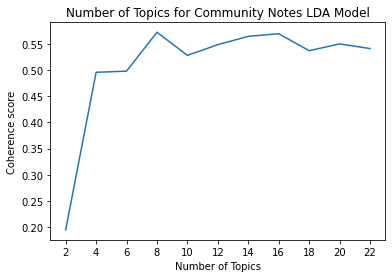

In [641]:
# Show graph
limit=24; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Number of Topics")
plt.ylabel("Coherence score")
plt.xticks(x)
# plt.legend("coherence_values", loc='best')
plt.title("Number of Topics for Community Notes LDA Model")
plt.show()

In [644]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.1946
Num Topics = 4  has Coherence Value of 0.4955
Num Topics = 6  has Coherence Value of 0.4977
Num Topics = 8  has Coherence Value of 0.5719
Num Topics = 10  has Coherence Value of 0.5277
Num Topics = 12  has Coherence Value of 0.5482
Num Topics = 14  has Coherence Value of 0.5641
Num Topics = 16  has Coherence Value of 0.5691
Num Topics = 18  has Coherence Value of 0.5367
Num Topics = 20  has Coherence Value of 0.5496
Num Topics = 22  has Coherence Value of 0.5409


In [646]:
# Select the model and print the topics
# Train our lda model using gensim.models.LdaMulticore and save it to ‘lda_model’
optimal_model = model_list[3]

model_topics = optimal_model.show_topics(num_topics=8, formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.019*"support" + 0.018*"hous" + 0.017*"school" + 0.016*"republican" + '
  '0.016*"abort" + 0.014*"court" + 0.014*"democrat" + 0.013*"senat" + '
  '0.013*"polici" + 0.013*"rule"'),
 (1,
  '0.025*"year" + 0.013*"price" + 0.011*"increas" + 0.011*"plan" + '
  '0.011*"number" + 0.010*"high" + 0.010*"inflat" + 0.009*"compani" + '
  '0.009*"busi" + 0.009*"fund"'),
 (2,
  '0.020*"world" + 0.014*"ukrain" + 0.013*"white" + 0.012*"leav" + '
  '0.011*"book" + 0.011*"call" + 0.010*"offici" + 0.009*"list" + '
  '0.009*"russia" + 0.009*"countri"'),
 (3,
  '0.021*"person" + 0.021*"musk" + 0.019*"time" + 0.018*"elon" + '
  '0.013*"origin" + 0.012*"peopl" + 0.010*"refer" + 0.010*"rittenhous" + '
  '0.009*"show" + 0.009*"follow"'),
 (4,
  '0.019*"offic" + 0.018*"polic" + 0.016*"releas" + 0.016*"shoot" + '
  '0.015*"capitol" + 0.015*"charg" + 0.014*"medic" + 0.014*"caus" + '
  '0.013*"death" + 0.013*"die"'),
 (5,
  '0.066*"trump" + 0.052*"biden" + 0.050*"elect" + 0.031*"state" + '
  '0.028*"polit

In [651]:
def format_topics_sentences(ldamodel=lda_model, corpus=bow_corpus, texts=processed_tweets):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=bow_corpus, texts=processed_tweets)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,4.0,0.1966,"offic, polic, releas, shoot, capitol, charg, m...","[forb, good, rundown, investig, washington, fu..."
1,1,3.0,0.1619,"person, musk, time, elon, origin, peopl, refer...","[express, person, straightforward, manner]"
2,2,1.0,0.3381,"year, price, increas, plan, number, high, infl...","[tesla, purchas, elig, feder, credit, exceed, ..."
3,3,4.0,0.2212,"offic, polic, releas, shoot, capitol, charg, m...","[riot, encourag, sit, presid, say, follow, sto..."
4,4,0.0,0.1582,"support, hous, school, republican, abort, cour...","[committe, numer, court, constitut, lose, amer..."
5,5,4.0,0.2266,"offic, polic, releas, shoot, capitol, charg, m...","[clinton, repeat, say, extremist, violenc, rig..."
6,6,2.0,0.1627,"world, ukrain, white, leav, book, call, offici...","[person, presum, report, matt, taibbi, releas,..."
7,7,7.0,0.1720,"predict, earthquak, claim, scientif, usg, plac...","[rocket, space, launch, artemi, current, crew,..."
8,8,3.0,0.1868,"person, musk, time, elon, origin, peopl, refer...","[refer, januari, hear, happen, right, hear, cu..."
9,9,3.0,0.1696,"person, musk, time, elon, origin, peopl, refer...","[focus, item, main, point, intent, mean, defle..."


In [654]:
df_dominant_topic['Topic_Perc_Contrib'].max()

0.633

In [652]:
# Find the most representative document for each topic

# Group top 5 sentences under each topic
sent_topics_sorteddf_mallet = pd.DataFrame()

sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=[0]).head(1)], 
                                            axis=0)

# Reset Index    
# sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Text"]

# Show
sent_topics_sorteddf_mallet.head()

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
25927,0.0,0.5244,"support, hous, school, republican, abort, cour...","[kelley, amend, hous, rule, clarifi, ambigu, p..."
47260,1.0,0.4474,"year, price, increas, plan, number, high, infl...","[know, number, employe, hire, increas, enforc,..."
9591,2.0,0.4184,"world, ukrain, white, leav, book, call, offici...","[poland, nato, missil, kill, like, fire, ukrai..."
7919,3.0,0.3600,"person, musk, time, elon, origin, peopl, refer...","[suspend, account, link, elonjet, account, ana..."
7594,4.0,0.4972,"offic, polic, releas, shoot, capitol, charg, m...","[offic, brian, sicknick, die, natur, caus, off..."


In [653]:
sent_topics_sorteddf_mallet

,Topic_Num,Topic_Perc_Contrib,Keywords,Text
25927,0.0,0.5244,"support, hous, school, republican, abort, cour...","[kelley, amend, hous, rule, clarifi, ambigu, p..."
47260,1.0,0.4474,"year, price, increas, plan, number, high, infl...","[know, number, employe, hire, increas, enforc,..."
9591,2.0,0.4184,"world, ukrain, white, leav, book, call, offici...","[poland, nato, missil, kill, like, fire, ukrai..."
7919,3.0,0.3600,"person, musk, time, elon, origin, peopl, refer...","[suspend, account, link, elonjet, account, ana..."
7594,4.0,0.4972,"offic, polic, releas, shoot, capitol, charg, m...","[offic, brian, sicknick, die, natur, caus, off..."
2051,5.0,0.4767,"trump, biden, elect, state, polit, presid, vot...","[time, kati, hobb, project, winner, arizona, g..."
36970,6.0,0.6330,"covid, vaccin, peopl, coronavirus, health, reu...","[research, manpow, go, covid, vaccin, step, re..."
28897,7.0,0.5709,"predict, earthquak, claim, scientif, usg, plac...","[scientif, basi, earthquak, predict, chanc, ea..."


In [657]:
community_notes = [tweets['cn_summary'][25927], tweets['cn_summary'][47260], 
                   tweets['cn_summary'][9591], tweets['cn_summary'][7919], 
                   tweets['cn_summary'][7594], tweets['cn_summary'][2051], 
                   tweets['cn_summary'][36970],tweets['cn_summary'][28897]]

tweet_id = [tweets['cn_tweetId'][25927], tweets['cn_tweetId'][47260], 
                   tweets['cn_tweetId'][9591], tweets['cn_tweetId'][7919], 
                   tweets['cn_tweetId'][7594], tweets['cn_tweetId'][2051], 
                   tweets['cn_tweetId'][36970],tweets['cn_tweetId'][28897]]

In [658]:
sent_topics_sorteddf_mallet['community_notes'] = community_notes
sent_topics_sorteddf_mallet['tweet_id'] = tweet_id

In [660]:
sent_topics_sorteddf_mallet.to_csv('sent_topics_sorteddf_mallet.csv', index=False)

In [661]:
sent_topics_sorteddf_mallet

,Topic_Num,Topic_Perc_Contrib,Keywords,Text,community_notes,tweet_id
25927,0.0,0.5244,"support, hous, school, republican, abort, cour...","[kelley, amend, hous, rule, clarifi, ambigu, p...",Rep. Ann Kelley amended House Rules to clarify...,1614282674863996929
47260,1.0,0.4474,"year, price, increas, plan, number, high, infl...","[know, number, employe, hire, increas, enforc,...",There is no known number of employees the IRS ...,1612796053308280832
9591,2.0,0.4184,"world, ukrain, white, leav, book, call, offici...","[poland, nato, missil, kill, like, fire, ukrai...","&quot;Poland, NATO say missile that killed two...",1595000161922686976
7919,3.0,0.3600,"person, musk, time, elon, origin, peopl, refer...","[suspend, account, link, elonjet, account, ana...",The suspended accounts linked to ElonJet socia...,1603788344470556674
7594,4.0,0.4972,"offic, polic, releas, shoot, capitol, charg, m...","[offic, brian, sicknick, die, natur, caus, off...",&quot;Officer Brian Sicknick died of natural c...,1588175841414246400
2051,5.0,0.4767,"trump, biden, elect, state, polit, presid, vot...","[time, kati, hobb, project, winner, arizona, g...","At the time of this tweet, Katie Hobbs has bee...",1592358184207151106
36970,6.0,0.6330,"covid, vaccin, peopl, coronavirus, health, reu...","[research, manpow, go, covid, vaccin, step, re...",More research &amp; manpower has gone into the...,1584184804308049923
28897,7.0,0.5709,"predict, earthquak, claim, scientif, usg, plac...","[scientif, basi, earthquak, predict, chanc, ea...",There is no scientific basis for earthquake pr...,1602041036787929088


In [693]:
for_latex = sent_topics_sorteddf_mallet[['Topic_Num', 'Topic_Perc_Contrib', 'community_notes']]
for_latex

,Topic_Num,Topic_Perc_Contrib,community_notes
25927,0.0,0.5244,Rep. Ann Kelley amended House Rules to clarify...
47260,1.0,0.4474,There is no known number of employees the IRS ...
9591,2.0,0.4184,"&quot;Poland, NATO say missile that killed two..."
7919,3.0,0.3600,The suspended accounts linked to ElonJet socia...
7594,4.0,0.4972,&quot;Officer Brian Sicknick died of natural c...
2051,5.0,0.4767,"At the time of this tweet, Katie Hobbs has bee..."
36970,6.0,0.6330,More research &amp; manpower has gone into the...
28897,7.0,0.5709,There is no scientific basis for earthquake pr...


In [701]:
for_latex['community_notes'][7594]

'Rep. Ann Kelley amended House Rules to clarify an ambiguous, poorly-worded dress code. The dress code for women now mirrors the dress code for men. All members of the Missouri House must wear “business attire” with a jacket. Arms and skin are not part of the dress code.     https://house.mo.gov/billtracking/bills231/rules/rules.pdf    https://house.mo.gov/billtracking/bills231/amendpdf/0785H02.04H.pdf    https://www.stltoday.com/news/local/govt-and-politics/dress-code-for-women-legislators-debated-in-missouri-house/article_a1dcfd3e-abf5-5722-acd1-11275dae9ede.html'

In [712]:
url_pattern = re.compile(r'https?://\S+')

# Remove URLs from the text
text_without_urls = url_pattern.sub('', for_latex['community_notes'][28897])
text = text_without_urls.replace('&quot;', '"')
text = text.replace('&amp;', '&')

# Print the updated text
print(text)

There is no scientific basis for earthquake prediction. There is always a chance for earthquakes in areas with active faults, but specific predictions perform no better than random when tested.    More from scientists:              User's history of pseudoscience claims:   


In [695]:
for_latex

,Topic_Num,Topic_Perc_Contrib,community_notes
25927,0.0,0.5244,Rep. Ann Kelley amended House Rules to clarify...
47260,1.0,0.4474,There is no known number of employees the IRS ...
9591,2.0,0.4184,"&quot;Poland, NATO say missile that killed two..."
7919,3.0,0.3600,The suspended accounts linked to ElonJet socia...
7594,4.0,0.4972,&quot;Officer Brian Sicknick died of natural c...
2051,5.0,0.4767,"At the time of this tweet, Katie Hobbs has bee..."
36970,6.0,0.6330,More research &amp; manpower has gone into the...
28897,7.0,0.5709,There is no scientific basis for earthquake pr...


In [689]:
print(for_latex.to_latex(index=False))

\begin{tabular}{rrl}
\toprule
 Topic\_Num &  Topic\_Perc\_Contrib &                                    community\_notes \\
\midrule
       0.0 &              0.5244 & Rep. Ann Kelley amended House Rules to clarify ... \\
       1.0 &              0.4474 & There is no known number of employees the IRS w... \\
       2.0 &              0.4184 & \&quot;Poland, NATO say missile that killed two ... \\
       3.0 &              0.3600 & The suspended accounts linked to ElonJet social... \\
       4.0 &              0.4972 & \&quot;Officer Brian Sicknick died of natural ca... \\
       5.0 &              0.4767 & At the time of this tweet, Katie Hobbs has been... \\
       6.0 &              0.6330 & More research \&amp; manpower has gone into the ... \\
       7.0 &              0.5709 & There is no scientific basis for earthquake pre... \\
\bottomrule
\end{tabular}



# Graphs

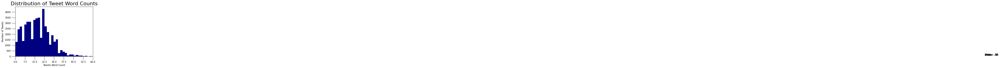

In [683]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.hist(doc_lens, bins = 100, color='navy')
plt.text(750, 100, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(750,  90, "Median : " + str(round(np.median(doc_lens))))
plt.text(750,  80, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(750,  70, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(750,  60, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 60), ylabel='Number of Tweets', xlabel='Tweets Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,60,9))
plt.title('Distribution of Tweet Word Counts', fontdict=dict(size=22))
plt.show()

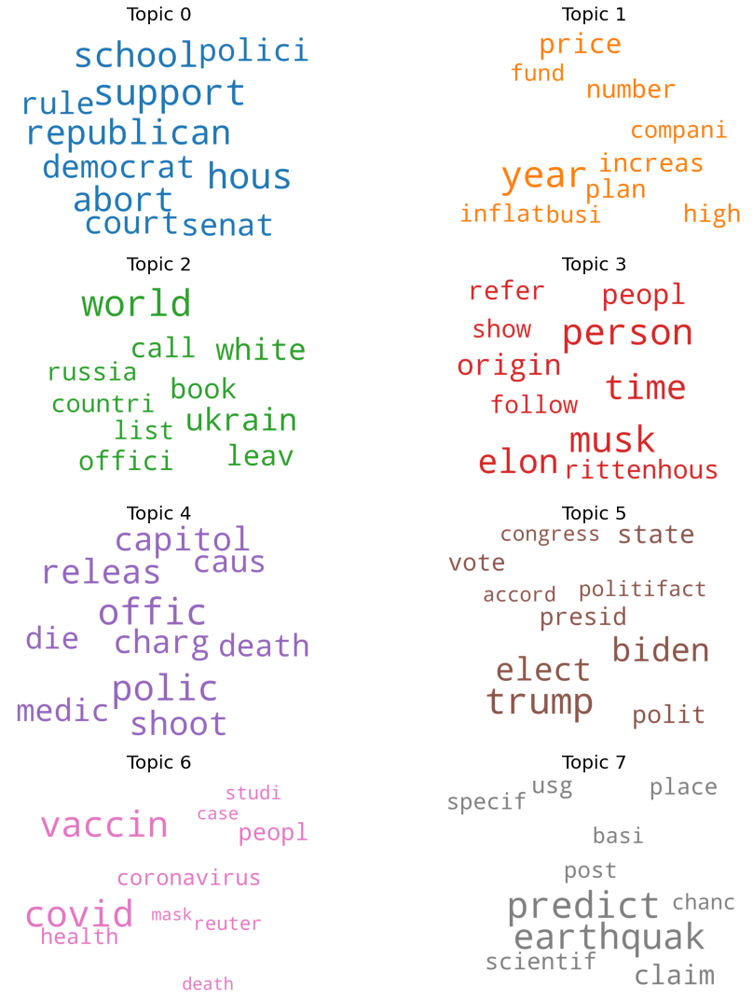

In [672]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

fig, axes = plt.subplots(4, 2, figsize=(15,15), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(model_topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=20))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

/var/folders/yq/hk50b_d51pq3f36jlcgmf_fw0000gn/T/ipykernel_40151/618307324.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')


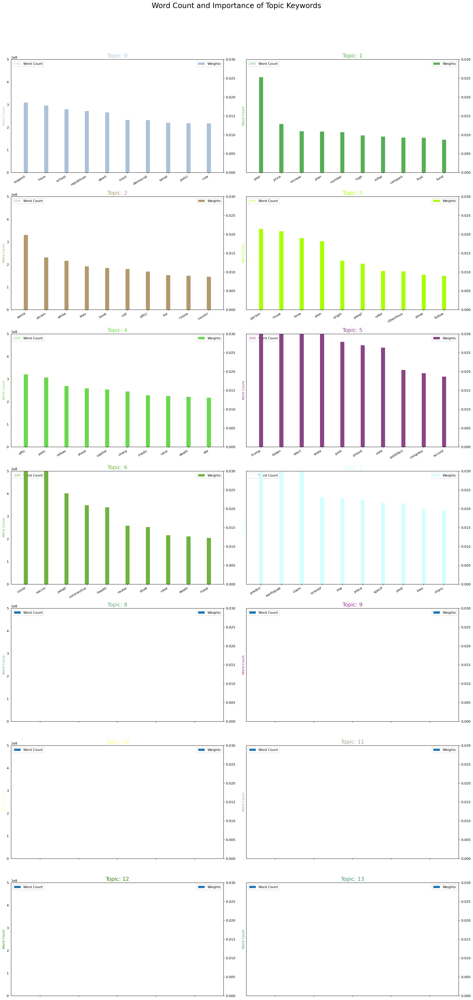

In [673]:
from collections import Counter
data_flat = [w for w_list in processed_tweets for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in model_topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(7, 2, figsize=(20,40), sharey=True, dpi=160)
cols = [color for name, color in mcolors.XKCD_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.030); ax.set_ylim(0, 500000000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()


In [674]:
# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in model_topics 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]


In [675]:
# create a dictionary with topic number as key and corresponding words as value
topic_dict = {}
for topic_num, word in topic_top3words:
    if topic_num not in topic_dict:
        topic_dict[topic_num] = []
    if len(topic_dict[topic_num]) < 3:
        topic_dict[topic_num].append(word)

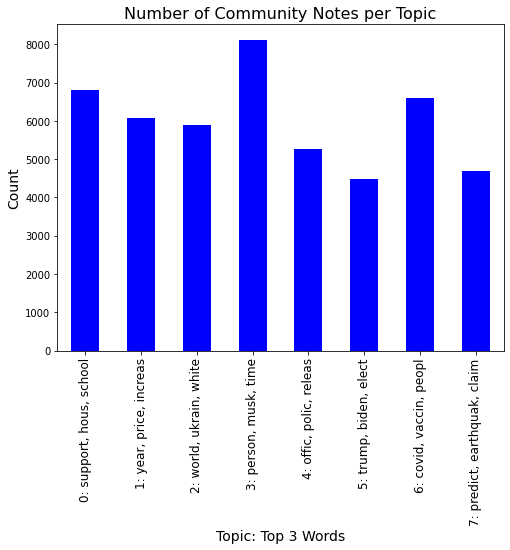

In [715]:
import pandas as pd
import matplotlib.pyplot as plt

# Count the number of occurrences of each unique value in the 'topic' column
counts = df_dominant_topic['Dominant_Topic'].value_counts().sort_index()

# Create a bar plot of the counts
ax = counts.plot(kind='bar', figsize=(8, 6), color='blue')
# create list of x-axis labels

x_labels = [str(i) + ": " + ', '.join(topic_dict[i]) for i in range(len(topic_dict))]

# Set the axis labels and title
plt.xticks(range(len(topic_dict)), x_labels, rotation=90, fontsize=12)
ax.set_ylabel('Count',fontsize=14)
ax.set_xlabel('Topic: Top 3 Words',fontsize=14)
ax.set_title('Number of Community Notes per Topic', fontsize=16)


# Show the plot
plt.show()
